# 1 - Business understanding

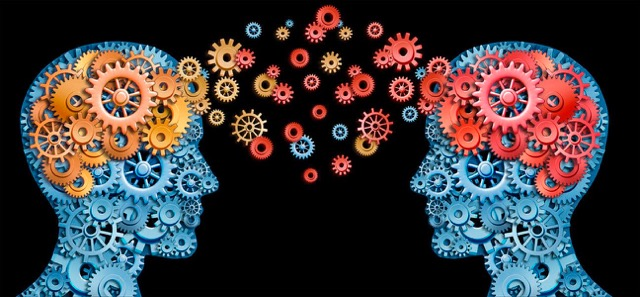

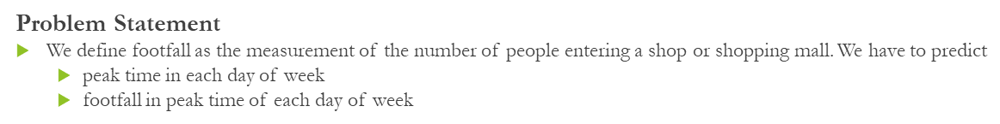

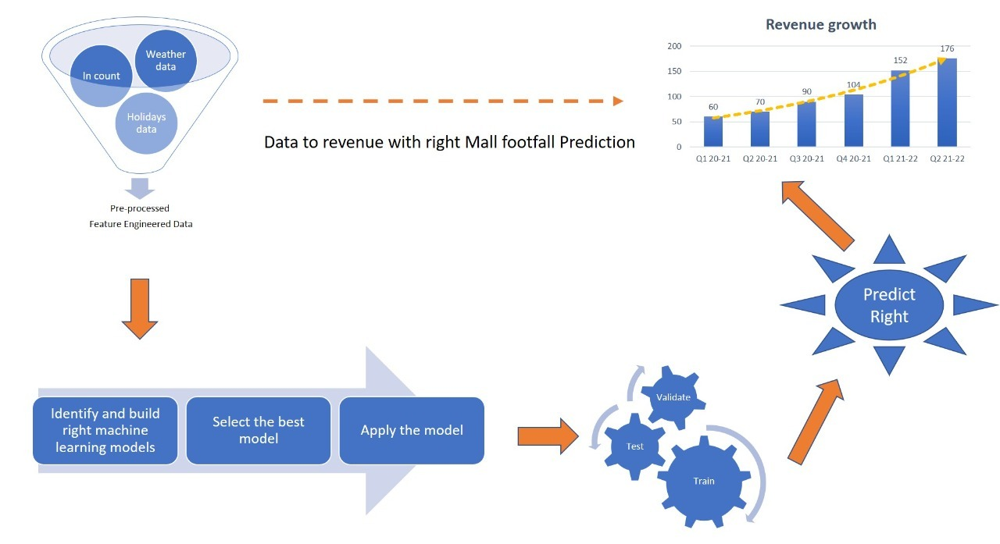

# 2 - High level architecture

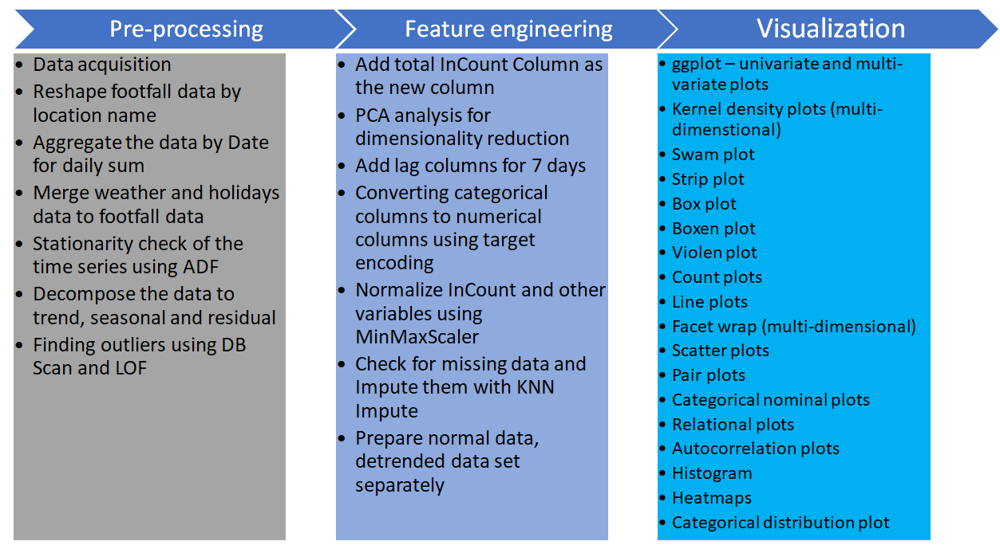

# 3 - High level design - classes

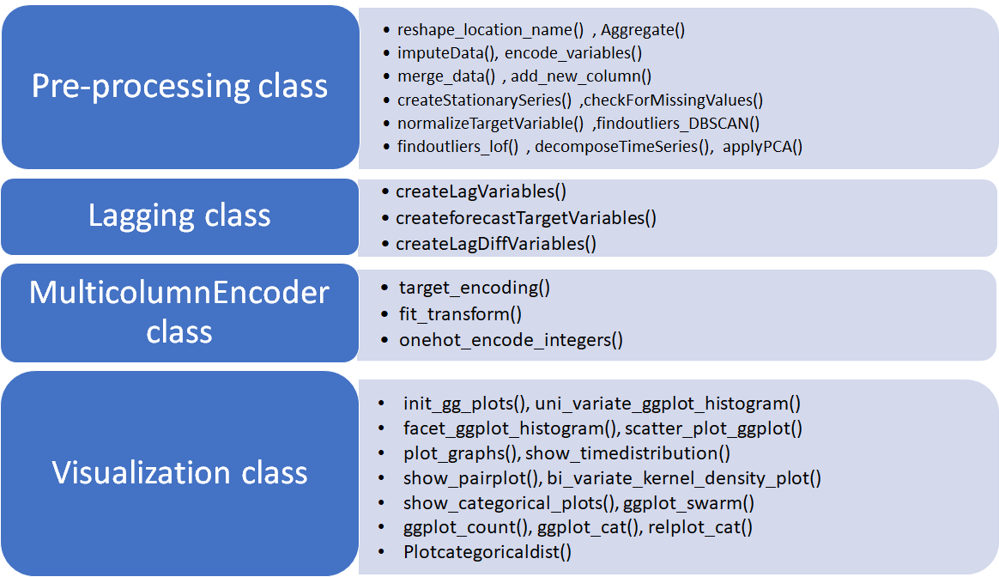

# 4 - Pre-processing & Feature Engineering

## 4.1 Data Acquisition

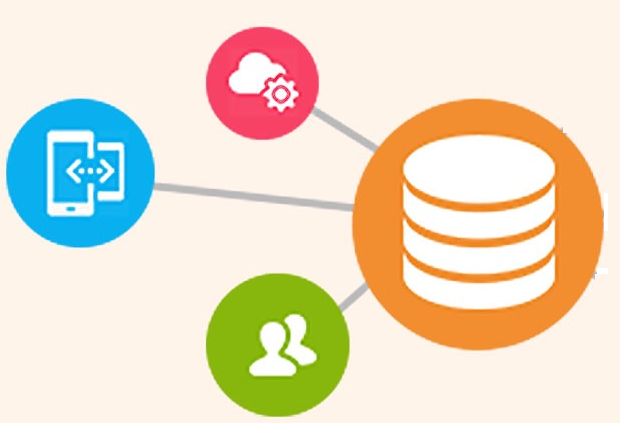

In [1]:
!pip install --upgrade category_encoders
!pip install pmdarima
!pip install statsmodels --upgrade

     |████████████████████████████████| 81kB 2.2MB/s 
     |████████████████████████████████| 1.5MB 2.3MB/s 
     |████████████████████████████████| 8.7MB 10.8MB/s 
     |████████████████████████████████| 2.1MB 42.2MB/s 
     |████████████████████████████████| 808kB 40.1MB/s 
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2
  Found existing installation: Cython 0.29.21
    Uninstalling Cython-0.29.21:
      Successfully uninstalled Cython-0.29.21
  Found existing installation: setuptools 50.3.2
    Uninstalling setuptools-50.3.2:
      Successfully uninstalled setuptools-50.3.2


     |████████████████████████████████| 9.5MB 2.7MB/s 
ERROR: pmdarima 1.7.1 has requirement statsmodels<0.12,>=0.11, but you'll have statsmodels 0.12.1 which is incompatible.
  Found existing installation: statsmodels 0.11.1
    Uninstalling statsmodels-0.11.1:
      Successfully uninstalled statsmodels-0.11.1


In [2]:
!pip install plotnine
!pip install dython
!pip install RegscorePy
!pip install catboost
!pip install -U yellowbrick





     |████████████████████████████████| 66.2MB 69kB/s 
     |████████████████████████████████| 276kB 2.2MB/s 
  Found existing installation: yellowbrick 0.9.1
    Uninstalling yellowbrick-0.9.1:
      Successfully uninstalled yellowbrick-0.9.1


In [3]:
!pip install http://h2o-release.s3.amazonaws.com/h2o/rel-zermelo/1/Python/h2o-3.32.0.1-py2.py3-none-any.whl

     |████████████████████████████████| 164.6MB 1.2MB/s 


In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from datetime import datetime
import calendar
from sklearn.preprocessing import MinMaxScaler
from category_encoders.target_encoder import TargetEncoder
import missingno as msno
from sklearn.impute import KNNImputer
import warnings
warnings.filterwarnings("ignore")
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.neighbors import LocalOutlierFactor
from plotnine import *
from scipy import signal, fftpack
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse
from statsmodels.tsa.seasonal import STL
from dython import nominal
from statsmodels.tsa.stattools import adfuller, acf

from sklearn.decomposition import PCA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# plotly 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout
import plotly
import plotly.graph_objs as go
from tabulate import tabulate

# yellowbrick model visualizations
from yellowbrick.features import ParallelCoordinates
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

# regression models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import LassoLars
from sklearn.linear_model import PassiveAggressiveRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import ExtraTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.base import clone
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold, cross_val_predict, cross_val_score,cross_validate
from sklearn.feature_selection import RFECV
from sklearn.metrics import make_scorer
from scipy.stats import loguniform
from RegscorePy import *
from math import log

# neural network model
from sklearn.neural_network import MLPRegressor
# LSTM models
from keras.models import Sequential
from keras.layers import Dense, Add, Concatenate, Reshape
from keras.layers import LSTM, ConvLSTM2D, Bidirectional
from keras.layers import Dropout, Average, RepeatVector, LeakyReLU, BatchNormalization
from keras import optimizers
from keras.optimizers.schedules import ExponentialDecay
from keras.callbacks import ModelCheckpoint
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import LearningRateScheduler
from keras.layers.merge import concatenate


from keras.engine import training
from keras.models import Model, Input

from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.callbacks import Callback
from keras.models import load_model
from keras.optimizers import Adam

# H2O models
import h2o
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators import H2ORandomForestEstimator
from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator
from sklearn.pipeline import Pipeline
from h2o.cross_validation import H2OKFold
from h2o.model.regression import h2o_r2_score
from h2o.grid.grid_search import H2OGridSearch
from h2o.automl import H2OAutoML
h2o.init()

# Fb prophet models
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly

# ARIMA model
#from statsmodels.tsa import arima_model
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm
from pmdarima.pipeline import Pipeline
from pmdarima.preprocessing import BoxCoxEndogTransformer

import glob
import os
from keras import backend as K


Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.9" 2020-10-20; OpenJDK Runtime Environment (build 11.0.9+11-Ubuntu-0ubuntu1.18.04.1); OpenJDK 64-Bit Server VM (build 11.0.9+11-Ubuntu-0ubuntu1.18.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpbolw_wvm
  JVM stdout: /tmp/tmpbolw_wvm/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpbolw_wvm/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.0.1
H2O_cluster_version_age:,"28 days, 20 hours and 55 minutes"
H2O_cluster_name:,H2O_from_python_unknownUser_tpsi0i
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.180 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"accepting new members, healthy"


In [5]:
mainpath='https://raw.githubusercontent.com/syeelarthi/Footfall-prediction-code/master/'
df1 = pd.read_csv(mainpath+'footfall_Part1.csv')
df2 = pd.read_csv(mainpath+'footfall_Part2.csv')
df3 = pd.read_csv(mainpath+'footfall_Part3.csv')
df_foot_fall =pd.concat([df1,df2,df3])
df_weather_data= pd.read_csv(mainpath+'overall_weather.csv')
df_easter_sunday_holiday_data= pd.read_csv(mainpath+'Easter-Sundays.csv')
df_university_long_holidays_data= pd.read_csv(mainpath+'uni_hols_long.csv')
df_UK_bank_holidays_data= pd.read_csv(mainpath+'UKbankholidays.csv')
df_school_long_holidays_data= pd.read_csv(mainpath+'school_hols_long.csv')

## 4.2 Data preparation

In [6]:

df_foot_fall.shape


(554360, 15)

In [7]:
df_easter_sunday_holiday_data.shape

(18, 2)

In [8]:
df_foot_fall.info

<bound method DataFrame.info of               Date  InCount  BRCWeek  ...  Week_yr          Hour_yr week_no
0       01-01-2009      268       53  ...  00-2009  00, 01-Jan-2009       1
1       01-01-2009      366       53  ...  00-2009  00, 01-Jan-2009       1
2       01-01-2009      273       53  ...  00-2009  00, 01-Jan-2009       1
3       01-01-2009      219       53  ...  00-2009  00, 01-Jan-2009       1
4       01-01-2009      132       53  ...  00-2009  00, 01-Jan-2009       1
...            ...      ...      ...  ...      ...              ...     ...
154357  31-12-2016      205       52  ...  52-2016  00, 31-Dec-2016      52
154358  31-12-2016      405       52  ...  52-2016  00, 31-Dec-2016      52
154359  31-12-2016      353       52  ...  52-2016  00, 31-Dec-2016      52
154360  31-12-2016      348       52  ...  52-2016  00, 31-Dec-2016      52
154361  31-12-2016      316       52  ...  52-2016  00, 31-Dec-2016      52

[554360 rows x 15 columns]>

In [9]:
df_foot_fall.head()

,Date,InCount,BRCWeek,LocationName,Hour,Weekday,NewDate,Month,Year,Day,Day_yr,Month_yr,Week_yr,Hour_yr,week_no
0,01-01-2009,268,53,Briggate,0,Thursday,01-Jan-09,1,2009,1,Thursday/01-Jan-2009,Jan-09,00-2009,"00, 01-Jan-2009",1
1,01-01-2009,366,53,Briggate,1,Thursday,01-Jan-09,1,2009,1,Thursday/01-Jan-2009,Jan-09,00-2009,"00, 01-Jan-2009",1
2,01-01-2009,273,53,Briggate,2,Thursday,01-Jan-09,1,2009,1,Thursday/01-Jan-2009,Jan-09,00-2009,"00, 01-Jan-2009",1
3,01-01-2009,219,53,Briggate,3,Thursday,01-Jan-09,1,2009,1,Thursday/01-Jan-2009,Jan-09,00-2009,"00, 01-Jan-2009",1
4,01-01-2009,132,53,Briggate,4,Thursday,01-Jan-09,1,2009,1,Thursday/01-Jan-2009,Jan-09,00-2009,"00, 01-Jan-2009",1


In [10]:
df_foot_fall.shape

(554360, 15)

### 4.2.1 Global parameters

In [11]:
global_parameters = {
    "encoded_variables" : ['Weekday','Month','Day','Year', 'Week_no', 'abnormal_rain','high_temp','low_temp','high_wind','EasterSundayHoliday',
                'University_holidays','School_holidays','UKBankHoliday'],
    "input_cols_regression" : ['Month','Weekday','Day','Week_no','mean_temp','rain','wind_speed','abnormal_rain','high_temp','low_temp','high_wind','EasterSundayHoliday',
                  'University_holidays','School_holidays','UKBankHoliday'],
    "input_cols_regression_weekly" : ['Year','Week_no','mean_temp','rain','wind_speed'],
    "input_cols_GAN" :  ['Month','Weekday','Day','Week_no','mean_temp','rain','wind_speed','InCountTotal'],

    "input_cols_reg_with_extra_features" : ['Month','Weekday','Day','Week_no','mean_temp','rain','wind_speed','abnormal_rain','high_temp','low_temp','high_wind','EasterSundayHoliday',
                  'University_holidays','School_holidays','UKBankHoliday','Day sin','Month sin','Month cos','rolling_mean_incount', 'seasonal_incount','trend_incount'],
    "input_cols_neural_networks" : ['Month','Weekday','Day','Week_no','mean_temp','rain','wind_speed','abnormal_rain','high_temp','low_temp','high_wind','EasterSundayHoliday',
                  'University_holidays','School_holidays','UKBankHoliday','rolling_mean_incount','seasonal_incount','trend_incount','InCountTotal'],
    "input_cols_neural_networks_extra_features" : ['Month','Weekday','Day','Week_no','mean_temp','rain','wind_speed',
                  'University_holidays','School_holidays','UKBankHoliday','Day sin','Month sin','Month cos','rolling_mean_incount', 'seasonal_incount','trend_incount','InCountTotal'],
    #"deterministic_features" : ['Month','Weekday','Day','Week_no','EasterSundayHoliday',
     #             'University_holidays','School_holidays','UKBankHoliday','Day sin','Month sin','Month cos'],
    "deterministic_features" : ['Month','Weekday','Day','Week_no','EasterSundayHoliday',
                  'University_holidays','School_holidays','UKBankHoliday'],
    "input_cols_normalization" :['mean_temp','rain','wind_speed','Day sin','Week sin','Week cos','Month sin','Month cos','Year sin','Year cos'],
    "target_col_h2o":['InCountTotal_forecast1'],
    "data_set_days": 365*4, #4 years total data
    "test_data_set_days":365, # 1 year test data
    "test_data_set_weeks" : 30, # 30 weeks for test data
    "data_set_hours" : 24*365*3, # 24hours , 365 days, 3 years
    "n_timesteps" : 7,
    "n_forecast_steps" : 1,
    "train_split" : 0.8,
    "validation_split":0.1,
    "test_split":0.1,
    "lstm_training_needed" : False
            
}

### 4.2.2 MultiColumnEncoder Class

In [12]:
class MultiColumnEncoder:
    def __init__(self,Categoricalcolumns = None,includedcolumns=None):
        self.columns = Categoricalcolumns # array of column names to encode
        self.included_cols = includedcolumns

    def fit(self,X,y=None):
        return self # not relevant here

    def transform_LabelEncoder(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in X.
        '''
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def onehot_encode_integers(self, df):
        df = df.copy()
        df_encoded = pd.get_dummies(df, columns = self.included_cols)
        return df_encoded
 
    def fit_transform(self,X,y=None,encoding_type = 'target_encoding'):
      if encoding_type == 'onehot_encoding':
        return self.onehot_encode_integers(X) 
      elif encoding_type == 'target_encoding':
        return self.target_encoding(X,y)

    def target_encoding(self,X, target_column):
        return TargetEncoder(cols=self.included_cols).fit_transform(X,X[target_column])
        
    

### 4.2.3 Lagging Class

In [13]:
class Lagging:  
  def __init__(self, location_name_list=None, n_timesteps=7, n_forecast_steps=1):
      self.n_timesteps = n_timesteps
      self.location_name_list = location_name_list # array of locations
      self.n_forecast_steps = n_forecast_steps

  def createforecastTargetVariables(self, df):
    # copy the InCount to other forecast columns
    for forecast_step in range(1, self.n_forecast_steps+1): 
      df['InCountTotal'+'_forecast'+str(forecast_step)] = df['InCountTotal']
          
    #update multistep output variables
    for i in range(0, df.shape[0]-self.n_forecast_steps):
      for forecast_step in range(1, self.n_forecast_steps+1): 
        df['InCountTotal'+'_forecast'+str(forecast_step)][i] = df['InCountTotal'][i+forecast_step]
      
    #remove the last nforecast rows as these do not have proper values after creating the forecast variables
    df.drop(df.tail(self.n_forecast_steps).index,inplace=True)
    return df

  def createLagVariables(self,df,location_wise_data = True): #Create lag variables of size=n_timesteps
      if location_wise_data == True:#location wise data
        for location in self.location_name_list:
            location = 'InCount'+location
            for lag in range(0, self.n_timesteps):
                df[location+'_lag'+str(lag+1)] = df[location].shift(periods=lag)
      else:# totalincount only
        for lag in range(0, self.n_timesteps):
            df['InCountTotal'+'_lag'+str(lag+1)] = df['InCountTotal'].shift(periods=lag)
        
      df.dropna(inplace = True)
      return df

  def createLagDiffVariables(self,df,location_wise_data = True): #Create lag variables of size=n_timesteps
    if location_wise_data == True:#location wise data
      for location in self.location_name_list:
        location = 'InCount'+location
        for lag in range(1, self.n_timesteps+1):
          df[location+'_lag'+str(lag)] = df[location].diff(periods=lag)
    else:# totalincount only
      for lag in range(1, self.n_timesteps+1):
          df['InCountTotal'+'_lag'+str(lag)] = df['InCountTotal'].diff(periods=lag)
    
    df.dropna(inplace = True)
    return df


### 4.2.4 Pre_Processing Class

In [14]:
class pre_processing:
  def __init__(self,data_frame):
        self.data_frame = data_frame.copy() # which data_frame to pre-process
        self.location_name_list = []
        self.location_name_col_list=[]
        self.scaler_target = MinMaxScaler(feature_range = (0, 1))
        self.scaler_input = MinMaxScaler(feature_range = (0,1))
        self.scaler_target_each_location = MinMaxScaler(feature_range = (0,1))
        self.scaler_prophet = MinMaxScaler(feature_range = (0,1))
  def cleanup_data(self, col_name='Date'):
     # there is a white space in one of the date values in Easter holidays list. We need to remove that
     if( col_name in self.data_frame.columns):
        self.data_frame[col_name] = self.data_frame[col_name].str.replace(' ', '')
     return self.data_frame 
  def aggregate(self,group_by_cols, retain_list=None): 
      '''
      aggregate the column values based on conditions
      ''' 
      retain_list = {}
      # add all the location name columns to retain list
      for location_name in self.location_name_list:
        key = 'InCount'+location_name
        retain_list[key] = 'sum'
      # now aggregate based on Date
      self.data_frame = self.data_frame.groupby(group_by_cols).agg(retain_list).reset_index()
      return self.data_frame
  def createWeeklyData(self, data_frame):
    group_by_cols = ['Year','Week_no']
    retain_list = { 'InCountTotal':'sum', 'Month':'first', 'mean_temp':'mean', 'rain':'mean','wind_speed':'mean'}
    df = data_frame.groupby(group_by_cols).agg(retain_list).reset_index()
    return df

  def reshape_location_name(self, group_by_cols, target_col='InCount'):# Review this
      
      '''data_temp_df = pd.DataFrame(data=self.data_frame[['Date','Weekday','Month']])
      data_temp_df.drop_duplicates('Date', inplace=True)
      
      self.location_name_list = self.data_frame["LocationName"].unique()

      self.data_frame = self.data_frame.pivot_table(index=group_by_cols, columns='LocationName',values=[target_col]).reset_index()
      self.data_frame.columns = [''.join(col) for col in self.data_frame.columns]'''

      self.data_frame['Date'] = pd.to_datetime(self.data_frame['Date']).dt.strftime('%d-%b-%Y')
      self.location_name_list = self.data_frame["LocationName"].unique()

      self.data_frame = self.data_frame.pivot_table(index=group_by_cols, columns='LocationName',values=[target_col]).reset_index()
      self.data_frame.columns = [''.join(col) for col in self.data_frame.columns]

      #return self.data_frame.merge(data_temp_df, on='Date', how='inner')

  def encode_variables(self,included_cols, target_variable = 'InCountTotal', encoding_type = 'target_encoding'):
      '''
      categorical/target encoding of the column values
      '''
      self.data_frame = MultiColumnEncoder(includedcolumns = included_cols).fit_transform(self.data_frame,target_variable,encoding_type = 'target_encoding')
      return self.data_frame
  def imputeData(self): 
      # fill missing values with mean column values as only missing column i see is InCountAlbionStSouth
      #print('impute data')
      self.data_frame.fillna(self.data_frame.mean(), inplace=True)
      return self.data_frame
  def pre_process(self,data_frame_type='Foot_Fall'):
      '''
      for different data frame types, do the different pre-processibg
      ''' 
      
      if(data_frame_type == 'EasterSunday'):
          # cleanup the date columns
          self.data_frame  = self.cleanup_data(col_name='Date')
      
      return self.data_frame
       
  
  def merge_data(self, data_to_merge, col_by ='Date'):
      data_to_merge['Date'] = pd.to_datetime(data_to_merge['Date']).dt.strftime('%d-%b-%Y')
      self.data_frame = self.data_frame.merge(data_to_merge, how='inner', left_on=col_by, right_on=col_by)
      return self.data_frame
  def add_new_column(self, data_to_add, new_col_name, source_date_format = '%d-%b-%Y', destination_date_format = '%m-%d-%Y' ):
      self.data_frame['Tempcolumn'] = pd.to_datetime(self.data_frame['Date'], format = source_date_format).dt.strftime('%d/%m/%Y')

      temp_data = data_to_add.copy()

      temp_data['Tempcolumn'] = pd.to_datetime(temp_data['Date'],format = destination_date_format).dt.strftime('%d/%m/%Y')

      self.data_frame[new_col_name] = (self.data_frame.set_index(['Tempcolumn']).index.isin(temp_data.set_index(['Tempcolumn']).index)).astype(int)
      temp_data.drop(['Tempcolumn'],axis=1)

      self.data_frame.drop(['Tempcolumn'],axis=1, inplace=True)
      
      return self.data_frame
  def createExtraDateColumns(self):
   
    date_time = pd.to_datetime(self.data_frame["Date"], format='%d-%b-%Y')
    timestamp_s = date_time.map(datetime.timestamp)

    dt_object = datetime.fromtimestamp(timestamp_s[0])
    print("dt_object:", dt_object)
    print("type(dt_object): ", type(dt_object))


    day = 24*60*60
    week = 7*day
    month = 31*day
    year = (365.2425)*day

    self.data_frame['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
    #self.data_frame['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
    self.data_frame['Week sin'] = np.sin(timestamp_s * (2 * np.pi / week))
    self.data_frame['Week cos'] = np.cos(timestamp_s * (2 * np.pi / week))
    self.data_frame['Month sin'] = np.sin(timestamp_s * (2 * np.pi / month))
    self.data_frame['Month cos'] = np.cos(timestamp_s * (2 * np.pi / month))
    self.data_frame['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
    self.data_frame['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

    

    return self.data_frame
  def createExtraFeatures(self, n_timesteps=7):
    # add seasonal and trend columns
    # Additive Decomposition
    result_add = seasonal_decompose(self.data_frame['InCountTotal'], model='additive',  freq=30)
    self.data_frame['seasonal_incount'] = result_add.seasonal
    self.data_frame['trend_incount'] = result_add.trend
    # rolling mean column
    self.data_frame['rolling_mean_incount'] = self.data_frame['InCountTotal'].shift(1).rolling(window=n_timesteps).mean()
    #expanding window
    self.data_frame['expanding_mean_incount'] = self.data_frame['InCountTotal'].shift(1).expanding(2).mean()
    return self.data_frame

  def createTimeSeries(self):
      self.data_frame["DateTime"] = pd.to_datetime(self.data_frame.Date.astype(str))
      self.data_frame = self.data_frame.set_index("DateTime")
      self.data_frame.drop(['Date'], inplace=True, axis=1)
      self.data_frame = self.data_frame.sort_index()

      self.data_frame['Month']=self.data_frame.index.month
      self.data_frame['Year']=self.data_frame.index.year
      self.data_frame['Day']= self.data_frame.index.day
      self.data_frame['Weekday']=self.data_frame.index.weekday
      self.data_frame['Week_no']=self.data_frame.index.week
      
      for i in range(len(self.data_frame)):
          self.data_frame['Weekday'].iloc[i]=calendar.day_name[self.data_frame['Weekday'].iloc[i]]

      return self.data_frame
      
  def createStationarySeries(self, col_name = 'InCountTotal', lag=1):
    # check for stationarity

    result = adfuller(self.data_frame[col_name].dropna())
    print("ADF test results for ",col_name )
    print('ADF Statistic: %f' % result[0])
    print('p-value: ', result[1])
    print('full result ', result)
    print("========================")

    for location in self.location_name_col_list:
      result = adfuller(self.data_frame[location].dropna())
      print("ADF test results for ",location )
      print('ADF Statistic: %f' % result[0])
      print('p-value: ', result[1])
      print('full result ', result)
      print("========================")

    #self.data_frame[col_name] = self.data_frame[col_name].diff(periods=lag)
    #self.data_frame.dropna(inplace = True)
    return self.data_frame

  def checkForMissingValues(self, location_name_list):
        for location in location_name_list:
            self.data_frame.loc[self.data_frame[self.data_frame['InCount'+location]==0].index,'InCount'+location] = np.NaN
        return self.data_frame
  
  def createLag_ForecastVariables(self,location_name_list=None, n_timesteps=7,n_forecast_steps = 1, location_wise_data = True):
      nLagClass = Lagging(location_name_list,n_timesteps, n_forecast_steps)
      self.data_frame = nLagClass.createLagVariables(self.data_frame,location_wise_data = location_wise_data)
      # create lag data for total mall incount
      #self.data_frame = nLagClass.createLagDiffVariables(self.data_frame, location_wise_data = location_wise_data)
      self.data_frame = nLagClass.createforecastTargetVariables(self.data_frame)
      
      return self.data_frame

  def addTotalIncountColumn(self):
    self.location_name_col_list=['InCount'+x for x in self.location_name_list]
    self.data_frame['InCountTotal'] = self.data_frame[self.location_name_col_list].sum(axis=1)
    self.data_frame['InCountTotal'] = self.data_frame['InCountTotal'].astype(int)
    return self.data_frame

  def normalizeTargetVariable(self):
    #print('normalization')
    self.data_frame[['InCountTotal']] = self.scaler_target.fit_transform(self.data_frame[['InCountTotal']])

    location_name_col_list=['InCount'+x for x in self.location_name_list]
    for location_col in location_name_col_list:
      self.data_frame[[location_col]] = self.scaler_target_each_location.fit_transform(self.data_frame[[location_col]])
    return self.data_frame

  
  def normalizeInputVariables(self, included_cols=None):
     #print('normalize input variables')
     self.data_frame[included_cols] = self.scaler_input.fit_transform(self.data_frame[included_cols])
     return self.data_frame

  def visualizeMissingValues(self):
       #print('missing values visualization')
       msno.bar(self.data_frame)
        
  #Imputation using KNN      
  def imputeDataWithKnn(self):
    X = self.data_frame[['InCountCommercialStBarratts', 'InCountCommercialStLush']]
    imputer = KNNImputer(n_neighbors=2)
    imputed_df = imputer.fit_transform(X)
    imputed_df = pd.DataFrame(imputed_df, columns=X.columns)
    #print(imputed_df)
    #print(self.data_frame['InCountCommercialStBarratts'])
    self.data_frame['InCountCommercialStBarratts'] = imputed_df.values
    return self.data_frame

  #imputation using IterativeImputer which works similar to MICE
  def imputeDataWithIterativeImputation(self):
    X = self.data_frame[['InCountCommercialStBarratts', 'InCountCommercialStLush']]
    imputer = IterativeImputer(max_iter=10, verbose=0)
    imputed_df = imputer.fit_transform(X)
    imputed_df = pd.DataFrame(imputed_df, columns=X.columns)
    #print(imputed_df)
    #print(self.data_frame['InCountCommercialStBarratts'])
    self.data_frame['InCountCommercialStBarratts'] = imputed_df.values
    return self.data_frame 


  def findoutliers_DBSCAN(self,columns,number_near):
      # This finction takes as input, the dataframe name, columns to be analysed for the outlier, nearesr neighbours to be considered as input
      # A new boolean column for outlier will be added with name Outlier_+column name and it will have values 1  If outlier and 0 otherwise
      # optimal eps is calculated based on distances
      nc=0
      fig, axs = plt.subplots(len(columns),figsize=(15,15))
      fig.tight_layout(pad=3.0)
      for col in columns:
          # finding the distances based on nearest neighbour to find optimal eps
          neigh = NearestNeighbors(n_neighbors=number_near)
          nbrs = neigh.fit(np.array(self.data_frame[col]).reshape(-1,1))
          distances, indices = nbrs.kneighbors(np.array(self.data_frame[col]).reshape(-1,1))
          distances = np.sort(distances, axis=0)
          distances = distances[:,1]
      
          # If plotted on a graph, a point with maximum curvature. , ie, a point with maximum slope gives the best eps
          maxslope=0
          neps=0
          diff=[] # A list to hold the differences in the distances
          for i in range (len(distances)-1):
              slope=( (distances[i]-distances[i+1])/(indices[i][0]-indices[i+1][0]))
              if (slope<1 and maxslope<slope):
                  maxslope=slope
                  neps=distances[i]
          db=DBSCAN(eps=neps, min_samples=number_near).fit(np.array(self.data_frame[col]).reshape(-1,1))
          labels=db.labels_
          self.data_frame['Outliers_'+col] = [1 if val ==-1 else 0 for val in labels]
          # Visualizing the Outliers marked   
          outlier=[]
          outlierindex=[]
          datapoint=[]
          dataindex=[]
          for j in range(len(labels)):
              if (labels[j]==-1):
                  outlier.append(self.data_frame[col][j])
                  outlierindex.append(indices[j][0])
              else:
                  datapoint.append(self.data_frame[col][j])
                  dataindex.append(indices[j][0])
          axs[nc].scatter(outlierindex,outlier,color='red')
          axs[nc].scatter(dataindex,datapoint,color='blue')
          axs[nc].set_title(col+" DBCSAN Outlers marked in Red")
          nc=nc+1
          n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
          n_noise_ = list(labels).count(-1)
          print(col+'Analysis')
          print('Optimal eps is ',neps)
          print('Estimated number of clusters: %d' % n_clusters_)
          print('Estimated number of noise points: %d' % n_noise_)
      plt.show
      return self.data_frame
  def findoutliers_lof(self,columns,number_near):
      # This finction takes as input, the dataframe name, columns to be analysed for the outlier, nearesr neighbours to be considered as input
      # A new boolean column for outlier will be added with name Outlier_+column name and it will have values 1  If outlier and 0 otherwise
  
      nc=0
      fig, axs = plt.subplots(len(columns),figsize=(15,15))
      fig.tight_layout(pad=3.0)
      for col in columns:
          clf = LocalOutlierFactor(n_neighbors=number_near)
          pred=clf.fit_predict(np.array(self.data_frame[col]).reshape(-1,1))
          #scores = clf.negative_outlier_factor_
          self.data_frame['Lof_Outlier'+col]=[1 if val ==-1 else 0 for val in pred]
    
          # Visualizing the Outliers marked   
          outlier=[]
          outlierindex=[]
          datapoint=[]
          dataindex=[]

          for j in range(len(self.data_frame['Lof_Outlier'+col])):
              if (self.data_frame['Lof_Outlier'+col][j]==1):
                  outlier.append(self.data_frame[col][j])
                  outlierindex.append(j+1)
              else:
                  datapoint.append(self.data_frame[col][j])
                  dataindex.append(j+1)

          axs[nc].scatter(dataindex,datapoint,color='blue')
          axs[nc].scatter(outlierindex,outlier,color='red')
          axs[nc].set_title(col+" LOF Outlers marked in Red")
          nc=nc+1
      return self.data_frame

  def detrend_time_series(self, target_col='InCountTotal'):# using signal.detrend()
    inCountData = self.data_frame[target_col]
    self.data_frame[target_col] = signal.detrend(self.data_frame[target_col])
    de_trended_Incount = self.data_frame[target_col]

    from matplotlib import pyplot as plt
    plt.figure(figsize=(16, 8))
    plt.plot(inCountData, label="normal InCount")
    plt.plot(de_trended_Incount, label="detrended InCount")
    plt.legend(loc='best')
    plt.show()
    return self.data_frame 

  def decomposeTimeSeries(self):

    # Multiplicative Decomposition 
    result_mul = seasonal_decompose(self.data_frame['InCountTotal'], model='multiplicative',  freq=30)
    # Additive Decomposition
    result_add = seasonal_decompose(self.data_frame['InCountTotal'], model='additive',  freq=30)

    detrended = self.data_frame['InCountTotal'].values - result_add.trend - result_add.seasonal

    # Plot
    plt.rcParams.update({'figure.figsize': (16,8)})
    result_add.plot().suptitle('Additive Decompose using seasonal_decompose', fontsize=22)
    plt.show()

    plt.figure(figsize=(16, 8))
    plt.plot(detrended,label='detrended')
    plt.plot(self.data_frame['InCountTotal'], label="normal InCount")
    plt.show()

    plt.figure(figsize=(16, 8))
    result_add.resid.plot(kind='kde', title='residual Density')   
    plt.show()

    self.data_frame['InCountTotal'] = detrended
    df_decomposed = pd.concat([result_add.seasonal, result_add.trend, result_add.resid, result_add.observed], axis=1)
    df_decomposed.columns = ['seas', 'trend', 'resid', 'actual_incount_total_values']
    self.data_frame = pd.concat([self.data_frame,df_decomposed], axis=1)
       
    self.data_frame.dropna(inplace = True)    

  def decomposeTime_Series_for_locations(self):

    location_name_col_list=['InCount'+x for x in self.location_name_list]
    for location_col in location_name_col_list:
      # Multiplicative Decomposition 
      result_add = seasonal_decompose(self.data_frame[location_col], model='additive',  freq=30)
      result_mul = seasonal_decompose(self.data_frame[location_col], model='multiplicative', freq=30)
      detrended = self.data_frame[location_col].values - result_add.trend - result_add.seasonal
      # Plot
      plt.rcParams.update({'figure.figsize': (16,8)})
      result_add.plot().suptitle('Additive Decompose using seasonal_decompose ' + location_col, fontsize=22)
      plt.show()
      
      plt.figure(figsize=(16, 8))
      result_add.resid.plot(kind='kde', title='residual Density for '+ location_col )   
      plt.show()

      plt.figure(figsize=(16, 8))
      plt.plot(detrended,label='detrended '+ location_col)
      plt.plot(self.data_frame[location_col], label="normal InCount for "+ location_col)
      plt.show()
      self.data_frame[location_col] = detrended

  
  def decompose_STL(self):
    
    plt.rcParams.update({'figure.figsize': (16,8)})
    res = STL(self.data_frame['InCountTotal'], period=30).fit()

    detrended = self.data_frame['InCountTotal'].values - res.trend - res.seasonal

    res.plot().suptitle('Decompose InCountTotal using STL ', fontsize=22)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.plot(detrended, label='detrended data')
    plt.plot(self.data_frame['InCountTotal'], label='original data')
    plt.title('detrended and original data using STL')
    plt.show()

  def applypca(self,pcollist,ncomp=0,varpercent=0):
    # This function takes the dataframe on which Principal Component Analysis needs to be done and the % of variance expected to be retained
    # the function then returns the number of optimal principal components and the dataframe with those principal components.
    var_cum_variance = []
    pcadf=pd.DataFrame(self.data_frame[pcollist])
    if((ncomp>0) & (ncomp<=len(pcadf.columns))):
        pca = PCA(n_components=ncomp)
        principalComponents = pca.fit_transform(pcadf)
        var_cum_variance = np.cumsum(pca.explained_variance_ratio_)
        bestncomp=ncomp
        principalDf = (pd.DataFrame(data = principalComponents)).iloc[:,:bestncomp]
        contributionDf=pd.DataFrame(data=pca.components_,columns=pcadf.columns).loc[:bestncomp]
    elif((varpercent>0) & (varpercent<=100)):
        pca = PCA(n_components=len(pcadf.columns))
        principalComponents = pca.fit_transform(pcadf)
        varratio=pca.explained_variance_ratio_
        var_cum_variance = np.cumsum(pca.explained_variance_ratio_)
        for i in range(len(varratio)+1):
            if(varpercent>=np.sum(varratio[:i])*100):
                bestncomp=i
        principalDf = (pd.DataFrame(data = principalComponents)).iloc[:,:bestncomp]
        contributionDf=pd.DataFrame(data=pca.components_,columns=pcadf.columns).loc[:bestncomp]
    else:
        print('Incorrect parameters passed. Either numer of components- 0>ncomp>=number of columns OR the percent of variance to be retained -0 >varpercent >=100')
        bestncomp=-1
        principalDf = pd.DataFrame(data = [])    

    return bestncomp,principalDf,contributionDf, var_cum_variance

  def findoutliersfulldata(self,number_near,metrics='euclidean'):
        odf=pd.DataFrame(self.data_frame)
        ncol=len(odf.columns)
        # finding the distances based on nearest neighbour to find optimal eps
        neigh = NearestNeighbors(n_neighbors=number_near,metric=metrics)
        nbrs = neigh.fit(np.array(odf).reshape(-1,ncol))
        distances, indices = nbrs.kneighbors(np.array(odf).reshape(-1,ncol))
        distance=[]
        for i in range (len(distances)):
          distance.append(np.sum(distances[i]))
        distance = np.sort(distance, axis=0)
        #distance = distance[:,1]
        # If plotted on a graph, a point with maximum curvature. , ie, a point with maximum slope gives the best eps
        maxslope=0
        neps=0
        diff=[] # A list to hold the differences in the distances
        for i in range (len(distance)-1):
                slope=( (distance[i]-distance[i+1])/(indices[i][0]-indices[i+1][0]))
                if (slope<1 and maxslope<slope):
                    maxslope=slope
                    neps=distance[i]
        pca = PCA(n_components=2)
        principalComponents = pca.fit_transform(odf)
        principalDf = pd.DataFrame(data = principalComponents, columns = ['D1','D2'])
        
        db=DBSCAN(eps=neps, min_samples=number_near,metric=metrics).fit(np.array(odf).reshape(-1,ncol))
        labels=db.labels_
       
        clf = LocalOutlierFactor(n_neighbors=number_near)
        pred=clf.fit_predict(np.array(odf).reshape(-1,ncol))
        odf['Outliers'] = [1 if val ==-1 else 0 for val in labels]
     
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise_ = list(labels).count(-1)
        print('DBSCAN Analysis on Full Data')
        print('Optimal eps is ',neps)
        print('Estimated number of clusters: %d' % n_clusters_)
        print('Estimated number of noise points: %d' % n_noise_)

        n_clusters_ = len(set(pred)) - (1 if -1 in labels else 0)
        n_noise_ = list(pred).count(-1)
        print('LOF Analysis on Full Data')
        #print('Estimated number of clusters: %d' % n_clusters_)
        print('Estimated number of noise points: %d' % n_noise_)

        #principalDf=data_frame
    
        # Visualizing the Outliers marked   
        outlier=[]
        outlierindex=[]
        datapoint=[]
        dataindex=[]
        for j in range(len(labels)):
          if (labels[j]==-1):
              #outlier.append(np.sum(np.array(principalDf.iloc[j])))
              outlier.append(((principalDf.iloc[j]['D1'])))
              outlierindex.append(((principalDf.iloc[j]['D2'])))
          else:
              #datapoint.append(np.sum(np.array(principalDf.iloc[j])))
              datapoint.append(((principalDf.iloc[j]['D1'])))
              dataindex.append(((principalDf.iloc[j]['D2'])))
      
        fig = plt.figure(figsize=(20,10)) 
        plt.scatter(datapoint,dataindex,color='blue')
        plt.scatter(outlier,outlierindex,color='red')
        plt.title("DBSCAN Outlers on Full Data marked in Red")
        plt.show

        #scores = clf.negative_outlier_factor_
        print(len(pred),len(principalDf))
        #for i in range(len(pred)):
        #      print(i, pred[i])
        odf['Lof_Outlier']=[1 if val ==-1 else 0 for val in pred]
    
        # Visualizing the Outliers marked   
        outlier=[]
        outlierindex=[]
        datapoint=[]
        dataindex=[]
        for j in range(len(odf['Lof_Outlier'])):
            if (odf['Lof_Outlier'][j]==1):
              #outlier.append(np.sum(np.array(principalDf.iloc[j])))
              outlier.append(((principalDf.iloc[j]['D1'])))
              outlierindex.append(((principalDf.iloc[j]['D2'])))
            else:
              #datapoint.append(np.sum(np.array(principalDf.iloc[j])))
              datapoint.append(((principalDf.iloc[j]['D1'])))
              dataindex.append(((principalDf.iloc[j]['D2'])))

        fig = plt.figure(figsize=(20,10)) 
        plt.scatter(datapoint,dataindex,color='blue')
        plt.scatter(outlier,outlierindex,color='red')
        plt.title("LOF Outlers on Full Data marked in Red")
        plt.show

        return odf



### 4.2.5 Do_All_Pre_Processing Function

In [15]:
def do_all_pre_processing(for_visualization_only = False):
  global df_easter_sunday_holiday_data, df_university_long_holidays_data, df_school_long_holidays_data, df_UK_bank_holidays_data
  princdf=[]
  compdf=[]
  var_cum_variance = []
  # process the main data set
  pre_process_foot_fall = pre_processing(df_foot_fall)
  
  pre_process_foot_fall.reshape_location_name(['Date','Hour'])
  pre_process_foot_fall.data_frame = pre_process_foot_fall.imputeData()

  pre_process_foot_fall.aggregate('Date') 
  # add the incountTotal column for the total mall's incount 
  pre_process_foot_fall.addTotalIncountColumn()

  data_prophet = pre_process_foot_fall.data_frame[["Date","InCountTotal"]].copy()

  pre_process_foot_fall.createStationarySeries()

  if for_visualization_only == False:
    # Normalize the inCount columns
    pre_process_foot_fall.normalizeTargetVariable()

  # Merge weather data and foot fall data based on date
  data_final = pre_process_foot_fall.merge_data(df_weather_data, col_by='Date')
  
  # add new column for EasterHolidays
  pre_process_easter_sunday_data = pre_processing(df_easter_sunday_holiday_data)
  df_easter_sunday_holiday_data = pre_process_easter_sunday_data.pre_process(data_frame_type='EasterSunday') 
  pre_process_foot_fall.add_new_column(df_easter_sunday_holiday_data,'EasterSundayHoliday', destination_date_format = '%m-%d-%Y' )
  
  # add a new column for university holidays
  pre_process_foot_fall.add_new_column(df_university_long_holidays_data,'University_holidays', destination_date_format = '%d-%b-%y' )
  
  # add a new column for School holidays
  pre_process_foot_fall.add_new_column(df_school_long_holidays_data,'School_holidays', destination_date_format = '%d-%b-%y' )

  # add a new column for UK Bank holidays
  pre_process_foot_fall.add_new_column(df_UK_bank_holidays_data,'UKBankHoliday', destination_date_format = '%d-%b-%y' )
  
  #create extra columns from the date
  pre_process_foot_fall.createExtraDateColumns()
  # create time series 
  pre_process_foot_fall.createTimeSeries()

  pre_process_foot_fall.createExtraFeatures(global_parameters['n_timesteps'])

  if for_visualization_only == False: 
    # encode the variable - categorial with one-hotencoding or target encoding
    pre_process_foot_fall.encode_variables(global_parameters['encoded_variables'], target_variable = 'InCountTotal', encoding_type = 'target_encoding')

     
  # store the location name list
  location_name_list = pre_process_foot_fall.location_name_list

  #check if there are any locations which has the 0 count for a particular day, if yes consider that as missing value and impute value
  data_final = pre_process_foot_fall.checkForMissingValues(location_name_list)  
  
  if for_visualization_only == True: 
    
    pre_process_foot_fall.visualizeMissingValues()
  # impute the missing data
    #Based on visualization we see there are only 2 missing values for CommercialStBarratts, will use the KNN for imputing the missing values
    data_final = pre_process_foot_fall.imputeDataWithKnn()
   



  if for_visualization_only == False: 
    # N-lag Days: Create lag variables for each gate/location 
    pre_process_foot_fall.createLag_ForecastVariables(location_name_list, n_timesteps=7, n_forecast_steps = 7, location_wise_data = False)
    # normalize input variables
    data_final = pre_process_foot_fall.normalizeInputVariables(global_parameters['input_cols_normalization'])
  
  data_final_detrended = data_final.copy()
  
  data_final.to_csv("merged_mall_footfall.csv")
  
  data_outliersremoved = data_final.copy()
  if for_visualization_only == False: 
    collist=pre_process_foot_fall.location_name_col_list
    collist.append('InCountTotal')
    pre_process_foot_fall.findoutliers_DBSCAN(collist,number_near=7)
    pre_process_foot_fall.findoutliers_lof(collist,number_near=7)
    
    data_final = pre_process_foot_fall.data_frame.copy()
    pre_process_foot_fall.findoutliersfulldata(2)
    pcollist= global_parameters['input_cols_reg_with_extra_features'] + list([ 'InCountTotal_lag'+str(index+1) for index in range(0,global_parameters['n_timesteps'])])
    print(pcollist)
    _,_,_, var_cum_variance =pre_process_foot_fall.applypca(pcollist,len(pcollist))
    npcacomp,princdf,compdf, _ =pre_process_foot_fall.applypca(pcollist,varpercent=99)

    print('Number of Principal components are',npcacomp)
    #add the target variable to PCA dataframe
    princdf['InCountTotal'] = data_final['InCountTotal_forecast1'].values
    pre_process_foot_fall.decompose_STL()
    pre_process_foot_fall.decomposeTimeSeries()
    pre_process_foot_fall.decomposeTime_Series_for_locations()
    data_final_detrended = pre_process_foot_fall.data_frame.copy()
    
    data_outliersremoved=data_final[data_final.columns][data_final['Outliers_InCountTotal']==0]
    data_outliers=data_final[data_final.columns][data_final['Outliers_InCountTotal']==1]
    
    data_outliersremoved.to_csv("outliers_removed.csv")
    data_outliers.to_csv("outlier_data.csv")
    data_final_detrended.to_csv("detrended_data.csv")
    princdf.to_csv("pca_features.csv")

    data_weekly = pre_process_foot_fall.createWeeklyData(data_final)
    data_weekly.to_csv("weekly_data.csv")
    
  
  return data_final, data_final_detrended, data_outliersremoved, data_prophet,data_weekly, location_name_list, pre_process_foot_fall.scaler_target, pre_process_foot_fall.scaler_input,pre_process_foot_fall.scaler_target_each_location,pre_process_foot_fall.scaler_prophet,princdf,compdf,var_cum_variance

ADF test results for  InCountTotal
ADF Statistic: -7.638551
p-value:  1.9231439534300742e-11
full result  (-7.638551478845224, 1.9231439534300742e-11, 28, 2869, {'1%': -3.4326313386090552, '5%': -2.8625479402718623, '10%': -2.5673065559730883}, 70040.73650505886)
ADF test results for  InCountBriggate
ADF Statistic: -7.700908
p-value:  1.3401466510358263e-11
full result  (-7.700908426691125, 1.3401466510358263e-11, 27, 2870, {'1%': -3.4326305430048927, '5%': -2.8625475888928142, '10%': -2.5673063689009217}, 61610.271294970735)
ADF test results for  InCountBriggateAtMcDs
ADF Statistic: -6.974070
p-value:  8.51761597365347e-10
full result  (-6.974070388567212, 8.51761597365347e-10, 28, 2869, {'1%': -3.4326313386090552, '5%': -2.8625479402718623, '10%': -2.5673065559730883}, 56063.748851183336)
ADF test results for  InCountAlbionStNorth
ADF Statistic: -8.167221
p-value:  8.816775130806516e-13
full result  (-8.167220917131141, 8.816775130806516e-13, 28, 2869, {'1%': -3.4326313386090552, '5%

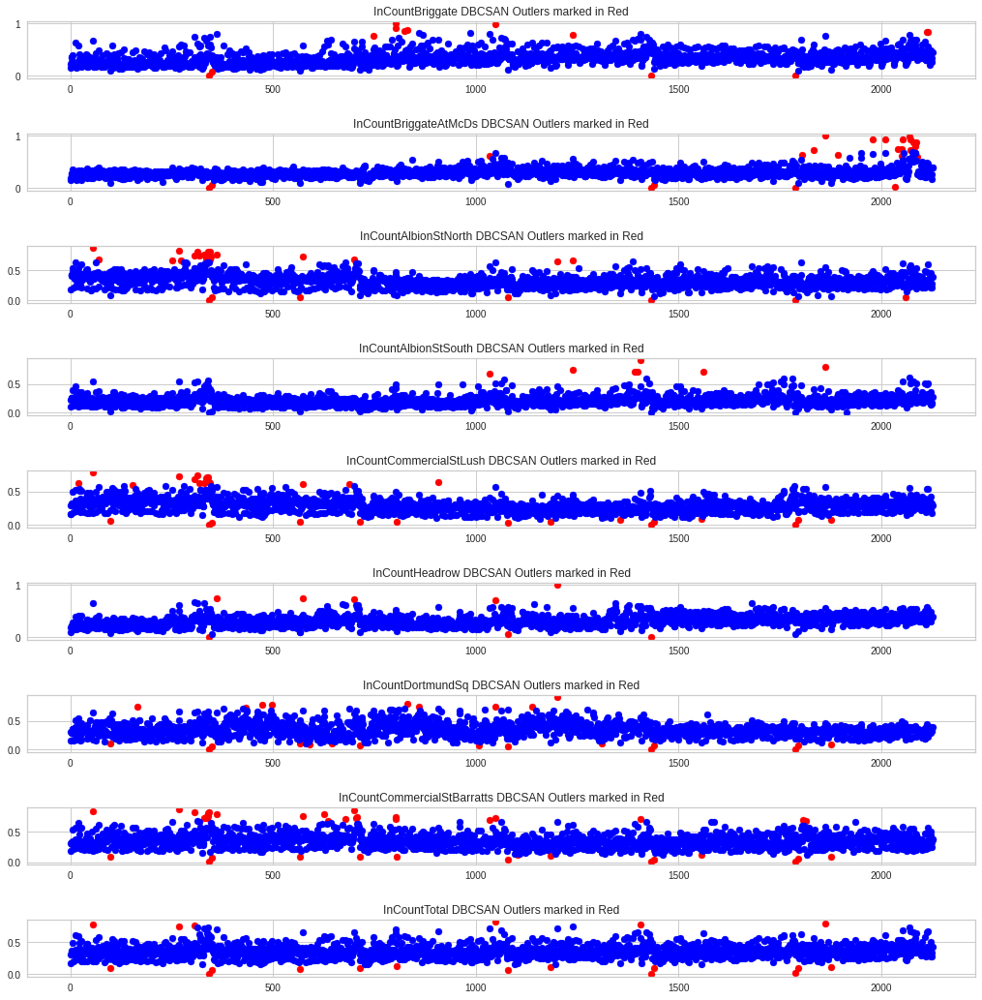

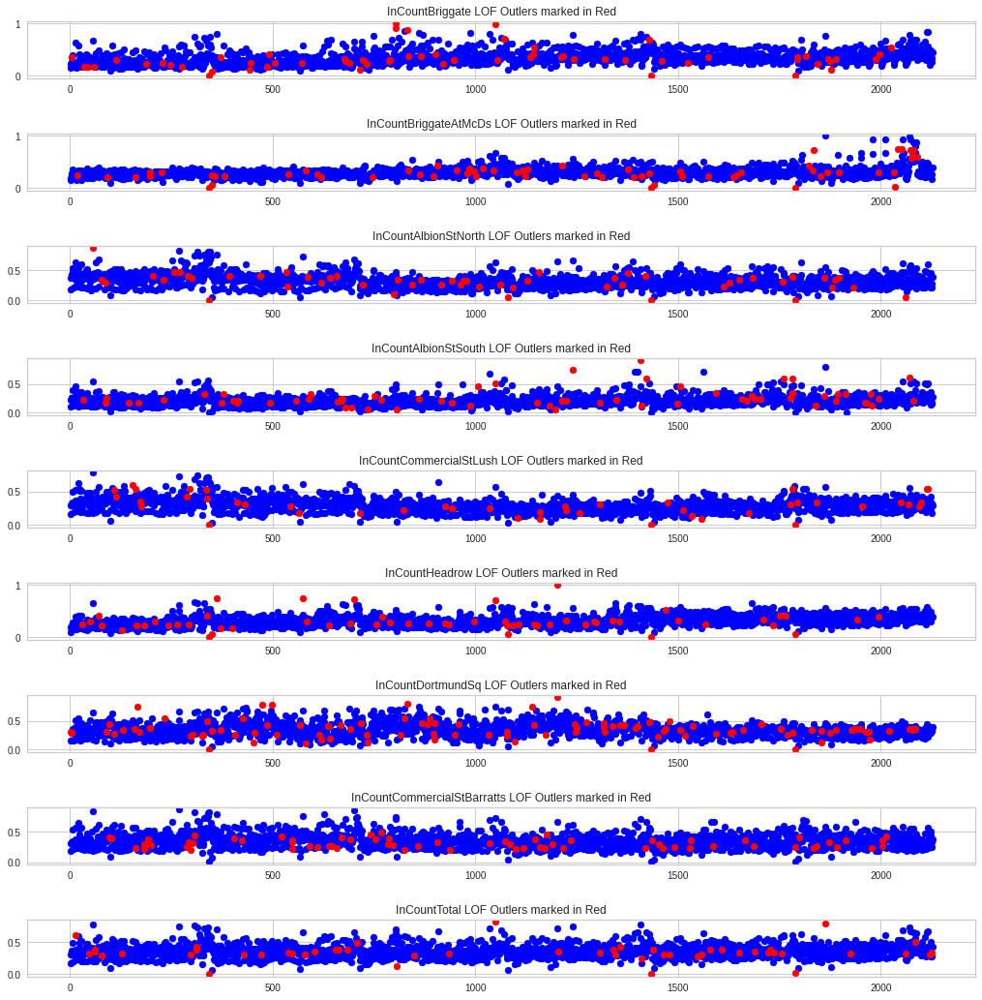

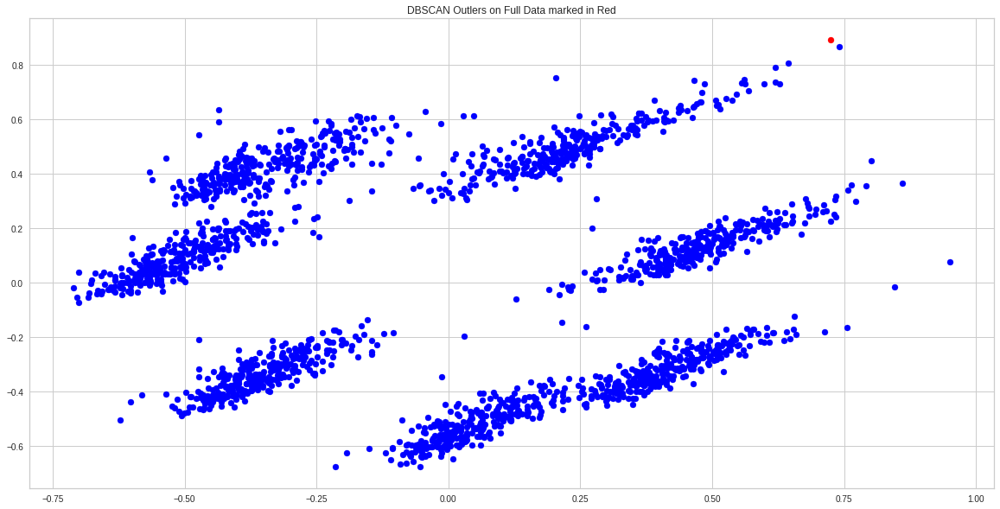

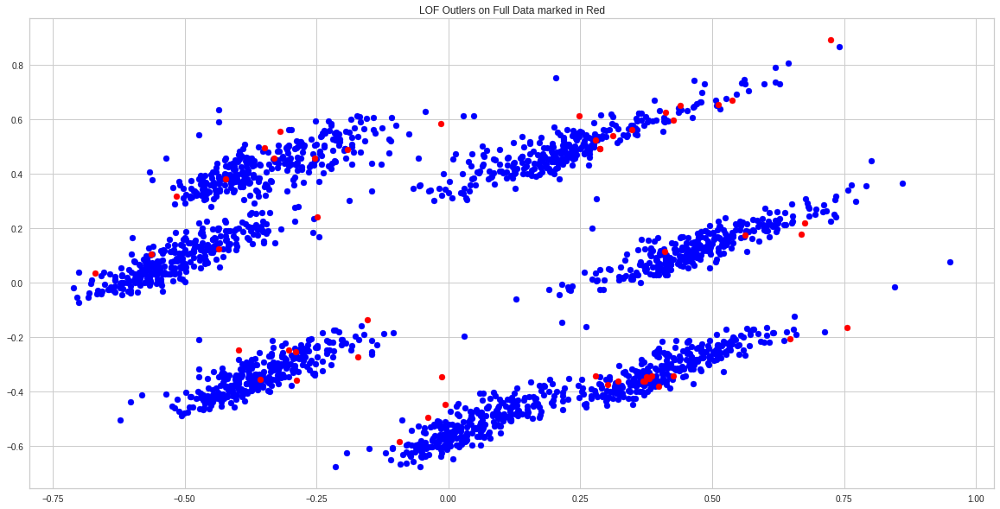

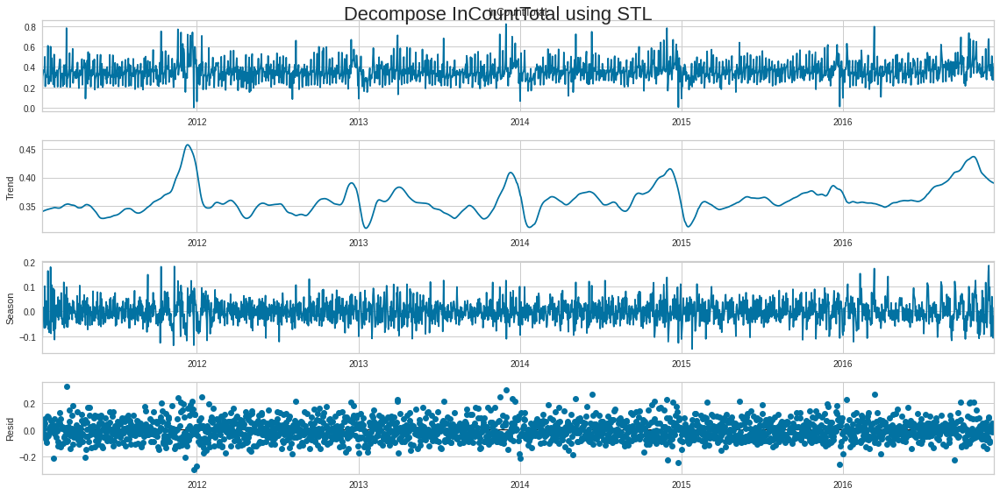

...

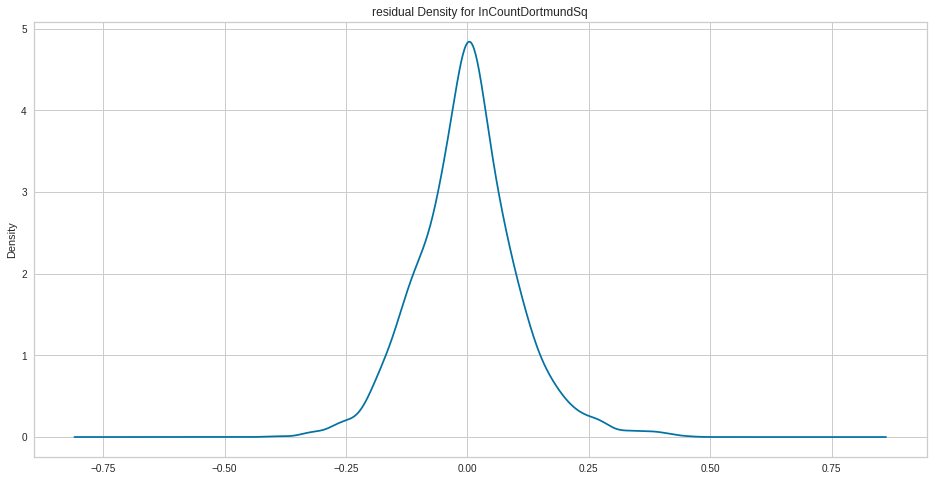

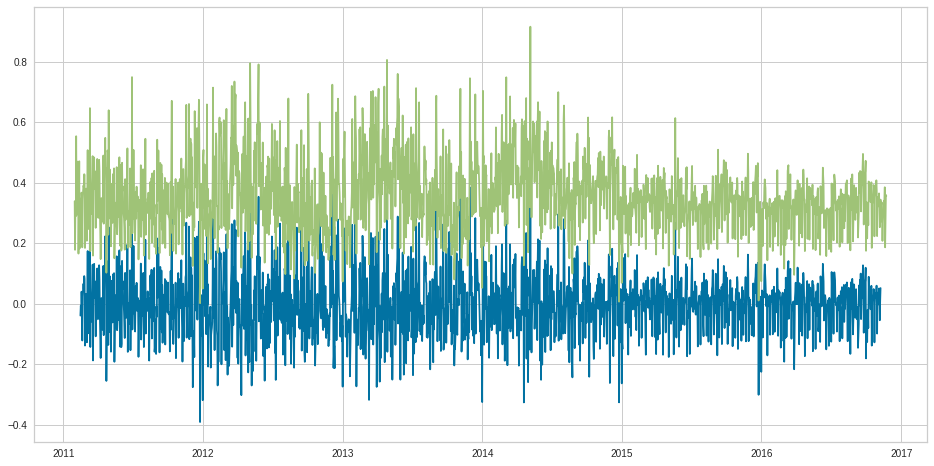

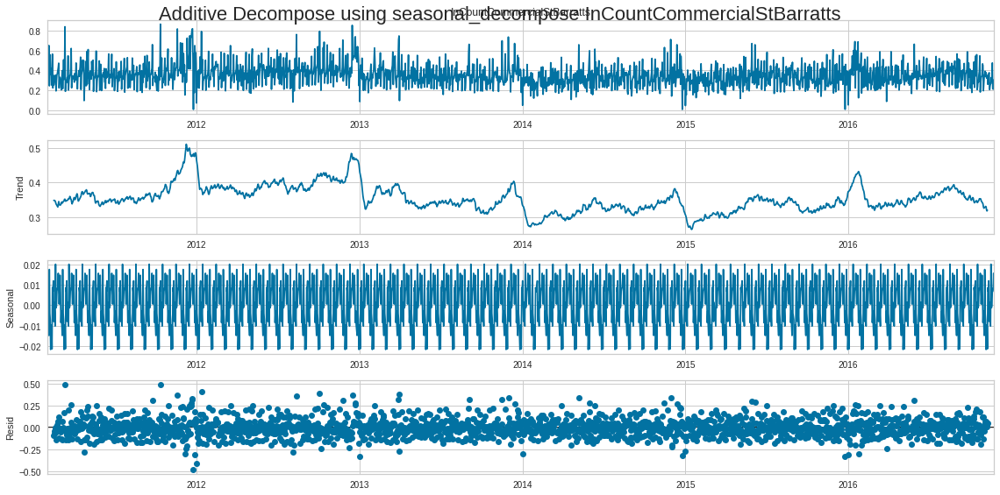

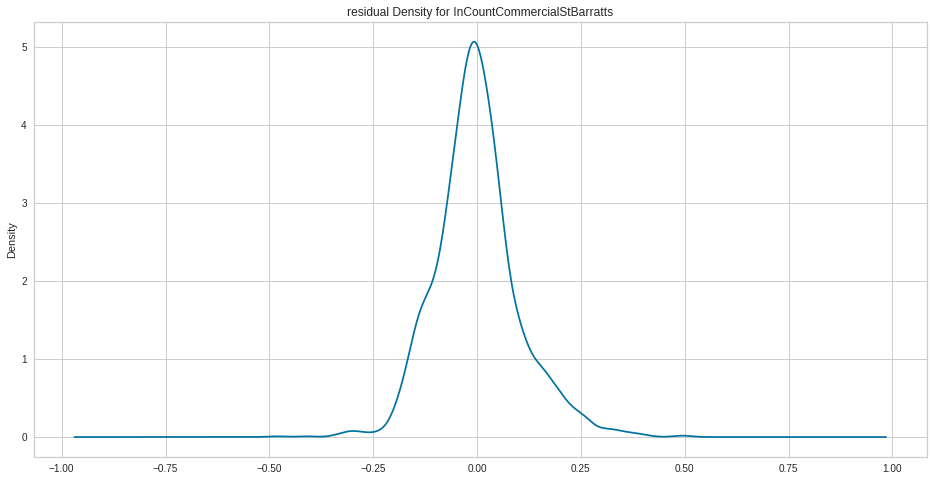

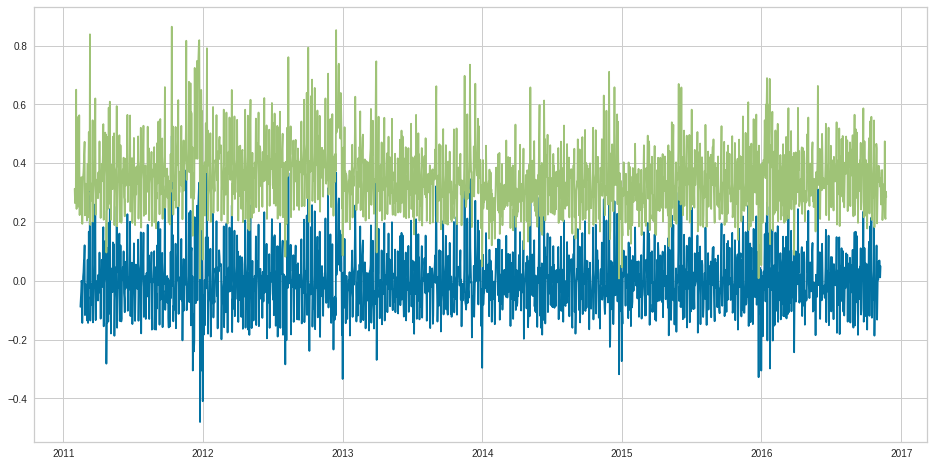

In [16]:
data_final, data_final_detrended, data_outliersremoved,data_prophet, data_weekly, location_name_list, scaler_target, scaler_input,scaler_target_each_location, scaler_prophet, princdf,compdf, var_cum_variance  = do_all_pre_processing()


In [17]:
data_weekly.shape

(310, 7)

### 4.2.6 Observations

#### Outlier Analysis Observations

1) Only 2 Outliers that too not significant are seen when DBSCAN is applied on the entire data, including the categorical variables

2) Only 19(Less than 1%) Outliers that too not significant are Identified on the Incount Total column when DBSCAN is applied. 

3) LOF is giving far more outliers compared to DBSCAN, but does not seem very relevant on the current problem statement

#### Decomposing Data to Trend, Seasonality, noise, residue
1) There is no visible trend seen in the Incount data using seasonal_decompose

2)  STL (Seasonal-Trend decomposition using LOESS - LOcally Estimated Scatterplot Smoothing) shows a smoother trend

3) The residual denisity data for all the gates and IncoutTotal almost follows a normal distribution 


#### PCA Observations

Just 11 components are able to explain 90% of the variance of the entire data(Including Categorical variables that are encoded)

In [38]:
data_final.describe()

,InCountBriggate,InCountBriggateAtMcDs,InCountAlbionStNorth,InCountAlbionStSouth,InCountCommercialStLush,InCountHeadrow,InCountDortmundSq,InCountCommercialStBarratts,InCountTotal,mean_temp,rain,wind_speed,abnormal_rain,high_temp,low_temp,high_wind,EasterSundayHoliday,University_holidays,School_holidays,UKBankHoliday,Day sin,Week sin,Week cos,Month sin,Month cos,Year sin,Year cos,Month,Year,Day,Weekday,Week_no,seasonal_incount,trend_incount,rolling_mean_incount,expanding_mean_incount,InCountTotal_lag1,InCountTotal_lag2,InCountTotal_lag3,InCountTotal_lag4,InCountTotal_lag5,InCountTotal_lag6,InCountTotal_lag7,InCountTotal_forecast1,InCountTotal_forecast2,InCountTotal_forecast3,InCountTotal_forecast4,InCountTotal_forecast5,InCountTotal_forecast6,InCountTotal_forecast7,Outliers_InCountBriggate,Outliers_InCountBriggateAtMcDs,Outliers_InCountAlbionStNorth,Outliers_InCountAlbionStSouth,Outliers_InCountCommercialStLush,Outliers_InCountHeadrow,Outliers_InCountDortmundSq,Outliers_InCountCommercialStBarratts,Outliers_InCountTotal,Lof_OutlierInCountBriggate,Lof_OutlierInCountBriggateAtMcDs,Lof_OutlierInCountAlbionStNorth,Lof_OutlierInCountAlbionStSouth,Lof_OutlierInCountCommercialStLush,Lof_OutlierInCountHeadrow,Lof_OutlierInCountDortmundSq,Lof_OutlierInCountCommercialStBarratts,Lof_OutlierInCountTotal
count,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2.127000e+03,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000,2127.000000
mean,0.335690,0.302723,0.329462,0.218807,0.293302,0.322113,0.357576,0.353479,0.360891,0.477171,0.044691,0.236201,0.361532,0.361549,0.361557,0.361559,0.361553,0.361540,0.361521,0.361685,0.497417,0.500125,4.740822e-01,0.493301,0.500026,0.499087,0.490646,0.361306,0.361348,0.361542,0.361482,0.360938,-0.000005,0.360771,0.360449,0.354592,0.360891,0.360283,0.360311,0.360492,0.360392,0.360515,0.360559,0.360990,0.361038,0.361104,0.361133,0.361172,0.361250,0.361287,0.006112,0.012694,0.013164,0.003291,0.015515,0.003761,0.011283,0.018806,0.008933,0.029619,0.030089,0.025388,0.031500,0.021157,0.026798,0.049365,0.031970,0.023977
std,0.123331,0.088781,0.101919,0.085464,0.093558,0.098360,0.116068,0.108812,0.095681,0.188751,0.091050,0.131779,0.008402,0.002188,0.002399,0.002163,0.008858,0.001137,0.002880,0.009395,0.279136,0.362888,3.718977e-01,0.353443,0.355128,0.356610,0.350512,0.019691,0.010305,0.025661,0.043798,0.025940,0.010145,0.026288,0.040588,0.003939,0.095681,0.095882,0.096146,0.096264,0.096040,0.096256,0.096278,0.095592,0.095590,0.095619,0.095628,0.095649,0.095714,0.095783,0.077958,0.111976,0.114004,0.057286,0.123617,0.061227,0.105648,0.135871,0.094112,0.169574,0.170873,0.157337,0.174705,0.143940,0.161531,0.216681,0.175961,0.153015
min,0.002641,0.005235,0.002635,0.000823,0.002592,0.004290,0.001589,0.007601,0.002429,0.000000,0.000000,0.000000,0.336153,0.357071,0.356087,0.356361,0.195055,0.360550,0.359835,0.297055,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.321822,0.350823,0.283453,0.290781,0.302526,-0.027499,0.293553,0.243647,0.341243,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%

In [ ]:
data_final.head()

#### PCA Output

In [95]:
princdf

,0,1,2,3,4,5,6,7,8,9,InCountTotal
0,0.501186,-0.072834,-0.305815,0.007210,-0.073542,0.033058,0.159510,0.042412,0.083294,0.066633,0.306589
1,0.473293,-0.160209,0.374247,-0.102821,-0.212009,-0.044546,0.141883,0.035961,0.022237,-0.020510,0.333570
2,0.430700,-0.253826,0.089324,-0.202355,-0.177654,-0.071719,0.105374,-0.061570,-0.064900,-0.116211,0.360520
3,0.370065,-0.335813,-0.193561,-0.195929,-0.150879,-0.111659,0.013438,-0.069540,-0.050136,0.142080,0.370871
4,0.298613,-0.405949,-0.477639,-0.290647,-0.201103,-0.096817,-0.026635,-0.065144,0.122234,0.018815,0.356540
...,...,...,...,...,...,...,...,...,...,...,...
2122,-0.274768,-0.411468,-0.113133,-0.089756,-0.076417,0.087092,0.054679,0.095785,0.097241,0.115622,0.393165
2123,-0.359710,-0.346921,-0.398152,0.084068,0.171826,0.075083,-0.016654,-0.013887,0.059496,-0.055236,0.272368
2124,-0.422223,-0.263957,0.278268,0.151538,-0.135616,0.064667,0.107704,0.104022,-0.013881,-0.091874,0.345800
2125,-0.469288,-0.174786,-0.007275,0.167731,-0.037596,0.040813,0.063860,-0.006845,-0.094975,0.083027,0.433450


#### The contribution of each Feature for the principal components

In [96]:
compdf

,Month,Weekday,Day,Week_no,mean_temp,rain,wind_speed,abnormal_rain,high_temp,low_temp,high_wind,EasterSundayHoliday,University_holidays,School_holidays,UKBankHoliday,Day sin,Month sin,Month cos,rolling_mean_incount,seasonal_incount,trend_incount,InCountTotal_lag1,InCountTotal_lag2,InCountTotal_lag3,InCountTotal_lag4,InCountTotal_lag5,InCountTotal_lag6,InCountTotal_lag7
0,0.000143,-0.000201,0.004861,0.007279,-0.014059,-0.007177,-0.024392,0.000234,0.000204,-0.000099,0.000178,0.000168,0.000004,-0.000123,0.000763,0.006666,-0.160914,-0.985591,0.013086,0.006266,0.001137,0.016580,0.017557,0.016903,0.015575,0.014153,0.011739,0.009442
1,0.000305,0.000149,0.002103,0.001417,-0.006632,0.001153,0.013375,0.000330,-0.000167,-0.000221,-0.000030,0.000469,0.000025,-0.000326,0.001441,-0.013345,0.986276,-0.161999,-0.008832,-0.000257,-0.000914,0.004022,-0.000763,-0.003636,-0.006697,-0.010143,-0.012275,-0.014071
2,0.000693,-0.000724,0.004562,0.001049,0.004766,-0.000284,-0.000102,-0.000390,0.000057,0.000046,-0.000203,-0.000214,0.000019,0.000005,0.000042,-0.999829,-0.014242,-0.004330,0.001685,0.000378,0.001318,0.005261,0.003096,0.003004,-0.003204,-0.003292,0.000605,0.001026
3,-0.003089,-0.000715,-0.002258,-0.001626,0.998510,-0.008011,-0.022389,0.000650,-0.007905,0.008412,0.001319,-0.000045,0.001377,0.001414,0.000871,0.004862,0.003854,-0.014502,-0.007989,0.004044,0.001313,0.007251,0.018843,0.006670,-0.007817,-0.005108,-0.021194,-0.030592
4,0.020332,-0.000998,-0.004046,0.014581,0.025544,0.193777,0.969184,-0.013037,0.001565,0.003163,-0.011864,-0.000972,0.000206,0.000899,-0.002978,0.000043,-0.013477,-0.019622,0.045212,-0.004097,0.019095,-0.055826,0.026625,0.068061,0.044162,0.070435,0.048324,0.028408
5,0.081877,-0.013730,0.006713,0.112470,0.010910,-0.112346,-0.088966,0.008718,0.000297,0.000940,0.000422,0.000249,-0.000267,0.001099,-0.000662,0.002111,0.026341,0.039503,0.322717,0.004432,0.150878,0.271740,0.337377,0.373096,0.394432,0.375083,0.348663,0.292907
6,-0.009098,-0.148497,-0.047704,-0.041389,0.034172,0.165891,-0.097310,-0.012942,-0.000866,-0.000167,0.001315,-0.000972,-0.000074,0.000867,-0.011650,-0.005536,0.015080,-0.009263,0.046819,-0.004708,-0.007611,-0.582932,-0.423583,-0.194885,0.065754,0.254902,0.433772,0.343698
7,-0.007176,-0.134106,-0.031610,-0.000490,-0.018104,0.245692,-0.106679,-0.019633,-0.000127,-0.000618,0.001201,-0.006844,0.000035,-0.000662,-0.003525,-0.003524,-0.001363,0.001930,0.007306,-0.004209,-0.023352,-0.490645,0.101102,0.414601,0.423183,0.090114,-0.296395,-0.458157
8,0.002127,-0.090142,-0.013567,0.006591,0.003781,0.119543,-0.038346,-0.008967,0.000371,0.000170,0.000423,-0.005415,0.000096,0.000367,-0.002419,0.004137,0.002531,-0.000226,0.035160,-0.002729,0.008090,-0.264797,0.265805,0.433353,-0.255128,-0.627361,0.078225,0.425515
9,-0.004048,-0.066067,-0.009104,0.005205,-0.015090,-0.067714,-0.013227,0.005955,0.000167,0.000358,0.000256,-0.002074,-0.000199,-0.001343,0.005811,0.000916,-0.000247,0.001273,0.007327,-0.000249,-0.008484,-0.220202,0.455901,-0.003915,-0.577168,0.287779,0.389428,-0.407889


[0.27410066 0.54519011 0.71412958 0.79147247 0.83003109 0.85913497
 0.8816237  0.90256698]


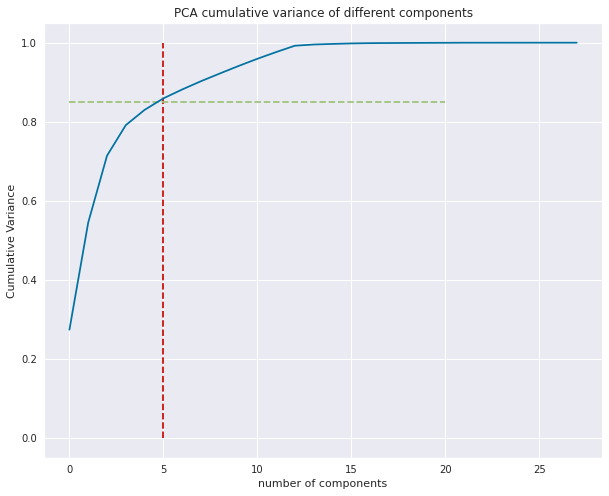

In [98]:
print(var_cum_variance[0:8])
# Plotting the scree plot with a mark on 85 percentile of variance being captured
fig = plt.figure(figsize=[10,8])
plt.vlines(x=5, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.85, xmax=20, xmin=0, colors="g", linestyles="--")
plt.plot(var_cum_variance)
plt.ylabel("Cumulative Variance")
plt.xlabel("number of components")
plt.title("PCA cumulative variance of different components")
plt.show()

#### Observation from PCA cumulative variance
Just 6 components are able to explain 85% of the variance in the data

In [ ]:
data_for_visualization,_,_,_,_,_,_,_,_,_,_,_,_ =  do_all_pre_processing(for_visualization_only = True)

#### Missing Data Observation
1. Only Missing data in column InCountCommercialStBarrats for two days

In [ ]:
data_for_visualization.head()

In [ ]:
data_final[['InCountTotal_lag7','InCountTotal_lag6','InCountTotal_lag5','InCountTotal_lag4','InCountTotal_lag3','InCountTotal_lag2','InCountTotal_lag1','InCountTotal','InCountTotal_forecast1']].head(15)

In [ ]:
data_final[data_final.isnull().any(1)]

In [ ]:
data_for_visualization[data_for_visualization.isnull().any(1)]

In [ ]:
data_for_visualization.loc['2014-08-13':'2014-08-13']

In [ ]:
print(location_name_list)

# 5 - Data Visualization

## 5.1 Visualisation Class

In [ ]:
class Visualization:
    def __init__(self,data_frame = None, location_name_list=None):
        self.data_frame = data_frame # array of column names to encode
        self.location_name_list = location_name_list
        self.colors = ['b','r','g','p']
        self.distmapping = { 'W': 'Weekly', 'M': 'Monthly','Y':'Yearly'}
        self.cols_to_keep = ['mean_temp','rain','wind_speed','abnormal_rain','high_temp','low_temp','high_wind','EasterSundayHoliday',
                             'University_holidays','School_holidays','UKBankHoliday']
        
        self.modified_location_name_list=['InCount'+x for x in self.location_name_list]
        self.init_gg_plots()
        
    
    def init_gg_plots(self):
      theme_set(
            theme_538() +
            theme(
                figure_size = (8, 4),
                text = element_text(
                    size = 8,
                    color = 'black',
                    family = 'DejaVu Sans'
                ),
                plot_title = element_text(
                    color = 'black',
                    family = 'DejaVu Sans',
                    weight = 'bold',
                    size = 12
                ),
                axis_title = element_text(
                    color = 'black',
                    family = 'DejaVu Sans',
                    weight = 'bold',
                    size = 6
                ),
            )
        )
      
    def uni_variate_ggplot_histogram(self, x_list,x_limit_list, y_limit_list ):
      index = 0
      for col in x_list:
        fig = ggplot(self.data_frame) + geom_histogram(aes(x = col),fill = 'blue', color = 'red') + labs(title = col +' distribution - (median = dashed line; mean = solid line)', x = col, y = 'Frequency',
            ) + scale_x_continuous(
                limits = (0, x_limit_list[index]), 
                labels = self.labels(0, x_limit_list[index], int(x_limit_list[index]/10)),
                breaks = self.breaks(0, x_limit_list[index], int(x_limit_list[index]/10))
            )+  scale_y_continuous(
                limits = (0, y_limit_list[index]),
                labels = self.labels(0, y_limit_list[index], int(y_limit_list[index]/10)),
                breaks = self.breaks(0, y_limit_list[index], int(y_limit_list[index]/10))
            )+ geom_vline(aes(xintercept = self.data_frame[col].mean()), color = 'gray')+ geom_vline(aes(xintercept = self.data_frame[col].median()), linetype = 'dashed', color = 'gray')
        fig.draw()
        index += 1

    def facet_ggplot_histogram(self, x, facet_wrap_cols, x_limit, y_limit):
      fig= ggplot(self.data_frame) + geom_histogram(aes(x = x),fill = 'blue', color = 'red') + labs(title =x +' distribution', x = x, y = 'Frequency',
          ) + scale_x_continuous(
              limits = (0, x_limit), 
              labels = self.labels(0, x_limit, int(x_limit/10)),
              breaks = self.breaks(0, x_limit, int(x_limit/10))
          )+  scale_y_continuous(
              limits = (0, y_limit),
              labels = self.labels(0, y_limit, int(y_limit/10)),
              breaks = self.breaks(0, y_limit, int(y_limit/10))
          )+ theme(figure_size = (16, 24)) + facet_wrap(facet_wrap_cols, ncol = len(facet_wrap_cols), labeller='label_both')
      fig.draw()

    def scatter_plot_ggplot(self, x = 'InCountTotal',y='rain', hue='Weekday', color = 'red', x_limit=200000, y_limit=15):
      fig = ggplot(self.data_frame) + geom_point(aes(x = x,y=y, fill=hue),alpha = 0.5, color = color) + labs(title ='Scatter plot of '+ x + ' and '+y, x = x, y = y,
        ) +scale_x_continuous(
              limits = (0, x_limit), 
              labels = self.labels(0, x_limit, int(x_limit/10)),
              breaks = self.breaks(0, x_limit, int(x_limit/10))
          )+  scale_y_continuous(
              limits = (0, y_limit),
              labels = self.labels(0, y_limit, int(y_limit/10)),
              breaks = self.breaks(0, y_limit, int(y_limit/10))
        )+ theme(figure_size = (12, 8)) 
      fig.draw()

    def labels(self, from_, to_, step_):
      return pd.Series(np.arange(from_, to_ + step_, step_)).apply(lambda x: '{:,}'.format(x)).tolist()
    def breaks(self, from_, to_, step_):
      return pd.Series(np.arange(from_, to_ + step_, step_)).tolist()

    def plot_graphs(self, plot_type = 'boxplot', col_name = 'InCount', nplotrows=4,nplotcols=2):
        
        location_area_index = 0
        for i in range(nplotrows):# 4 rows of plots 
            fig = plt.figure(figsize=(16,8)) 
            for j in range(nplotcols):# 2 colums of sub plots
              ax1 = fig.add_subplot(1, 2, j+1)
              if(col_name == 'InCount'):
                target_variable = self.modified_location_name_list[location_area_index]
              else:
                target_variable = col_name                
            
              if(plot_type == 'boxplot'): 
                ax1.boxplot(self.data_frame[target_variable])
              elif(plot_type == 'histogram'):
                n, bins, patches = ax1.hist(self.data_frame[target_variable], bins=200, color=self.colors[j], density=True)
              elif(plot_type == 'heatmap'):
                cols = self.cols_to_keep.copy()
                cols.append(target_variable)
                sns.heatmap(self.data_frame[cols].corr(), annot=True, linewidths=.20)
                                        
              ax1.set_xlabel('Mall foot fall - ' + col_name + " for " + self.location_name_list[location_area_index] )
              ax1.set_ylabel('Frequency')
              ax1.set_title('Mall foot fall '+ plot_type +' - ' + col_name + " for " + self.location_name_list[location_area_index])
              location_area_index +=1
            
    def show_timedistribution(self, distribution_type='W', col_name='InCount'):
      for location_name in self.location_name_list:
        if(col_name == 'InCount'):
          target_variable = col_name + location_name
        else:
          target_variable = col_name
        self.data_frame[target_variable].resample(distribution_type).mean().plot(figsize = (20,8))
        
        xlabel = self.distmapping[distribution_type]
        plt.xlabel(xlabel)
        plt.ylabel('Mall Foot fall')
        plt.legend(self.location_name_list)
        plt.title("Mall Foot fall for different locations - " + xlabel)
    def show_pairplot(self,one_location_only = True, kind='scatter'):
      sns.set_style('whitegrid')
      cols = self.cols_to_keep
      cols.append('InCount'+self.location_name_list[0])
      sns.pairplot(self.data_frame[cols], kind=kind)

    def comparegates(self):
        gatecorrdata=data_final[self.modified_location_name_list]
        sns.pairplot(gatecorrdata)
        plt.show()
        sns.heatmap(gatecorrdata.corr(), annot = True)
        plt.show()
    
    def bi_variate_kernel_density_plot(self, x, y_list, hue_list=None):
     
      nplotrows = len(hue_list)
      nplotcols = len(y_list)
      for i in range(nplotrows):# 4 rows of plots 
            fig = plt.figure(figsize=(16,8)) 
            for j in range(nplotcols):# 2 colums of sub plots
              ax1 = fig.add_subplot(1, 3, j+1)
              
              sns.kdeplot(data = self.data_frame, x=x, y=y_list[j], hue=hue_list[i])
                                     
              ax1.set_xlabel('KDE plot ' + x  )
              ax1.set_ylabel(y_list[j])
              ax1.set_title('KDE plot '+ x +' and ' + y_list[j] )              

    
    def plot_graphs_for_list(self, plot_type = 'boxplot', col_list = ['rain'], target_col='InCountTotal'):
        
        col_index = 0
        nplotrows =1 
        nplotcols = 1
        if(len(col_list)>1):
          nplotrows = int(len(col_list)/2)
          nplotcols = 2
        for i in range(nplotrows):# 4 rows of plots 
            fig = plt.figure(figsize=(16,8)) 
            for j in range(nplotcols):# 2 colums of sub plots
              ax1 = fig.add_subplot(1, 2, j+1)

              col_name = col_list[col_index]           
              if(plot_type == 'boxplot'): 
                ax1.boxplot(self.data_frame[col_name])
              elif(plot_type == 'histogram'):
                n, bins, patches = ax1.hist(self.data_frame[col_name], bins=10, color=self.colors[j],density=True)
              elif(plot_type == 'kdeplot'):
                  #sns.kdeplot(self.data_frame, color=self.colors[j], shade=True, Label=col_name, hue='Weekday')
                  sns.kdeplot(data = self.data_frame, x= target_col, shade=True, hue=col_name)                             
              ax1.set_xlabel(col_name + " for " + self.location_name_list[0] )
              ax1.set_ylabel('Frequency')
              ax1.set_title(plot_type +' - ' + col_name )
              col_index +=1

    def show_categorical_plots(self, style="swarm", x='Weekday',y='InCountTotal', hue='Month', order=["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]):
      if style == "swarm":
          sns.swarmplot(x=x, y=y,data=self.data_frame,order=order)
      elif style == "swarm_with_hue":
          sns.swarmplot(x=x, y=y,hue=hue, data=self.data_frame,order=order)
      elif style == "stripplot":
          sns.stripplot(x=x, y=y,data=self.data_frame,order=order)
      elif style == "stripplot_with_hue":
          sns.stripplot(x=x, y=y,hue=hue, data=self.data_frame,order=order)
      elif style == "box":
          sns.boxplot(x=x, y=y, data=self.data_frame, whis=np.inf,order=order)
      elif style == "box_with_hue":
          sns.boxplot(x=x, y=y, hue=hue, data=self.data_frame, whis=np.inf,order=order)
      elif style == "violen":
          sns.violinplot(x=x, y=y, data=self.data_frame,order=order)
      elif style == "boxen":
          sns.boxenplot(x=x, y=y, data=self.data_frame,order=order)
      else:
            print("no style is selected")  

    def ggplot_swarm(self, dataframe, x_column, y_column, hue=None):
      ax = sns.swarmplot(x=x_column, y=y_column, hue=hue, data=dataframe, size=6)
      ax.set_title(x_column + " and " + y_column + " analysis.")

    def ggplot_count(self, dataframe, x_column, y_column, hue=None):
      ax = sns.countplot(x=x_column, hue=hue, data=dataframe)
      ax.set_title(x_column + " and " + y_column + " analysis.")   

    def ggplot_cat(self, dataframe, x_column, y_column, col, hue=None):
      g = sns.catplot(x=x_column, y=y_column,
                hue=hue, col=col,
                data=dataframe, kind="swarm",
                height=6, aspect=.7); 
    
    def relplot_cat(self, dataframe, x_column, y_column, col, row, size, hue=None):
        g = sns.relplot(x=x_column,y=y_column,
                        hue=hue,col=col,
                        row=row,size=size,
                        data=dataframe,palette=["b", "r"]);
    
    
    def plotcategoricaldist(self,catcollist,featlist):
        dd=pd.DataFrame(self.data_frame)
        numb=len(dd)
        fig, axs = plt.subplots(len(catcollist),figsize=(15,40))
        fig.tight_layout(pad=2.0)
        nc=0

        for col in(catcollist):
            uniq=dd[col].unique()
            pcnt=[]
            for val in uniq:
                pcnt.append(100*(dd[col][dd[col]==val].count())/numb)

            hts=axs[nc].bar(uniq,pcnt)    

            for h in (hts):
                ht=h.get_height()
                axs[nc].text(h.get_x(), 1.05*ht, str(round(ht,2)))
            axs[nc].set_title(col+'Percentage Distribution in the Data')
    
            nc=nc+1
        plt.show
        
        
        fig, axs = plt.subplots(len(catcollist),figsize=(15,40))
        fig.tight_layout(pad=2.0)
        nc=0
        
        for catcol in catcollist:
            uniq=dd[catcol].unique()
            rn = np.arange(len(uniq))
            bwidth=.05
        
            for feature in featlist:
                temp=[]
                pcnt=[]
                for colval in uniq:
                    temp.append(np.sum(dd[feature][dd[catcol]==colval]))
                    pcnt.append(100*(dd[catcol][dd[catcol]==colval].count())/numb)
                axs[nc].bar(rn,temp,width=bwidth,label=feature)
        
                rn = [x + bwidth for x in rn]
            axs[nc].set_title(catcol+'Distribution in the Data')
            #plt.legend()
            plt.xticks([r + (bwidth*len(uniq)) for r in range(len(uniq))], uniq)
            nc=nc+1
        
        
        plt.show()


In [ ]:
#from visualization import Visualization
graphs = Visualization(data_for_visualization,location_name_list)
graphs.show_timedistribution('W')

## 5.2 Observations
1. Incount is higher during the last weeks of Decemeber
2. 'Briggate' : There seems to be downward trend in 2015. overall, this seems to be the main gate
3. 'AlbionStNorth' : There is a downward trend throughout 




## 5.3 Plots

### Line Plot

In [ ]:
graphs.show_timedistribution('M')

In [ ]:
graphs.show_timedistribution('Y')

### KDE plots

#### KDE plots for 'InCountTotal'

In [ ]:
graphs.plot_graphs_for_list(plot_type = 'kdeplot', target_col = 'InCountTotal', col_list= ['Weekday','Month','high_temp','low_temp','abnormal_rain','high_wind','EasterSundayHoliday','University_holidays','School_holidays','UKBankHoliday'])



Observations:
1. weekday : Saturday seems to be having more incoount as expected
2. Month : December is seen as the busy month with more footfall
3. high_temp, low_temp, abnormal_rain : Incount is high in the absence of these
4. EasterSundayHoliday : InCount is very low
5. Other holidays : We do not see any significant impact on the InCount.

#### Bi-variate KDE plots

In [ ]:
graphs.bi_variate_kernel_density_plot('InCountTotal',['rain','wind_speed','mean_temp'], hue_list= ['Weekday','Month','high_temp','low_temp','abnormal_rain','high_wind','EasterSundayHoliday','University_holidays','School_holidays','UKBankHoliday'] )

Observations:
1. weekday : when the rain is low, Saturday seems to be having more incount as expected
2. Month : December is seen as the busy month with more footfall regardless of rain/temp situation
3. high_temp, low_temp, abnormal_rain : Incount is high in the absence of these
4. EasterSundayHoliday : InCount is very low
5. Other holidays : We do not see any significant impact on the InCount.

### Univariate Histogram ggplot

In [ ]:
graphs.uni_variate_ggplot_histogram(['InCountTotal', 'rain','mean_temp','wind_speed'],[200000,10,30,10],[250,250,250,250])

Observations:
1. mean of InCount : 180000
2. mean of rain < 1
3. mean of temp : 10.5
4. mean of wind_speed : ~1.75

### Facet Histogram ggplot

In [ ]:
graphs.facet_ggplot_histogram('InCountTotal',('Weekday','high_temp','abnormal_rain'),200000,50)

Observations

1) The Incount is significanty low during the days with Abnormal rain and also High temperture

2) Abnormal rain seems to have more impact on the Incount than the High temperature. Days with only Abnormal rain has slightly low footfall than the days with only High Temperature


### Scatter ggplot



In [ ]:
graphs.scatter_plot_ggplot(x = 'InCountTotal',y='rain', hue='Weekday', x_limit=200000, y_limit=15)

In [ ]:
graphs.scatter_plot_ggplot(x = 'InCountTotal',y='wind_speed', hue='Weekday', color = 'blue', x_limit=200000, y_limit=10)

In [ ]:
graphs.scatter_plot_ggplot(x = 'InCountTotal',y='mean_temp', hue='Weekday', color = 'green', x_limit=200000, y_limit=30)

In [ ]:
graphs.scatter_plot_ggplot(x = 'InCountTotal',y='mean_temp', hue='Month', color = 'green', x_limit=200000, y_limit=30)

In [ ]:
graphs.scatter_plot_ggplot(x = 'InCountTotal',y='rain', hue='Month', color = 'purple', x_limit=200000, y_limit=15)

### Swarm plot

In [ ]:
graphs.show_categorical_plots(style="swarm")


### Swarm plot with Hue

In [ ]:
graphs.show_categorical_plots(style="swarm_with_hue")

In [ ]:
graphs.show_categorical_plots(style="swarm_with_hue", x='Month',hue='Weekday',order=[1,2,3,4,5,6,7,8,9,10,11,12])

### Strip plot

In [ ]:
graphs.show_categorical_plots(style="stripplot")

### Strip plot with Hue

In [ ]:
graphs.show_categorical_plots(style="stripplot_with_hue")

Observations from Scatter Plots (Swarm and Strip with Hue) :
1. Weekdays : There is a gradual increase in incount from Sunday to Saturday. Saturday being highest incount
2. Months : we can see a seasonal trend in months - peaks in the months of Dec, Nov and March. Lower in the summer months(Jul and August) and also in Jan 

### Box plot

In [ ]:
graphs.show_categorical_plots(style="box")

Observations for Box Plot:
1. The Total variation of Incount is seen similar on Sunday, Wednesday, Thursday and Saturday.
2. The variation within the middle 50% is higher during Saturday followed by Sunday.
3. However the median is highest on Saturday, which is more than the 75% of overall InCount on the other days.
4. We see a Left skew on Saturday, Right Skew on Sunday, while the other days we see Symmetric distribution.

### Violen plot

In [ ]:
graphs.show_categorical_plots(style="violen")

### Boxen plot

In [ ]:
graphs.show_categorical_plots(style="boxen")

Observations for Distribution plots:
1, Distribution of data in more on Saturday which is between 100000 and 300000

2, Monday to Friday the distribution is similar

3, On some of the days the distribution is also minimum except monday and saturdays.

4, Saturday we can see that there are some data which has count of ,400000 count compared to other days where data is normally at 350000

### Autocorrelation plots

In [ ]:
plot_acf(data_final['InCountTotal'], lags=100)
plt.show()

Observations:
1. every 7th day seems to have some correlations --> inline with the trend on different days
2. every 4 weeks (say, month - 30 days), there is a correlation

### Histogram plot

In [ ]:
graphs.plot_graphs(plot_type = 'histogram')

Observations

The Incount for the gates - Briggate, CommercialStLush, Headrow and CommercialStBarrats are slightly skewed towards higher incount. Rest of the gates Incount is almost normally distributed.

In [ ]:
graphs.plot_graphs_for_list(plot_type = 'histogram', col_list =['rain','mean_temp','wind_speed','abnormal_rain'])

Observations

1) Incount is lower as windSpeed is higher

2) Incount is lower, as the rain is higher

3) Incount is significantly low during Abnormal rain

4) Incount is almost normally distributed over mean temperature. The Incount is lower when the mean teamperature is low or high.



### Box plot (outlier) for InCount

In [ ]:
graphs.plot_graphs(plot_type = 'boxplot')

In [ ]:
for location in graphs.modified_location_name_list:
  print(data_for_visualization[location].nlargest(2))

Observations : There are a few days where incount is much higher than other days

### Boxplot for other attributes

In [ ]:
graphs.plot_graphs_for_list(plot_type = 'boxplot', col_list =['rain','mean_temp','wind_speed','abnormal_rain'])

Observations :
1. mean_temp , abnormal_rain : no outliers
2. rain : There is one day with rain = 13.8
3. wind speed is high on a few days

### Pair plot & Heatmap

In [ ]:
graphs.show_pairplot()

Observations:
1. rain : when there is no rain or less rain, incount is higher
2. wind-speed : When the wind-speed is lower, the incount is higher
3. abnormal_rain : when there is no abnormal_rain, incount is higher. linked with rain attribute
4. high_temp : when there is no high_temp, Incount is higher
5. low_temp : There is no impact on Incount if low_temp or not
6. high_wind : if there is no high_wind, Incount is higher
7. EasterSundayHoliday : if it's EasterSunday, the InCount is very **low**
8. School Holday/University Holiday - we do not see any major changes in the in-flow
9. UK Bank holiday - Incount is slighlty lower on bank holidays 

In [ ]:
graphs.plot_graphs(plot_type='heatmap')

In [ ]:
graphs.comparegates()

Observation: The gates CommercialStLush and CommercialStBarratts are closely correlated

Categorical Columns Correlation

In [ ]:
nominal.associations(data_for_visualization[['Month', 'Year', 'Day', 'Weekday', 'Week_no', 'abnormal_rain', 'high_temp', 'low_temp', 'high_wind', 'EasterSundayHoliday', 'University_holidays', 'School_holidays','UKBankHoliday']], nominal_columns='all')

Observations for Categorical Correlation:
1. School and University Holidays has correlation with Month, Week No and Day
2. School and University Holidays are correlated


### Swarm plot

In [ ]:
df_Weekday_Hour = df_foot_fall.groupby(['Weekday', 'Hour'],as_index=False)['InCount'].sum()
graphs.ggplot_swarm(df_Weekday_Hour, 'Hour', 'InCount', 'Weekday')

Observations from Weekday wise Hour and Incount:
1. On Friday and Saturday mall has more people between 11:00 to 16:00 hours
2. On Monday, Tuesday, Wednesday and Thursday mall has more people between 12:00 to 14: hours.
3. Sunday has more people between 12:00 to 16:00 hours.

We can also see that hours 13:00-17:00 are busy hours.

### Cat plot

Weather impact on Incount - Multivariate

In [ ]:
graphs.ggplot_cat(data_for_visualization, "high_wind", "InCountTotal", "abnormal_rain", "high_temp")

In [ ]:
graphs.ggplot_cat(data_for_visualization, "high_wind", "InCountTotal", "abnormal_rain", "low_temp")

Observations from weather impact:
1. Incount is high during no abnormal rain, no high wind and normal temperature (not high nor low).
2. Incount is less during abnormal rain, high wind, low & high temperature.

Holidays impact on Incount - Multivariate

In [ ]:
graphs.ggplot_cat(data_for_visualization, "EasterSundayHoliday", "InCountTotal", "University_holidays", "UKBankHoliday")

In [ ]:
graphs.ggplot_cat(data_for_visualization, "EasterSundayHoliday", "InCountTotal", "School_holidays", "UKBankHoliday")

In [ ]:
graphs.ggplot_cat(data_for_visualization, "UKBankHoliday", "InCountTotal", "School_holidays", "University_holidays")

Observations from holidays impact:
1. Incount is high during no easter sunday holiday and no UK bank holiday.
2. Incount is very low when there is easter sunday holiday or UK bank holiday.


### Rel plot

In [ ]:
graphs.relplot_cat(data_for_visualization, "Weekday","InCountTotal", "high_temp", "Month", "high_wind", "University_holidays")

In [ ]:
graphs.relplot_cat(data_for_visualization, "Weekday","InCountTotal", "high_temp", "Month", "high_wind", "School_holidays")

In [ ]:
graphs.relplot_cat(data_for_visualization, "Weekday","InCountTotal", "high_temp", "Month", "high_wind", "UKBankHoliday")

In [ ]:
graphs.relplot_cat(data_for_visualization, "Weekday","InCountTotal", "high_temp", "Month", "high_wind", "EasterSundayHoliday")

Observations  for MultiDimensional Categorical Columns:

University Holidays:
1, For Month 7, Month 8 and Month 9 there are more universisy holidays, where the incount is between 100000 to 250000 when there is high temp or low temp 

2, For Month 10 and Month 11 there is more incount even though there is no universisy holidays, it sometimes got incount more than 350000

3, For Month 12 if there are university holidays the incount is more when the temperature is less compared to temperature which is high


School Holidays:
1, For Month 8 there are more school holidays so the incount is around 250000 even if the there is high or low temperature

2, For Month 10 and Month 11 there is more incount even though there is no universisy holidays, it sometimes got incount more than 350000

3, For Month 12 if there are university holidays the incount is more when the temperature is less compared to temperature which is high



UKBankHolidays and EasterSundayHolidays:
1, The incount is not more when there is a UK Bank holiday and EasterSunday Holidays, it seems Bank holidays/EasterSunday Holidays are not impacting much to the incount


In [ ]:
data_final.shape

### Bar plot

Plotting the distribution of each Categorical variable

In [ ]:
catcollist=['Month', 'Year', 'Day', 'Weekday', 'Week_no', 'abnormal_rain', 'high_temp', 'low_temp', 'high_wind', 'EasterSundayHoliday', 'University_holidays', 'School_holidays','UKBankHoliday']
featlist=['InCountBriggate', 'InCountBriggateAtMcDs', 'InCountAlbionStNorth','InCountAlbionStSouth', 'InCountCommercialStLush', 'InCountHeadrow','InCountDortmundSq', 'InCountCommercialStBarratts']
graphs.plotcategoricaldist(catcollist,featlist)

Observations from the Categorical variables Percentage Distribution:

Incount on dates 9th and 11th are slightly lower compared to other dates.

9.78 % of days are with Abnormal Rain

19.1% of the Total days are with High Temperature

16.1% of the Total days are with Low Temperature

14.76% of the Total days are with High Wind

43.96% of the Total days are University Holidays

26.11% of the Total days are School Holidays

2.26% of the Total days are Bank Holidays

Biggate has more incount compared to other gates

Saturday has more Incount compared to other days

Incount is low during Abnornal Rains, High Wind, High Temperature, Low Temperature.

Incount is very low on Easter Sundays and UK Bank Holidays

Incount is slightly higher on school and university holidays


## 5.4 Graphs for detrended data

In [ ]:
graphs = Visualization(data_final_detrended,location_name_list)
graphs.show_timedistribution('W')

In [ ]:
graphs = Visualization(data_final_detrended,location_name_list)
graphs.show_timedistribution('M')

In [ ]:
graphs.show_pairplot()

## 5.5 Summary of top observations

1. Missing data is seen with for 2 days only with one specific gate. This is imupted with KNN Impute
2. Stationarity check on the data : Augmented Dickey-Fuller (ADF) test shows p-value << 0.05, so the series is already stationary
3. Decomposing Data to Trend, Seasonality, noise, residuals ==> a.) There is no visible trend seen in the Incount data, b). there is seasonality visible c.)The residual denisity data for all the gates and IncoutTotal almost follows a normal distribution
4. PCA - 85% variance achievable with 6 principal components and 90% variance preserved with 11 components
5. Outlier detection - a) Only 2 Outliers that too not significant are seen when DBSCAN is applied on the entire data, including the categorical variables
b) LOF is giving far more outliers compared to DBSCAN, but does not seem very relevant on the current problem statement
6. Autocorrelation plot - evey 7th day or multples of 7th seem to have correlation
7. rain : when there is no rain or less rain, incount is higher
8. wind-speed : When the wind-speed is lower, the incount is higher
9. Incount is low during Abnornal Rains, High Wind, High Temperature, Low Temperature. 
10. Abnormal rain seems to have more impact on the Incount than the High temperature. Days with only Abnormal rain has slightly low footfall than the days with only High Temperature
11. EasterSundayHoliday : if it's EasterSunday, the InCount is very **low**
12. School Holday/University Holiday - we do not see any major changes in the in-flow
13. UK Bank holiday - Incount is slightly lower on bank holidays   
14. Weekdays : There is a gradual increase in incount from Sunday to Saturday. Saturday having highest incount
15. Month : we can see a seasonal trend in months - peaks in the months of Dec, Nov and March. Lower in the summer months(Jul and August) and also in Jan 
16. Hourly analysis: busy hours are 13.00-17.00 a) On Friday and Saturday mall has more people between 11:00 to 16:00 hours , b) On Monday, Tuesday, Wednesday and Thursday mall has more people between 12:00 to 14: hours. c) Sunday has more people between 12:00 to 16:00 hours.
17. School holidays and University Holidays are highly correlated to each other 


# 6 - Model preparation

## 6.1 train_test_validation_data_set Class

In [20]:
class train_test_validation_data_set:
  def __init__(self,data_frame,train_split=global_parameters["train_split"], validation_split=global_parameters["validation_split"], test_split= global_parameters["test_split"]):
        self.data_frame = data_frame.copy() # which data_frame to pre-process
        self.train_split = train_split
        self.validation_split = validation_split
        self.test_split = test_split

  def prepare_pca_datasets(self,n_timesteps=global_parameters["n_timesteps"],n_forecast_steps = global_parameters["n_forecast_steps"], shuffle=False):

    X_columns = self.data_frame.columns.values
    X_columns = X_columns[:-1]
    X_dataset = self.data_frame.iloc[:,:-1]
    y_col = 'InCountTotal'
    y_dataset = self.data_frame[y_col].values
    
    return X_dataset, y_dataset, X_columns
   

  def prepare_regression_datasets(self,n_timesteps=global_parameters["n_timesteps"],n_forecast_steps = global_parameters["n_forecast_steps"], input_cols=None,shuffle=False):
    
    # input variables 
    df_temp =  self.data_frame[input_cols]
    
    # remove the first n_timesteps rows from this dataset.
    df_temp.drop(df_temp.head(n_timesteps).index,inplace=True)
    # remove the last n_timesteps rows from this dataset.
    df_temp.drop(df_temp.tail(n_forecast_steps).index,inplace=True)
    df_temp = df_temp.values
    
    target_data = self.data_frame['InCountTotal'].values
    target_data = target_data.reshape(-1,1)

    X_dataset =[]
    y_dataset = []
  
    for i in range(n_timesteps, target_data.shape[0]-n_forecast_steps):
      X_dataset.append(target_data[i-n_timesteps:i,0])
      y_dataset = np.concatenate((y_dataset,target_data[i:i+n_forecast_steps,0].flatten()),axis=0)

    X_columns = list(['InCountTotal_lag'+str(i) for i in range(n_timesteps,0,-1)])
    X_columns = X_columns + list(input_cols) 

    X_dataset = pd.DataFrame(X_dataset)
    df_temp = pd.DataFrame(df_temp)
    
    df = pd.concat([X_dataset,df_temp],axis=1)
    df.columns = X_columns
    df.to_csv("regression_dataset_X.csv")
    X_dataset = df.values
    data_set_len =  X_dataset.shape[0]

    df_y = pd.DataFrame(y_dataset, columns=['InCountTotal'])
    df_y.to_csv("regression_dataset_y.csv")

    if shuffle == True:
      df_data = pd.concat([pd.DataFrame(X_dataset),pd.DataFrame(y_dataset)], axis=1)
      #df_data = df_data.sample(frac=1)  
      df_data = df_data.sample(n=len(df_data), random_state=42) 
      X_dataset = df_data.iloc[:,:len(X_columns)].values
      y_dataset = df_data.iloc[:,-1:].values
        
    return X_dataset, y_dataset, X_columns
  

  def shuffleDataset(self, X_data, y_data, detereminisitic_data,n_timesteps,n_features,n_forecast_steps,len_deterministic_data_col):

    len_X_data_cols = n_timesteps*n_features
    len_y_data_cols = n_forecast_steps

    X_data = X_data.reshape(X_data.shape[0],len_X_data_cols)
    y_data = y_data.reshape(X_data.shape[0],len_y_data_cols)
    detereminisitic_data = detereminisitic_data.reshape(X_data.shape[0],len_deterministic_data_col)
 
    df_data = pd.concat([pd.DataFrame(X_data),pd.DataFrame(y_data),pd.DataFrame(detereminisitic_data)], axis=1)
 
    df_data = df_data.sample(n=len(df_data), random_state=42) 
       
    X_data_shuffled = df_data.iloc[:,:len_X_data_cols].values
    y_data_shuffled = df_data.iloc[:,len_X_data_cols:len_X_data_cols+len_y_data_cols].values
    detereminisitic_data_shuffled = df_data.iloc[:,len_X_data_cols+len_y_data_cols:].values

    X_data_shuffled = X_data_shuffled.reshape(X_data.shape[0], n_timesteps, n_features)
    y_data_shuffled = y_data_shuffled.reshape(X_data.shape[0],n_forecast_steps)
    detereminisitic_data_shuffled = detereminisitic_data_shuffled.reshape(X_data.shape[0],n_forecast_steps, len_deterministic_data_col)

    return X_data_shuffled,y_data_shuffled,detereminisitic_data_shuffled

  def createTimeSteps_LSTM(self, n_timesteps=7,n_forecast_steps = 1, input_cols=['InCountTotal'],deterministic_features=None, shuffle=False):
  

    input_data = self.data_frame[input_cols].values
    n_features = len(input_cols)

    X_datset =[]
    y_dataset = []

  
    for i in range(n_timesteps, input_data.shape[0]-n_forecast_steps):
      X_datset.append(input_data[i-n_timesteps:i,:])
      y_dataset = np.concatenate((y_dataset,input_data[i:i+n_forecast_steps,-1:].flatten()),axis=0)
    
    deterministic_datset = []
    if deterministic_features != None:
      deterministic_feature_data = self.data_frame[deterministic_features].values
      for i in range(n_timesteps, deterministic_feature_data.shape[0]-n_forecast_steps):
         deterministic_datset = np.concatenate((deterministic_datset,deterministic_feature_data[i:i+n_forecast_steps,:].flatten()),axis=0)
         
    '''
    LSTM input shape must be in the following order.
    Samples - One sequence is one sample. A batch is comprised of one or more samples.
    Time Steps - One time step is one point of observation in the sample.
    Features - One feature is one observation at a time step.
    ''' 
    X_datset = np.array(X_datset) 
    lendataset = X_datset.shape[0]
    

    X_datset = np.reshape(X_datset, (X_datset.shape[0], n_timesteps, len(input_cols)))
    y_dataset = np.reshape(y_dataset,(X_datset.shape[0],n_forecast_steps))
    if deterministic_features != None:
      deterministic_datset = np.reshape(deterministic_datset,(lendataset,n_forecast_steps, len(deterministic_features)))

    return X_datset,y_dataset ,deterministic_datset, n_features 

  def prepare_LSTM_datasets(self,n_timesteps=7,n_forecast_steps = 7, input_cols=['InCountTotal'], deterministic_features=None, validation=True, shuffle=False):
    
    # input variables 
    X_dataset, y_dataset,deterministic_datset, n_features = self.createTimeSteps_LSTM(n_timesteps=n_timesteps,n_forecast_steps = n_forecast_steps, input_cols = input_cols,deterministic_features=deterministic_features,shuffle=shuffle)
        
    data_set_len =  X_dataset.shape[0]
 
    if validation == True:
      # We do the split of train /validation/test
      X_train, X_validation, X_test = np.split(X_dataset, [int(self.train_split*data_set_len),int((self.train_split+self.validation_split)*data_set_len)])
      y_train, y_validation, y_test = np.split(y_dataset, [int(self.train_split*data_set_len),int((self.train_split+self.validation_split)*data_set_len)]) 
      deterministic_train, deterministic_validation, deterministic_test = np.split(deterministic_datset, [int(self.train_split*data_set_len),int((self.train_split+self.validation_split)*data_set_len)]) 

    else:
      # split into train/test. Use the test set as the validation set
      X_train, X_test = np.split(X_dataset, [int((1-self.test_split)*data_set_len)])
      y_train, y_test = np.split(y_dataset, [int((1-self.test_split)*data_set_len)])
      deterministic_train, deterministic_test = np.split(deterministic_datset, [int((1-self.test_split)*data_set_len)]) 
      X_validation =  X_test
      y_validation =  y_test
      deterministic_validation = deterministic_test
    
    
    if(shuffle == True):
      X_train, y_train , deterministic_train = self.shuffleDataset(X_train, y_train, deterministic_train,n_timesteps,n_features,n_forecast_steps,len(deterministic_features))
      
    return np.array(X_train), np.array(y_train), np.array(X_validation), np.array(y_validation), np.array(X_test), np.array(y_test) ,deterministic_train, deterministic_validation, deterministic_test, n_features 

## 6.2 model_utility class


In [21]:
class model_utility:
  def __init__(self):
        dummy = []
  def calculate_metrics(self, actual, forecast,n_sample_size=100,n_input_variables=1, model_name=None):
    
    eps = 1e-10
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual+eps))*100  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/(actual+eps))   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    mse = np.mean((forecast - actual)**2)       # MSE

    n = n_sample_size
    p = n_input_variables
    AIC = n * log(mse) + 2 * p                  # AIC
    BIC = n * log(mse) + p * log(n)             # BIC 
    
    r2 = r2_score(actual,forecast)              # R2 score
      
    adjR2_score = 1- (1-r2)*(n-1)/(n-p-1)       # Adj r2 score = 1-(1-R2)*(n-1)/(n-p-1)
    
    return({'mape':mape, 'mse': mse,'me':me, 'mae': mae, 
          'mpe': mpe, 'rmse':rmse, 'R2 score':r2,'Adj R2 score':adjR2_score,'AIC':AIC,'BIC': BIC})
    
  def convert_dict_dataframe(self, loss_values):
    
    # appending columsn
    columns = []
    columns.append('Model_type') 
    first_dict_item = list(loss_values.values())[0]
    for loss_type, _ in first_dict_item.items(): 
        columns.append(loss_type)

    # rows list initialization 
    rows = [] 
    # appending rows 
    for name,values in loss_values.items():
      data_row = []
      data_row.append(name)
      for _, loss_value in values.items(): 
        data_row.append(loss_value)
      rows.append(data_row)  
      
    # using data frame 
    df = pd.DataFrame(rows, columns=columns) 
    return df
    
  def CheckPointModelExisting(self, model_name):
    for filepath_object in glob.glob('saved_model_'+model_name+'16*.hdf5'):
        if os.path.isfile(filepath_object):
            return True, filepath_object
    return False, None

  def plotly_graphs(self,modelPredictions, model_type='Normal Regression'):

    data = [go.Scatter(y= modelPredictions.iloc[:,index],name = modelPredictions.columns[index]) for index in range(modelPredictions.shape[1])]
    layout = go.Layout(
        title='Mall foot fall predicton with '+ model_type,
        xaxis=dict(
            title='Date'))
    fig = go.Figure(data=data, layout=layout)        
    iplot(fig)
  

## 6.2 regression_model Class

In [22]:
class regression_model:

  def __init__(self,dataset, dataset_type='normal'): 
      self.dataset = dataset.copy() 
      self.dataset_type = dataset_type # normal or detrend
      self.trend = []
      self.seasonal = []
      self.grid_params = {}
      self.grid_params.update({"linear_regression": {"fit_intercept": [True,False], "normalize": [True, False]}})
      self.grid_params.update({"lassoRegressor": { "alpha": [1.0, 0.1,0.001,0.0001,0.00001], "fit_intercept": [True,False], "normalize": [True, False], 
                                            "precompute":[True,False], "max_iter": [10,100,1000], "warm_start":[True,False], "positive":[True,False],
                                            "selection": ['cyclic', 'random']
                                            }
                         })
      self.grid_params.update({"ridgeRegressor": { "alpha": [1.0, 0.1,0.001,0.0001,0.00001], "fit_intercept": [True,False], "normalize": [True, False], 
                                             "max_iter": [10,100,1000], "solver": ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
                                            }
                         })
      self.grid_params.update({"elastic_net": { "alpha": [1.0, 0.1,0.001,0.0001,0.00001], "fit_intercept": [True,False], "normalize": [True, False], 
                                            "precompute":[True,False], "max_iter": [10,100,1000], "warm_start":[True,False], "positive":[True,False],
                                            "selection": ['cyclic', 'random']
                                            }
                         })
      self.grid_params.update({"huberRegressor": { "epsilon": [1,1.1,1.2,1.35,2], "alpha": [1.0, 0.1,0.001,0.0001,0.00001], "fit_intercept": [True,False], 
                                             "max_iter": [10,100,1000], "warm_start":[True,False], "tol": [1e-04,1e-05,1e-06] 
                                            }
                         })
      self.grid_params.update({"lasso_lars": { "alpha": [1.0, 0.1, 0.001,0.0001,0.00001], "fit_intercept": [True,False], 
                                              "max_iter": [10,100,1000], "precompute":[True,False], "fit_path": [True,False], "positive":[True,False] 
                                            }
                         })
      self.grid_params.update({"passive_aggressor": { "C": [1.0, 0.1, 0.001,0.0001,0.00001], "fit_intercept": [True,False], 
                                              "max_iter": [10,100,1000], "tol": [1e-03,1e-04,1e-05], "early_stopping":[True,False], "shuffle": [True,False], "warm_start":[True,False], "average":[True,False] 
                                            }
                         })
      self.grid_params.update({"sgd": { "penalty": ['l2', 'l1', 'elasticnet'], "alpha": [1.0, 0.1, 0.001,0.0001,0.00001], "l1_ratio": [0.15, 0.2, 0.25], "fit_intercept": [True,False], 
                                              "max_iter": [10,100,1000], "tol": [1e-03,1e-04,1e-05], "shuffle": [True,False], "learning_rate": ['invscaling','constant','optimal','adaptive'],
                                        "eta0": [0.01, 0.001],"early_stopping":[True,False], "warm_start":[True,False], "average":[True,False] 
                                            }
                         })
      self.grid_params.update({"knn_regressor": { "n_neighbors": [4,5,6,7], "weights": ['uniform', 'distance'], "algorithm": ['auto', 'ball_tree','kd_tree','brute',], 
                                                 "leaf_size": [20,30,40], "p": [1,2], "metric": ['chebyshev','minkowski'] 
                                            }
                         })
      self.grid_params.update({"decisiontree_regressor": { "criterion": ['mse','friedman_mse','mae'], "splitter": ['best','random'], 
                                                          "max_depth": [2,3,4,5,6],
                                       "min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                       "min_samples_leaf": [0.005, 0.01, 0.05, 0.10],"max_features": ['auto','sqrt','log2']
                                                         }
                               })
      self.grid_params.update({"extra_tree_regressor": { "criterion": ['mse', 'friedman_mse', 'mae'],  "max_depth": [2,3,4,5,6],
                                               "max_features": ['auto','sqrt','log2']                                              
                                            }
                         })    

      self.grid_params.update({"svm_regressor": { "kernel": ['linear', 'poly', 'rbf','sigmoid'], "gamma": ['scale','auto'], "tol": [1e-03,1e-04,1e-05],
                                                "C": [1.0, 0.1, 0.001,0.0001],"shrinking":[True,False] 
                                                                                                     
                                            }
                         })
      self.grid_params.update({"adaBoost": { "base_estimator": [DecisionTreeRegressor(max_depth = x) for x in range(1,6)], "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.25, 0.50, 0.75, 1.0],
                                                "n_estimators": [100,200,300]                                                                                                     
                                            }
                         })
      self.grid_params.update({"bagging": { "base_estimator": [DecisionTreeRegressor(max_depth = x) for x in range(1,6)], "n_estimators": [100,200,300],
                                                "max_features": [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0] 
                                                                                                     
                                            }
                         })
      self.grid_params.update({"random_forest": { "n_estimators": [100,200,300], "max_features": ["auto", "sqrt", "log2"],
                                                 "max_depth" : [3, 4, 5, 6, 7, 8],
                                                 "min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                                 "min_samples_leaf": [0.005, 0.01, 0.05, 0.10] 
                                                                                                     
                                            }
                         })
     
      self.grid_params.update({"extra_trees_regressor": { "n_estimators": [100,200,300], "criterion": ['mse', 'friedman_mse', 'mae'], "min_samples_split": [2, 3], 
                                                          "max_features": ['auto','sqrt','log2']                                             
                                            }
                         })
      
      self.grid_params.update({"gradient_boosting_regressor": {"learning_rate":[0.15,0.1,0.05,0.01,0.005,0.001],
                                                               "n_estimators": [100,200,300], 
                                       "max_depth": [2,3,4,5,6],
                                       "min_samples_split": [0.005, 0.01, 0.05, 0.10],
                                       "min_samples_leaf": [0.005, 0.01, 0.05, 0.10],
                                       "max_features": ["auto", "sqrt", "log2"]                                       
                                       }
                         })
      self.grid_params.update({"XGBoost": {"max_depth":range(3,10,2), "min_child_weight":range(1,6,2), 
                                       "gamma":[i/10.0 for i in range(0,5)],"n_estimators": [100,200,300],
                                       "subsample":[i/10.0 for i in range(6,10)], 
                                       "colsample_bytree":[i/10.0 for i in range(6,10)],
                                       "reg_alpha": [1e-5, 1e-2, 0.1, 1, 100], 
                                       "learning_rate": [0.001, 0.01, 0.1, 0.2, 0.3]
                                       }
                               })
      
      self.grid_params.update({"LightGradientBoosting": {"max_depth":range(3,10,2), "min_child_weight":range(1,6,2), 
                                       "gamma":[i/10.0 for i in range(0,5)],"n_estimators": [100,200,300],
                                       "subsample":[i/10.0 for i in range(6,10)], 
                                       "colsample_bytree":[i/10.0 for i in range(6,10)],
                                       "reg_alpha": [1e-5, 1e-2, 0.1, 1, 100], 
                                       "learning_rate": [0.001, 0.01, 0.1, 0.2, 0.3]
                                       }
                               })
      self.grid_params.update({"CategoricalGradientBoosting": {"max_depth":range(3,10,2),  
                                       "n_estimators": [100,200,300],
                                       "subsample":[i/10.0 for i in range(6,10)], 
                                        "learning_rate": [0.001, 0.01, 0.1, 0.2, 0.3]
                                       }
                               })
      self.grid_params.update({"NeuralNet_MLP": {"hidden_layer_sizes":[(100, ), (100,200 )], 
                                       "activation": ['tanh','relu','logistic'],
                                       "solver":['sgd','adam','lbfgs'], 
                                        "alpha": [0.001, 0.0001],
                                        "batch_size" : [16,32],
                                        "learning_rate":['constant','invscaling','adaptive'],
                                        "max_iter":[100,200]
                                       }
                               })
      
            
  def prepare_datasets(self,shuffle=False, extra_input_features=False,pcaFeatures=False,weekly_data = False):

    # create dictonary to store different datasets
    # keys : LSTM, Regression, LSTM_detrend, Regression_detrend
    dataset_dict = {}
       
    if pcaFeatures == False:
      if extra_input_features == True:
        input_cols = global_parameters['input_cols_reg_with_extra_features']
      else:
        input_cols = global_parameters['input_cols_regression']

      if weekly_data == True:
        input_cols = global_parameters['input_cols_regression_weekly']
        n_timesteps=4 # 4 weeks lag
        n_forecast_steps = 1 # 1 week forecast

        # prepare normal regression dataset for train dataset
        model_dataset = train_test_validation_data_set(self.dataset[:-global_parameters['test_data_set_weeks']])
        X_train, y_train, X_columns = model_dataset.prepare_regression_datasets(n_timesteps=n_timesteps,n_forecast_steps=n_forecast_steps,input_cols = input_cols, shuffle=shuffle)

        # prepare normal regression dataset for test dataset
        model_dataset = train_test_validation_data_set(self.dataset[-global_parameters['test_data_set_weeks']:])
        X_test, y_test, _ = model_dataset.prepare_regression_datasets(n_timesteps=n_timesteps,n_forecast_steps=n_forecast_steps,input_cols = input_cols)
      else:
        # prepare normal regression dataset for train dataset
        model_dataset = train_test_validation_data_set(self.dataset[-global_parameters['data_set_days']:-global_parameters['test_data_set_days']])
        X_train, y_train, X_columns = model_dataset.prepare_regression_datasets(input_cols = input_cols, shuffle=shuffle)

        # prepare normal regression dataset for test dataset
        model_dataset = train_test_validation_data_set(self.dataset[-global_parameters['test_data_set_days']:])
        X_test, y_test, _ = model_dataset.prepare_regression_datasets(input_cols = input_cols)
      
    else:
      # prepare PCA dataset for train dataset
      model_dataset = train_test_validation_data_set(self.dataset[-global_parameters['data_set_days']:-global_parameters['test_data_set_days']])
      X_train, y_train, X_columns = model_dataset.prepare_pca_datasets(shuffle=shuffle)

      # prepare PCA dataset for test dataset
      model_dataset = train_test_validation_data_set(self.dataset[-global_parameters['test_data_set_days']:])
      X_test, y_test, _ = model_dataset.prepare_pca_datasets()
    
     
    if self.dataset_type == 'detrend':
      self.trend = self.dataset['trend'][-len(y_test):].values
      self.seasonal = self.dataset['seas'][-len(y_test):].values

    dataset_dict['regression_'+self.dataset_type] = {"X_train" : X_train, "y_train": y_train, "X_test": X_test, "y_test":y_test, "X_columns": X_columns}

    return dataset_dict

  # prepare a list of ml models
  def get_models(self, models=dict()):
    # linear models
    models['linear_regression'] = LinearRegression()
    models['lassoRegressor'] = Lasso()
    models['ridgeRegressor'] = Ridge()
    models['elastic_net'] = ElasticNet()
    models['huberRegressor'] = HuberRegressor()
    models['passive_aggressor'] = PassiveAggressiveRegressor(max_iter=1000, tol=1e-3)
    models['sgd'] = SGDRegressor(max_iter=1000, tol=1e-3)
    # non-linear models
    models['knn_regressor'] = KNeighborsRegressor(n_neighbors=7)
    models['decisiontree_regressor'] = DecisionTreeRegressor()
    models['extra_tree_regressor'] = ExtraTreeRegressor()
    models['svm_regressor'] = SVR()
    # # ensemble models
    n_trees = 200
    models['adaBoost'] = AdaBoostRegressor(n_estimators=n_trees)
    models['bagging'] = BaggingRegressor(n_estimators=n_trees)
    models['random_forest'] = RandomForestRegressor(n_estimators=n_trees)
    models['extra_trees_regressor'] = ExtraTreesRegressor(n_estimators=n_trees)
    models['gradient_boosting_regressor'] = GradientBoostingRegressor(n_estimators=n_trees)
    models['XGBoost'] = XGBRegressor(objective='reg:squarederror')
    models['LightGradientBoosting'] = LGBMRegressor()
    models['CategoricalGradientBoosting'] = CatBoostRegressor(n_estimators=n_trees,verbose=0)
    # neural network models
    models['NeuralNet_MLP'] = MLPRegressor()

    print('Defined %d models' % len(models))
    return models
  
  def randomizedSearch(self, paramGrid, model, X_train, y_train, X_test, y_test, name):
    # train and predict each model with randomized search CV
    kFold = KFold(shuffle=True, random_state=50)
    rscv = RandomizedSearchCV(model, param_distributions=paramGrid, n_jobs=-1, scoring='neg_mean_squared_error', cv=kFold,
                        n_iter=10, verbose=0, random_state=42) 
    # Fit rscv
    print(f"Now tuning {model}.")
    rscv.fit(X_train, y_train)  
    
    prediction = rscv.best_estimator_.predict(X_test)
    test_loss = mean_squared_error(y_test, prediction)
    return rscv.best_estimator_, rscv.best_params_, prediction, test_loss

  def mape(self,actual,forecast):
    return np.mean(np.abs(forecast - actual)/np.abs(actual))*100  # MAPE
  
  def me(self,actual,forecast):
    return np.mean(forecast - actual)             # ME
  
  def mae(self,actual,forecast):
    return np.mean(np.abs(forecast - actual))    # MAE
  def mpe(self,actual,forecast):
    return np.mean((forecast - actual)/actual)*100   # MPE
  def rmse(self,actual,forecast):
    return np.mean((forecast - actual)**2)**.5  # RMSE
  def mse(self,actual,forecast):
    return np.mean((forecast - actual)**2)       # MSE
 
  def crossCV(self,model, X_test, y_test):
    # predict with cross_val_predict with CV
    scoring = {'mape': make_scorer(self.mape),
               'mse': make_scorer(self.mse),'me':make_scorer(self.me), 'mae': make_scorer(self.mae), 
          'mpe': make_scorer(self.mpe), 'rmse':make_scorer(self.rmse), 'R2 score':'r2'
               }

    kFold = KFold(shuffle=True, random_state=50)

    cvPredictions = cross_val_predict(model, X_test, y_test, cv=kFold)
    score =  cross_validate(model, X_test, y_test, cv=kFold, scoring=scoring)

    loss_values  = {'mape':np.mean(score['test_mape']), 'mse': np.mean(score['test_mse']),'me':np.mean(score['test_me']), 'mae': np.mean(score['test_mae']), 
          'mpe': np.mean(score['test_mpe']), 'rmse':np.mean(score['test_rmse']), 'R2 score':np.mean(score['test_R2 score']),'Adj R2 score':np.nan,'AIC':np.nan,'BIC': np.nan}
    return cvPredictions, loss_values

  def rfeCV(self, model,X_train,y_train,X_test,y_test,X_columns, n_params,name):

    rfeCV = RFECV(estimator=model, step=1,cv= KFold(), scoring= 'r2')
    rfeCV.fit(X_train,y_train)
    prediction_rfecv = rfeCV.predict(X_test)
    if(self.dataset_type == 'detrend'):# inverse the detrend by adding trend and seasonal info
        # inverse detrend for the predictons
        prediction_rfecv = self.inverse_detrend(prediction_rfecv,self.trend,self.seasonal)
    
    loss_values = model_utility().calculate_metrics(y_test,prediction_rfecv,len(y_test),n_params,name)
    print("RFECV - optimal number of features ", rfeCV.n_features_)
    optimal_features = []
    for i in range(len(X_columns)):
      if rfeCV.ranking_[i]==1:
        optimal_features.append(X_columns[i])
    print("RFE CV - optimal features ", optimal_features )
    plt.figure(figsize=(16, 8))
    plt.title('Recursive Feature Elimination with CV - '+ name, fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
    plt.ylabel('R2 score', fontsize=14, labelpad=20)
    plt.plot(range(1, len(rfeCV.grid_scores_) + 1), rfeCV.grid_scores_, color='#303F9F', linewidth=3)
    plt.show()
    return prediction_rfecv,loss_values

  # fit a single model
  def fit_model(self, model, X, y):
    # clone the model configuration
    local_model = clone(model)
    # fit the model
    local_model.fit(X, y)
    return local_model

  
  def visualizeFeatureImportance(self,model_fit,X_train,y_train,X_columns,name):
    if name not in ['knn_regressor','svm_regressor','bagging','LightGradientBoosting','CategoricalGradientBoosting','NeuralNet_MLP']:
      fig = plt.figure(figsize=(16,8))
      visualizer = FeatureImportances(model_fit,ax=plt.axes(),is_fitted=True, labels=X_columns)
      visualizer.fit(X_train, y_train)
      visualizer.show()

  def predictionErrorPlot(self,model,X_train,y_train,X_test,y_test):
    fig = plt.figure(figsize=(16,8))
    visualizer = PredictionError(model, ax=plt.axes(), is_fitted=True)

    visualizer.fit(X_train, np.ravel(y_train))
    y_test = np.ravel(y_test)
    visualizer.score(X_test, y_test)
    visualizer.show()

  # evaluate a suite of models
  def train_and_evaluate_models(self, RFEcross_validation = True, shuffle=False,extra_input_features=False,pcaFeatures=False, weekly_data=False ):
    models = self.get_models()
    trained_models = {}
    dataset_dict = self.prepare_datasets(shuffle,extra_input_features,pcaFeatures,weekly_data)

    X_train = dataset_dict['regression_'+self.dataset_type]['X_train']
    y_train = dataset_dict['regression_'+self.dataset_type]['y_train']
    X_test = dataset_dict['regression_'+self.dataset_type]['X_test']
    y_test = dataset_dict['regression_'+self.dataset_type]['y_test']
    X_columns = dataset_dict['regression_'+self.dataset_type]['X_columns']

    # initialize the prediction data frames
    modelPredictions = np.zeros((X_test.shape[0], len(models))) 
    modelPredictions = pd.DataFrame(modelPredictions)

    cvPredictions = np.zeros((X_test.shape[0], len(models)))
    cvPredictions = pd.DataFrame(cvPredictions)
    
    rscvPredictions = np.zeros((X_test.shape[0], len(models)))
    rscvPredictions = pd.DataFrame(rscvPredictions)
    
    rfecvPredictions = np.zeros((X_test.shape[0], len(models))) # not applicable for 'knn', 'svm', 'naive bayes', 'mlp-nn', 'qda', 'bagging'
    rfecvPredictions = pd.DataFrame(rfecvPredictions)
    
    n_forecast_steps = global_parameters['n_forecast_steps']
    loss_values = {}
    
    n_params = X_train.shape[1] + 1
    for i, (name, model) in enumerate(models.items()):
      
      # 1. fit default  models
      model_fit = self.fit_model(model, X_train, y_train)
      # make predictions
      predictions = model_fit.predict(X_test)
      print("=================================================================")
      print(name)
      print("default model fitting...")
      if(self.dataset_type == 'detrend'):# inverse the detrend by adding trend and seasonal info
        # inverse detrend for the predictons
        predictions = self.inverse_detrend(predictions,self.trend,self.seasonal)
        y_test_real = self.inverse_detrend(y_test,self.trend,self.seasonal)
      else:
          y_test_real = y_test
      
      loss_values[name+'_'+self.dataset_type+'_default_model'] = model_utility().calculate_metrics(y_test_real,predictions,len(y_test_real),n_params,name )
      
      #inverse transform
      predictions = np.reshape(predictions, (predictions.shape[0], n_forecast_steps))
      predictions = scaler_target.inverse_transform(predictions)
    
      modelPredictions.iloc[:, i] = predictions
      modelPredictions = modelPredictions.rename(columns={i: name})
      
      trained_models[name+self.dataset_type+'standard'] = model_fit

      # 2. fit randomized CV models
      model_fit_rscv, best_params, predicton_rscv, loss_rscv = self.randomizedSearch(self.grid_params[name],model,X_train, y_train,X_test, y_test,name)
      # visualize the feature importance for the model
      self.visualizeFeatureImportance(model_fit_rscv,X_train,y_train,X_columns,name)
      #self.predictionErrorPlot(model_fit_rscv,X_train,y_train,X_test,y_test)
            
      if(self.dataset_type == 'detrend'):# inverse the detrend by adding trend and seasonal info
        # inverse detrend for the predictons
        predicton_rscv = self.inverse_detrend(predicton_rscv,self.trend,self.seasonal)
        y_test_real = self.inverse_detrend(y_test,self.trend,self.seasonal)
      
      else:
          y_test_real = y_test
      
      loss_values[name+'_'+self.dataset_type+'_rscv_model'] = model_utility().calculate_metrics(y_test_real,predicton_rscv,len(y_test_real),n_params,name)
     

      #inverse transform
      predicton_rscv = np.reshape(predicton_rscv, (predicton_rscv.shape[0], n_forecast_steps))
      predicton_rscv = scaler_target.inverse_transform(predicton_rscv)

      trained_models[name+self.dataset_type+'rscv'] = model_fit_rscv
      rscvPredictions.iloc[:, i] = predicton_rscv
      rscvPredictions = rscvPredictions.rename(columns={i: name})

      # 3. cross CV models # TODO
      print("Cross CV validation...")
      predicton_crossCV, loss_cross_CV_values = self.crossCV(model_fit_rscv,X_test,y_test_real)

      cvPredictions.iloc[:, i] = predicton_crossCV
      cvPredictions = cvPredictions.rename(columns={i: name})

      loss_values[name+'_'+self.dataset_type+'_crosscv_model'] = loss_cross_CV_values
     
      if RFEcross_validation == True:
        # 4. RFE CV # TODO 
        if name not in ['knn_regressor','svm_regressor','bagging','LightGradientBoosting','CategoricalGradientBoosting','NeuralNet_MLP']:
          print("RFE CV tuning...")
          prediction_rfecv, loss_values_rfeCV =  self.rfeCV(model_fit_rscv,X_train,y_train,X_test,y_test_real,X_columns, n_params,name)

          loss_values[name+'_'+self.dataset_type+'_rfecv_model'] = loss_values_rfeCV
        
          rfecvPredictions.iloc[:, i] = prediction_rfecv
          rfecvPredictions = rfecvPredictions.rename(columns={i: name})
       
      
        
    y_test_real = np.reshape(y_test_real, (y_test_real.shape[0], n_forecast_steps)) 
    y_test_real = scaler_target.inverse_transform(y_test_real)

    self.plot_predictions_models(modelPredictions,y_test_real)
    self.plot_predictions_models(rscvPredictions,y_test_real,model_type='Randomized Search CV')

    loss_values =  model_utility().convert_dict_dataframe(loss_values)
    return trained_models, modelPredictions,cvPredictions, rscvPredictions, rfecvPredictions, loss_values

  def plot(self, data,model_type):
    fig = plt.figure(figsize=(24,8)) 
    data.plot()
    plt.xlabel('Time')
    plt.ylabel('Daily Mall Footfall')
    plt.title('Mall foot fall predicton with ' + model_type)
    plt.legend()
    plt.show()

  def plot_predictions_models(self,modelPredictions, y_test, model_type='Normal Regression'):
    y_test = pd.DataFrame(y_test, columns=['Actual'])
    plot_data_set_1 = pd.concat([modelPredictions.iloc[:,0:4],y_test], axis=1)
    plot_data_set_2 = pd.concat([modelPredictions.iloc[:,4:8],y_test], axis=1)
    plot_data_set_3 = pd.concat([modelPredictions.iloc[:,8:12],y_test], axis=1)
    plot_data_set_4 = pd.concat([modelPredictions.iloc[:,12:],y_test], axis=1)

    model_utility().plotly_graphs(plot_data_set_1,model_type)
    model_utility().plotly_graphs(plot_data_set_2,model_type)
    model_utility().plotly_graphs(plot_data_set_3,model_type)
    model_utility().plotly_graphs(plot_data_set_4,model_type)

  def inverse_detrend(self,predicts,trend,seasonal):
    predicts = predicts + trend + seasonal
    return predicts

  

  def plot_predictions(self,models, X_test, y_test, trend=None,seasonal=None,model_type=None):
  
    if(model_type== 'detrend'):# inverse the detrend by adding trend and seasonal info
        trend = np.reshape(trend.values, (X_test.shape[0], 1))
        seasonal = np.reshape(seasonal.values, (X_test.shape[0], 1))
    n_forecast_steps = global_parameters['n_forecast_steps']
    y_test = np.reshape(y_test, (y_test.shape[0], n_forecast_steps))  
    for name, model in models.items():
      # make predictions
      predicts = model.predict(X_test)
      predicts = np.reshape(predicts, (predicts.shape[0], n_forecast_steps))
      loss = mean_squared_error(y_test, predicts)
      print('loss ', name, loss )

      if(model_type== 'detrend'):# inverse the detrend by adding trend and seasonal info
        predicts = self.inverse_detrend(predicts,trend,seasonal)
        y_test_real = self.inverse_detrend(y_test,trend,seasonal)
        print(y_test.shape)
      else:
          y_test_real = y_test
    
      predicts = scaler_target.inverse_transform(predicts)
      
      y_test_real = scaler_target.inverse_transform(y_test_real)

      fig = plt.figure(figsize=(24,8)) 
      plt.plot(y_test_real, color = 'red', label = 'Real mall footfal')
      plt.plot(predicts, color = 'blue', label = 'Predicted mall footfall')
      plt.title('Model validation with '+ name)
      plt.xlabel('Time')
      plt.ylabel('Daily Mall Footfall')
      plt.legend()
      plt.show()


## 6.3 LSTM model classes

LSTM Encoder Decoder model

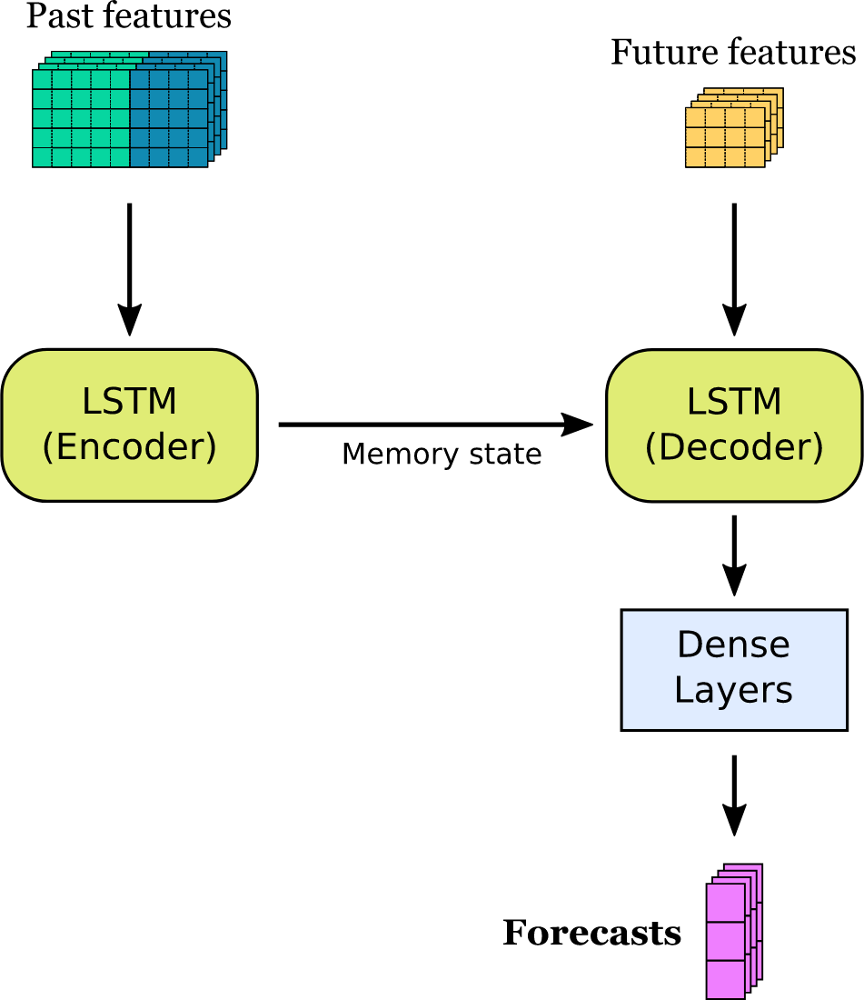

LSTM AutoEncoder model

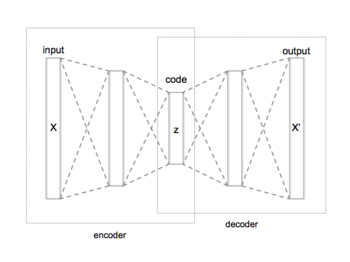

### 6.3.1 LSTM_base_model class

In [23]:
# custome defined call back function to reduce the logging
class LSTMLogger(Callback):
  def __init__(self, display=100):
    '''
        display: Number of batches to wait before outputting loss
        '''
    self.display = display

  def on_epoch_end(self, epoch, logs=None):
    if epoch % self.display == 0:
        # you can access loss, accuracy from logs
        print('Epoch: %02d - loss: %.6f - - val_loss:  %.6f' % (epoch+1, logs['loss'], logs['val_loss']))

class MyModel(Model):

  def __init__(self,n_features=16):
    super(MyModel, self).__init__()
    self.lstm1 = LSTM(units = 32,  return_sequences = True)
    self.dropout1 = Dropout(0.2)
    self.lstm2 = LSTM(units =16, return_sequences = False)
    self.dense1 = Dense(16, activation='relu')
    self.dense2 = Dense(16, activation='relu')
    self.output1 = Dense(1,activation='relu')
    
  def call(self, inputs):
    x = self.lstm1(inputs)
    x = self.dropout1(x)
    x = self.lstm2(x)
    x = self.dropout1(x)
    x = self.dense1(x)
    x = self.dense2(x)
    x = self.output1(x)
    print(x.shape)
    print(inputs.shape)

    return inputs+x

class ResidualWrapper(Model):
  def __init__(self, model):
    super().__init__()
    self.model = model

  def call(self, inputs, *args, **kwargs):
    delta = self.model(inputs, *args, **kwargs)

    # The prediction for each timestep is the input
    # from the previous time step plus the delta
    # calculated by the model.
    return inputs + delta

In [24]:
class LSTM_base_model:
  def __init__(self, n_forecast=1 ):
    self.n_forecast = n_forecast
    
  def LSTM_simple_model_detrended_data(self,layer_parameters=dict(), time_steps = 7,n_forecast = 7, n_features=1 , model_name=None):
    
    model_input = Input(shape=(time_steps, n_features))
    
    x = LSTM(units = layer_parameters["LSTM_layer1"],  return_sequences = True)(model_input)
    x = Dropout(0.2)(x)
    x = LSTM(units =layer_parameters["LSTM_layer2"], return_sequences = False)(x)
    x = Dropout(0.2)(x)
    
    x = Dense(units = n_forecast)(x)
    model = Model(model_input, x, name=model_name)
    return model
    
  def LSTM_simple_model(self,layer_parameters=dict(), time_steps = 7,n_forecast = 7, n_features=1,model_name=None ):
    
    model_input = Input(shape=(time_steps, n_features))
    
    x = LSTM(units = layer_parameters["LSTM_layer1"],  return_sequences = True)(model_input)
    x = Dropout(0.2)(x)
    x = LSTM(units =layer_parameters["LSTM_layer2"], return_sequences = False)(x)
    x = Dropout(0.2)(x)
    x = Dense(layer_parameters["Dense_layer1"],activation='relu')(x)
    x = Dense(layer_parameters["Dense_layer2"], activation='relu')(x)

    x = Dense(units = n_forecast, activation='relu')(x)
    model = Model(model_input, x, name=model_name)
    return model
  
  def CNN_LSTM_encoder_decoder(self,layer_parameters=dict(), time_steps = 7,n_forecast = 7, n_features=1, n_deterministic_features=4, n_subtime_steps=1,model_name=None):
    # (samples, time, rows, cols, channels)
    # CNN LSTM part input shape - [sub_timesteps, rows=1, cols=time_steps/n_subtime_steps, channels]
    past_inputs = Input(shape=(n_subtime_steps, 1, int(time_steps/n_subtime_steps), n_features))
    x = ConvLSTM2D(filters=layer_parameters["ConvLSTM2D_layer1"], kernel_size=layer_parameters["kernel_size_layer1"],return_sequences=True)(past_inputs)
    x = LeakyReLU()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)
    x = Flatten()(x)
    x = RepeatVector(n_forecast)(x)
 
    # First branch of the net is an lstm which finds an embedding for the past
    # Encoding the past
    encoder = LSTM(layer_parameters["LSTM_layer1"], return_state=True)
    encoder_outputs, state_h, state_c = encoder(x)
    
    future_inputs = Input(shape=(n_forecast, n_deterministic_features), name='future_inputs')
    # Combining future inputs with recurrent branch output
    decoder_lstm = LSTM(layer_parameters["LSTM_layer1"], return_sequences=True)
    x = decoder_lstm(future_inputs,
                    initial_state=[state_h, state_c])
    x = Dense(layer_parameters["Dense_layer1"], activation='relu')(x)
    x = Dense(layer_parameters["Dense_layer2"], activation='relu')(x)
    output = Dense(units = n_forecast, activation='relu')(x)

    model = Model(inputs=[past_inputs, future_inputs], outputs=output,name=model_name)
    return model

  def LSTM_model_with_extra_features(self,layer_parameters=dict(), time_steps = 7,n_forecast = 7, n_features=1, n_deterministic_features=4, n_subtime_steps=1,model_name=None):
    
    mdl_input1 = Input(shape=(time_steps, n_features))
    
    x = LSTM(units = layer_parameters["LSTM_layer1"],  return_sequences = True)(mdl_input1)
    x = Dropout(0.2)(x)
    x = LSTM(units =layer_parameters["LSTM_layer2"])(x)
    x = Dropout(0.2)(x)

    mdl_input2 = Input(shape=(n_deterministic_features,))
    #Add extra features in the middle
    concat = Concatenate()([x, mdl_input2])

    x = Dense(layer_parameters["Dense_layer1"], activation='relu')(concat)
    x = Dense(layer_parameters["Dense_layer2"], activation='relu')(x)
    output = Dense(units = n_forecast, activation='relu')(x)

    model = Model(inputs=[mdl_input1, mdl_input2], outputs=output, name=model_name)
    return model

  def LSTM_encoder_decoder(self,layer_parameters=dict(),time_steps = 7,n_forecast = 7, n_features=1, n_deterministic_features=4,model_name=None):

    # First branch of the net is an lstm which finds an embedding for the past
    past_inputs = Input(shape=(time_steps, n_features), name='past_inputs')
    # Encoding the past
    encoder = LSTM(layer_parameters["LSTM_layer1"], return_state=True)
    encoder_outputs, state_h, state_c = encoder(past_inputs)
    
    future_inputs = Input(shape=(n_forecast, n_deterministic_features), name='future_input_1')
    # Combining future inputs with recurrent branch output
    decoder_lstm = LSTM(layer_parameters["LSTM_layer1"], return_sequences=True)
    x = decoder_lstm(future_inputs,
                    initial_state=[state_h, state_c])
    x = Dense(layer_parameters["Dense_layer1"], activation='relu')(x)
    x = Dense(layer_parameters["Dense_layer2"], activation='relu')(x)
    
    output = Dense(units = n_forecast, activation='relu')(x)

    model = Model(inputs=[past_inputs, future_inputs], outputs=output,name=model_name)
    return model

  def LSTM_encoder_decoder_with_resnet(self,layer_parameters=dict(),time_steps = 7,n_forecast = 7, n_features=1, n_deterministic_features=4,model_name=None):

      # First branch of the net is an lstm which finds an embedding for the past
      past_inputs = Input(shape=(time_steps, n_features), name='past_inputs')
      # Encoding the past
      encoder = LSTM(layer_parameters["LSTM_layer1"], return_state=True)
      encoder_outputs, state_h, state_c = encoder(past_inputs)
      
      future_inputs = Input(shape=(n_forecast, n_deterministic_features), name='future_input_1')
      # Combining future inputs with recurrent branch output
      decoder_lstm = LSTM(layer_parameters["LSTM_layer1"], return_sequences=True)
      x = decoder_lstm(future_inputs,
                      initial_state=[state_h, state_c])
      # Final step: Add shortcut value to main path, and pass it through a RELU activation
      x = Add()([x, past_inputs])

      x = Dense(layer_parameters["Dense_layer1"], activation='relu')(x)
      x = Dense(layer_parameters["Dense_layer2"], activation='relu')(x)
      
      output = Dense(units = n_forecast, activation='relu')(x)

      model = Model(inputs=[past_inputs, future_inputs], outputs=output,name=model_name)
      return model

  def LSTM_auto_encoder_MLP(self, layer_parameters=dict(),n_encoded_features=5, n_timesteps=7, n_forecast=7,n_deterministic_features=4, model_name=None ):
    
    past_inputs = Input(shape=(n_encoded_features), name='encoded_inputs')
    future_inputs = Input(shape=(n_deterministic_features), name='future_input_1')
    x = Dense(64, activation='relu')(future_inputs)
    x = concatenate([x, past_inputs])
    x = Dense(64, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    output = Dense(units = n_forecast, activation='relu')(x)
    
    model = Model(inputs=[past_inputs,future_inputs], outputs=output,name=model_name)
    return model

  def prepare_auto_encoder_output(self,model_name, X_train, X_validation, X_test):
    
    train_encoded,validation_encoded,test_encoded = [],[],[]

    fileExists, model_file = model_utility().CheckPointModelExisting(model_name)
    if fileExists == True:
      auto_encoder_model = load_model(model_file)
      print('>loaded %s' % model_file)
      encoder = Model(inputs=auto_encoder_model.inputs, outputs=auto_encoder_model.layers[5].output,name=model_name+'encoder')
      train_encoded = encoder.predict(X_train)
      validation_encoded = encoder.predict(X_validation)
      test_encoded = encoder.predict(X_test)

    return train_encoded,validation_encoded,test_encoded

  def LSTM_encoder_decoder_detrended_data(self,layer_parameters=dict(), time_steps = 7,n_forecast = 7, n_features=1, n_deterministic_features=4,model_name=None):
                                              

    # First branch of the net is an lstm which finds an embedding for the past
    past_inputs = Input(shape=(time_steps, n_features), name='past_inputs')
    # Encoding the past
    encoder = LSTM(layer_parameters["LSTM_layer1"], return_state=True)
    encoder_outputs, state_h, state_c = encoder(past_inputs)
    
    
    future_inputs = Input(shape=(n_forecast, n_deterministic_features), name='future_input_2')
    # Combining future inputs with recurrent branch output
    decoder_lstm = LSTM(layer_parameters["LSTM_layer1"], return_sequences=True)
    x = decoder_lstm(future_inputs,
                    initial_state=[state_h, state_c])
    x = Dense(layer_parameters["Dense_layer1"], activation='tanh')(x)
    x = Dense(layer_parameters["Dense_layer2"], activation='tanh')(x)
    output = Dense(units = n_forecast)(x)

    model = Model(inputs=[past_inputs, future_inputs], outputs=output,name=model_name)
    return model

  def LSTM_auto_encoder(self,layer_parameters=dict(),time_steps = 7,n_forecast = 7, n_features= 7, n_out_features=1,model_name=None):

    model_input = Input(shape=(time_steps, n_features))
    # encoder
    x = LSTM(layer_parameters["LSTM_layer1"], activation='relu', return_sequences=True)(model_input)
    x = Dropout(0.2)(x)
    x = LSTM(layer_parameters["LSTM_layer2"], activation='relu', return_sequences=True)(x)
    x = Dropout(0.2)(x)
    output = LSTM(n_out_features, activation='relu')(x)
    x = RepeatVector(time_steps)(output)
    # decoder
    x = LSTM(layer_parameters["LSTM_layer2"], activation='relu', return_sequences=True)(x)
    x = Dropout(0.2)(x)
    x = LSTM(layer_parameters["LSTM_layer1"], activation='relu', return_sequences=True)(x)
    x = Dropout(0.2)(x)
    x = TimeDistributed(Dense(n_features))(x)
       
    model = Model(model_input, x, name=model_name)
    return model

  def ensemble(self,models, model_name=None):

    outputs = [model.outputs[0] for model in models]
    y = Average()(outputs)

    for i in range(len(models)):
      model = models[i]
      for layer in model.layers:
        # rename to avoid 'unique layer name' issue
        layer._name = 'default_ensemble_' + str(i+1) + '_' + layer.name

    model_inputs = [model.input for model in models]
    print(model_inputs)
    model = Model(model_inputs, y, name=model_name )
    return model

  # load models from file
  def load_all_LSTM_models(self,model_files):
    all_models = list()
    for filename in model_files:
      # load model from file
      model = load_model(filename)
      # add to list of members
      all_models.append(model)
      print('>loaded %s' % filename)
    return all_models
  
  # define stacked model from multiple member input models
  def define_stacked_LSTM_ensemble_model(self, members):
    # update all layers in all models to not be trainable
    for i in range(len(members)):
      model = members[i]
      for layer in model.layers:
        # make not trainable
        layer.trainable = False
        # rename to avoid 'unique layer name' issue
        layer._name = 'ensemble_' + str(i+1) + '_' + layer.name
    # define multi-headed input
    ensemble_visible = [model.input for model in members]
    # concatenate merge output from each model
    model_output_list = []
    for model in members:
      if len(model.output.shape) <= 2:
        model_output = Reshape((-1,1))(model.output)
        print(model_output.shape)
        model_output_list.append(model_output)
      else:
        model_output_list.append(model.output)
    ensemble_outputs = [model_output for model_output in model_output_list]
    merge = concatenate(ensemble_outputs)
    hidden = Dense(32, activation='relu')(merge)
    hidden = Dense(16, activation='relu')(hidden)
    output = Dense(1, activation='relu')(hidden)
    model = Model(inputs=ensemble_visible, outputs=output)
    # compile
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')
    return model
  
  # fit a stacked model
  def fit_stacked_LSTM_model(self, model, X_train, y_train,X_validation, y_validation,name):
    # prepare input data
    checkpoint_path = 'saved_model_' + name +'16.hdf5'
    fileExists, model_file = model_utility().CheckPointModelExisting(name)
    if fileExists == False:
      # train the model from scratch
      cp_callbacks = [ ModelCheckpoint(filepath=checkpoint_path,
                                                      save_weights_only=False,
                                                      monitor='val_loss',
                                                      mode='min',
                                                      save_best_only=True,
                                                      verbose=0)]
      # fit model
      model.fit(X_train, y_train, epochs=300, verbose=1,validation_data=(X_validation, y_validation), callbacks=cp_callbacks)
    
    model_object = load_model(checkpoint_path)
    return model_object
  

  def train_stacked_LSTM_ensemble_model(self,model_files,X_train,y_train,X_validation, y_validation, name):
    members = self.load_all_LSTM_models(model_files)
    print('Loaded %d models' % len(members))
    # define ensemble model
    stacked_model = self.define_stacked_LSTM_ensemble_model(members)
    # fit stacked model on test dataset
    stacked_model = self.fit_stacked_LSTM_model(stacked_model, X_train, y_train,X_validation, y_validation,name)
    #stacked_model.fit(X_test, y_test, epochs=300, verbose=1)
    return stacked_model

  def scheduler(self, epoch,lr):
    if epoch < 50:
      return 0.001
    elif epoch < 400:
      return 0.0001
    else: 
      return 0.00001
  

  def compile_and_train(self,model, data_set_dict,  num_epochs = 10, batch_size=16, learning_rate = 0.0001,compile=True): 
  
    lr_schedule = LearningRateScheduler(self.scheduler, verbose=0)

    if compile == True:
      opt = optimizers.Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=True)
      model.compile(optimizer = opt, loss = 'mean_squared_error')
    else:
      # update the learning rate
      print("[INFO] old learning rate: {}".format(
        K.get_value(model.optimizer.lr)))
      K.set_value(model.optimizer.lr, learning_rate)
      print("[INFO] new learning rate: {}".format(
        K.get_value(model.optimizer.lr)))
          
     # Output loss every 100 epochs
    logger = LSTMLogger(display=100)

    checkpoint_path = 'saved_model_' + model.name +str(batch_size)+str(learning_rate)+'.hdf5'
    cp_callbacks = [ ModelCheckpoint(filepath=checkpoint_path,
                                                    save_weights_only=False,
                                                    monitor='val_loss',
                                                    mode='min',
                                                    save_best_only=True,
                                                    verbose=0),
                    logger
                    
                    ]
    
    history = model.fit(data_set_dict["X_train"], data_set_dict["y_train"], epochs = num_epochs, 
                                validation_data=(data_set_dict["X_validation"], data_set_dict["y_validation"]), 
                                batch_size = batch_size, callbacks=cp_callbacks, verbose=0)
        
    return history.history['loss'], history.history['val_loss'] , checkpoint_path

  
  def plot_history(self, train_loss, val_loss):
      from matplotlib import pyplot
      fig = pyplot.figure(figsize=(16,8))
      pyplot.plot(train_loss, label='train')
      pyplot.plot(val_loss, label='validation')
      pyplot.plot(np.argmin(val_loss), np.min(val_loss), marker="x", color="r", label="best model")
      pyplot.legend()
      pyplot.show()

  

### 6.3.2 LSTM_model_train_and_evaluation class

In [25]:
class LSTM_model_train_and_evaluation:
  def __init__(self):
    self.lstm_model_parameters = { "time_steps": global_parameters['n_timesteps'], "forecast_steps":global_parameters['n_forecast_steps'],
                         "features":len(global_parameters['input_cols_neural_networks']), "deterministic_features":len(global_parameters['deterministic_features']),
                         "sub_timesteps":1, "batch_size": [16],"learning_rate":[0.0001] , "n_out_features": 5,
                          "lstm_layer_parameters": { "cnn_lstm_encoder_decoder" : { "ConvLSTM2D_layer1" : 4, "kernel_size_layer1": (1,3), "LSTM_layer1": 8,"Dense_layer1": 8, "Dense_layer2":8 },                   
                                                      "lstm_encoder_decoder" :{ "LSTM_layer1": 16,"Dense_layer1": 8, "Dense_layer2":8 },
                                                      "lstm_encoder_decoder_detrend": { "LSTM_layer1": 32,"Dense_layer1": 16, "Dense_layer2":16},
                                                      "lstm_simple_model": {  "LSTM_layer1": 32, "LSTM_layer2": 16,"Dense_layer1": 16, "Dense_layer2":16 },
                                                      "lstm_simple_model_detrend": { "LSTM_layer1": 32, "LSTM_layer2": 16, "Dense_layer1": 16, "Dense_layer2":16 },
                                                      "lstm_auto_encoder": { "LSTM_layer1": 16, "LSTM_layer2": 16},
                                                      "cnn_lstm_encoder_decoder_outlier_removed" : { "ConvLSTM2D_layer1" : 4, "kernel_size_layer1": (1,3), "LSTM_layer1": 8,"Dense_layer1": 8, "Dense_layer2":8 },                   
                                                      "lstm_encoder_decoder_outlier_removed" :{ "LSTM_layer1": 8,"Dense_layer1": 8, "Dense_layer2":8 },
                                                      "lstm_simple_model_outlier_removed": {  "LSTM_layer1": 32, "LSTM_layer2": 16,"Dense_layer1": 16, "Dense_layer2":16 },
                                                      "lstm_encoder_decoder_outlier_removed_resnet" :{ "LSTM_layer1": 32,"Dense_layer1": 8, "Dense_layer2":8 },
                                                      "lstm_simple_model_resnet": {  "LSTM_layer1": 64, "LSTM_layer2": 32,"LSTM_layer3": 16,"LSTM_layer4": 16,"Dense_layer1": 16, "Dense_layer2":16 },
                                                      "lstm_model_with_extra_features":{ "LSTM_layer1": 16,"LSTM_layer2": 16,"Dense_layer1": 8, "Dense_layer2":8 }
                                                   },
                         "ensemble_lstm" : ["lstm_encoder_decoder",
                                            "cnn_lstm_encoder_decoder"],
                         "ensemble_lstm_outlier_removed" : ["lstm_encoder_decoder_outlier_removed",
                                                            "cnn_lstm_encoder_decoder_outlier_removed"],
                         "ensemble_lstm_with_auto_encoder" : ["lstm_encoder_decoder_outlier_removed",
                                                            "cnn_lstm_encoder_decoder_outlier_removed",
                                                            "lstm_auto_encoder_MLP"],
                         "stacked_ensemble_lstm1" :["lstm_encoder_decoder","cnn_lstm_encoder_decoder",
                                                    "lstm_encoder_decoder_outlier_removed",
                                                    "cnn_lstm_encoder_decoder_outlier_removed"],
                        "stacked_ensemble_lstm2": ["lstm_encoder_decoder_outlier_removed",
                                                   "cnn_lstm_encoder_decoder_outlier_removed"],
                        "stacked_ensemble_lstm3": ["lstm_encoder_decoder_outlier_removed",
                                                   "cnn_lstm_encoder_decoder_outlier_removed",
                                                   "lstm_auto_encoder_MLP"],
                        "stacked_ensemble_lstm4" :["lstm_encoder_decoder",
                                                   "cnn_lstm_encoder_decoder",
                                                   "lstm_encoder_decoder_outlier_removed",
                                                   "cnn_lstm_encoder_decoder_outlier_removed",
                                                   "lstm_auto_encoder_MLP"],
                        "ensemble_of_ensembles_lstm1" :["stacked_ensemble_lstm1",
                                                   "stacked_ensemble_lstm2",
                                                   "stacked_ensemble_lstm3",
                                                   "stacked_ensemble_lstm4"],
                        "ensemble_of_ensembles_lstm2" :["stacked_ensemble_lstm2",
                                                       "stacked_ensemble_lstm4"],
                        "ensemble_of_ensembles_lstm3":["stacked_ensemble_lstm1",
                                                   "stacked_ensemble_lstm2"]
     
                      }

  # prepare a list of ml models
  def get_LSTM_models(self):    
    models = dict()
    n_timesteps = self.lstm_model_parameters['time_steps']
    n_forecast_steps = self.lstm_model_parameters['forecast_steps']
    n_features = self.lstm_model_parameters['features']
    n_deterministic_features = self.lstm_model_parameters['deterministic_features']
    sub_timesteps = self.lstm_model_parameters['sub_timesteps']
    n_out_auto_encoder_features = self.lstm_model_parameters['n_out_features']
    
    layer_params = self.lstm_model_parameters["lstm_layer_parameters"]

    
    models['lstm_encoder_decoder'] = LSTM_base_model().LSTM_encoder_decoder(layer_params['lstm_encoder_decoder'],n_timesteps,n_forecast_steps, n_features,n_deterministic_features,'lstm_encoder_decoder')
    models['lstm_simple_model'] = LSTM_base_model().LSTM_simple_model(layer_params['lstm_simple_model'],n_timesteps,n_forecast_steps, n_features,'lstm_simple_model')
    #models['lstm_auto_encoder'] = LSTM_base_model().LSTM_auto_encoder(layer_params['lstm_auto_encoder'],n_timesteps,n_forecast_steps, n_features, n_out_auto_encoder_features,'lstm_auto_encoder')
    models['cnn_lstm_encoder_decoder'] = LSTM_base_model().CNN_LSTM_encoder_decoder(layer_params['cnn_lstm_encoder_decoder'],n_timesteps,n_forecast_steps, n_features,n_deterministic_features,sub_timesteps,'cnn_lstm_encoder_decoder')
  
    models['lstm_encoder_decoder_outlier_removed'] = LSTM_base_model().LSTM_encoder_decoder(layer_params['lstm_encoder_decoder_outlier_removed'],n_timesteps,n_forecast_steps, n_features,n_deterministic_features,'lstm_encoder_decoder_outlier_removed')
    models['cnn_lstm_encoder_decoder_outlier_removed'] = LSTM_base_model().CNN_LSTM_encoder_decoder(layer_params['cnn_lstm_encoder_decoder_outlier_removed'],n_timesteps,n_forecast_steps, n_features,n_deterministic_features,sub_timesteps,'cnn_lstm_encoder_decoder_outlier_removed')
    models['lstm_simple_model_outlier_removed'] = LSTM_base_model().LSTM_simple_model(layer_params['lstm_simple_model_outlier_removed'],n_timesteps,n_forecast_steps, n_features,'lstm_simple_model_outlier_removed')
    models['lstm_auto_encoder_MLP'] = LSTM_base_model().LSTM_auto_encoder_MLP(layer_params['lstm_auto_encoder'],n_out_auto_encoder_features, n_timesteps,n_forecast_steps,n_deterministic_features,'lstm_auto_encoder_MLP')
    
    print('Defined %d models' % len(models))
    return models

  def create_LSTM_train_datasets(self):
    # create dictonary to store different datasets
    # keys : LSTM, LSTM_detrend
    dataset_dict = {}
    # prepare LSTM datasets
    input_cols = global_parameters['input_cols_neural_networks']
    deterministic_features = global_parameters['deterministic_features']
    n_timesteps= global_parameters['n_timesteps']
    n_forecast_steps = global_parameters['n_forecast_steps']

    n_deterministic_features = len(deterministic_features)
    # create train/test/validaton split with detrend data
    LSTM_model_dataset = train_test_validation_data_set(data_final_detrended)
    X_train_lstm_detrend, y_train_lstm_detrend, X_validation_lstm_detrend,y_validation_lstm_detrend, X_test_lstm_detrend, y_test_lstm_detrend, deterministic_train_detrend,deterministic_validation_detrend, deterministic_test_detrend, n_features_detrend = LSTM_model_dataset.prepare_LSTM_datasets(n_timesteps=n_timesteps, n_forecast_steps = n_forecast_steps, input_cols = input_cols, 
            deterministic_features=deterministic_features,shuffle=True)
    test_trend_values = data_final_detrended['trend'][-len(y_test_lstm_detrend):]
    test_seasonal_values = data_final_detrended['seas'][-len(y_test_lstm_detrend):]

    # create the LSTM data set
    LSTM_model_dataset = train_test_validation_data_set(data_final)
    X_train_lstm, y_train_lstm, X_validation_lstm, y_validation_lstm, X_test_lstm, y_test_lstm, deterministic_train, deterministic_validation, deterministic_test,n_features = LSTM_model_dataset.prepare_LSTM_datasets(n_timesteps=n_timesteps, n_forecast_steps = n_forecast_steps, 
                                                              input_cols = input_cols, deterministic_features=deterministic_features, shuffle=True)
    
    # create the LSTM data set with outlier removed data
    LSTM_model_dataset = train_test_validation_data_set(data_outliersremoved)
    X_train_lstm_outlier, y_train_lstm_outlier, X_validation_lstm_outlier, y_validation_lstm_outlier, X_test_lstm_outlier, y_test_lstm_outlier, deterministic_train_outlier, deterministic_validation_outlier, deterministic_test_outlier,n_features = LSTM_model_dataset.prepare_LSTM_datasets(n_timesteps=n_timesteps, n_forecast_steps = n_forecast_steps, 
                                                              input_cols = input_cols, deterministic_features=deterministic_features, validation=False,shuffle=True)
    

    

    sub_timesteps = self.lstm_model_parameters['sub_timesteps']
    n_timesteps = self.lstm_model_parameters['time_steps']

    # [samples, sub_timesteps, rows=1, cols=time_steps/n_subtime_steps, channels]
    X_train_CNN_LSTM = np.reshape(X_train_lstm,(X_train_lstm.shape[0], sub_timesteps, 1,int(n_timesteps/sub_timesteps),n_features))
    X_validation_CNN_LSTM = np.reshape(X_validation_lstm,(X_validation_lstm.shape[0], sub_timesteps, 1,int(n_timesteps/sub_timesteps),n_features))
    X_test_CNN_LSTM = np.reshape(X_test_lstm,(X_test_lstm.shape[0], sub_timesteps, 1,int(n_timesteps/sub_timesteps),n_features))
    
    #outlier removed data
    X_train_CNN_LSTM_outlier = np.reshape(X_train_lstm_outlier,(X_train_lstm_outlier.shape[0], sub_timesteps, 1,int(n_timesteps/sub_timesteps),n_features))
    X_validation_CNN_LSTM_outlier = np.reshape(X_validation_lstm_outlier,(X_validation_lstm_outlier.shape[0], sub_timesteps, 1,int(n_timesteps/sub_timesteps),n_features))
    X_test_CNN_LSTM_outlier = np.reshape(X_test_lstm_outlier,(X_test_lstm_outlier.shape[0], sub_timesteps, 1,int(n_timesteps/sub_timesteps),n_features))
     
    # extra deteministic feature shape
    deterministic_train_extra_features = np.reshape(deterministic_train_outlier,(X_train_lstm_outlier.shape[0],n_deterministic_features))
    deterministic_validation_extra_features = np.reshape(deterministic_validation_outlier,(X_validation_lstm_outlier.shape[0],n_deterministic_features))
    deterministic_test_extra_features = np.reshape(deterministic_test_outlier,(X_test_lstm_outlier.shape[0],n_deterministic_features))

    # prepare encoded data from auto encoder
    X_train_encoded,X_validation_encoded,X_test_encoded = LSTM_base_model().prepare_auto_encoder_output('lstm_auto_encoder', X_train_lstm_outlier, X_validation_lstm_outlier, X_test_lstm_outlier)
    _,X_validation_encoded_with_outlier,_ = LSTM_base_model().prepare_auto_encoder_output('lstm_auto_encoder', X_train_lstm, X_validation_lstm, X_test_lstm)

    deterministic_train_auto_encoder = deterministic_train_outlier.reshape((deterministic_train_outlier.shape[0],n_deterministic_features))
    deterministic_validation_auto_encoder = deterministic_validation_outlier.reshape((deterministic_validation_outlier.shape[0],n_deterministic_features))
    deterministic_test_auto_encoder = deterministic_test_outlier.reshape((deterministic_test_outlier.shape[0],n_deterministic_features))
    deterministic_validation_auto_encoder_with_outlier = deterministic_validation.reshape((deterministic_validation.shape[0],n_deterministic_features))

    lstm_data_set_dict = {             
                    "lstm_encoder_decoder" :{ "X_train" : [X_train_lstm,deterministic_train], "y_train": y_train_lstm, "X_validation": [X_validation_lstm,deterministic_validation],
                                                "y_validation":y_validation_lstm, "X_test": [X_test_lstm,deterministic_test],"y_test":y_test_lstm , "epochs":1000},
                  "lstm_encoder_decoder_detrend": { "X_train" : [X_train_lstm_detrend,deterministic_train_detrend], "y_train": y_train_lstm_detrend, "X_validation": [X_validation_lstm_detrend,deterministic_validation_detrend],
                                                "y_validation":y_validation_lstm_detrend , "X_test": [X_test_lstm_detrend,deterministic_test_detrend],"y_test":y_test_lstm_detrend, "epochs":1000},
                  "lstm_simple_model": { "X_train" : X_train_lstm, "y_train": y_train_lstm, "X_validation": X_validation_lstm,"y_validation":y_validation_lstm ,
                                        "X_test": X_test_lstm,"y_test":y_test_lstm,"epochs":500 },
                  "lstm_simple_model_detrend": { "X_train" : X_train_lstm_detrend, "y_train": y_train_lstm_detrend, "X_validation": X_validation_lstm_detrend,
                                                "y_validation":y_validation_lstm_detrend, "X_test": X_test_lstm_detrend,"y_test":y_test_lstm_detrend , "epochs":500},
                  #"lstm_auto_encoder": { "X_train" : X_train_lstm, "y_train": y_train_lstm, "X_validation": X_validation_lstm,
                   #                             "y_validation":y_validation_lstm, "X_test": X_test_lstm,"y_test":y_test_lstm,"epochs":1000 },
                  "lstm_auto_encoder_MLP" : { "X_train" : [X_train_encoded,deterministic_train_auto_encoder], "y_train": y_train_lstm_outlier, "X_validation": [X_validation_encoded,deterministic_validation_auto_encoder],
                                                "y_validation":y_validation_lstm_outlier, "X_test": [X_test_encoded,deterministic_test_auto_encoder],"y_test":y_test_lstm_outlier,"epochs":10000 }, 
                  "lstm_auto_encoder": { "X_train" : X_train_lstm_outlier, "y_train": X_train_lstm_outlier, "X_validation": X_validation_lstm_outlier,
                                                "y_validation":X_validation_lstm_outlier, "X_test": X_test_lstm_outlier,"y_test":X_test_lstm_outlier,"epochs":1000 },
                        
                  "cnn_lstm_encoder_decoder" : { "X_train" : [X_train_CNN_LSTM,deterministic_train], "y_train": y_train_lstm, "X_validation": [X_validation_CNN_LSTM,deterministic_validation],
                                                "y_validation":y_validation_lstm, "X_test": [X_test_CNN_LSTM,deterministic_test],"y_test":y_test_lstm, "epochs":3000 },
                  "lstm_encoder_decoder_outlier_removed" :{ "X_train" : [X_train_lstm_outlier,deterministic_train_outlier], "y_train": y_train_lstm_outlier, "X_validation": [X_validation_lstm_outlier,deterministic_validation_outlier],
                                                "y_validation":y_validation_lstm_outlier, "X_test": [X_test_lstm_outlier,deterministic_test_outlier],"y_test":y_test_lstm_outlier,"epochs":1500 },
                  "lstm_simple_model_outlier_removed": { "X_train" : X_train_lstm_outlier, "y_train": y_train_lstm_outlier, "X_validation": X_validation_lstm_outlier,"y_validation":y_validation_lstm_outlier ,
                                        "X_test": X_test_lstm_outlier,"y_test":y_test_lstm_outlier,"epochs":500 },
                  "cnn_lstm_encoder_decoder_outlier_removed" : { "X_train" : [X_train_CNN_LSTM_outlier,deterministic_train_outlier], "y_train": y_train_lstm_outlier, "X_validation": [X_validation_CNN_LSTM_outlier,deterministic_validation_outlier],
                                                "y_validation":y_validation_lstm_outlier, "X_test": [X_test_CNN_LSTM_outlier,deterministic_test_outlier],"y_test":y_test_lstm_outlier,"epochs":1500 },       
                  "ensemble_lstm" : { "X_test": [[X_test_lstm,deterministic_test],[X_test_CNN_LSTM,deterministic_test]],"y_test":y_test_lstm},
                  "ensemble_lstm_outlier_removed" : { "X_test": [[X_test_lstm_outlier,deterministic_test_outlier],[X_test_CNN_LSTM_outlier,deterministic_test_outlier]],"y_test":y_test_lstm_outlier},
                  "ensemble_lstm_with_auto_encoder" : {"X_test": [
                                                                  [X_test_lstm_outlier,deterministic_test_outlier],
                                                                  [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                                  [X_test_encoded,deterministic_test_auto_encoder]
                                                                  ],"y_test":y_test_lstm_outlier},
                  
                  "lstm_encoder_decoder_outlier_removed_resnet" :{ "X_train" : [X_train_lstm_outlier,deterministic_train_outlier], "y_train": y_train_lstm_outlier, "X_validation": [X_validation_lstm_outlier,deterministic_validation_outlier],
                                                "y_validation":y_validation_lstm_outlier, "X_test": [X_test_lstm_outlier,deterministic_test_outlier],"y_test":y_test_lstm_outlier,"epochs":50 },
                  "lstm_simple_model_resnet": { "X_train" : X_train_lstm_outlier, "y_train": y_train_lstm_outlier, "X_validation": X_validation_lstm_outlier,"y_validation":y_validation_lstm_outlier ,
                                        "X_test": X_test_lstm_outlier,"y_test":y_test_lstm_outlier,"epochs":10 },
                   "lstm_model_with_extra_features" :{ "X_train" : [X_train_lstm_outlier,deterministic_train_extra_features], "y_train": y_train_lstm_outlier, "X_validation": [X_validation_lstm_outlier,deterministic_validation_extra_features],
                                                "y_validation":y_validation_lstm_outlier, "X_test": [X_test_lstm_outlier,deterministic_test_extra_features],"y_test":y_test_lstm_outlier,"epochs":2000 } ,                       

                  "stacked_ensemble_lstm1":  {  "X_validation": [
                                                                 [X_validation_lstm,deterministic_validation],
                                                                 [X_validation_CNN_LSTM,deterministic_validation],
                                                                 [X_validation_lstm,deterministic_validation],
                                                                 [X_validation_CNN_LSTM,deterministic_validation]],
                                                "y_validation":y_validation_lstm, 
                                              "X_test": [[X_test_lstm_outlier,deterministic_test_outlier],
                                                         [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                         [X_test_lstm_outlier,deterministic_test_outlier],
                                                         [X_test_CNN_LSTM_outlier,deterministic_test_outlier]
                                                         ],
                                              "y_test":y_test_lstm_outlier},
                  "stacked_ensemble_lstm2":  {  "X_validation": [
                                                                 [X_train_lstm_outlier,deterministic_train_outlier],
                                                                 [X_train_CNN_LSTM_outlier,deterministic_train_outlier]
                                                                 ],"y_validation":y_train_lstm_outlier, 
                                              "X_test": [[X_test_lstm_outlier,deterministic_test_outlier],
                                                         [X_test_CNN_LSTM_outlier,deterministic_test_outlier]],
                                              "y_test":y_test_lstm_outlier},
                   "stacked_ensemble_lstm3":  {  "X_validation": [[X_train_lstm_outlier,deterministic_train_outlier],
                                                                  [X_train_CNN_LSTM_outlier,deterministic_train_outlier],
                                                                  [X_train_encoded,deterministic_train_auto_encoder]
                                                                  ],
                                               "y_validation":y_train_lstm_outlier, 
                                                  "X_test": [[X_test_lstm_outlier,deterministic_test_outlier],
                                                             [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                             [X_test_encoded,deterministic_test_auto_encoder]
                                                             ],
                                               "y_test":y_test_lstm_outlier},
                   "stacked_ensemble_lstm4":  {  "X_validation": [[X_validation_lstm,deterministic_validation],
                                                                  [X_validation_CNN_LSTM,deterministic_validation],
                                                                  [X_validation_lstm,deterministic_validation],
                                                                  [X_validation_CNN_LSTM,deterministic_validation],
                                                                  [X_validation_encoded_with_outlier,deterministic_validation_auto_encoder_with_outlier]
                                                  ],
                                                "y_validation":y_validation_lstm, 
                                                "X_test": [[X_test_lstm_outlier,deterministic_test_outlier],
                                                           [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                           [X_test_lstm_outlier,deterministic_test_outlier],
                                                           [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                           [X_test_encoded,deterministic_test_auto_encoder]],
                                               "y_test":y_test_lstm_outlier},
                  
                  "ensemble_of_ensembles_lstm1":  {  "X_validation":[ [
                                                          [X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation],
                                                          [X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation]
                                                          ],
                                                          [[X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation]
                                                          ],
                                                          [[X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation],
                                                          [X_validation_encoded_with_outlier,deterministic_validation_auto_encoder_with_outlier]
                                                          ],
                                                          [[X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation],
                                                          [X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation],
                                                          [X_validation_encoded_with_outlier,deterministic_validation_auto_encoder_with_outlier]
                                                        ]
                                                      ],
                                                "y_validation":y_validation_lstm, 
                                              
                                              "X_test": [[[X_test_lstm_outlier,deterministic_test_outlier],
                                                         [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                         [X_test_lstm_outlier,deterministic_test_outlier],
                                                         [X_test_CNN_LSTM_outlier,deterministic_test_outlier]
                                                         ],
                                                         [[X_test_lstm_outlier,deterministic_test_outlier],
                                                         [X_test_CNN_LSTM_outlier,deterministic_test_outlier]],
                                                         [[X_test_lstm_outlier,deterministic_test_outlier],
                                                          [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                          [X_test_encoded,deterministic_test_auto_encoder]
                                                         ],
                                                         [[X_test_lstm_outlier,deterministic_test_outlier],
                                                           [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                           [X_test_lstm_outlier,deterministic_test_outlier],
                                                           [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                           [X_test_encoded,deterministic_test_auto_encoder]]                                                         
                                                         ],
                                              "y_test":y_test_lstm_outlier
                                              },
                          "ensemble_of_ensembles_lstm2":  {  "X_validation":[ 
                                                          [[X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation]
                                                          ],
                                                          [[X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation],
                                                          [X_validation_lstm,deterministic_validation],
                                                          [X_validation_CNN_LSTM,deterministic_validation],
                                                          [X_validation_encoded_with_outlier,deterministic_validation_auto_encoder_with_outlier]
                                                        ]
                                                      ],
                                                "y_validation":y_validation_lstm, 
                                              
                                              "X_test": [
                                                         [[X_test_lstm_outlier,deterministic_test_outlier],
                                                         [X_test_CNN_LSTM_outlier,deterministic_test_outlier]],
                                                         [[X_test_lstm_outlier,deterministic_test_outlier],
                                                           [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                           [X_test_lstm_outlier,deterministic_test_outlier],
                                                           [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                                           [X_test_encoded,deterministic_test_auto_encoder]]                                                         
                                                         ],
                                              "y_test":y_test_lstm_outlier
                                              },
                          
                  "ensemble_of_ensembles_lstm3":  
                              {  "X_validation":[ [
                                              [X_validation_lstm,deterministic_validation],
                                              [X_validation_CNN_LSTM,deterministic_validation],
                                              [X_validation_lstm,deterministic_validation],
                                              [X_validation_CNN_LSTM,deterministic_validation]
                                              ],
                                              [[X_validation_lstm,deterministic_validation],
                                              [X_validation_CNN_LSTM,deterministic_validation]
                                              ]
                                          ],
                                    "y_validation":y_validation_lstm, 
                                  
                                  "X_test": [[[X_test_lstm_outlier,deterministic_test_outlier],
                                              [X_test_CNN_LSTM_outlier,deterministic_test_outlier],
                                              [X_test_lstm_outlier,deterministic_test_outlier],
                                              [X_test_CNN_LSTM_outlier,deterministic_test_outlier]
                                              ],
                                              [[X_test_lstm_outlier,deterministic_test_outlier],
                                              [X_test_CNN_LSTM_outlier,deterministic_test_outlier]
                                               ]                                                        
                                              ],
                                  "y_test":y_test_lstm_outlier
                             }
                   
    }
    return lstm_data_set_dict
  
  def train_LSTM_models(self,models=dict(), epochs=10):
    lstm_data_set_dict = self.create_LSTM_train_datasets()
    model_training_results =  dict()
    for name, model in models.items():  
      for batch_size in self.lstm_model_parameters["batch_size"]:
        for learning_rate in self.lstm_model_parameters["learning_rate"] :
          print(f"Now training {name}...")
          num_epochs = lstm_data_set_dict[name]['epochs']
          
          fileExists, model_file = model_utility().CheckPointModelExisting(name)
          if fileExists == True:
            #load the model with the checkpoint file
            print(model_file)
            model = load_model(model_file)
            compile = False;
            learning_rate = 0.0001
            num_epochs = 1000
            batch_size = 16
          else:
            compile = True
          print(f"number of epochs - {str(num_epochs)}")
          train_loss, val_loss, checkpoint_path = LSTM_base_model().compile_and_train(model,lstm_data_set_dict[name], num_epochs = num_epochs, batch_size=batch_size,learning_rate=learning_rate,compile=compile)
    
          train_loss = pd.DataFrame(train_loss, columns=['train_loss'])
          val_loss = pd.DataFrame(val_loss, columns=['val_loss'])
          plot_data_set = pd.concat([train_loss,val_loss], axis=1)
          model_utility().plotly_graphs(plot_data_set,name)

          model_training_results[name, batch_size, learning_rate] = {"model_weights": checkpoint_path, "val_loss": val_loss, "train_loss":train_loss }
    return model_training_results, lstm_data_set_dict
  
  def evaluate_LSTM_models(self,model_training_results,data_set_dict):
    models = self.get_LSTM_models()
    ensemble_models = {}
    ensemble_models['ensemble_lstm'] = []
    ensemble_models['ensemble_lstm_outlier_removed'] = []
    ensemble_models['ensemble_lstm_with_auto_encoder'] = []
    
    loss_values = {}
    for name, model_object in models.items():
      fileExists, model_file = model_utility().CheckPointModelExisting(name)
      if fileExists == True:
        #load the model with the checkpoint file
        print(model_file)
        model_object = load_model(model_file)

        predicts,y_actual, loss_values[name] = self.predict_model(model_object,data_set_dict[name]["X_test"],data_set_dict[name]["y_test"])
        print("best loss value", name, loss_values[name])
        predicts = pd.DataFrame(predicts, columns=['Predicted'])
        y_test_df = pd.DataFrame(y_actual, columns=['Actual'])
        plot_data_set = pd.concat([predicts,y_test_df], axis=1)
        model_utility().plotly_graphs(plot_data_set,name)

        if name in self.lstm_model_parameters["ensemble_lstm"]:
          ensemble_models['ensemble_lstm'].append(model_object)
        if name in self.lstm_model_parameters["ensemble_lstm_outlier_removed"]:
          ensemble_models['ensemble_lstm_outlier_removed'].append(model_object)
        if name in self.lstm_model_parameters["ensemble_lstm_with_auto_encoder"]:
          ensemble_models['ensemble_lstm_with_auto_encoder'].append(model_object)

    for ensemble_name in ['ensemble_lstm','ensemble_lstm_outlier_removed','ensemble_lstm_with_auto_encoder']:
      #evaluate simple ensemble models of different LSTM models
      ensemble_models[ensemble_name] = np.array(ensemble_models[ensemble_name])
      ensemble_model = LSTM_base_model().ensemble(ensemble_models[ensemble_name],ensemble_name)
      predicts, y_actual, loss_values[ensemble_name] = self.predict_model(ensemble_model, data_set_dict[ensemble_name]["X_test"],data_set_dict[ensemble_name]["y_test"] )
      
      predicts = pd.DataFrame(predicts, columns=['Predicted'])
      y_test_df = pd.DataFrame(y_actual, columns=['Actual'])
      plot_data_set = pd.concat([predicts,y_test_df], axis=1)
      model_utility().plotly_graphs(plot_data_set,ensemble_name)

    # stacked ensemble models
    for ensemble_name in ['stacked_ensemble_lstm'+str(i+1) for i in range(4)] + ['ensemble_of_ensembles_lstm'+str(j+1) for j in range(3)]:
      stacked_model_files = []
      for model_name in self.lstm_model_parameters[ensemble_name]:
        fileExists, model_file = model_utility().CheckPointModelExisting(model_name)
        if fileExists == True:
          stacked_model_files.append(model_file) 
      stacked_lstm_model = LSTM_base_model().train_stacked_LSTM_ensemble_model(stacked_model_files,data_set_dict[ensemble_name]["X_validation"],data_set_dict[ensemble_name]["y_validation"],data_set_dict[ensemble_name]["X_test"],data_set_dict[ensemble_name]["y_test"],ensemble_name)
      predicts, y_actual, loss_values[ensemble_name] = self.predict_model(stacked_lstm_model, data_set_dict[ensemble_name]["X_test"],data_set_dict[ensemble_name]["y_test"] )
      
      predicts = pd.DataFrame(predicts, columns=['Predicted'])
      y_test_df = pd.DataFrame(y_actual, columns=['Actual'])
      plot_data_set = pd.concat([predicts,y_test_df], axis=1)
      model_utility().plotly_graphs(plot_data_set,ensemble_name)
    
    loss_values_df =  model_utility().convert_dict_dataframe(loss_values)
                                    
    return loss_values_df

  
  def inverse_detrend(self,predicts,trend,seasonal):
    predicts = predicts + trend
    return predicts
    
  def predict_model(self,model,input, y_test, model_type=None, trend=None, seasonal=None):
    # show the validation trend for a few cell i
    predicts = model.predict(input)
    if(model.name in ['lstm_auto_encoder']):
      predicts = predicts[:,-1:]
      print(predicts.shape)
    predicts = np.reshape(predicts, (predicts.shape[0], self.lstm_model_parameters['forecast_steps']))
    if(model_type== 'detrend'):# inverse the detrend by adding trend and seasonal info
      trend = np.reshape(trend.values, (predicts.shape[0], 1))
      seasonal = np.reshape(seasonal.values, (predicts.shape[0], 1))
      predicts = inverse_detrend(predicts,trend,seasonal)
      y_test = inverse_detrend(y_test,trend,seasonal)

    loss_values = model_utility().calculate_metrics(y_test, predicts,n_sample_size=y_test.shape[0],n_input_variables=int(len(global_parameters['input_cols_neural_networks'])* global_parameters['n_timesteps']))
    
    predicts = scaler_target.inverse_transform(predicts)
    y_actual = scaler_target.inverse_transform(y_test)
    return predicts, y_actual, loss_values

## 6.4 H2O model class

In [26]:
class h2o_model:
  def __init__(self, panda_df,dataset_type):
    h2o.remove_all()
    self.panda_data_df = panda_df.copy()
    self.dataset_type = dataset_type
    self.grid_params = {}
    self.grid_params.update({"H2OGradientBoosting": {'learn_rate': [i * 0.01 for i in range(1, 11)],
                    'max_depth': list(range(2, 11)),
                    'sample_rate': [i * 0.1 for i in range(5, 11)],
                    'col_sample_rate': [i * 0.1 for i in range(1, 11)]}
                    })
    self.grid_params.update({"H2ORandomForest": {
                    'max_depth': list(range(2, 11)),
                    'sample_rate': [i * 0.1 for i in range(5, 11)],
                    'col_sample_rate_change_per_level': [i * 0.1 for i in range(1, 11)], 'mtries':[-1,-2,2]}
                    })
    
  def autoML(self,max_models=50,max_runtime_secs=1000, explain=True, full_lag_data=False):

    if full_lag_data == True:
      dataset_dict = self.prepare_auto_ML_full_lag_dataset()  
    else:
      dataset_dict = self.prepare_datasets()

    train_frame = dataset_dict['h2o_'+self.dataset_type]['train_frame']
    validation_frame = dataset_dict['h2o_'+self.dataset_type]['validation_frame']
    test = dataset_dict['h2o_'+self.dataset_type]['test_frame']
    y_col = dataset_dict['h2o_'+self.dataset_type]['target_col']
    X_columns = dataset_dict['h2o_'+self.dataset_type]['input_columns']

    aml = H2OAutoML(max_models=max_models,max_runtime_secs=max_runtime_secs,
                seed = 1)
    aml.train(x = X_columns, 
              y = y_col,
              training_frame = train_frame,
              validation_frame = validation_frame,
              leaderboard_frame = test)
    lb = aml.leaderboard
    print(lb.head(rows=lb.nrows))  # Print all rows instead of default (10 rows)
    # The leader model is stored here
    print(aml.leader)
    if explain == True:
      ra_plot = aml.explain(test)

    # get all the models from Auto_ML
    model_ids = list(lb['model_id'].as_data_frame().iloc[:,0])
    loss_values = {}
    for m_id in model_ids:
      print(m_id)
      mdl = h2o.get_model(m_id)
      predictions = mdl.predict(test)
      predictions = predictions.as_data_frame().values
      predictions = predictions.reshape(-1)

      y_test_real = test[y_col].as_data_frame().values
      y_test_real = y_test_real.reshape(-1)
    
      loss_values[m_id+self.dataset_type] = model_utility().calculate_metrics(y_test_real,predictions,len(y_test_real),len(X_columns),'AutoML' )
        
    
    loss_values_df =  model_utility().convert_dict_dataframe(loss_values)

            

    return loss_values_df

    
  def get_models(self, models=dict()):
    
    # # ensemble models
    models['H2OGradientBoosting'] = H2OGradientBoostingEstimator(distribution="gaussian",ntrees=100, min_rows=2,nfolds=5,keep_cross_validation_predictions=True,seed=1)
    models['H2ORandomForest'] = H2ORandomForestEstimator(ntrees=100,nfolds=5,keep_cross_validation_predictions=True,seed=1 )
    
    print('Defined %d models' % len(models))
    return models

  def prepare_auto_ML_full_lag_dataset(self):
    dataset_dict = {}
    n_timesteps=global_parameters["n_timesteps"]
    n_forecast_steps = global_parameters["n_forecast_steps"]
    df2 = self.panda_data_df[global_parameters['input_cols_neural_networks']].copy()
  
    for column in df2:
        for lag in range(1,n_timesteps+1):
            df2[column + '_lag' + str(lag)] = df2[column].shift(lag-(n_forecast_steps-1))
         
    df2.dropna(inplace=True) 

    mask = (df2.columns.str.contains('InCountTotal') | df2.columns.str.contains('lag') )
    df_processed = df2[df2.columns[mask]]

    #df_processed.reset_index(drop=True,inplace=True)

    # the columns in the processed dataframe

    df_processed.to_csv("auto_ml_full_lag_dataset.csv")

    data_frame_slice = df_processed[0:-global_parameters['test_data_set_days']].copy()

    h2o_data_frame = h2o.H2OFrame(data_frame_slice)
    train, valid = h2o_data_frame.split_frame(ratios = [.8], seed = 1)

    test_frame_slice = df_processed[-global_parameters['test_data_set_days']:].copy()
    h2o_test_frame = h2o.H2OFrame(test_frame_slice)

    y_col = 'InCountTotal'
    input_columns = train.columns
    input_columns.remove(y_col)

    dataset_dict['h2o_'+self.dataset_type] = {"train_frame" : train, "validation_frame": valid, "test_frame": h2o_test_frame,
                                              "input_columns":input_columns, "target_col": y_col}

    return dataset_dict

  def prepare_datasets(self):

    # create dictonary to store different datasets
    dataset_dict = {}
    # prepare normal regression dataset for train dataset
    n_timesteps = global_parameters['n_timesteps']
    input_columns = list(['InCountTotal_lag'+str(i) for i in range(n_timesteps,0,-1)])+ list(global_parameters['input_cols_regression'])
    train_columns = input_columns + list(global_parameters['target_col_h2o'])
    
   
    data_frame_slice = self.panda_data_df[0:-global_parameters['test_data_set_days']].copy()
  
    data_frame_slice = data_frame_slice[train_columns]

    h2o_data_frame = h2o.H2OFrame(data_frame_slice)
    train, valid = h2o_data_frame.split_frame(ratios = [.8], seed = 1)

    test_frame_slice = self.panda_data_df[-global_parameters['test_data_set_days']:].copy()
    h2o_test_frame = h2o.H2OFrame(test_frame_slice[train_columns])

    dataset_dict['h2o_'+self.dataset_type] = {"train_frame" : train, "validation_frame": valid, "test_frame": h2o_test_frame,
                                              "input_columns":input_columns, "target_col": global_parameters['target_col_h2o'][0]}

    return dataset_dict

  # fit a single model
  def fit_model(self, model, train_frame, validation_frame, X_col, y_col):
    # clone the model configuration
    model.train(x=X_col, y=y_col, training_frame=train_frame, validation_frame = validation_frame )

  def randomizedSearch(self,paramGrid, model, train, validation,test, X_columns, y_col, name):
    # train and predict each model with grid search CV

    # Search criteria
    search_criteria = {'strategy': 'RandomDiscrete', 'max_models': 20, 'seed': 1}
    # Train and validate a random grid of GBMs
    model_grid = H2OGridSearch(model=model,
                              grid_id=name,
                              hyper_params=paramGrid,
                              search_criteria=search_criteria
                               )
    print(f"Now tuning {model}.")
    model_grid.train(x=X_columns, y=y_col,
                    training_frame=train,
                    validation_frame=validation,
                    ntrees=100,
                    seed=1)

    # Get the grid results, sorted by validation AUC
    model_gridperf2 = model_grid.get_grid(sort_by='mse', decreasing=False)
    print(model_gridperf2)

    # Grab the top GBM model, chosen by validation AUC
    best_model2 = model_gridperf2.models[0]

    # Now let's evaluate the model performance on a test set
    # so we get an honest estimate of top model performance
    best_model_perf2 = best_model2.model_performance(test)
    print(best_model_perf2)
          
    predictions = best_model2.predict(test)
    predictions = predictions.as_data_frame().values
    predictions = predictions.reshape(-1)
    y_test_real = test[y_col].as_data_frame().values
    y_test_real = y_test_real.reshape(-1)
    

    loss_values = model_utility().calculate_metrics(y_test_real,predictions,len(y_test_real),len(X_columns),name )
    return best_model2, predictions, loss_values

  def ensemble_stack_models(self, fitted_models,train, validation,test, X_columns, y_col, name ):
    # 1. Generate a 2-model ensemble (GBM + RF)
    # Train a stacked ensemble using the GBM and RF above
    ensemble = H2OStackedEnsembleEstimator(model_id=name,
                                          base_models=fitted_models)
    ensemble.train(x=X_columns, y=y_col, training_frame=train, validation_frame = validation)

    # Eval ensemble performance on the test data
    perf_stack_test = ensemble.model_performance(test)

    # Compare to base learner performance on the test set
    perf_gbm_test = fitted_models[0].model_performance(test)
    perf_rf_test = fitted_models[1].model_performance(test)
    baselearner_best_mse_test = min(perf_gbm_test.mse(), perf_rf_test.mse())
    stack_mse_test = perf_stack_test.mse()
    print("Best Base-learner Test MSE:  {0}".format(baselearner_best_mse_test))
    print("Ensemble Test MSE:  {0}".format(stack_mse_test))

    # Generate predictions on a test set (if neccessary)
    predictions = ensemble.predict(test)

    predictions = predictions.as_data_frame().values
    predictions = predictions.reshape(-1)
    y_test_real = test[y_col].as_data_frame().values
    y_test_real = y_test_real.reshape(-1)
    
    loss_values = model_utility().calculate_metrics(y_test_real,predictions,len(y_test_real),len(X_columns),name )
    return ensemble, predictions, loss_values


  def ensemble_random_grid_models(self, paramGrid, model,train, validation,test, X_columns, y_col, name ):

    # 2. Generate a random grid of models and stack them together
    search_criteria = {"strategy": "RandomDiscrete", "max_models": 20, "seed": 1}

    # Train the grid
    grid = H2OGridSearch(model= model,
                        hyper_params=paramGrid,
                        search_criteria=search_criteria,
                        grid_id=name)
    grid.train(x=X_columns, y=y_col, training_frame=train, validation_frame = validation)

    # Train a stacked ensemble using the GBM grid
    ensemble = H2OStackedEnsembleEstimator(model_id=name+'random_ensemble',
                                          base_models=grid.model_ids)
    ensemble.train(x=X_columns, y=y_col, training_frame=train, validation_frame = validation)

    # Eval ensemble performance on the test data
    perf_stack_test = ensemble.model_performance(test)

    # Compare to base learner performance on the test set
    baselearner_best_mse_test = min([h2o.get_model(model).model_performance(test_data=test).mse() for model in grid.model_ids])
    stack_mse_test = perf_stack_test.mse()
    print("Best Base-learner Test MSE:  {0}".format(baselearner_best_mse_test))
    print("Ensemble Test MSE:  {0}".format(stack_mse_test))

    # Generate predictions on a test set (if neccessary)

    predictions = ensemble.predict(test)

    predictions = predictions.as_data_frame().values
    predictions = predictions.reshape(-1)
    y_test_real = test[y_col].as_data_frame().values
    y_test_real = y_test_real.reshape(-1)
    
    loss_values = model_utility().calculate_metrics(y_test_real,predictions,len(y_test_real),len(X_columns),name )

    
    return ensemble, predictions, loss_values


  def train_and_evaluate_models(self):
  
    models = self.get_models()
    trained_models = {}
    dataset_dict = self.prepare_datasets()
    train_frame = dataset_dict['h2o_'+self.dataset_type]['train_frame']
    validation_frame = dataset_dict['h2o_'+self.dataset_type]['validation_frame']
    test_frame = dataset_dict['h2o_'+self.dataset_type]['test_frame']
    y_col = dataset_dict['h2o_'+self.dataset_type]['target_col']
    X_columns = dataset_dict['h2o_'+self.dataset_type]['input_columns']

    # initialize the prediction data frames
    modelPredictions = np.zeros((test_frame.shape[0], len(models))) 
    modelPredictions = pd.DataFrame(modelPredictions)

    cvPredictions = np.zeros((test_frame.shape[0], len(models)))
    cvPredictions = pd.DataFrame(cvPredictions)
    
    rscvPredictions = np.zeros((test_frame.shape[0], len(models)))
    rscvPredictions = pd.DataFrame(rscvPredictions)

    #ensemble stack models
    ensemblePredictions = np.zeros((test_frame.shape[0], len(models)+1))
    ensemblePredictions = pd.DataFrame(ensemblePredictions)
    
    n_forecast_steps = global_parameters['n_forecast_steps']
    loss_values = {}
    
    for i, (name, model) in enumerate(models.items()):
      
      # 1. fit default  models
      self.fit_model(model, train_frame, validation_frame, X_columns, y_col)
      print(model.model_performance(test_frame))
      # make predictions
      predictions = model.predict(test_frame)
      print("=================================================================")
      print(name)
      print("default h2o model fitting...")
   
      predictions = predictions.as_data_frame().values
      predictions = predictions.reshape(-1)
      y_test_real = test_frame[y_col].as_data_frame().values
      y_test_real = y_test_real.reshape(-1)
         
      loss_values[name+'_'+self.dataset_type+'_default_model'] = model_utility().calculate_metrics(y_test_real,predictions,len(y_test_real),len(X_columns),name )
      
      #inverse transform
      predictions = np.reshape(predictions, (predictions.shape[0], n_forecast_steps))
      predictions = scaler_target.inverse_transform(predictions)
    
      modelPredictions.iloc[:, i] = predictions
      modelPredictions = modelPredictions.rename(columns={i: name})
      
      trained_models[name+self.dataset_type+'standard'] = model

      
      # 2. fit randomized CV models
      model_fit_rscv, predicton_rscv, loss_values[name+'_'+self.dataset_type+'_rscv'] = self.randomizedSearch(self.grid_params[name],model, train_frame, validation_frame, test_frame,X_columns, y_col,name)
      
      #inverse transform
      predicton_rscv = np.reshape(predicton_rscv, (predicton_rscv.shape[0], n_forecast_steps))
      predicton_rscv = scaler_target.inverse_transform(predicton_rscv)

      #trained_models[name+self.dataset_type+'rscv'] = model_fit_rscv
      rscvPredictions.iloc[:, i] = predicton_rscv
      rscvPredictions = rscvPredictions.rename(columns={i: name})

      #3. Fit random grid ensembles
      model_fit_ensemble, predicton_ensemble, loss_values[name+'_'+self.dataset_type+'_random_grid_ensemble'] = self.ensemble_random_grid_models(self.grid_params[name],model, train_frame, validation_frame, test_frame,X_columns, y_col,name)

      #inverse transform
      predicton_ensemble = np.reshape(predicton_ensemble, (predicton_ensemble.shape[0], n_forecast_steps))
      predicton_ensemble = scaler_target.inverse_transform(predicton_ensemble)

      #trained_models[name+self.dataset_type+'_random_grid_ensemble'] = model_fit_ensemble
      ensemblePredictions.iloc[:, i] = predicton_ensemble
      ensemblePredictions = ensemblePredictions.rename(columns={i: name+'_random_grid_ensemble'})
   
      
    #ensemble stack models
    name = 'H20_Stacked_Ensemble'
    models = [ model for _, model in trained_models.items()]
    model_fit_ensemble, predicton_ensemble, loss_values[name+'_'+self.dataset_type+'_ensemble'] = self.ensemble_stack_models(models, train_frame, validation_frame, test_frame,X_columns, y_col,name)
   
    #inverse transform
    predicton_ensemble = np.reshape(predicton_ensemble, (predicton_ensemble.shape[0], n_forecast_steps))
    predicton_ensemble = scaler_target.inverse_transform(predicton_ensemble)

    trained_models[name+self.dataset_type+'_ensemble'] = model_fit_ensemble
    ensemblePredictions.iloc[:, len(models)] = predicton_ensemble
    ensemblePredictions = ensemblePredictions.rename(columns={len(models): name})

    y_test_real = np.reshape(y_test_real, (y_test_real.shape[0], n_forecast_steps)) 
    y_test_real = scaler_target.inverse_transform(y_test_real)

   
    y_test_df = pd.DataFrame(y_test_real, columns=['Actual'])
    plot_data_set = pd.concat([modelPredictions,y_test_df], axis=1)
    model_utility().plotly_graphs(plot_data_set,"H2O default models")

    plot_data_set = pd.concat([rscvPredictions,y_test_df], axis=1)
    model_utility().plotly_graphs(plot_data_set,"H2O Randomized Search CV models")

    plot_data_set = pd.concat([ensemblePredictions,y_test_df], axis=1)
    model_utility().plotly_graphs(plot_data_set,"H2O Ensemble models")

    loss_values_df =  model_utility().convert_dict_dataframe(loss_values)

    return loss_values_df



## 6.5 FB Prophet class

In [27]:
class fb_prophet:
  def __init__(self, data):
     self.data = data.copy()
          
  def createFB_prophet_dataset(self,test_data_days=365):
    
    self.data["Date"] = pd.to_datetime(self.data.Date.astype(str))
    self.data =  self.data.set_index('Date')
    self.data = self.data.sort_index()
    self.data["Date"] = self.data.index

    # Rename the features: These names are NEEDED for the model fitting
    self.data = self.data.rename(columns = {"Date":"ds","InCountTotal":"y"}) #renaming the columns of the dataset
    
    data_train = self.data[0:-test_data_days]
    data_test = self.data[-test_data_days:]

    return data_train, data_test

  def train(self):
    test_data_days = global_parameters['test_data_set_days']
    data_train, data_test = self.createFB_prophet_dataset(test_data_days)
    model_train = Prophet(daily_seasonality = True) # the Prophet class (model)
    model_train.fit(data_train)

    future = model_train.make_future_dataframe(periods=test_data_days) #we need to specify the number of days in future
    prediction = model_train.predict(future)

    yhat = np.array(prediction['yhat'].tail(test_data_days)).reshape(-1,1)
    y_test = data_test['y'].values.reshape(-1,1)

    
    y_test_df = pd.DataFrame(y_test, columns=['Actual'])
    predictions = pd.DataFrame(yhat, columns=['Predicted'])

    plot_data_set = pd.concat([predictions,y_test_df], axis=1)
    model_utility().plotly_graphs(plot_data_set,"FB Prophet Model")

    fig = plot_plotly(model_train, prediction)
    fig.show()

    loss_values = {}
    loss_values['FB prophet Model'] = model_utility().calculate_metrics(y_test, yhat,len(y_test),n_input_variables=data_train.shape[1], model_name='FB Prophet Model')
    
    loss_values_df =  model_utility().convert_dict_dataframe(loss_values)
    return loss_values_df
    



# 7 - Model training and evaluation

## 7.1 Model Training with Regression and Ensemble models

### 7.1.1 Model training with normal data

In [28]:
loss_values_all_models = []

Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


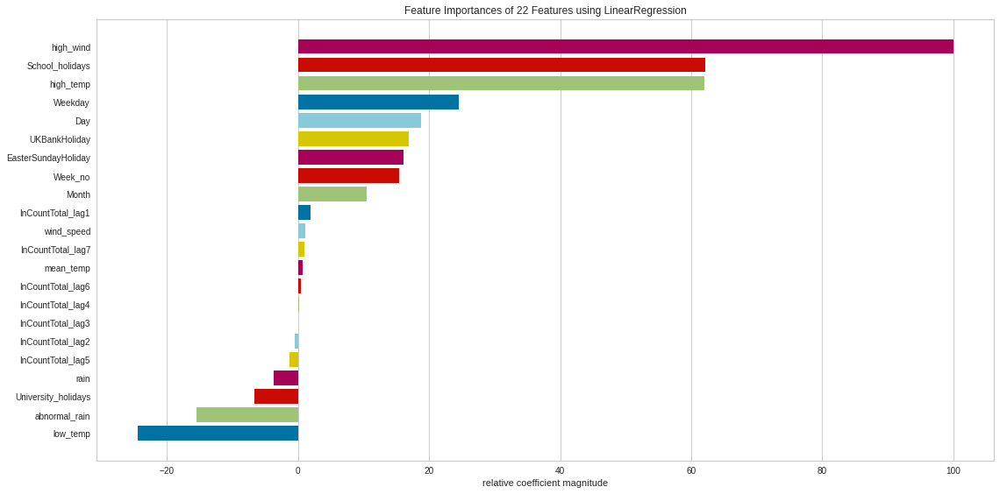

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  14
RFE CV - optimal features  ['InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'rain', 'abnormal_rain', 'high_temp', 'low_temp', 'high_wind', 'EasterSundayHoliday', 'University_holidays', 'School_holidays', 'UKBankHoliday']


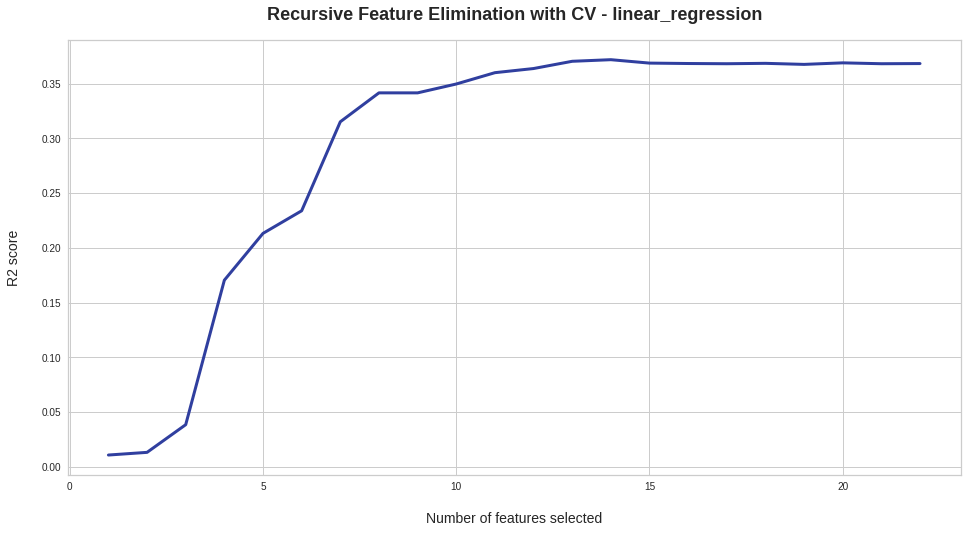

lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


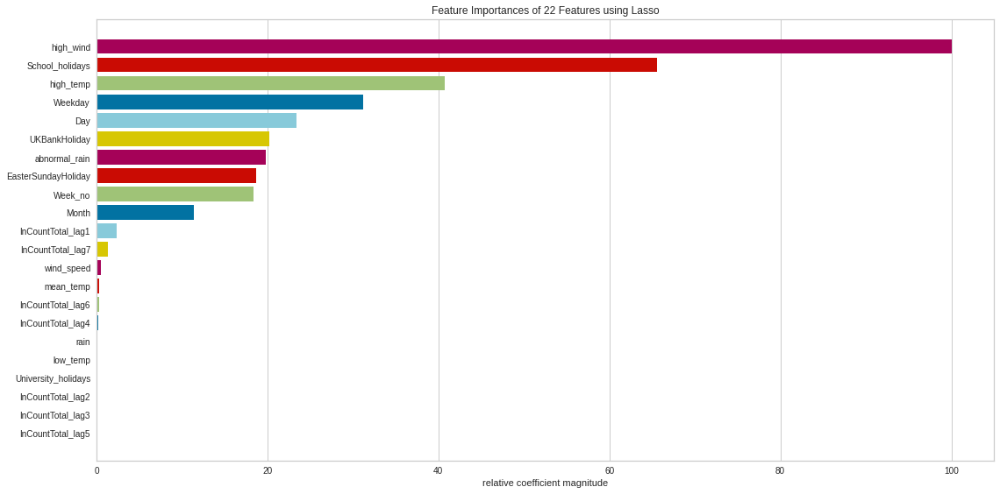

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  11
RFE CV - optimal features  ['InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'abnormal_rain', 'high_temp', 'high_wind', 'EasterSundayHoliday', 'School_holidays', 'UKBankHoliday']


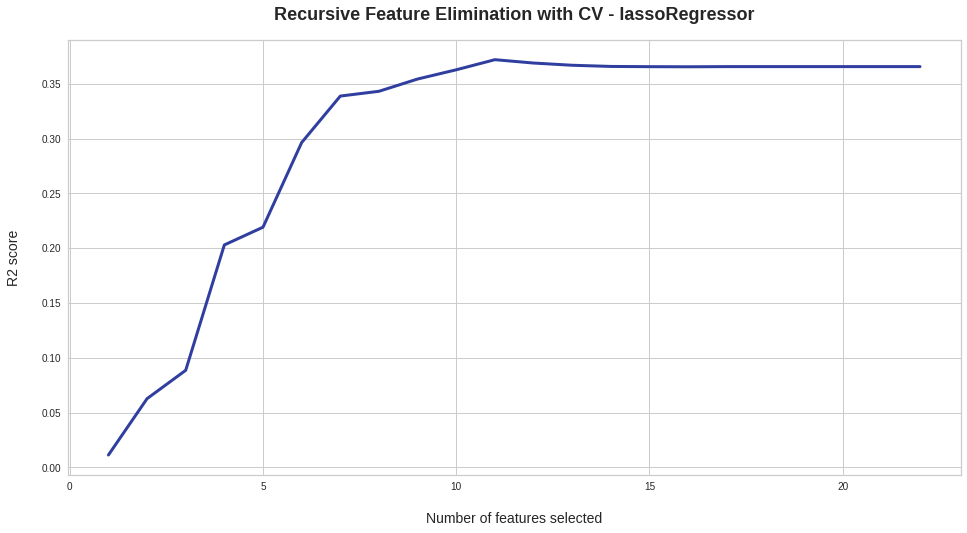

ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


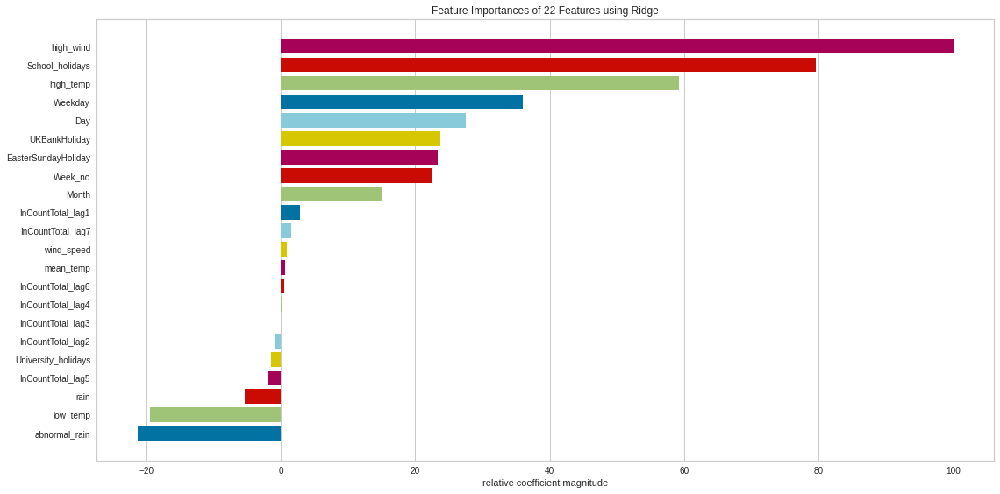

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  14
RFE CV - optimal features  ['InCountTotal_lag5', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'rain', 'abnormal_rain', 'high_temp', 'low_temp', 'high_wind', 'EasterSundayHoliday', 'School_holidays', 'UKBankHoliday']


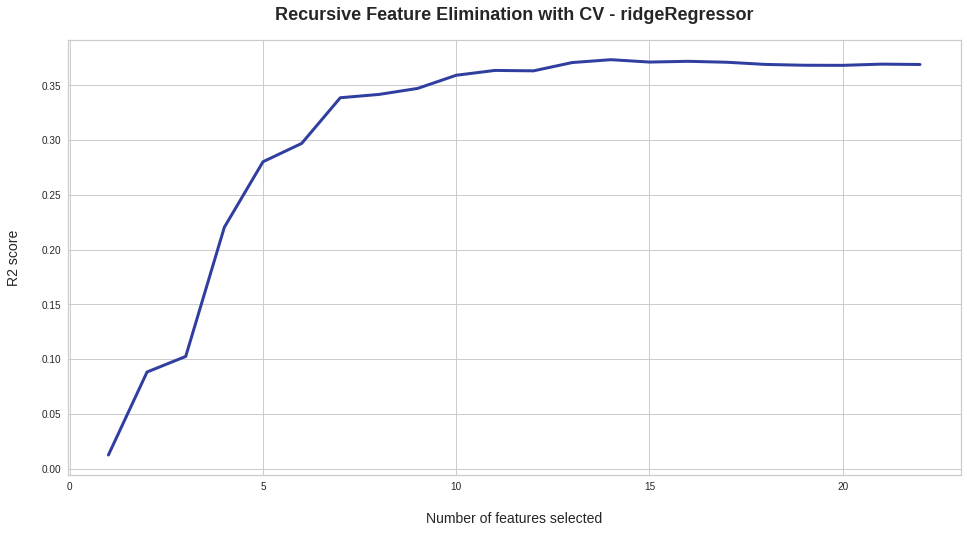

elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


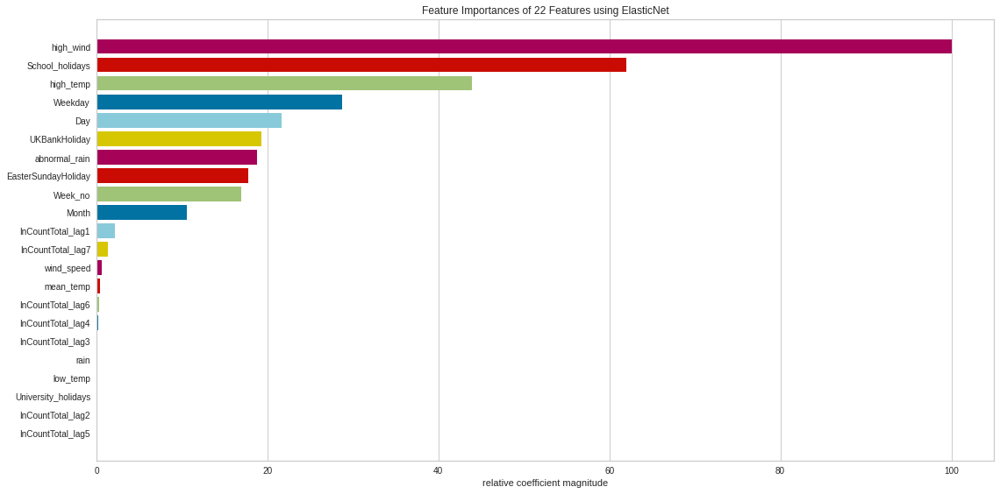

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  11
RFE CV - optimal features  ['InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'abnormal_rain', 'high_temp', 'high_wind', 'EasterSundayHoliday', 'School_holidays', 'UKBankHoliday']


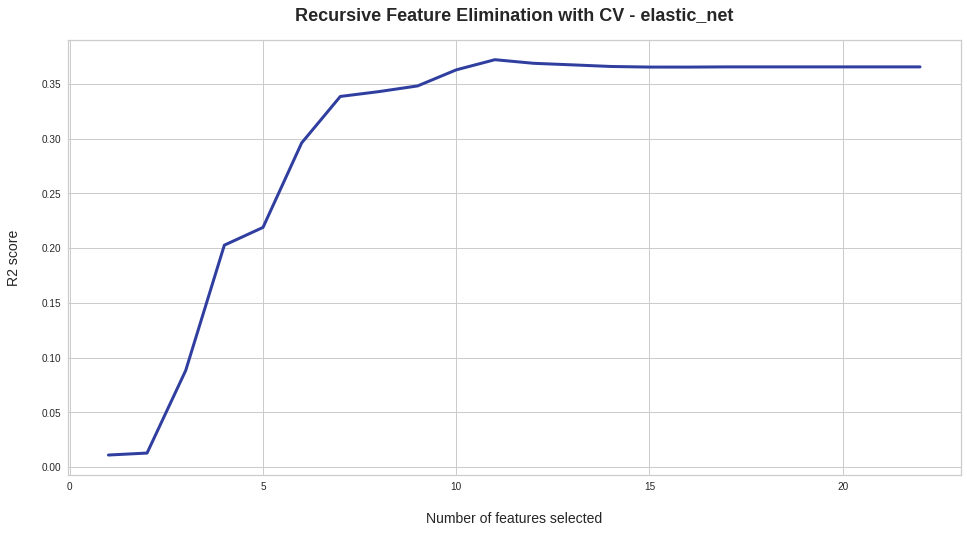

huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


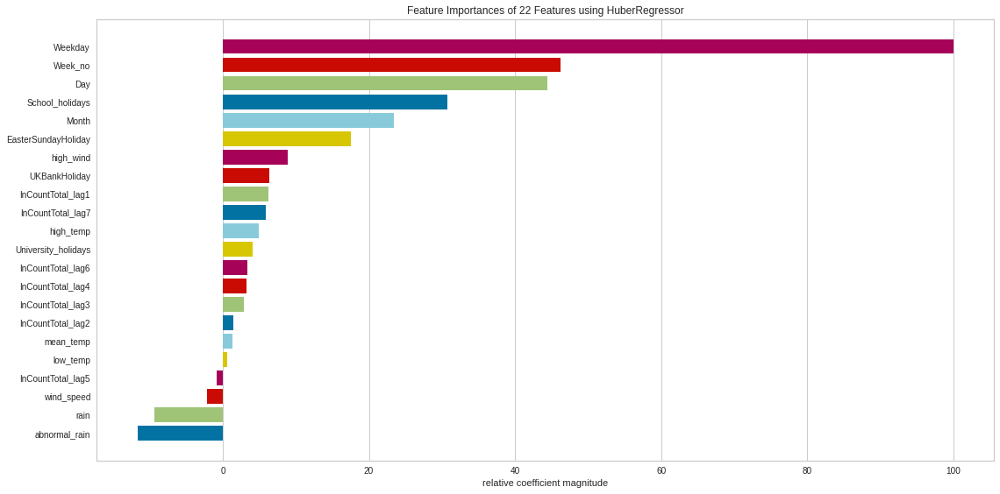

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  13
RFE CV - optimal features  ['InCountTotal_lag7', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'rain', 'abnormal_rain', 'high_wind', 'EasterSundayHoliday', 'University_holidays', 'School_holidays', 'UKBankHoliday']


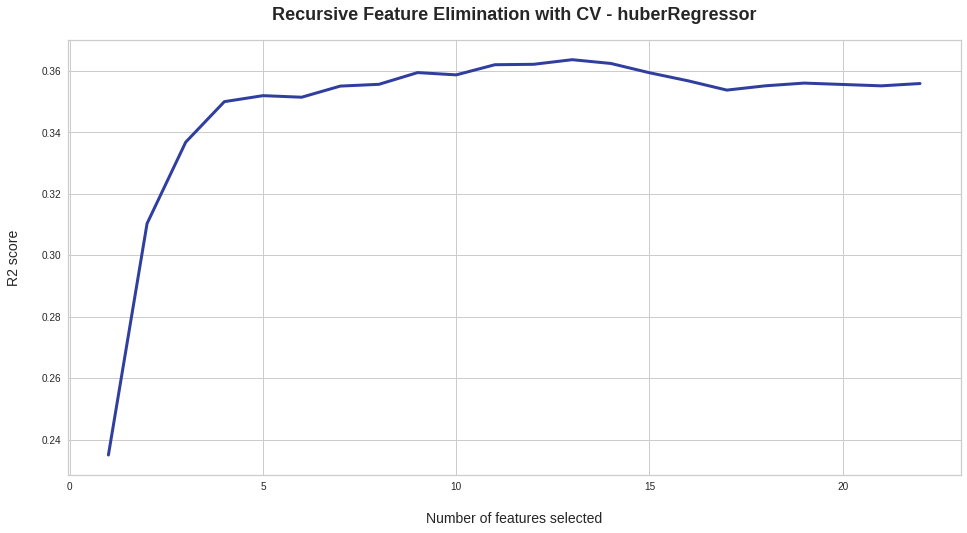

passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


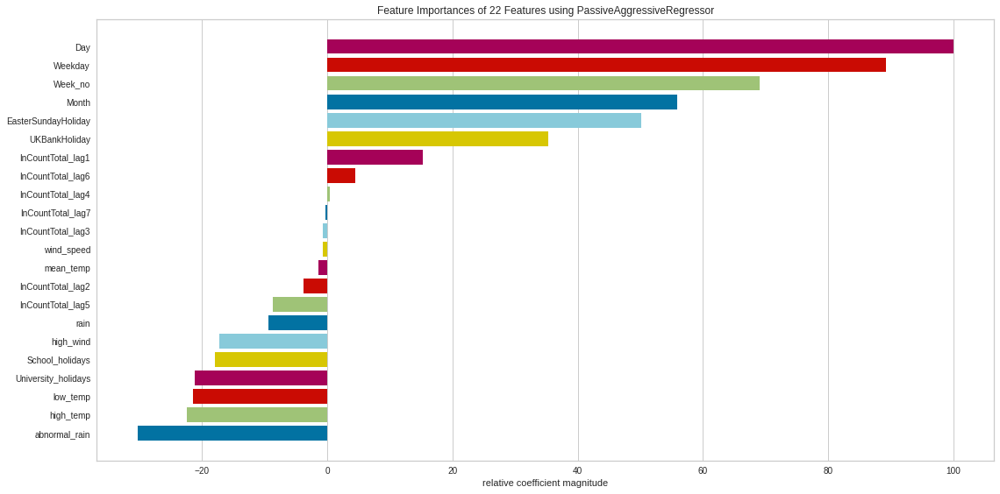

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  9
RFE CV - optimal features  ['Month', 'Weekday', 'Day', 'Week_no', 'abnormal_rain', 'high_temp', 'low_temp', 'high_wind', 'University_holidays']


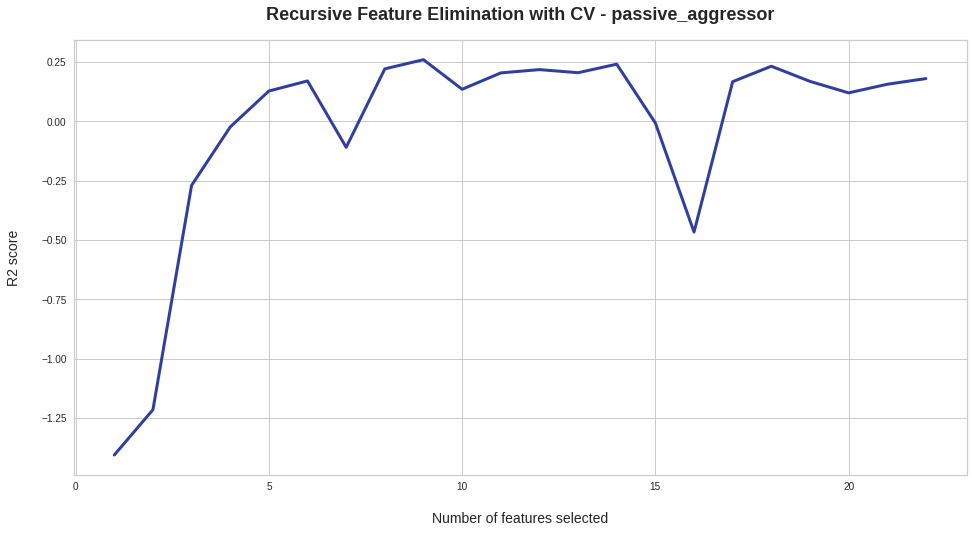

sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


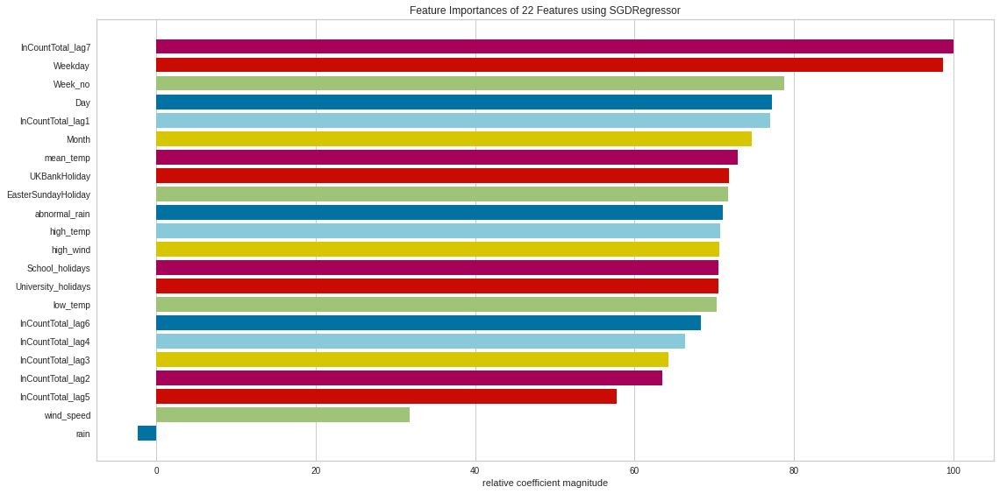

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  9
RFE CV - optimal features  ['InCountTotal_lag7', 'Month', 'Weekday', 'Day', 'Week_no', 'abnormal_rain', 'EasterSundayHoliday', 'School_holidays', 'UKBankHoliday']


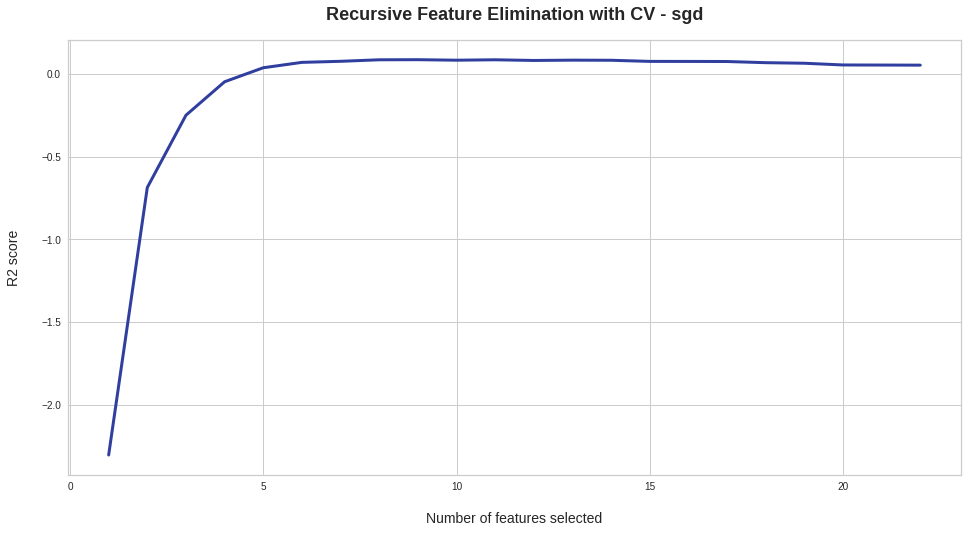

knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


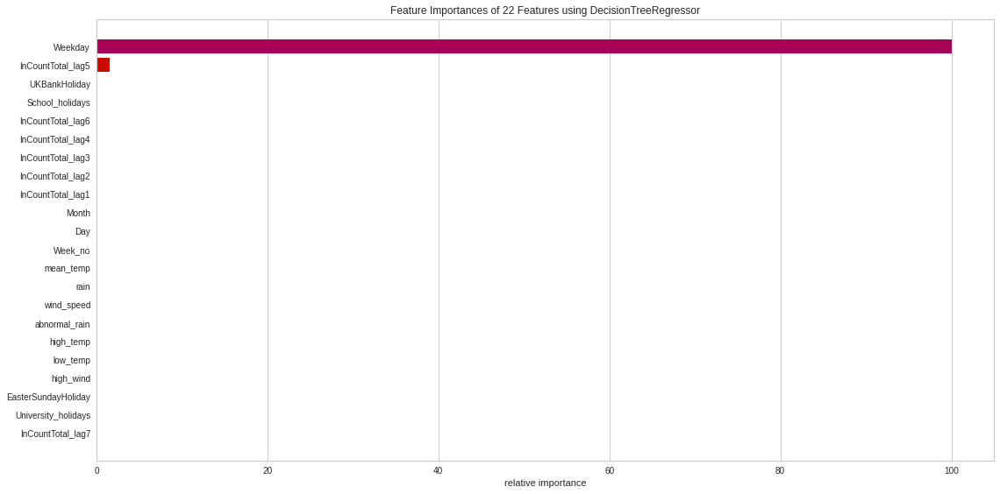

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  22
RFE CV - optimal features  ['InCountTotal_lag7', 'InCountTotal_lag6', 'InCountTotal_lag5', 'InCountTotal_lag4', 'InCountTotal_lag3', 'InCountTotal_lag2', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'mean_temp', 'rain', 'wind_speed', 'abnormal_rain', 'high_temp', 'low_temp', 'high_wind', 'EasterSundayHoliday', 'University_holidays', 'School_holidays', 'UKBankHoliday']


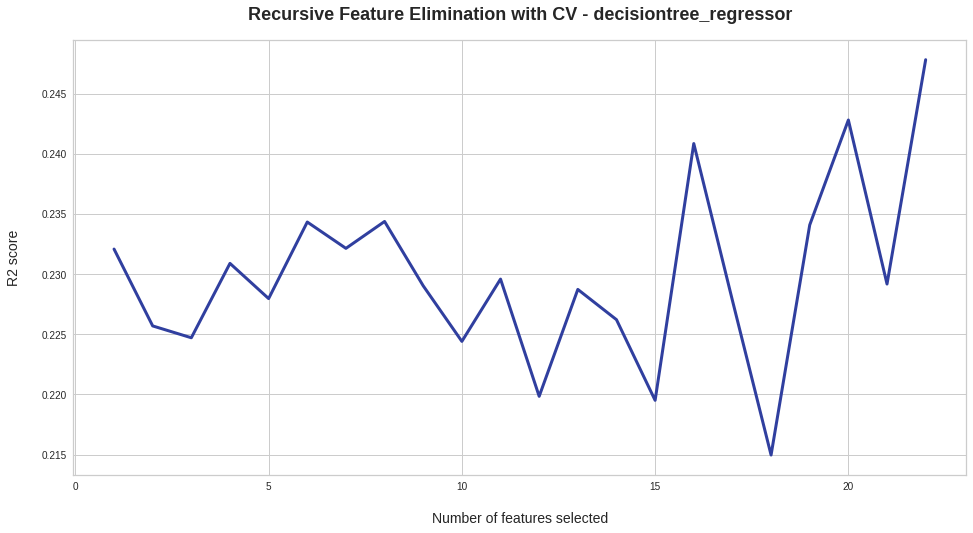

extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


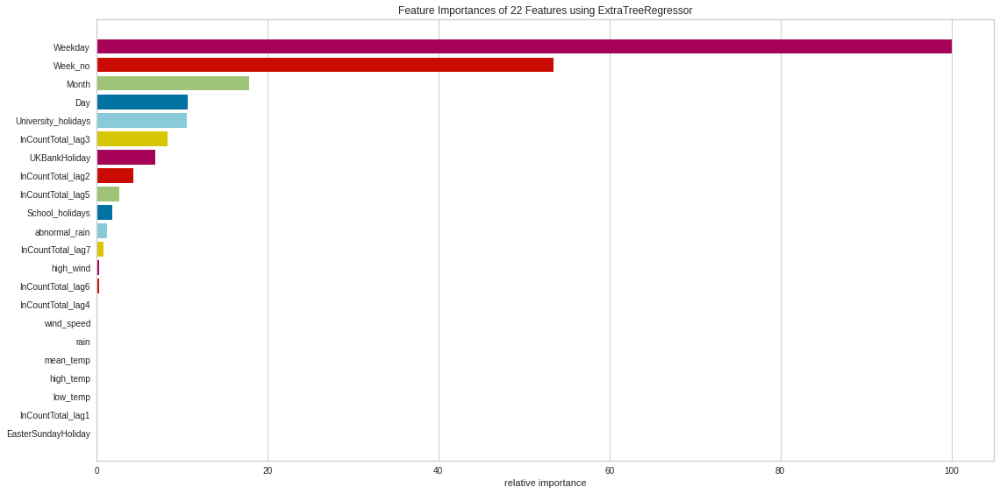

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  7
RFE CV - optimal features  ['InCountTotal_lag1', 'Weekday', 'Day', 'Week_no', 'wind_speed', 'University_holidays', 'School_holidays']


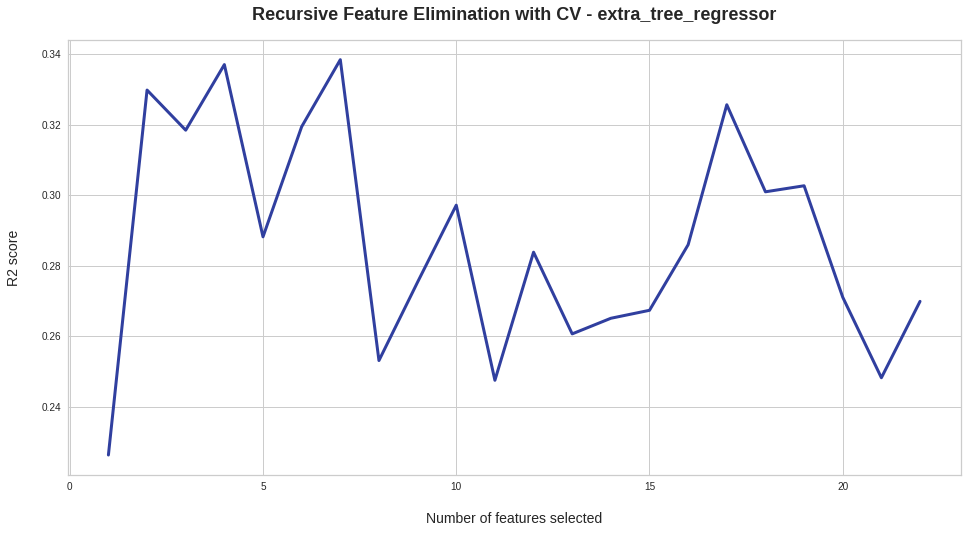

svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


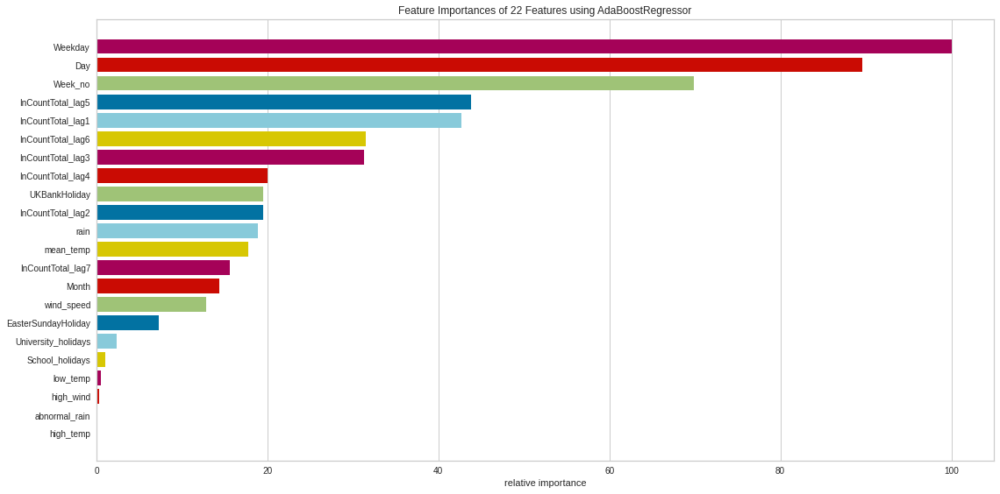

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  18
RFE CV - optimal features  ['InCountTotal_lag7', 'InCountTotal_lag6', 'InCountTotal_lag5', 'InCountTotal_lag4', 'InCountTotal_lag3', 'InCountTotal_lag2', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'mean_temp', 'rain', 'wind_speed', 'EasterSundayHoliday', 'University_holidays', 'School_holidays', 'UKBankHoliday']


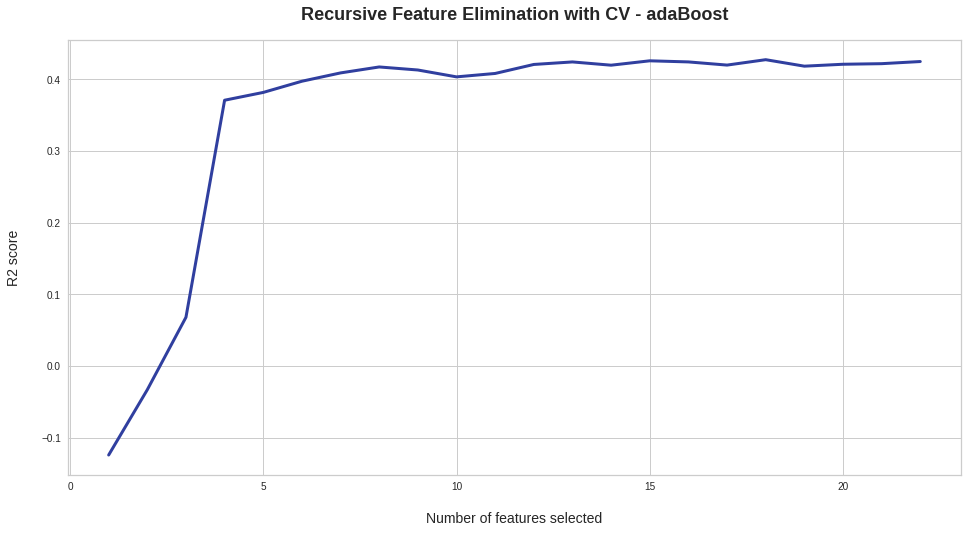

bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


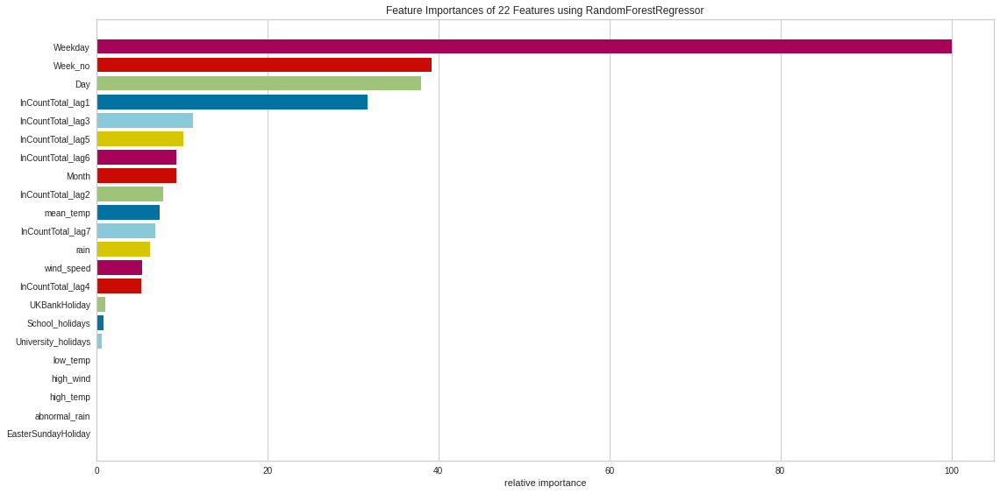

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  15
RFE CV - optimal features  ['InCountTotal_lag7', 'InCountTotal_lag6', 'InCountTotal_lag5', 'InCountTotal_lag4', 'InCountTotal_lag3', 'InCountTotal_lag2', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'mean_temp', 'rain', 'wind_speed', 'UKBankHoliday']


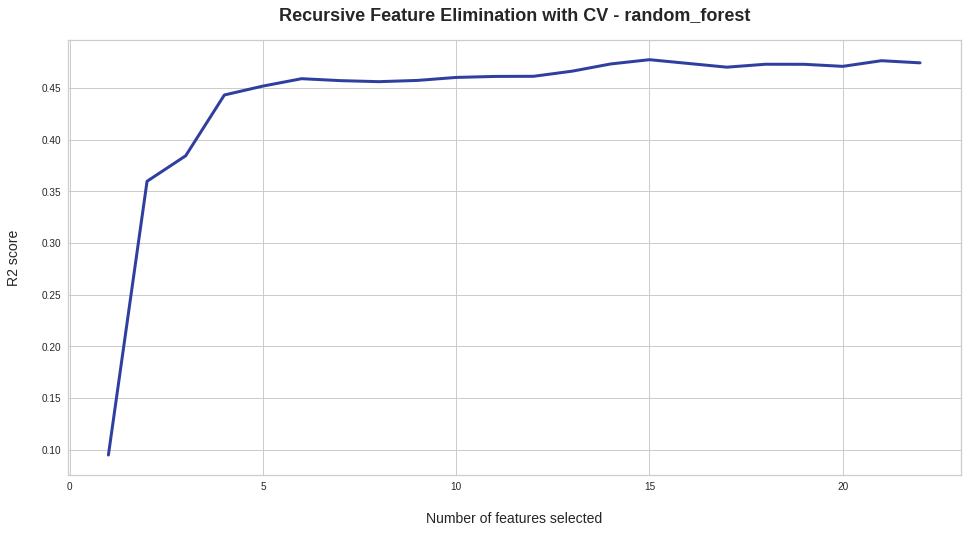

extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


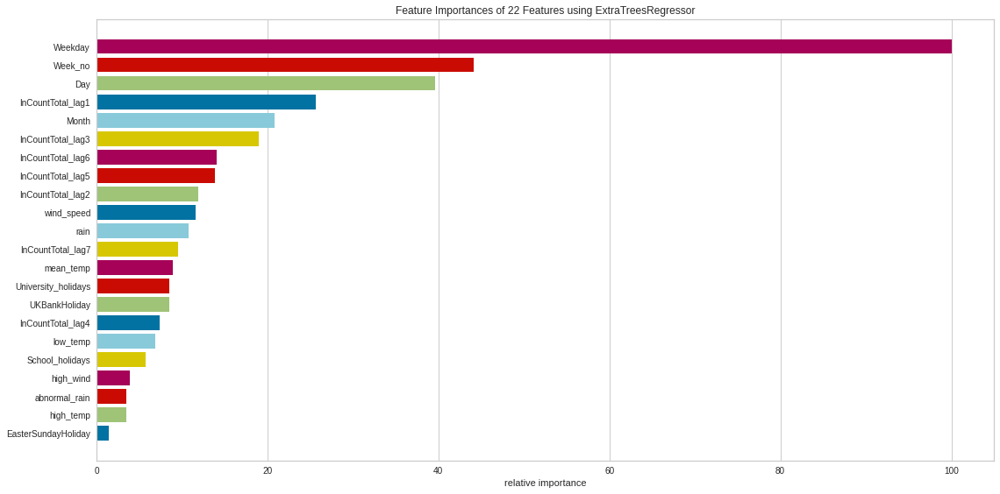

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  13
RFE CV - optimal features  ['InCountTotal_lag7', 'InCountTotal_lag6', 'InCountTotal_lag5', 'InCountTotal_lag3', 'InCountTotal_lag2', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'mean_temp', 'rain', 'wind_speed']


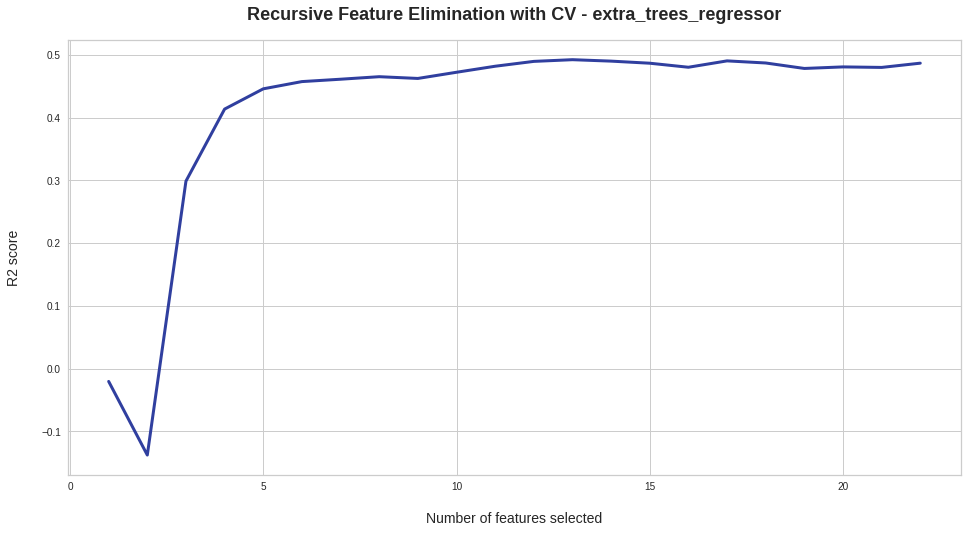

gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


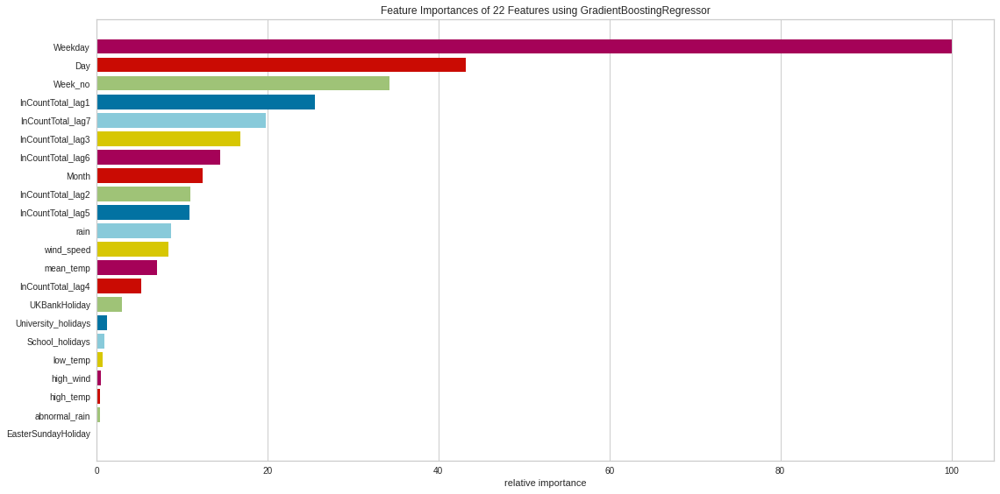

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  17
RFE CV - optimal features  ['InCountTotal_lag7', 'InCountTotal_lag6', 'InCountTotal_lag5', 'InCountTotal_lag4', 'InCountTotal_lag3', 'InCountTotal_lag2', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'mean_temp', 'rain', 'wind_speed', 'University_holidays', 'School_holidays', 'UKBankHoliday']


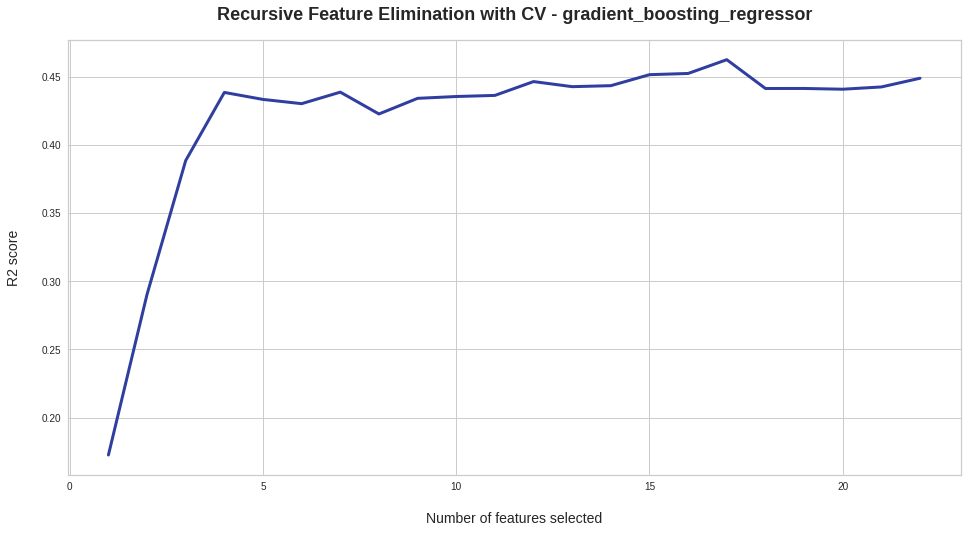

XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


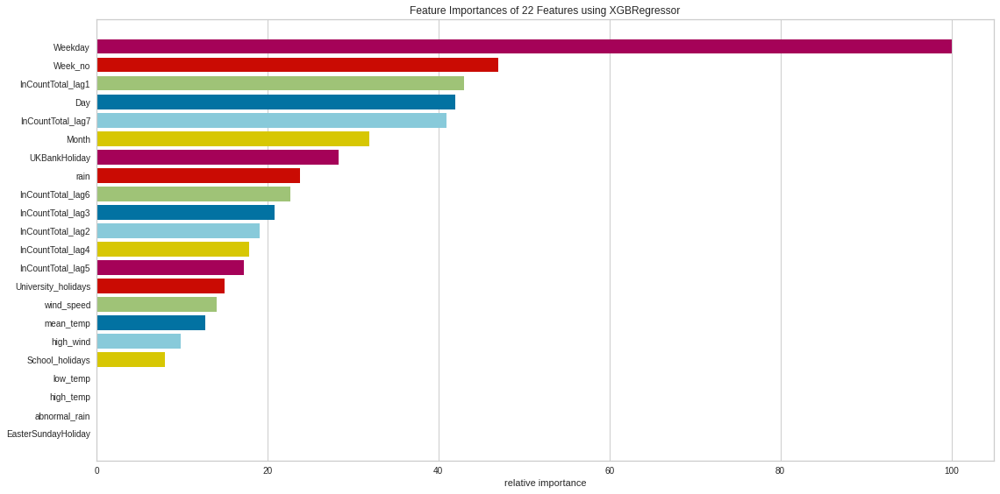

Cross CV validation...
RFE CV tuning...
RFECV - optimal number of features  18
RFE CV - optimal features  ['InCountTotal_lag7', 'InCountTotal_lag6', 'InCountTotal_lag5', 'InCountTotal_lag4', 'InCountTotal_lag3', 'InCountTotal_lag2', 'InCountTotal_lag1', 'Month', 'Weekday', 'Day', 'Week_no', 'mean_temp', 'rain', 'wind_speed', 'abnormal_rain', 'University_holidays', 'School_holidays', 'UKBankHoliday']


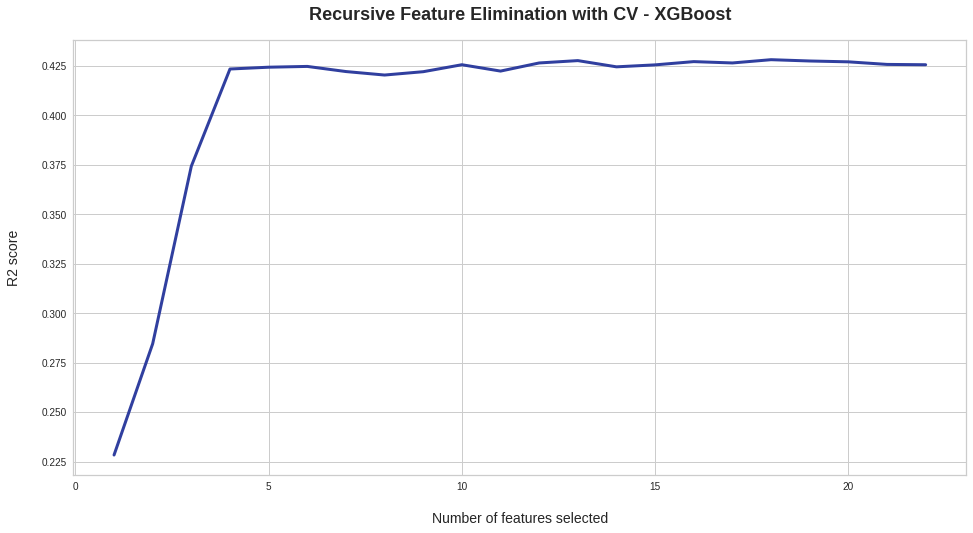

LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f92788f8940>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001, max_fun=15000, max_ite

In [29]:
reg_models = regression_model(data_final,dataset_type='normal_shuffled')
_,_,_, _, _, loss_normal_df = reg_models.train_and_evaluate_models(shuffle=True)
loss_values_all_models.append(loss_normal_df)

In [30]:
loss_normal_df.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
69,CategoricalGradientBoosting_normal_shuffled_rs...,18.263525,0.005194,-0.015631,0.049655,0.038009,0.072067,0.434226,0.395149,-1831.931066,-1742.743143
57,gradient_boosting_regressor_normal_shuffled_de...,18.629808,0.005615,-0.019362,0.052390,0.027793,0.074936,0.388287,0.346036,-1804.060158,-1714.872235
68,CategoricalGradientBoosting_normal_shuffled_de...,19.332720,0.004999,-0.014414,0.048720,0.055079,0.070706,0.455398,0.417783,-1845.546436,-1756.358513
49,random_forest_normal_shuffled_default_model,19.427948,0.004767,-0.012446,0.047276,0.064320,0.069042,0.480725,0.444859,-1862.547285,-1773.359362
46,bagging_normal_shuffled_default_model,19.517288,0.004732,-0.012377,0.046801,0.066487,0.068793,0.484467,0.448860,-1865.129562,-1775.941639
61,XGBoost_normal_shuffled_default_model,19.616281,0.005520,-0.017470,0.052288,0.044728,0.074295,0.398706,0.357175,-1810.193359,-1721.005436
60,gradient_boosting_regressor_normal_shuffled_rf...,19.814619,0.005433,-0.017211,0.051460,0.048572,0.073708,0.408174,0.367297,-1815.859485,-1726.671562
53,extra_trees_regressor_normal_shuffled_default_...,19.972139,0.005094,-0.014785,0.049404,0.058715,0.071372,0.445091,0.406764,-1838.853078,-1749.665155
45,adaBoost_normal_shuffled_rfecv_model,20.124316,0.005237,-0.005556,0.050963,0.083739,0.072364,0.429550,0.390149,-1828.992344,-1739.804421
65,LightGradientBoosting_normal_shuffled_default_...,20.169817,0.005365,-0.015131,0.050980,0.055039,0.073246,0.415568,0.375202,-1820.347930,-1731.160007


Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


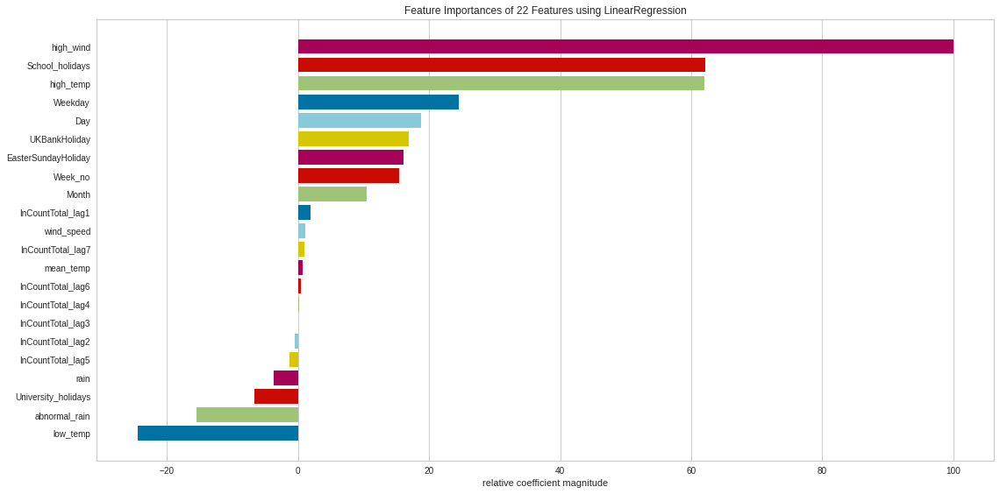

Cross CV validation...
lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


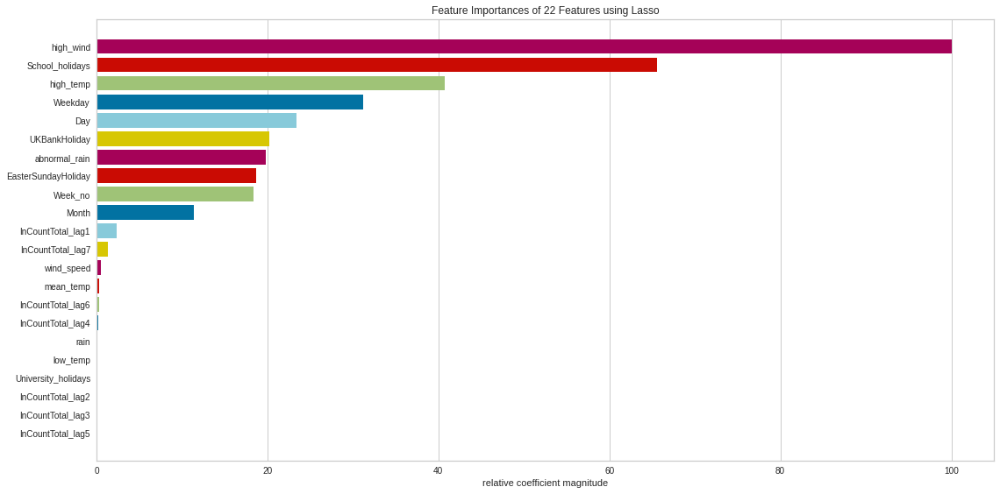

Cross CV validation...
ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


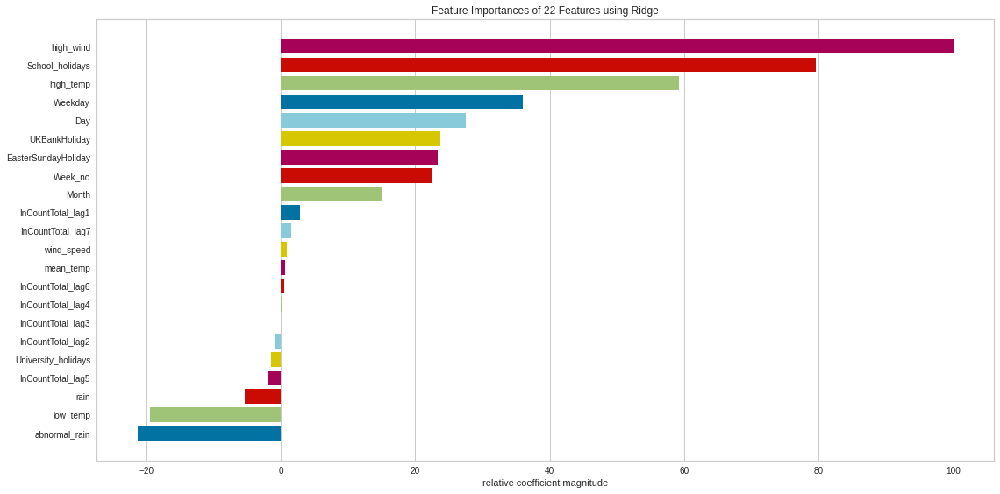

Cross CV validation...
elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


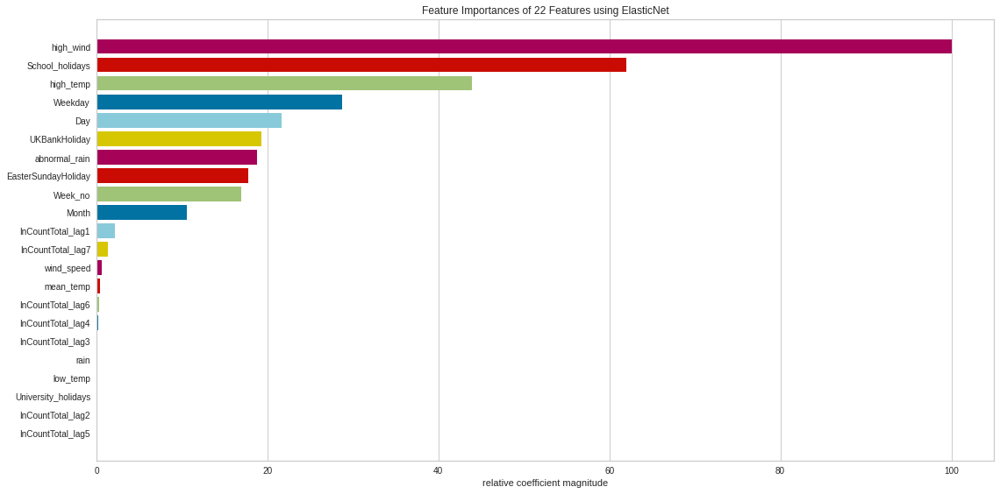

Cross CV validation...
huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


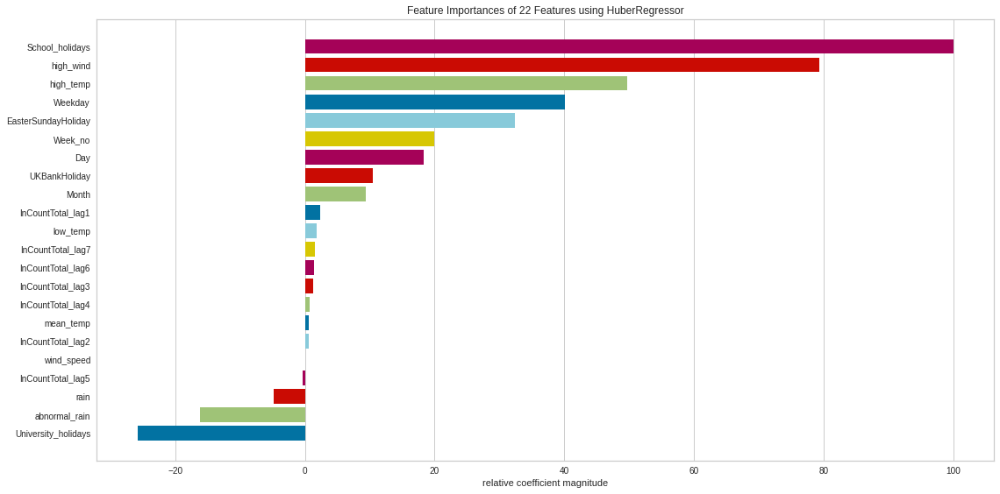

Cross CV validation...
passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


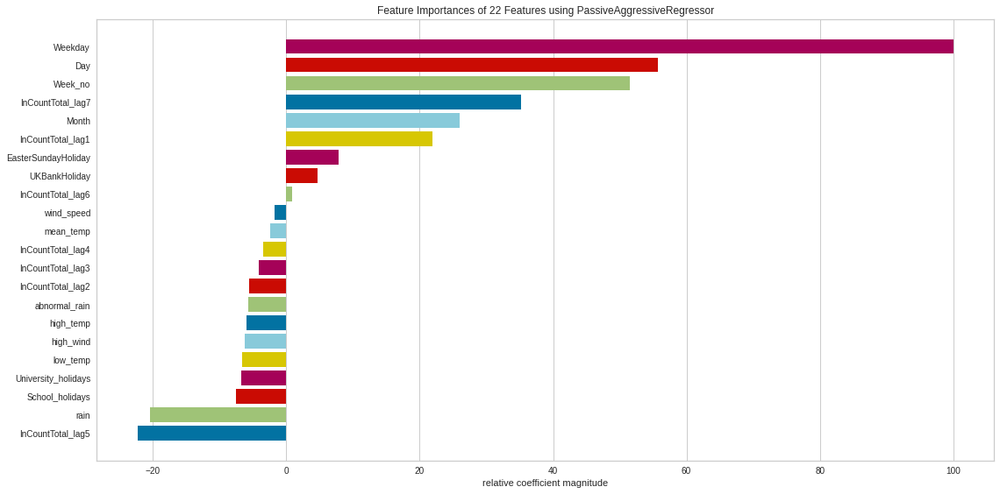

Cross CV validation...
sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


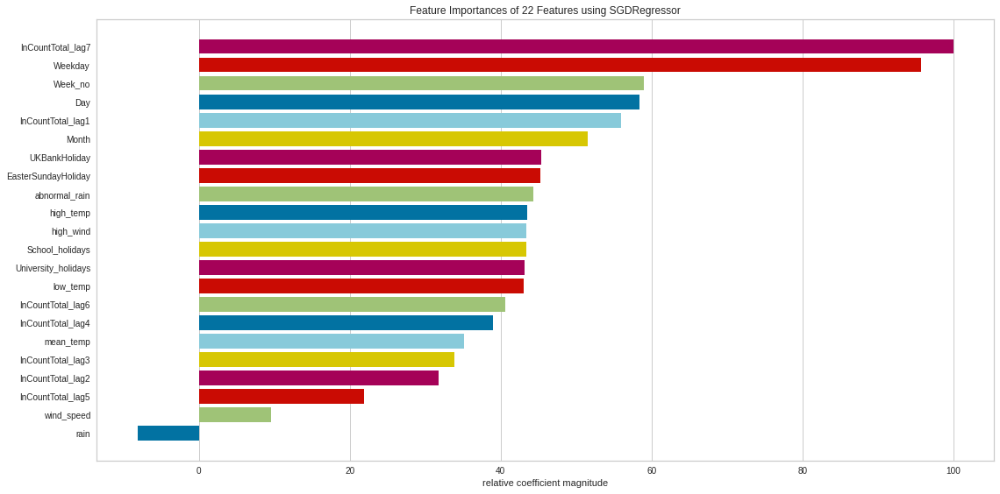

Cross CV validation...
knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


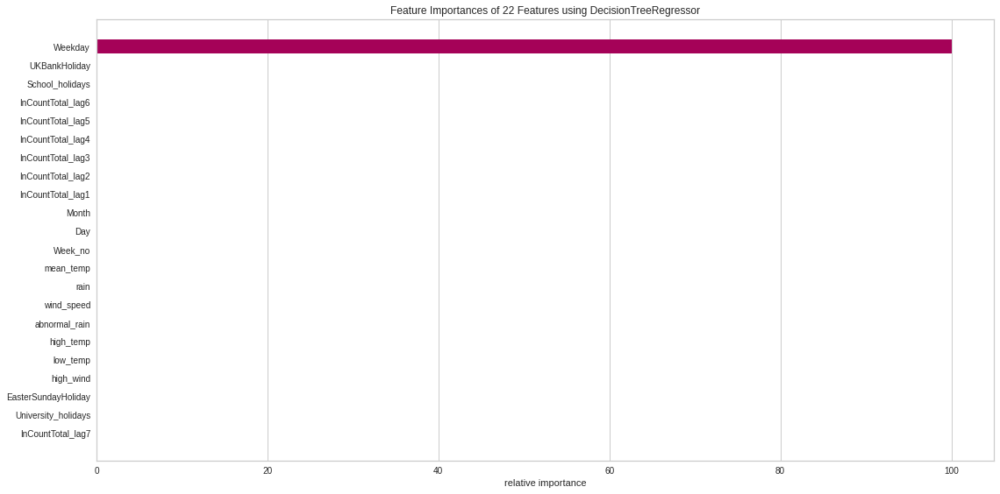

Cross CV validation...
extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


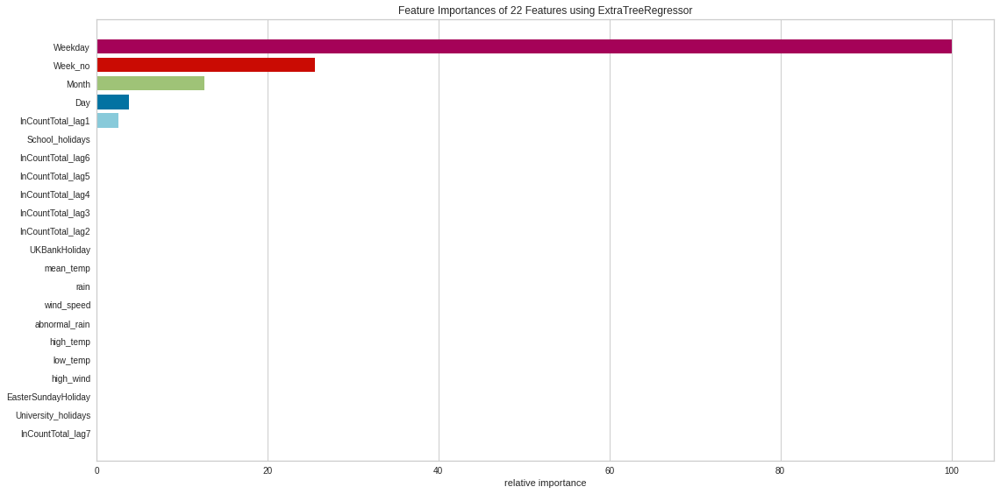

Cross CV validation...
svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


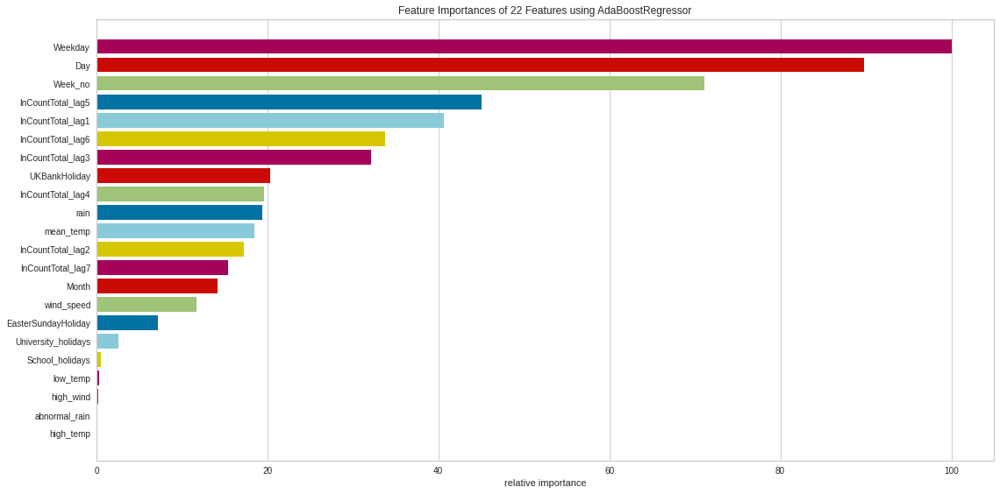

Cross CV validation...
bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


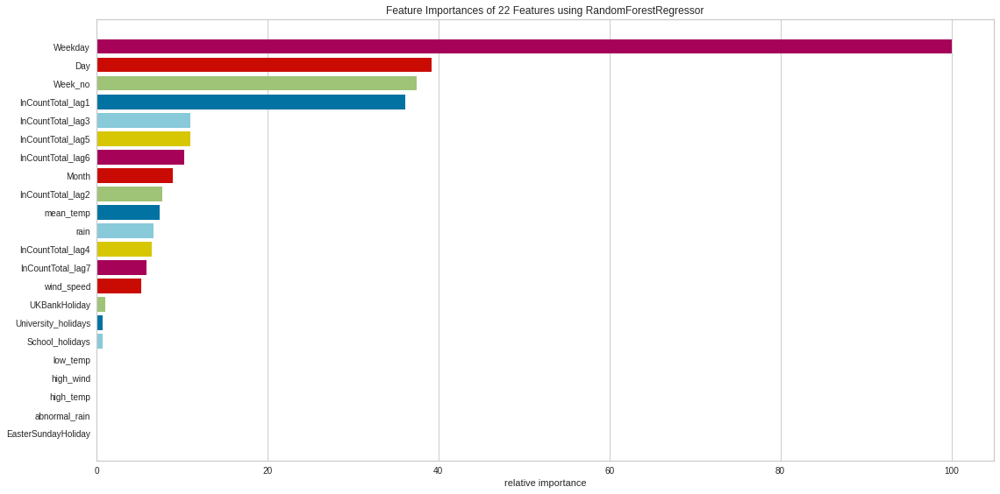

Cross CV validation...
extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


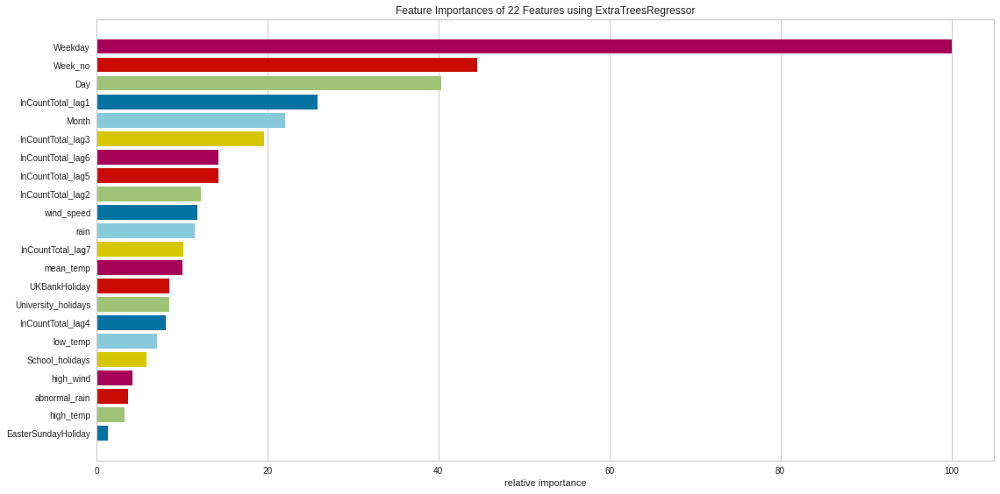

Cross CV validation...
gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


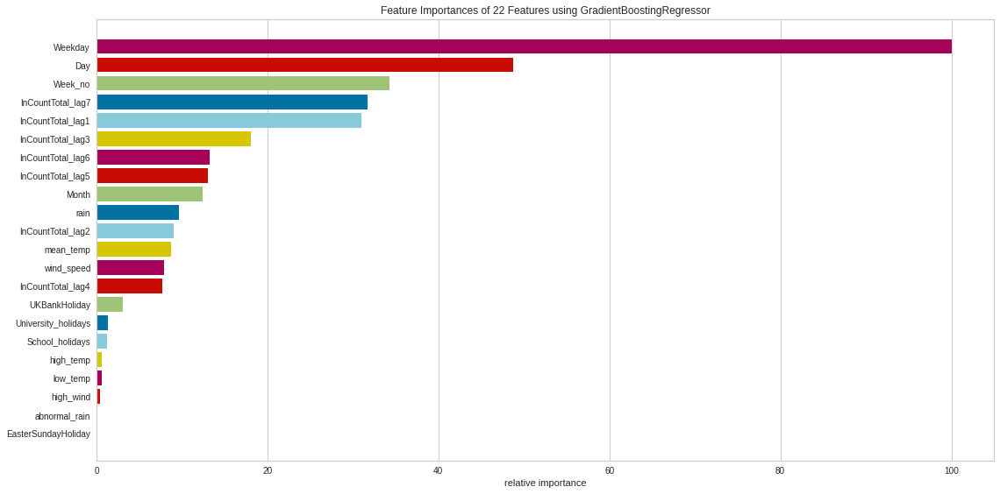

Cross CV validation...
XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


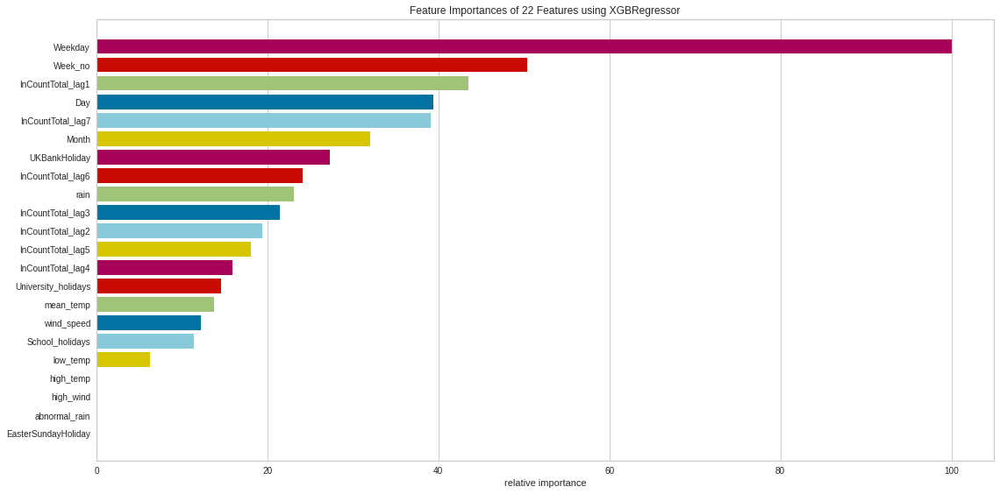

Cross CV validation...
LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f927875c390>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001,

In [31]:
reg_models = regression_model(data_final,dataset_type='normal')
_,_,_,_,_, loss_normal_df = reg_models.train_and_evaluate_models(RFEcross_validation=False)
loss_values_all_models.append(loss_normal_df)

In [32]:
loss_normal_df.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
27,extra_tree_regressor_normal_default_model,17.897495,0.009260,-0.019244,0.068120,-0.025908,0.096229,-0.008740,-0.078412,-1625.491227,-1536.303304
45,gradient_boosting_regressor_normal_default_model,18.420899,0.005594,-0.019348,0.052209,0.026233,0.074796,0.390568,0.348475,-1805.393885,-1716.205962
54,CategoricalGradientBoosting_normal_default_model,19.219415,0.005016,-0.012846,0.048502,0.057750,0.070826,0.453540,0.415797,-1844.330756,-1755.142833
39,random_forest_normal_default_model,19.436740,0.004790,-0.011844,0.047131,0.066519,0.069213,0.478152,0.442109,-1860.783347,-1771.595425
36,bagging_normal_default_model,19.531226,0.004843,-0.012142,0.047241,0.066651,0.069594,0.472391,0.435949,-1856.863338,-1767.675415
48,XGBoost_normal_default_model,19.616281,0.005520,-0.017470,0.052288,0.044728,0.074295,0.398706,0.357175,-1810.193359,-1721.005436
51,LightGradientBoosting_normal_default_model,20.169817,0.005365,-0.015131,0.050980,0.055039,0.073246,0.415568,0.375202,-1820.347930,-1731.160007
52,LightGradientBoosting_normal_rscv_model,20.187940,0.005135,-0.015762,0.049409,0.059171,0.071660,0.440596,0.401959,-1835.973252,-1746.785329
43,extra_trees_regressor_normal_rscv_model,20.410401,0.005220,-0.015627,0.049977,0.059561,0.072247,0.431407,0.392135,-1830.156790,-1740.968867
55,CategoricalGradientBoosting_normal_rscv_model,20.421376,0.005221,-0.016520,0.049868,0.060150,0.072255,0.431278,0.391997,-1830.075596,-1740.887673


### 7.1.2 Model training with detrended data

Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


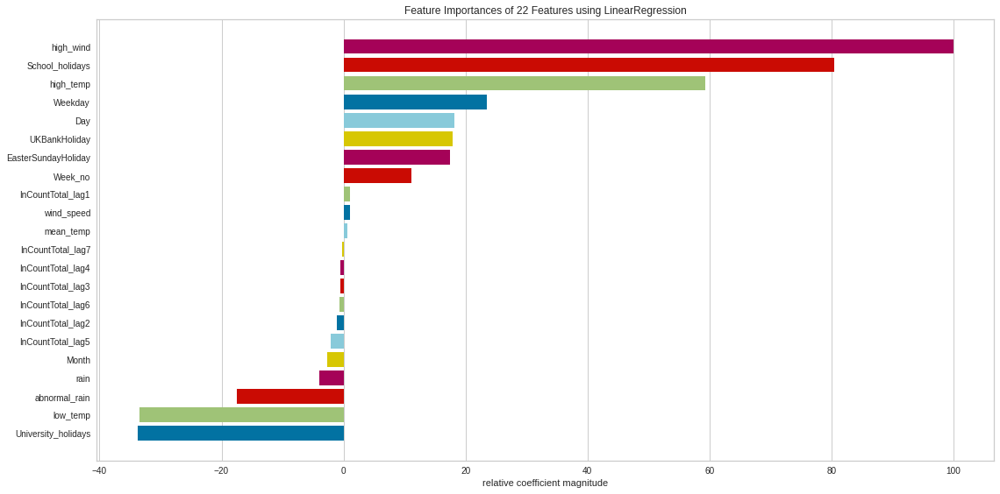

Cross CV validation...
lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


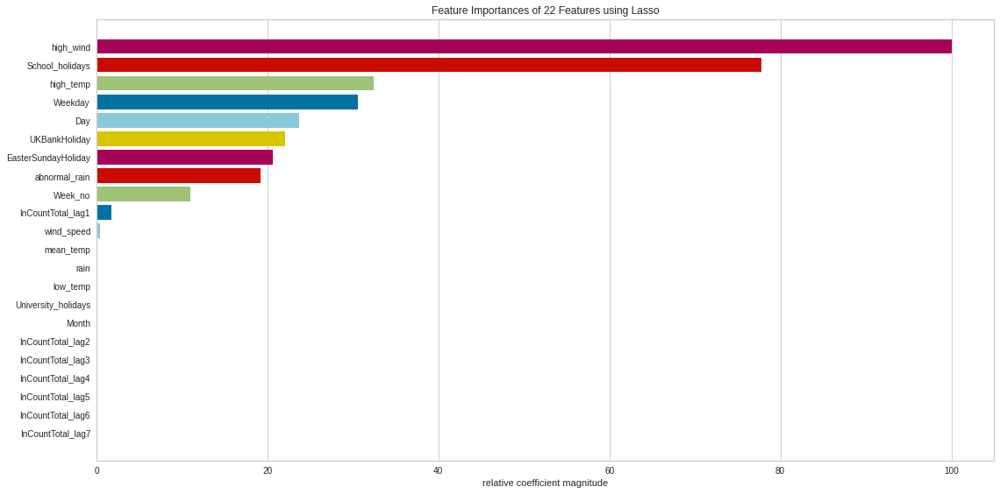

Cross CV validation...
ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


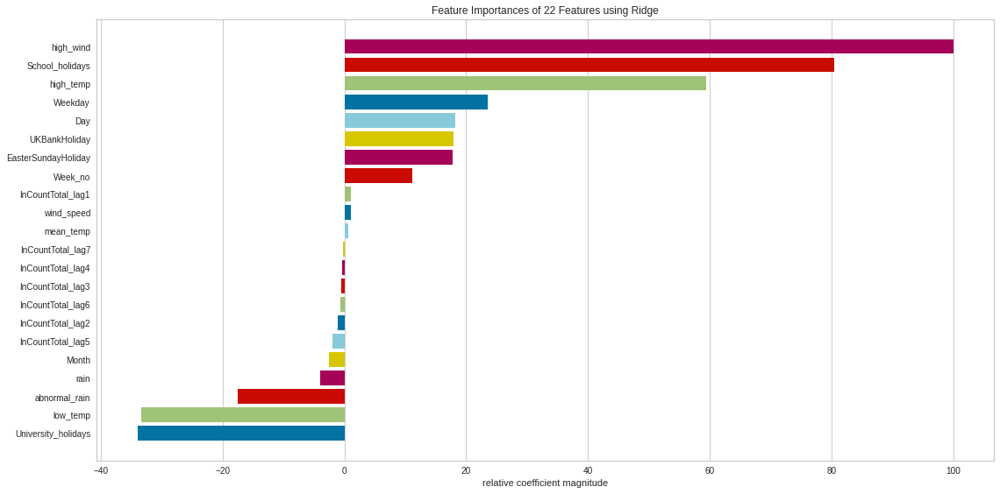

Cross CV validation...
elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


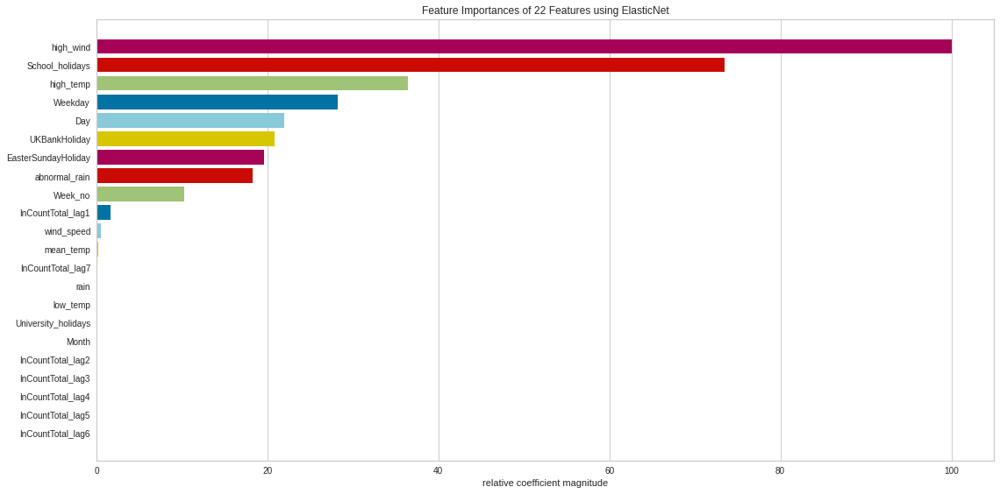

Cross CV validation...
huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


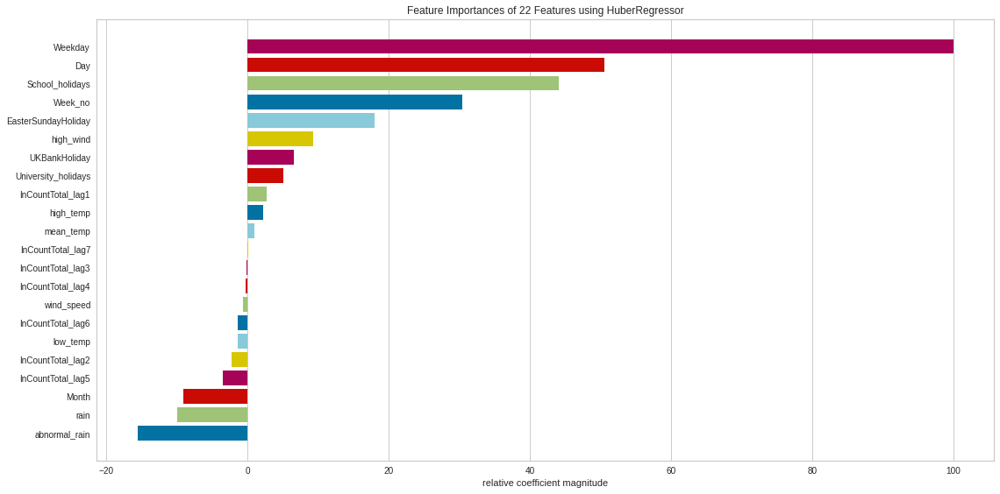

Cross CV validation...
passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


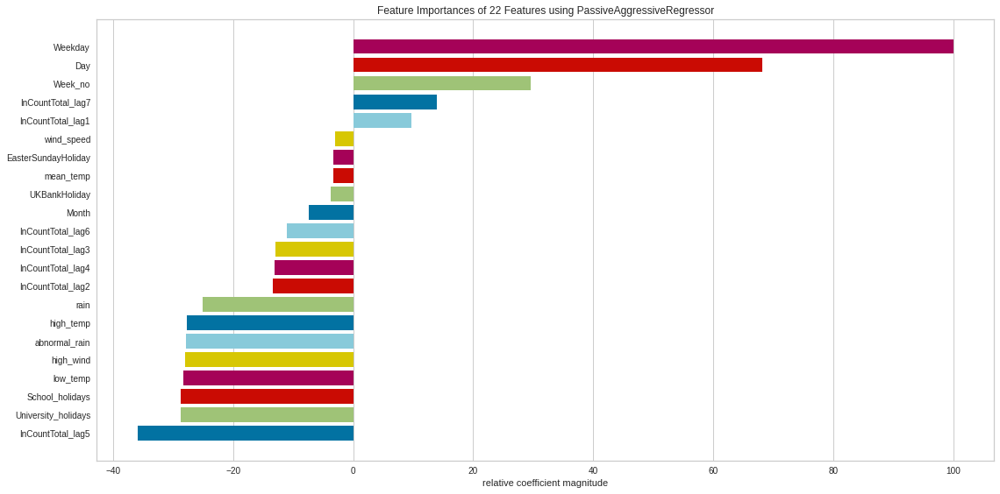

Cross CV validation...
sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


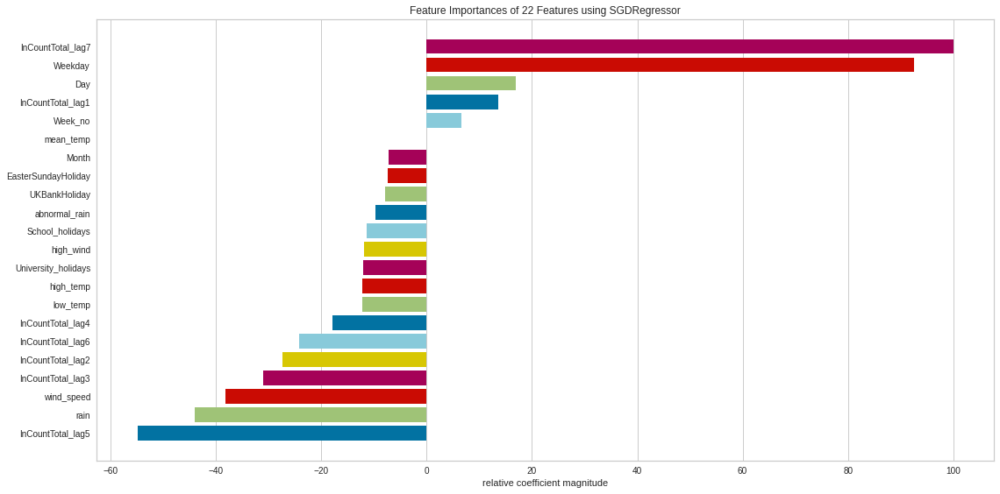

Cross CV validation...
knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


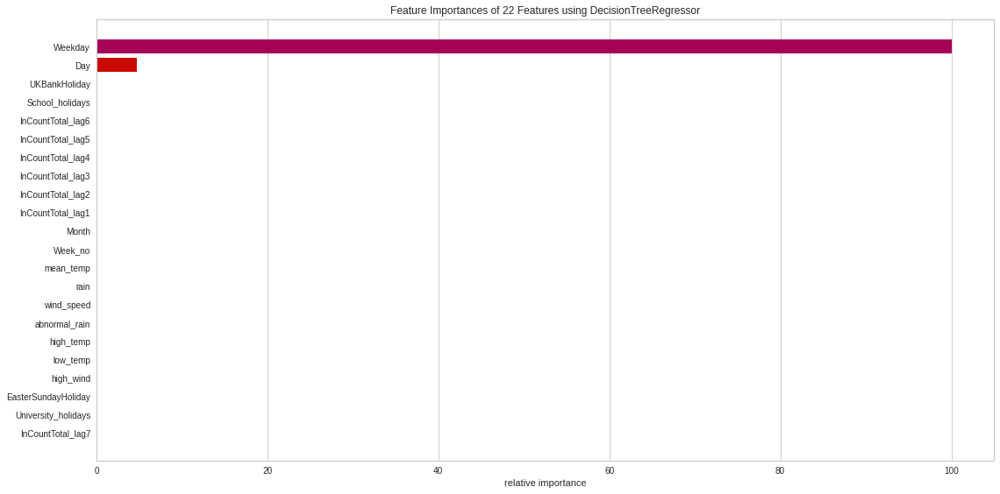

Cross CV validation...
extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


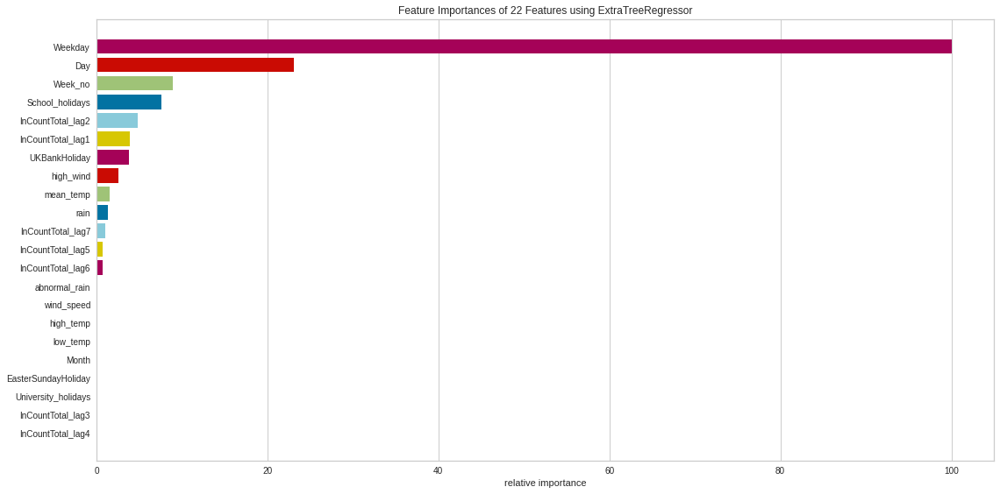

Cross CV validation...
svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


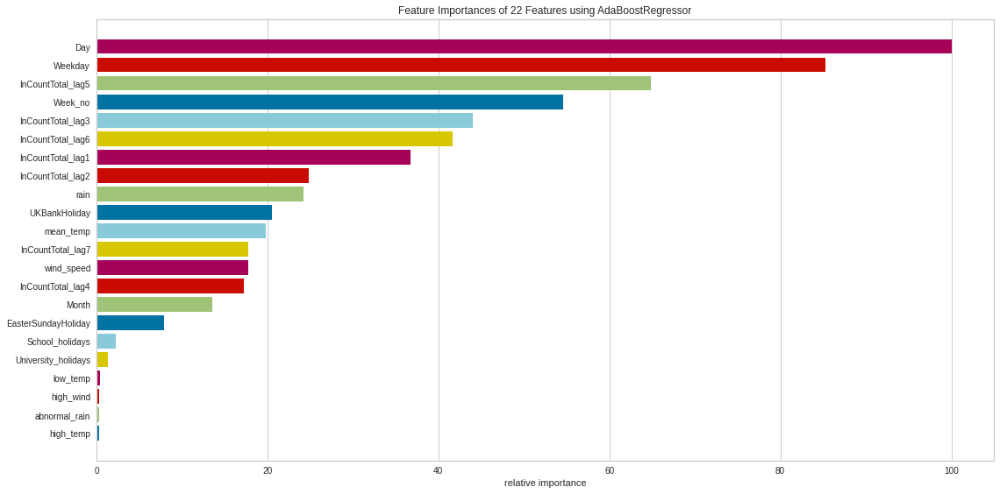

Cross CV validation...
bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


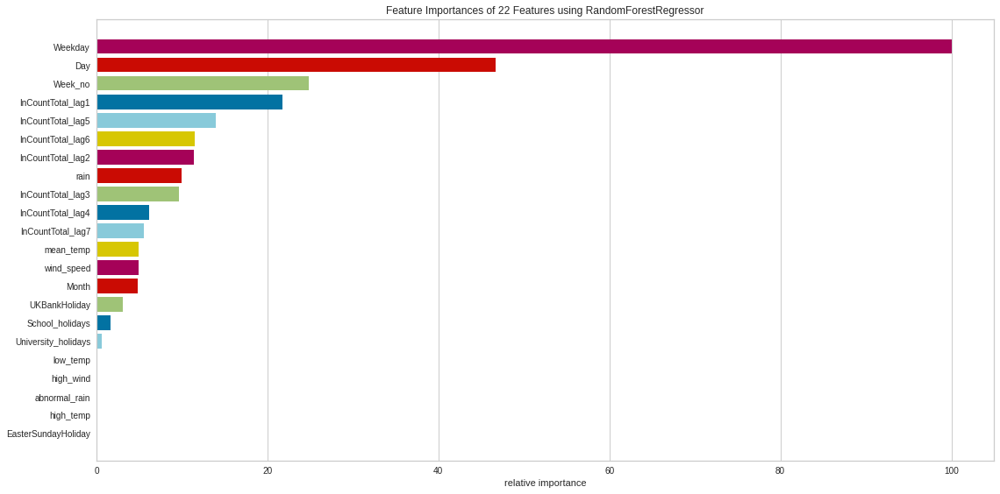

Cross CV validation...
extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


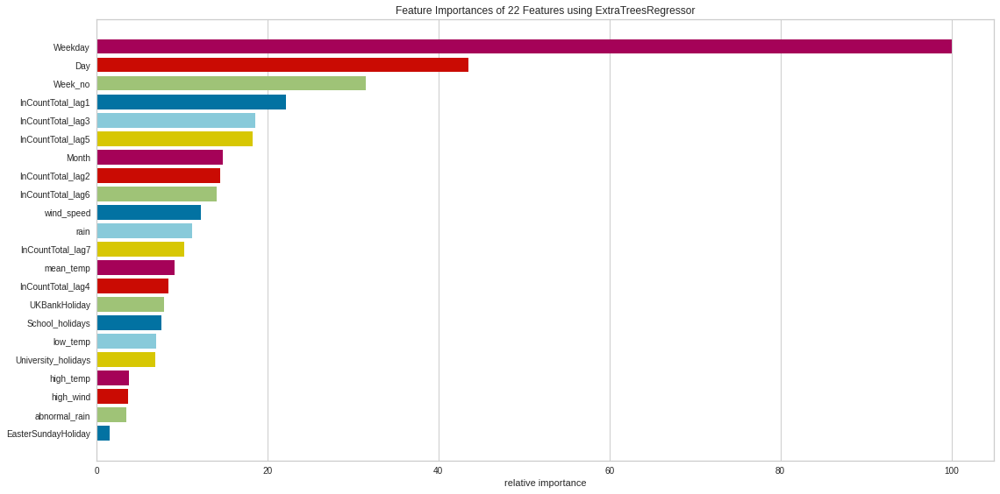

Cross CV validation...
gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


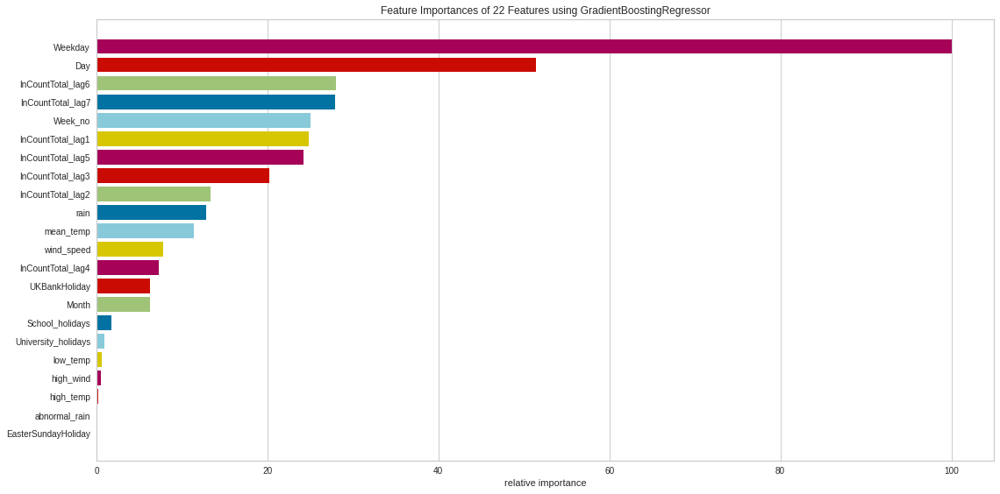

Cross CV validation...
XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


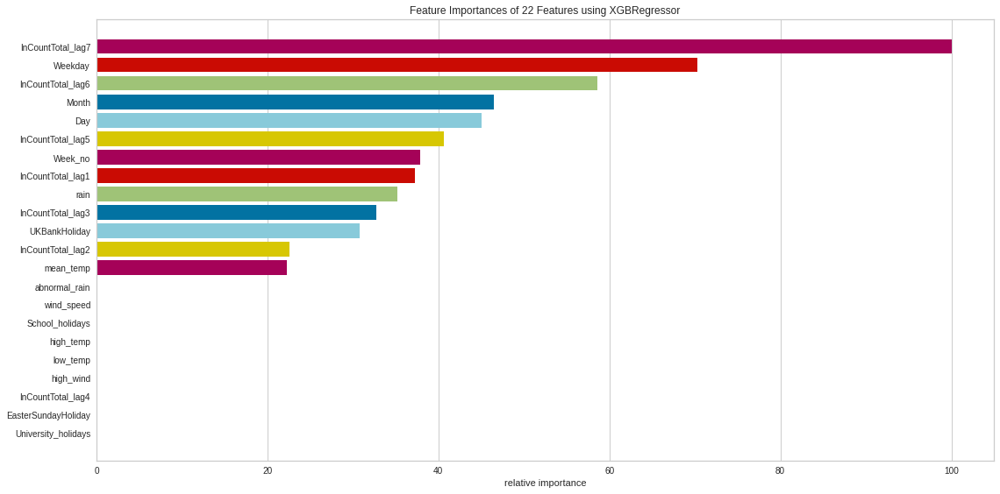

Cross CV validation...
LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f9271538d68>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001,

In [33]:
reg_models = regression_model(data_final_detrended,dataset_type='detrend')
regression_models,modelPredictions,cvPredictions, rscvPredictions, rfecvPredictions, loss_df_detrend = reg_models.train_and_evaluate_models(RFEcross_validation=False)
loss_values_all_models.append(loss_df_detrend)

In [75]:
loss_df_detrend.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
27,extra_tree_regressor_detrend_default_model,17.502238,0.007272,0.005979,0.061004,0.042696,0.085276,0.194315,0.138667,-1711.769866,-1622.581943
54,CategoricalGradientBoosting_detrend_default_model,21.457379,0.004542,0.002549,0.045715,0.121962,0.067392,0.496815,0.462060,-1879.821992,-1790.634069
36,bagging_detrend_default_model,21.831401,0.004567,0.002590,0.045331,0.127210,0.067577,0.494044,0.459098,-1877.861461,-1788.673538
39,random_forest_detrend_default_model,21.865811,0.004483,0.003244,0.045142,0.129479,0.066952,0.503365,0.469062,-1884.499383,-1795.311461
55,CategoricalGradientBoosting_detrend_rscv_model,21.996109,0.004640,0.002547,0.046437,0.125338,0.068121,0.485874,0.450363,-1872.142654,-1782.954731
43,extra_trees_regressor_detrend_rscv_model,22.065122,0.004397,0.001249,0.043872,0.129815,0.066310,0.512846,0.479199,-1891.380937,-1802.193014
42,extra_trees_regressor_detrend_default_model,22.126706,0.004506,0.001522,0.044423,0.129643,0.067124,0.500813,0.466335,-1882.670004,-1793.482081
46,gradient_boosting_regressor_detrend_rscv_model,22.514041,0.004642,0.000249,0.046438,0.126512,0.068136,0.485645,0.450119,-1871.983595,-1782.795672
51,LightGradientBoosting_detrend_default_model,23.165806,0.004891,0.000777,0.047814,0.128339,0.069933,0.458161,0.420736,-1853.399854,-1764.211931
52,LightGradientBoosting_detrend_rscv_model,23.321796,0.004541,0.001635,0.046679,0.136005,0.067388,0.496870,0.462119,-1879.860799,-1790.672876


### 7.1.3 Model training with outlier removed data

Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


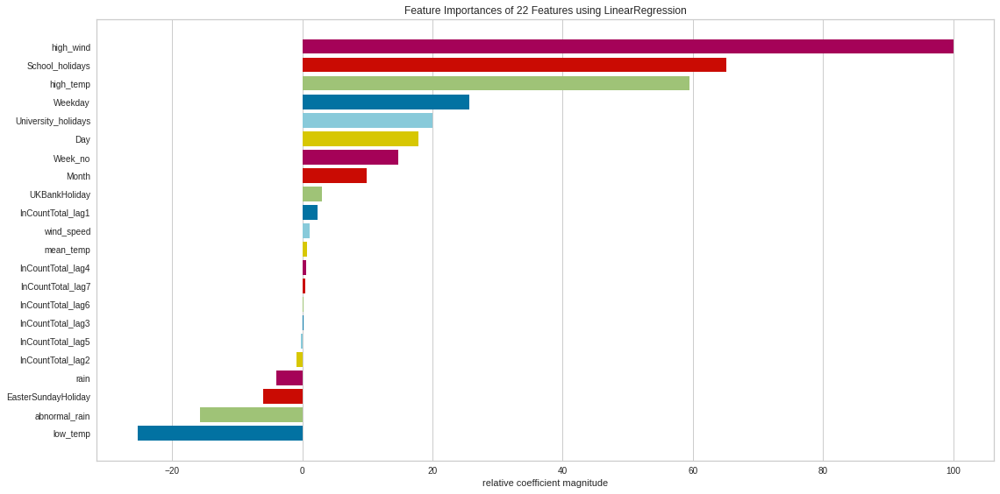

Cross CV validation...
lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


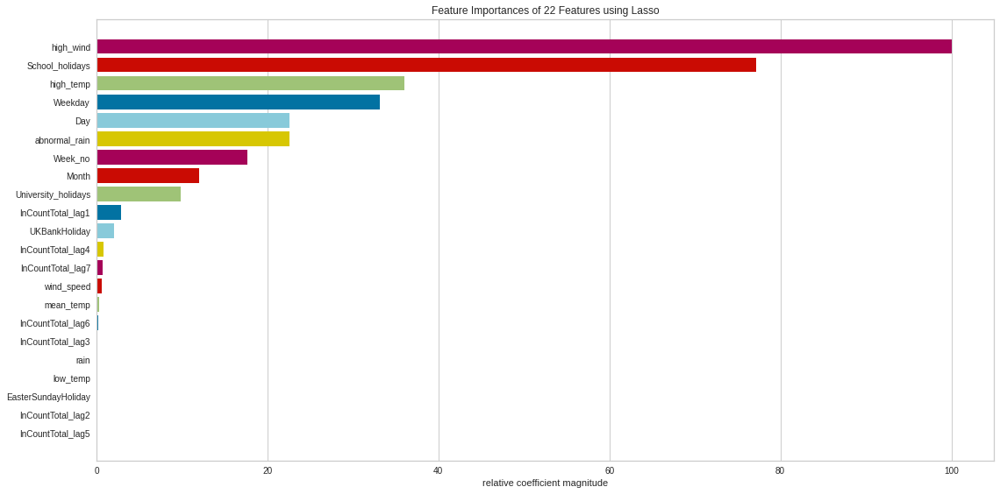

Cross CV validation...
ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


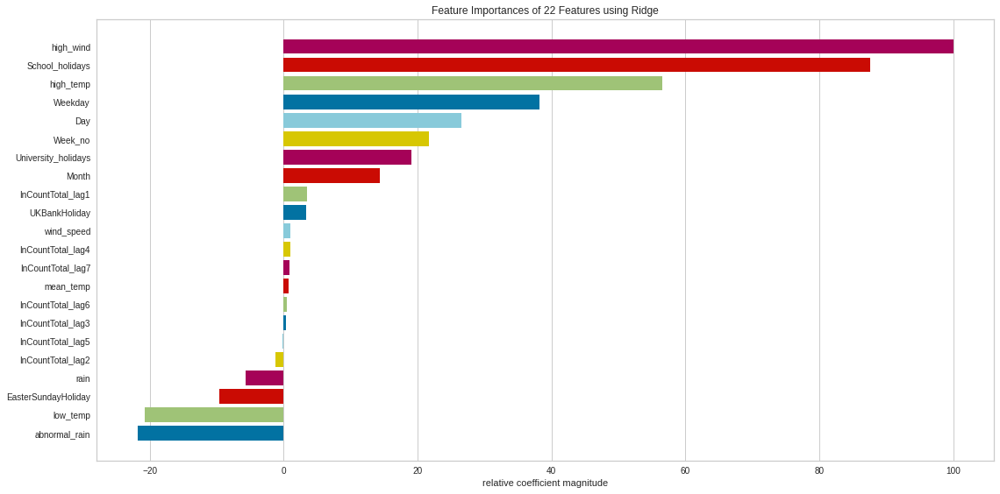

Cross CV validation...
elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


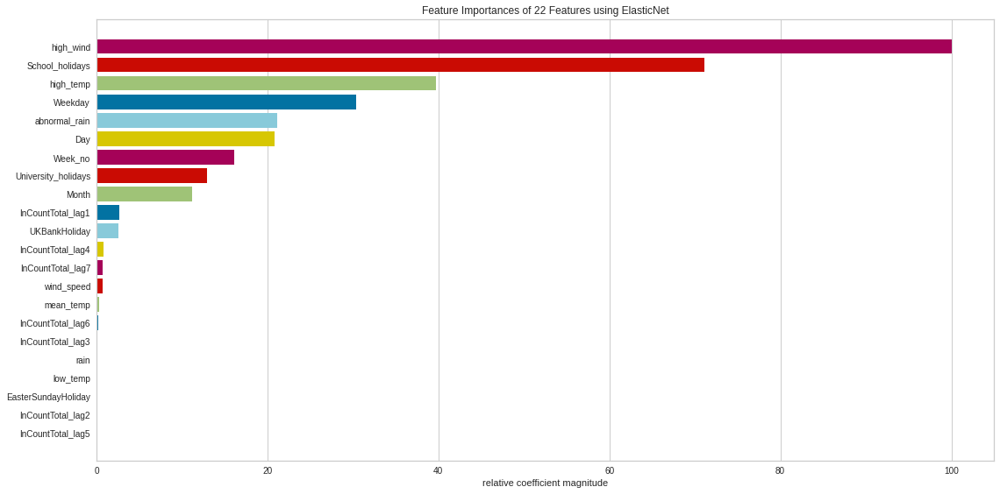

Cross CV validation...
huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


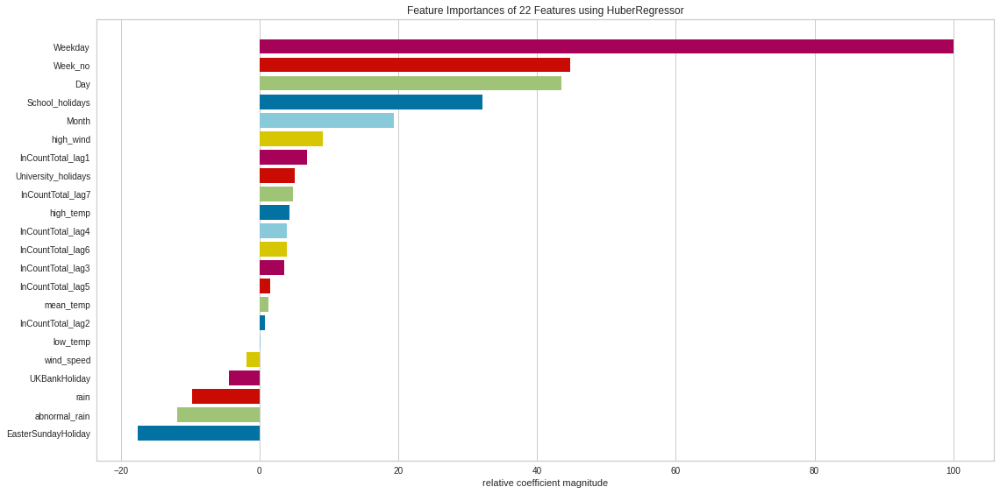

Cross CV validation...
passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


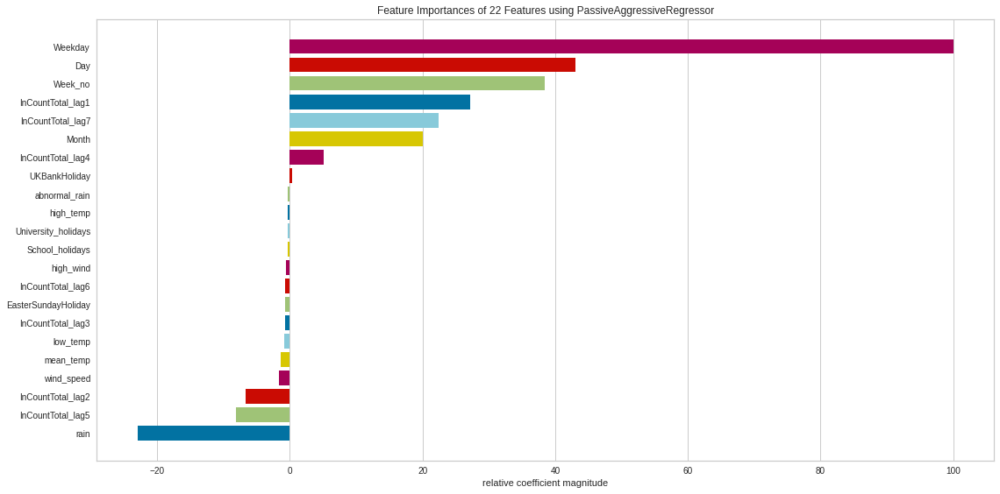

Cross CV validation...
sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


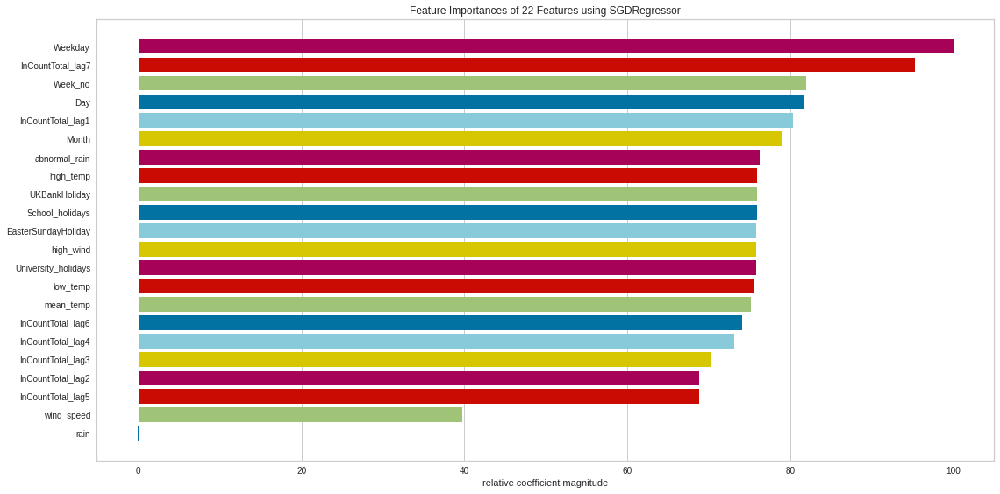

Cross CV validation...
knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


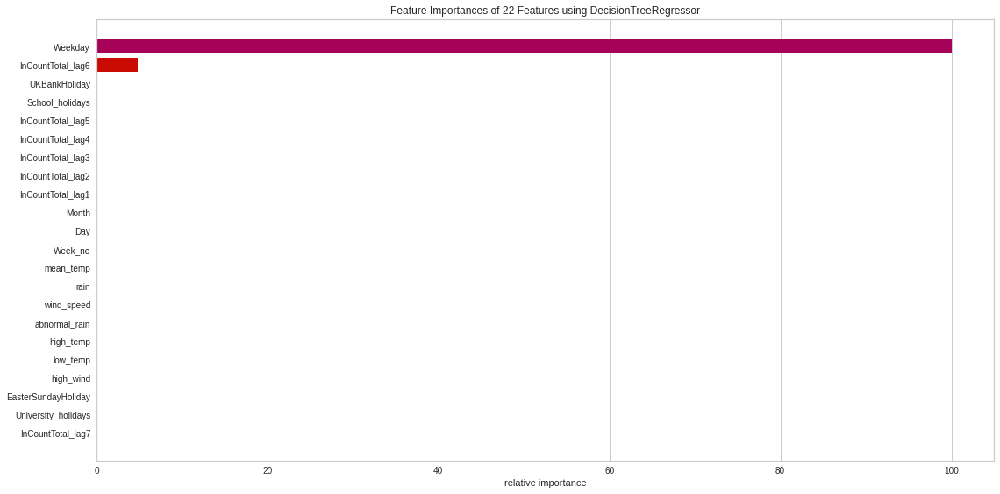

Cross CV validation...
extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


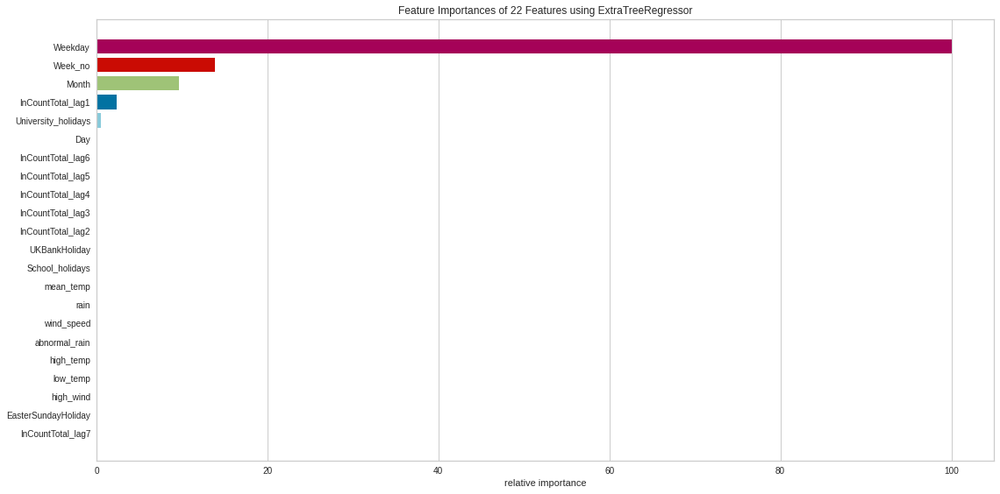

Cross CV validation...
svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


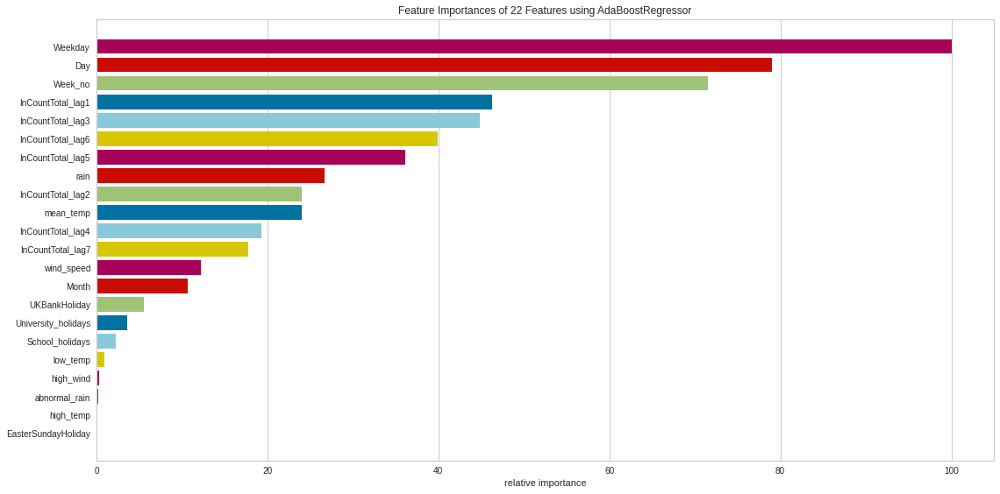

Cross CV validation...
bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


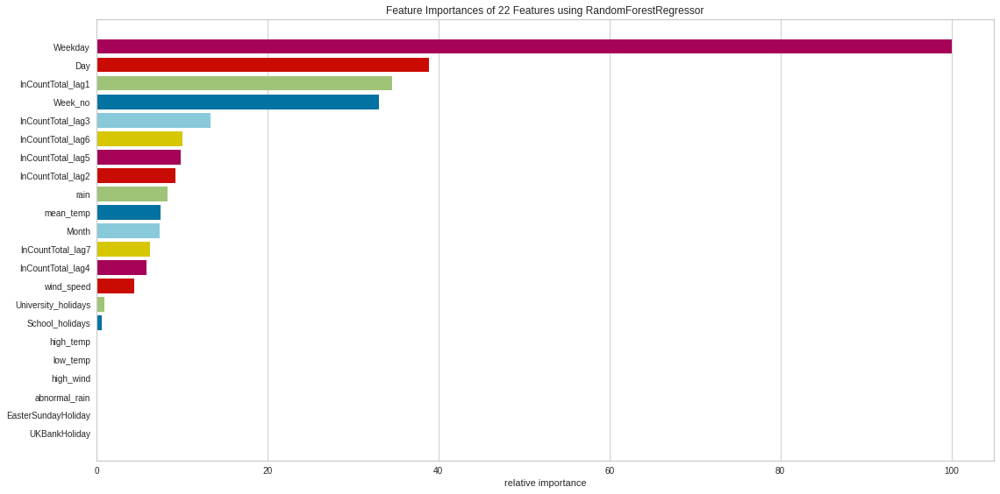

Cross CV validation...
extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


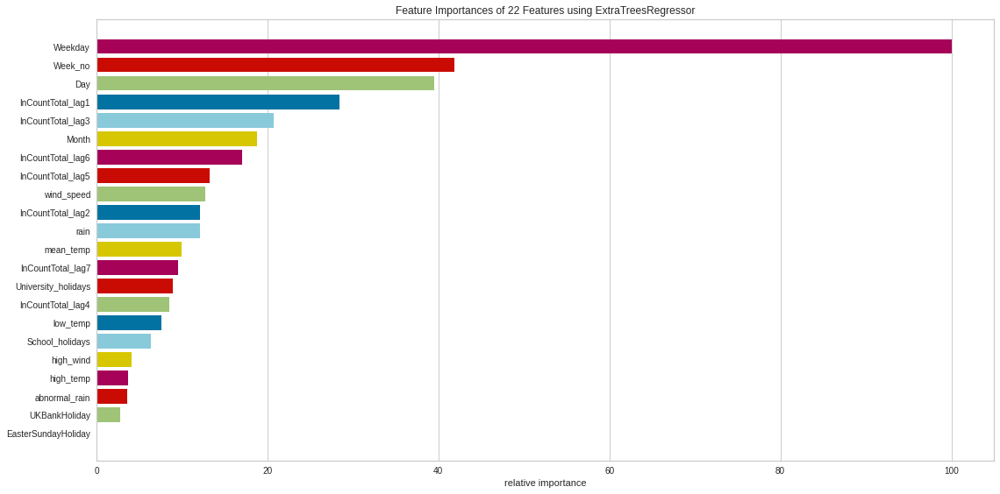

Cross CV validation...
gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


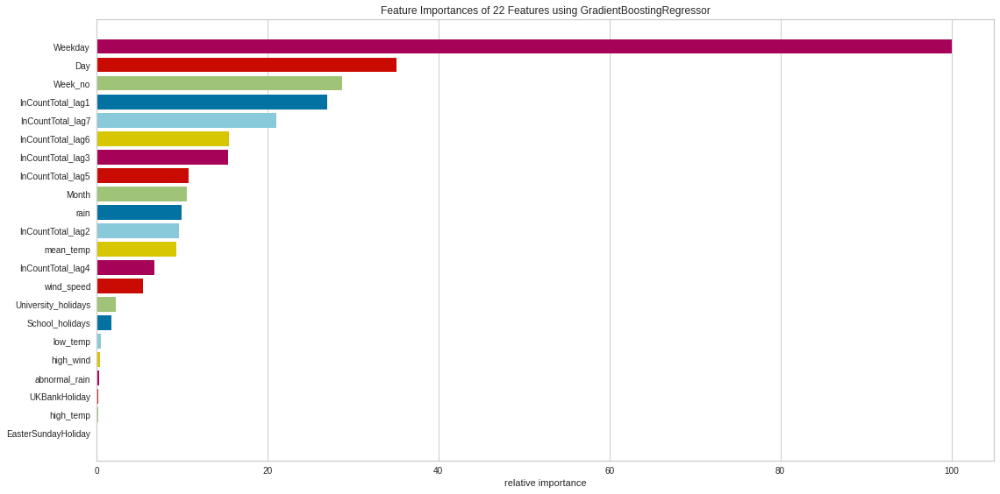

Cross CV validation...
XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


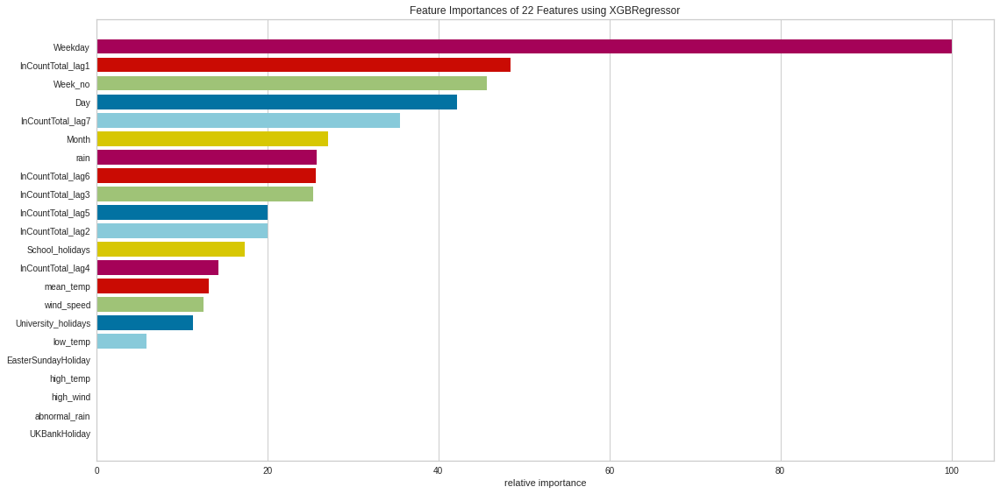

Cross CV validation...
LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f92714d76d8>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001,

In [34]:
reg_models = regression_model(data_outliersremoved,dataset_type='Outliers_Removed')
_,_,_, _,_,loss_df_outlier_removed = reg_models.train_and_evaluate_models(RFEcross_validation=False)
loss_values_all_models.append(loss_df_outlier_removed)

In [35]:
loss_df_outlier_removed.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
36,bagging_Outliers_Removed_default_model,11.815070,0.004205,-0.013330,0.044784,-0.009810,0.064849,0.472342,0.435897,-1907.281280,-1818.093357
39,random_forest_Outliers_Removed_default_model,11.878525,0.004131,-0.012771,0.044793,-0.007844,0.064274,0.481667,0.445866,-1913.646660,-1824.458737
54,CategoricalGradientBoosting_Outliers_Removed_d...,11.991476,0.004348,-0.012474,0.045386,-0.007304,0.065937,0.454493,0.416815,-1895.404784,-1806.216861
40,random_forest_Outliers_Removed_rscv_model,12.102028,0.004409,-0.015046,0.045848,-0.012178,0.066401,0.446783,0.408573,-1890.394464,-1801.206541
45,gradient_boosting_regressor_Outliers_Removed_d...,12.205760,0.004710,-0.017622,0.047270,-0.021842,0.068632,0.408985,0.368164,-1866.800007,-1777.612084
52,LightGradientBoosting_Outliers_Removed_rscv_model,12.250636,0.004421,-0.016398,0.046592,-0.017115,0.066490,0.445303,0.406991,-1889.440826,-1800.252903
42,extra_trees_regressor_Outliers_Removed_default...,12.529236,0.004402,-0.015246,0.047466,-0.014811,0.066346,0.447709,0.409563,-1890.992657,-1801.804734
43,extra_trees_regressor_Outliers_Removed_rscv_model,12.538173,0.004435,-0.015710,0.047578,-0.015819,0.066594,0.443570,0.405138,-1888.327207,-1799.139284
48,XGBoost_Outliers_Removed_default_model,12.577377,0.004815,-0.017862,0.048142,-0.018978,0.069387,0.395919,0.354196,-1858.993631,-1769.805708
46,gradient_boosting_regressor_Outliers_Removed_r...,12.674935,0.004782,-0.017924,0.048787,-0.018662,0.069151,0.400024,0.358584,-1861.427696,-1772.239773


Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


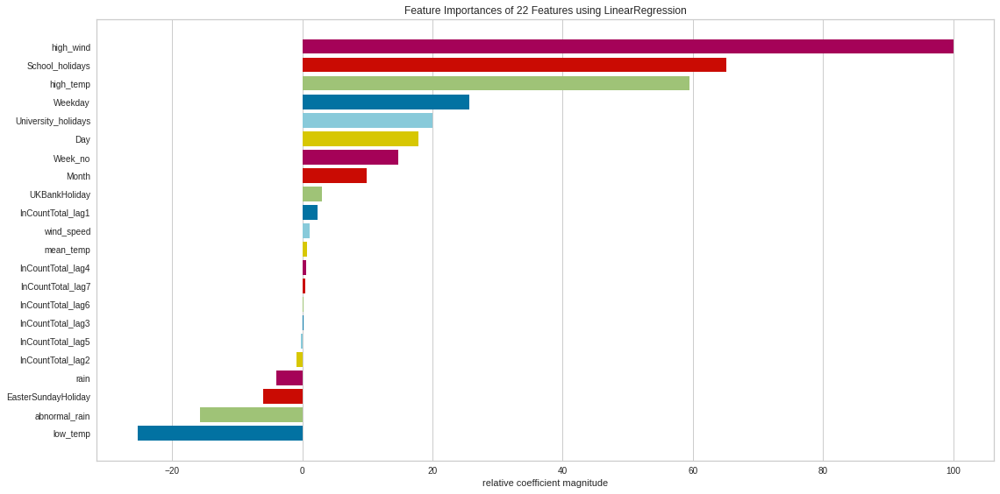

Cross CV validation...
lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


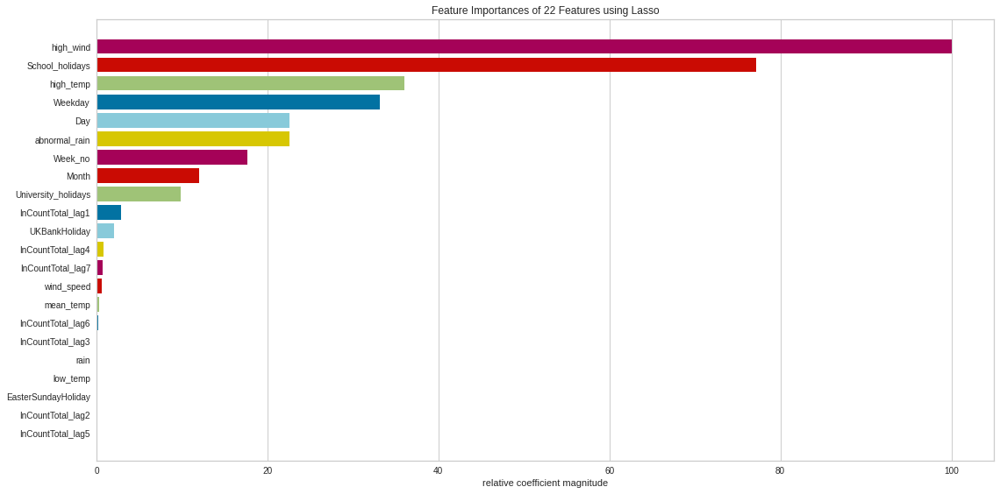

Cross CV validation...
ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


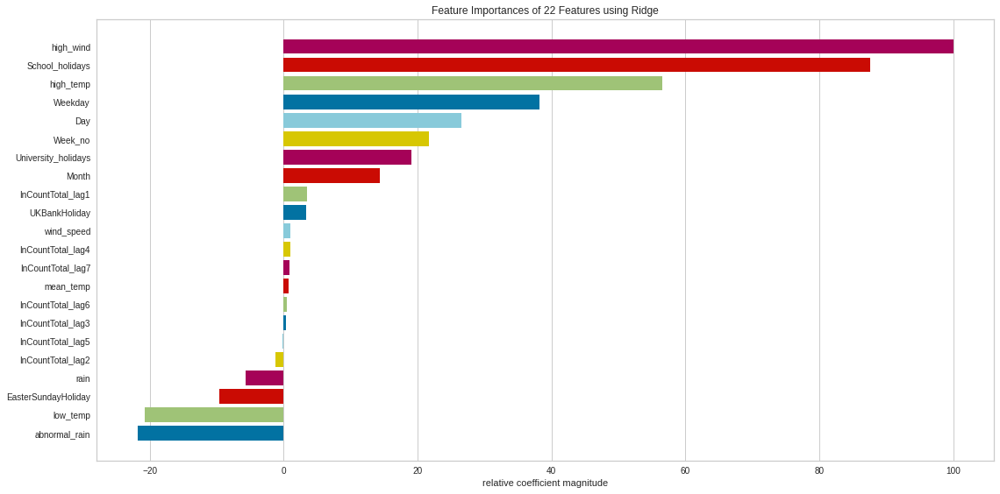

Cross CV validation...
elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


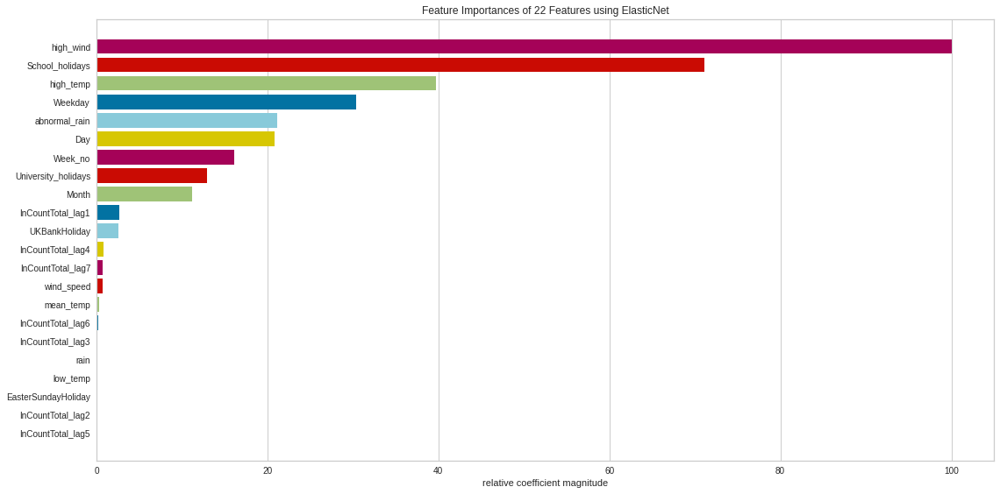

Cross CV validation...
huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


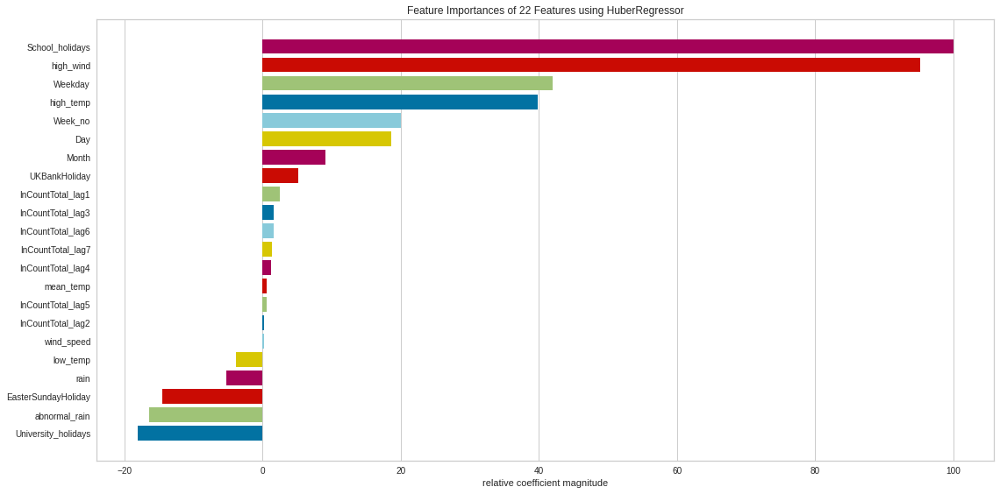

Cross CV validation...
passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


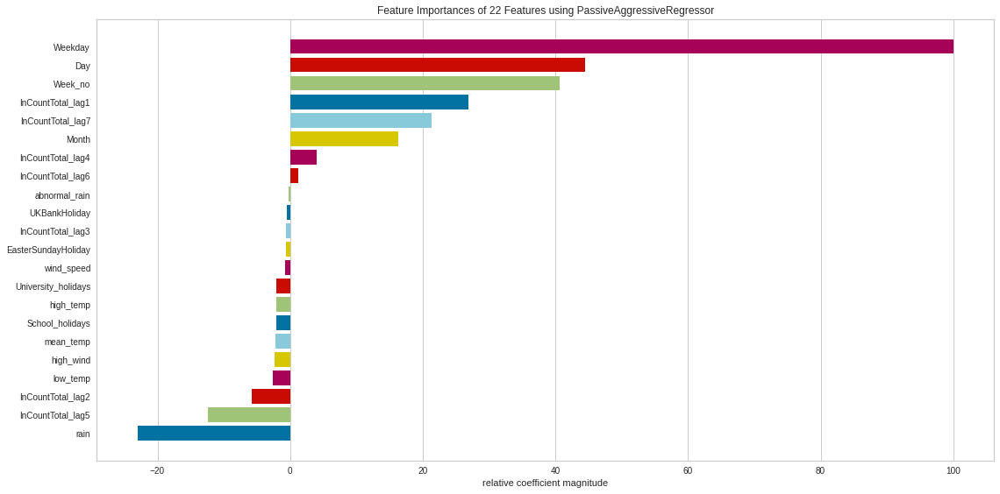

Cross CV validation...
sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


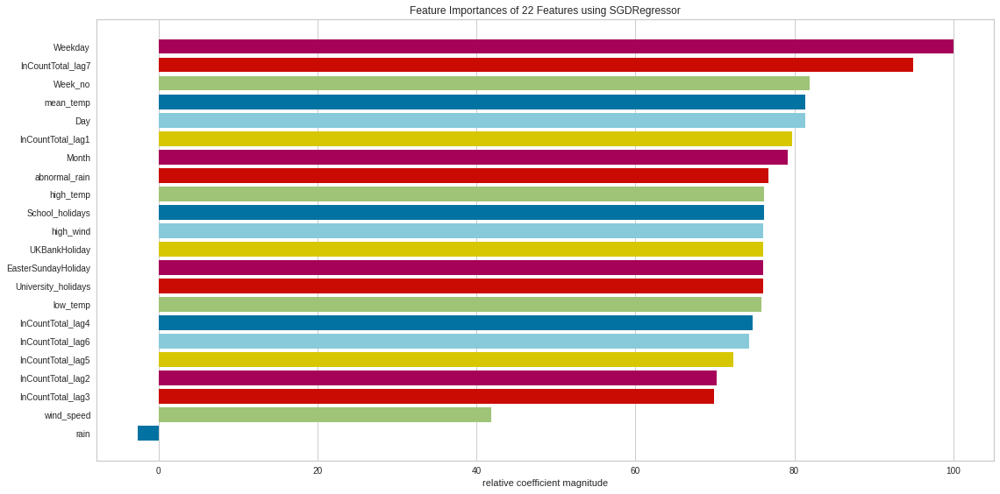

Cross CV validation...
knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


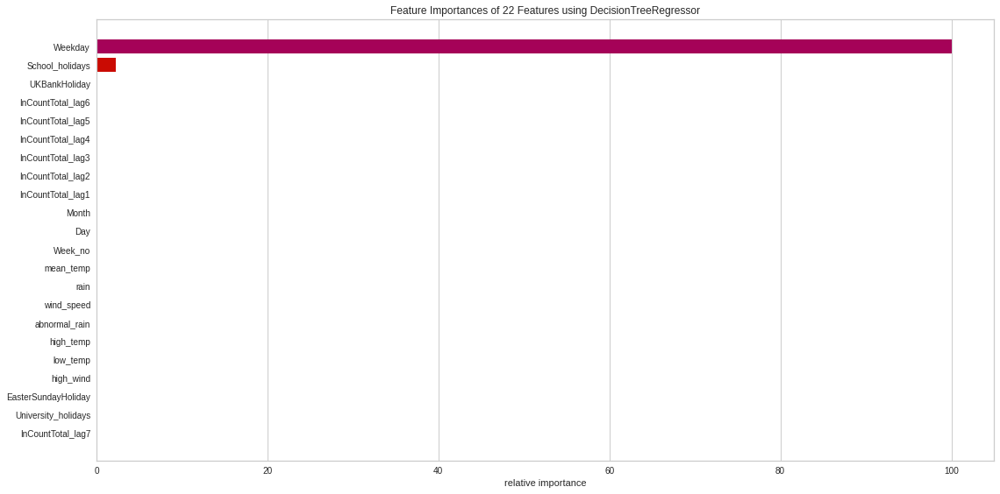

Cross CV validation...
extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


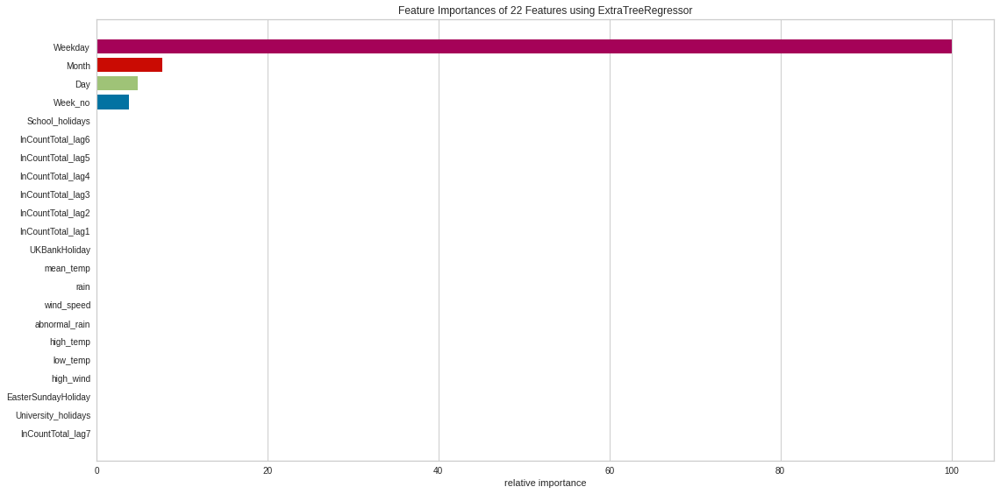

Cross CV validation...
svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


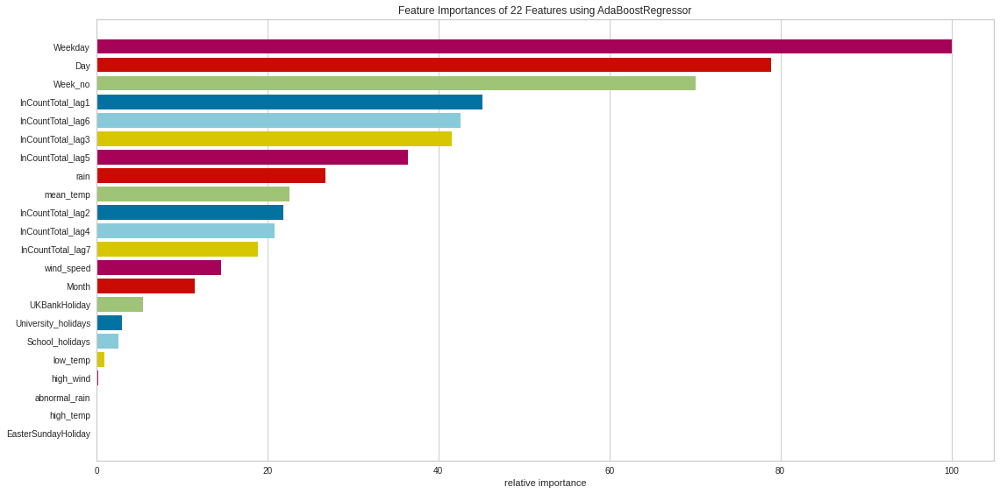

Cross CV validation...
bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


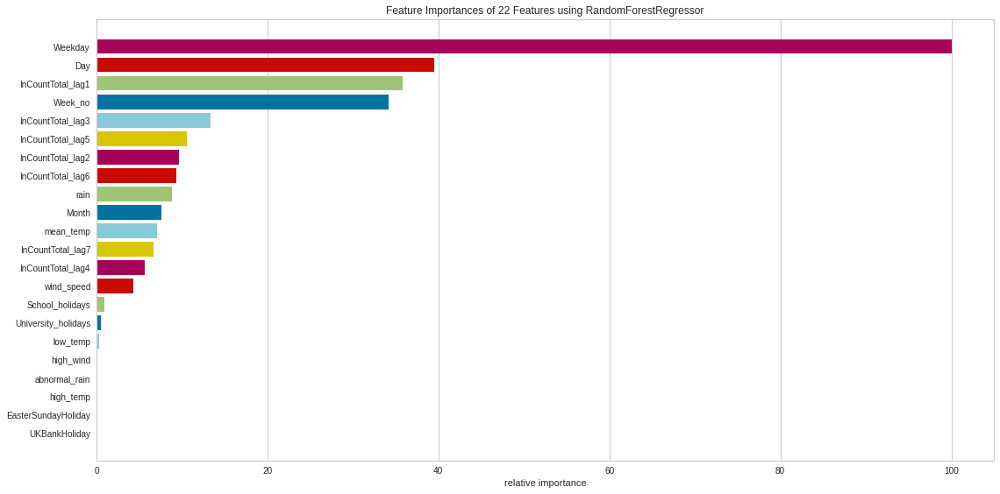

Cross CV validation...
extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


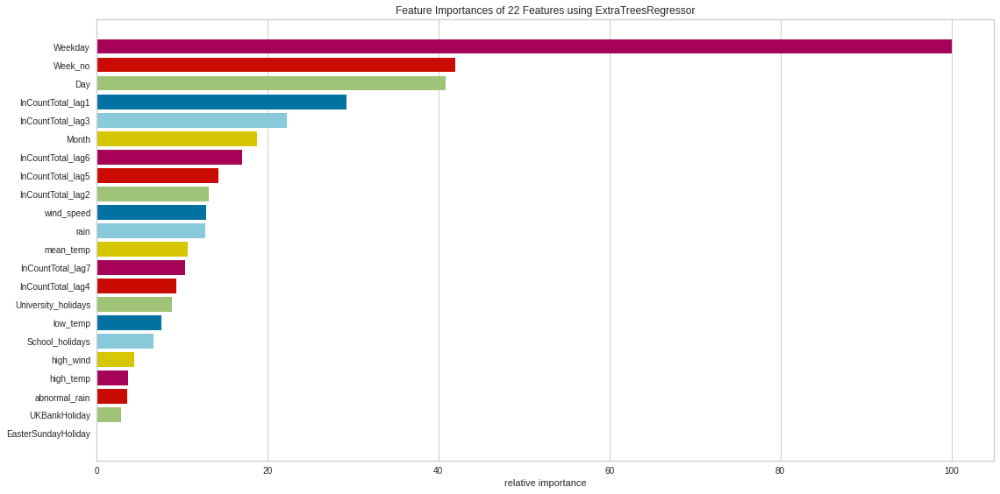

Cross CV validation...
gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


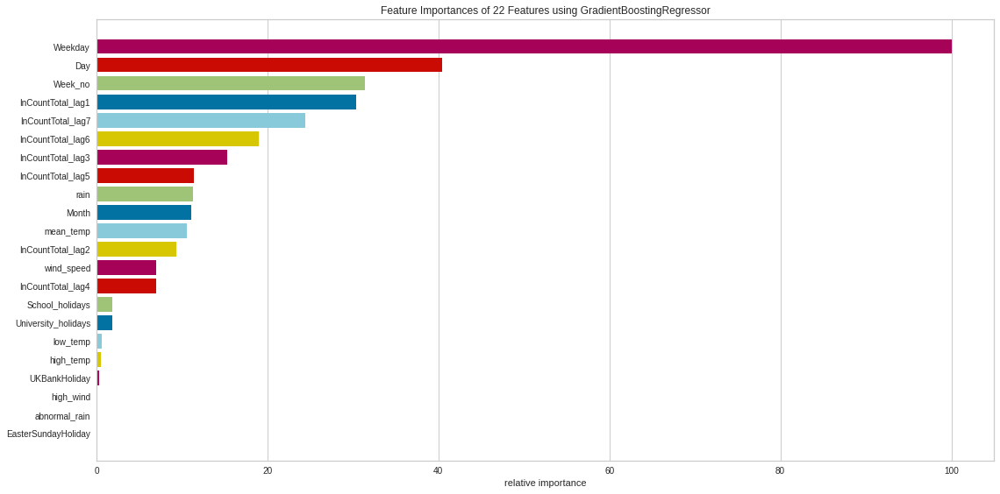

Cross CV validation...
XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


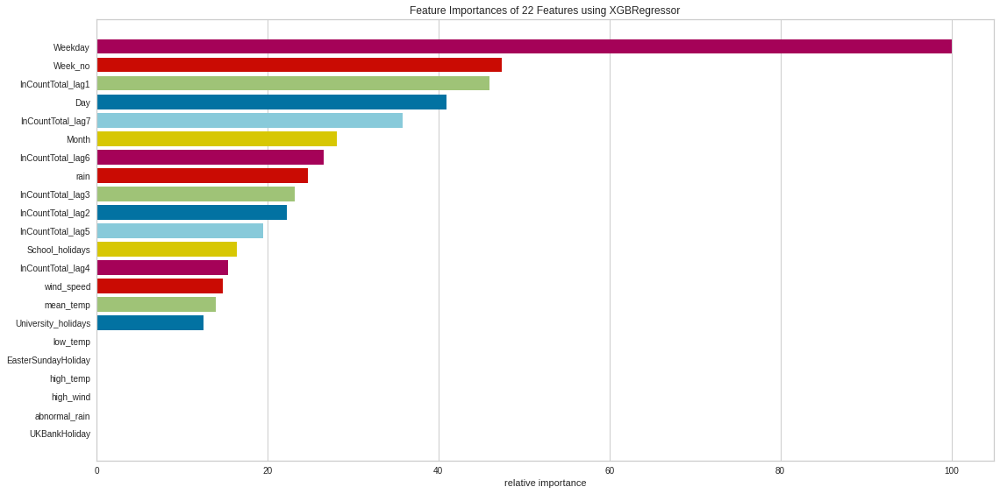

Cross CV validation...
LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f92717b1278>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001,

In [36]:
reg_models = regression_model(data_outliersremoved,dataset_type='Outliers_Removed_shuffled')
_,_,_, _,_,loss_df_outlier_removed = reg_models.train_and_evaluate_models(RFEcross_validation=False, shuffle=True)
loss_values_all_models.append(loss_df_outlier_removed)

In [37]:
loss_df_outlier_removed.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
39,random_forest_Outliers_Removed_shuffled_defaul...,11.697544,0.004136,-0.013269,0.044251,-0.009544,0.064315,0.481009,0.445163,-1913.193796,-1824.005873
36,bagging_Outliers_Removed_shuffled_default_model,11.759516,0.004164,-0.013640,0.044665,-0.010641,0.064529,0.477538,0.441452,-1910.814239,-1821.626316
45,gradient_boosting_regressor_Outliers_Removed_s...,12.213195,0.004682,-0.017509,0.047274,-0.021555,0.068422,0.412601,0.372030,-1868.991295,-1779.803372
52,LightGradientBoosting_Outliers_Removed_shuffle...,12.250636,0.004421,-0.016398,0.046592,-0.017115,0.066490,0.445303,0.406991,-1889.440826,-1800.252903
40,random_forest_Outliers_Removed_shuffled_rscv_m...,12.332504,0.004447,-0.013993,0.046429,-0.008571,0.066687,0.442008,0.403468,-1887.326676,-1798.138753
54,CategoricalGradientBoosting_Outliers_Removed_s...,12.358471,0.004391,-0.013838,0.046761,-0.010404,0.066263,0.449089,0.411038,-1891.885690,-1802.697767
55,CategoricalGradientBoosting_Outliers_Removed_s...,12.382344,0.004613,-0.016361,0.047490,-0.016135,0.067916,0.421260,0.381287,-1874.292851,-1785.104928
43,extra_trees_regressor_Outliers_Removed_shuffle...,12.415550,0.004390,-0.015855,0.047120,-0.016406,0.066259,0.449149,0.411103,-1891.924883,-1802.736960
42,extra_trees_regressor_Outliers_Removed_shuffle...,12.455072,0.004412,-0.015203,0.047198,-0.014596,0.066420,0.446477,0.408246,-1890.197171,-1801.009248
48,XGBoost_Outliers_Removed_shuffled_default_model,12.577377,0.004815,-0.017862,0.048142,-0.018978,0.069387,0.395919,0.354196,-1858.993631,-1769.805708


### 7.1.4 Model training with extra features

Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


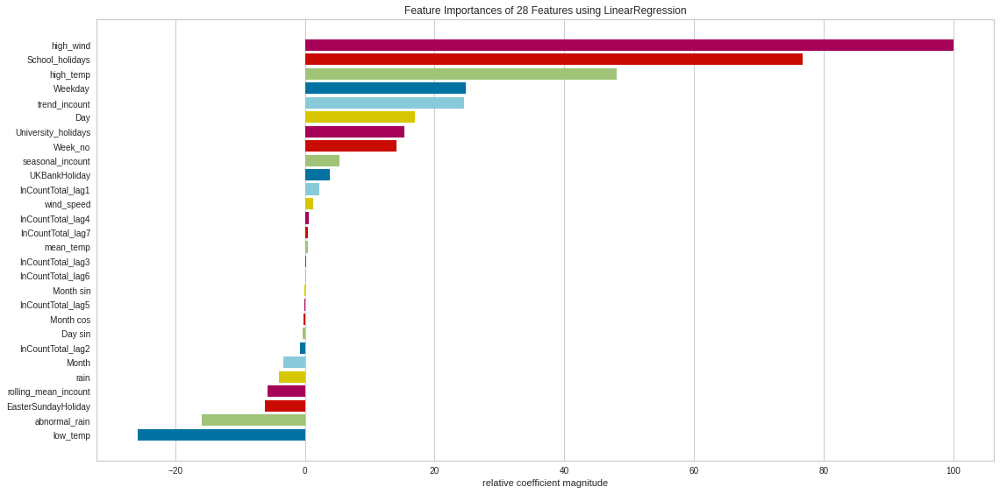

Cross CV validation...
lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


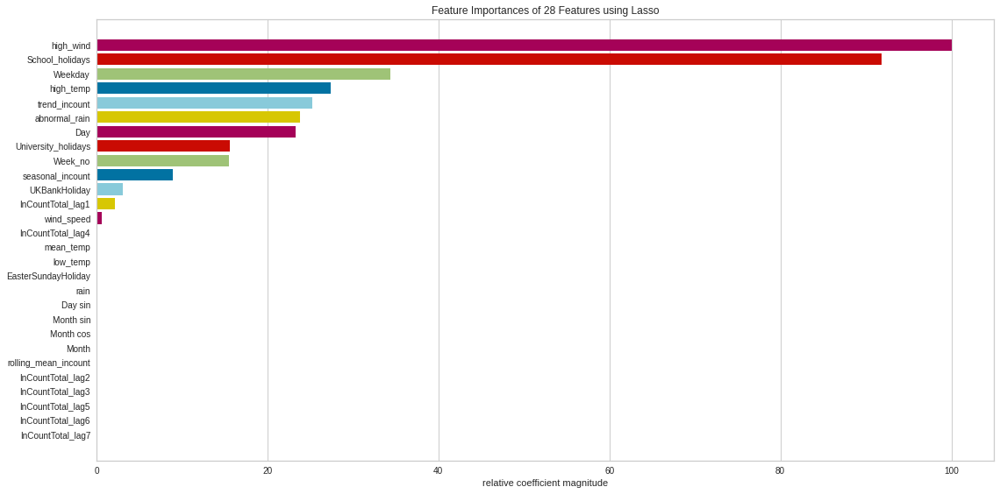

Cross CV validation...
ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


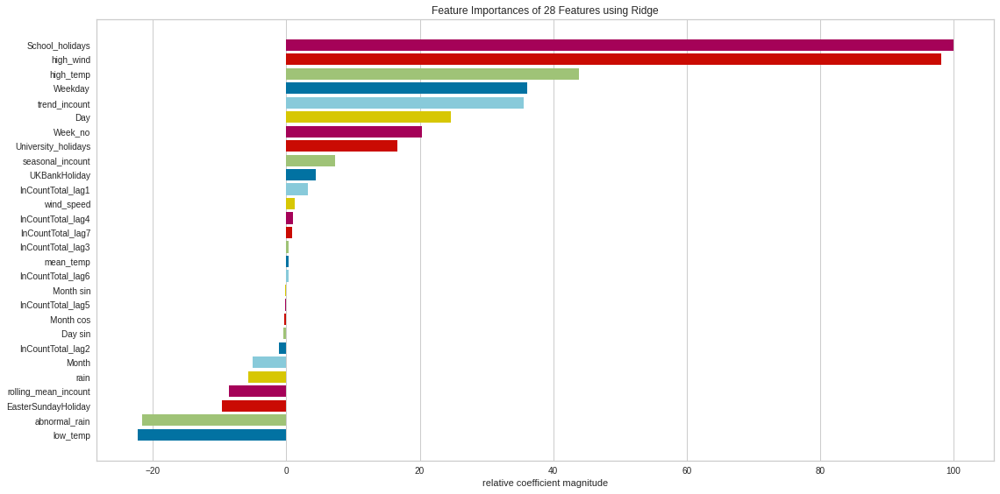

Cross CV validation...
elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


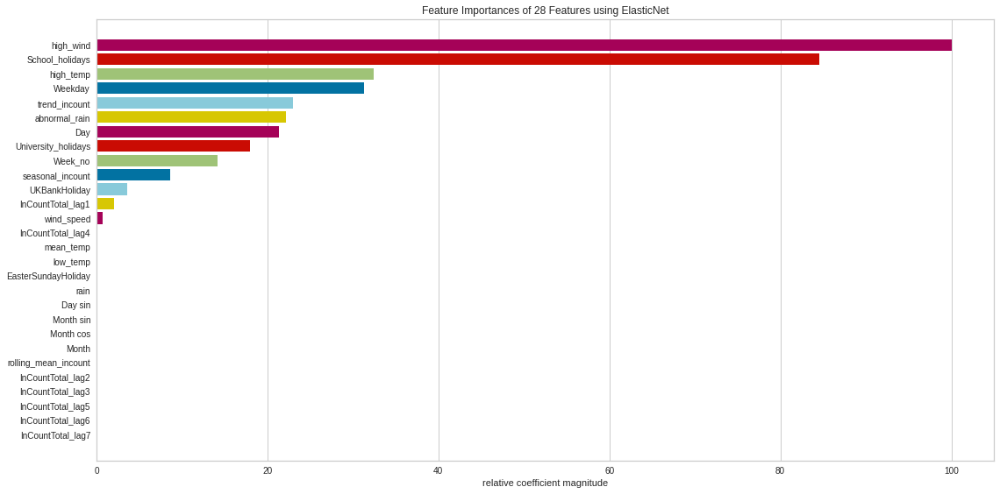

Cross CV validation...
huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


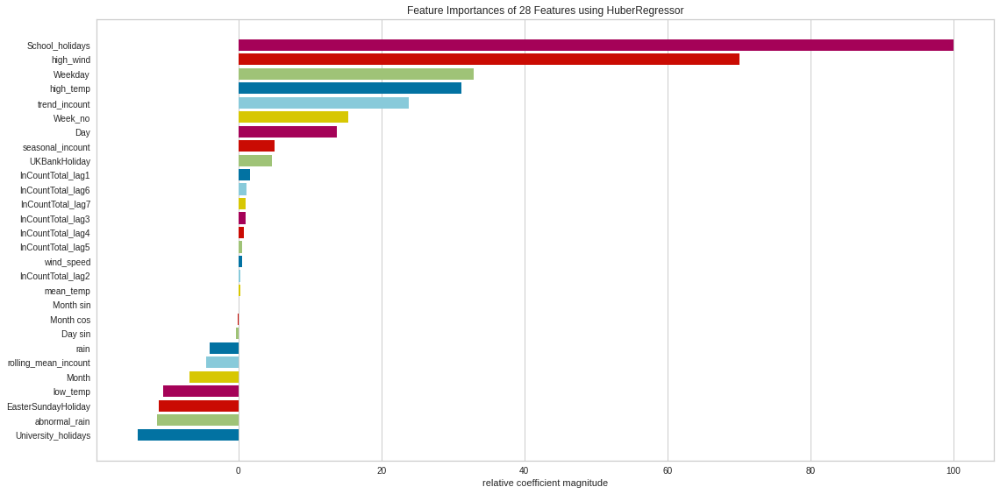

Cross CV validation...
passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


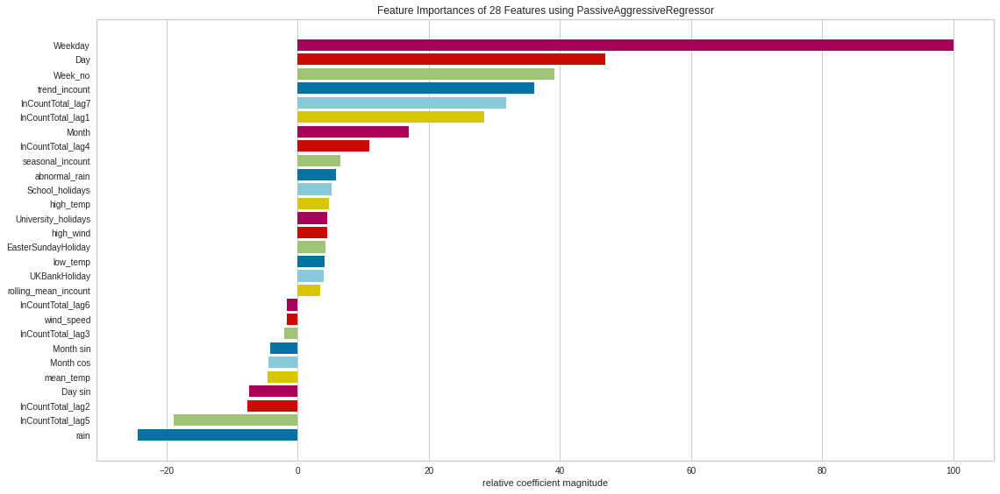

Cross CV validation...
sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


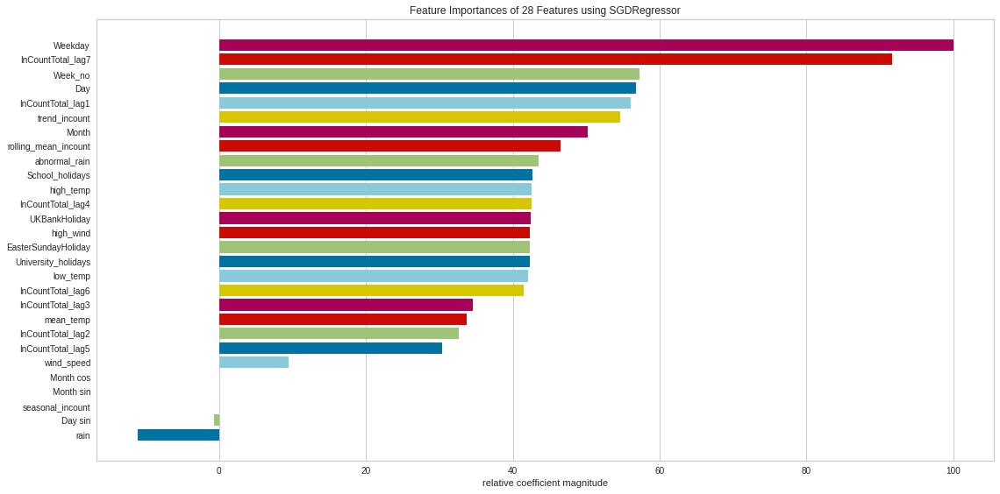

Cross CV validation...
knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


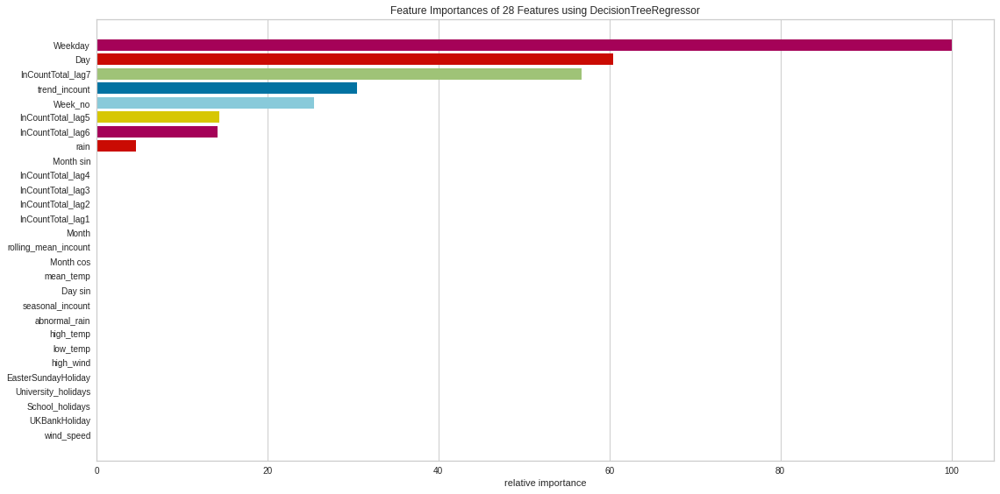

Cross CV validation...
extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


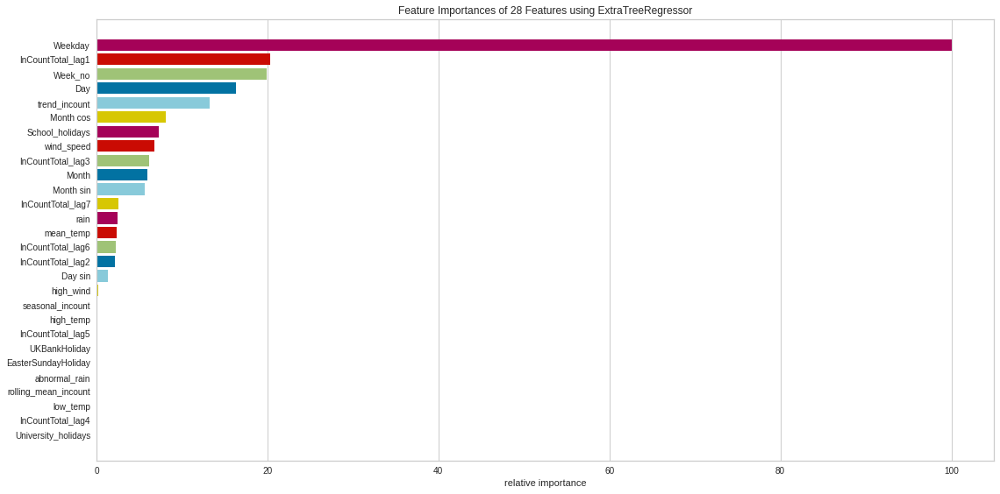

Cross CV validation...
svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


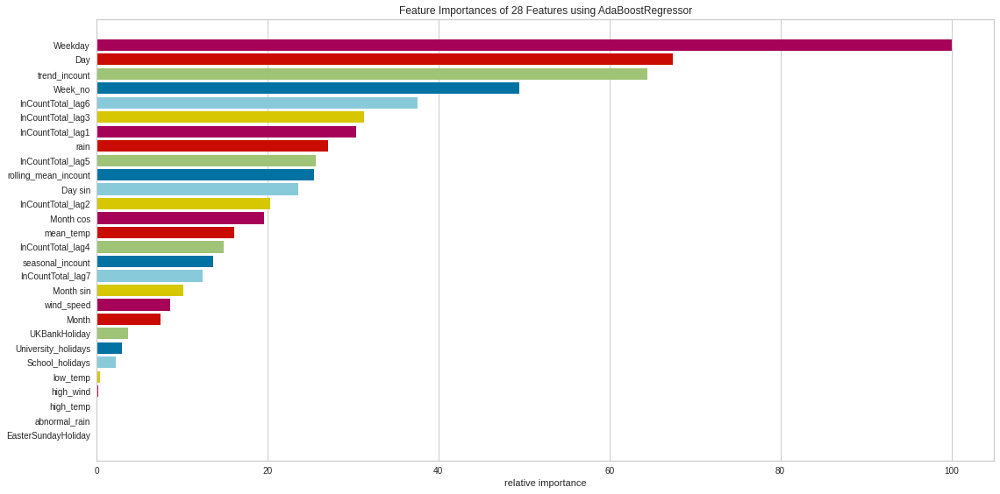

Cross CV validation...
bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


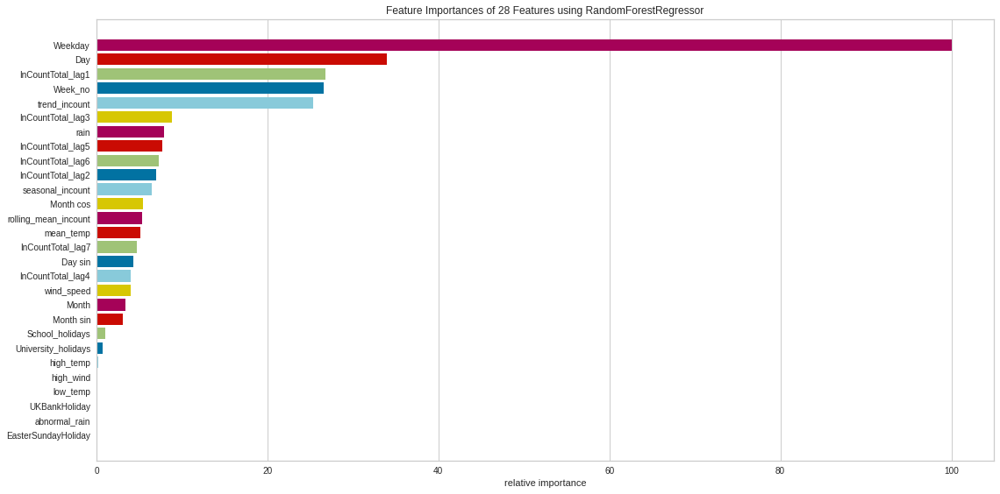

Cross CV validation...
extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


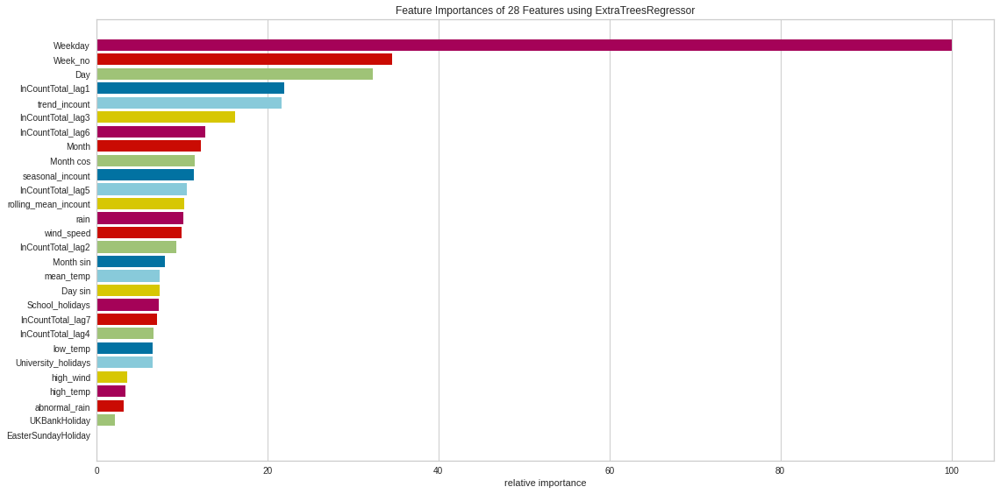

Cross CV validation...
gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


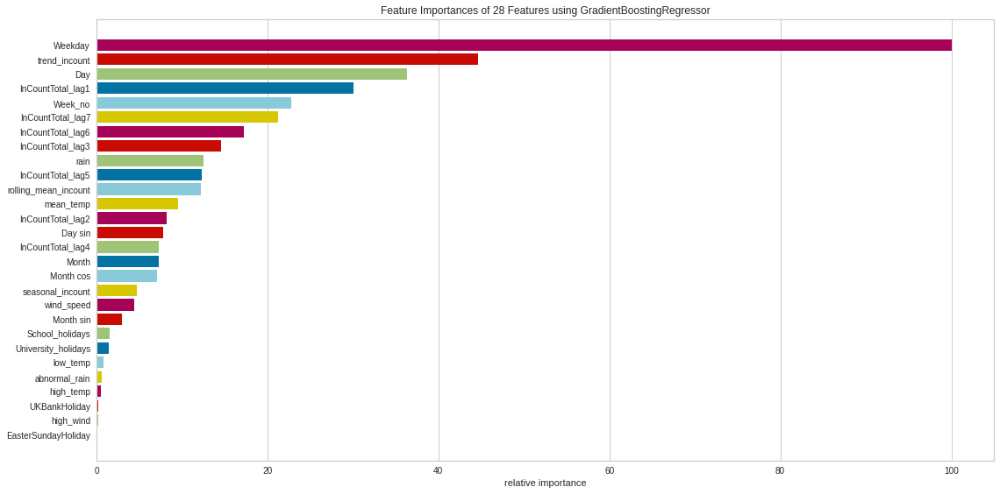

Cross CV validation...
XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


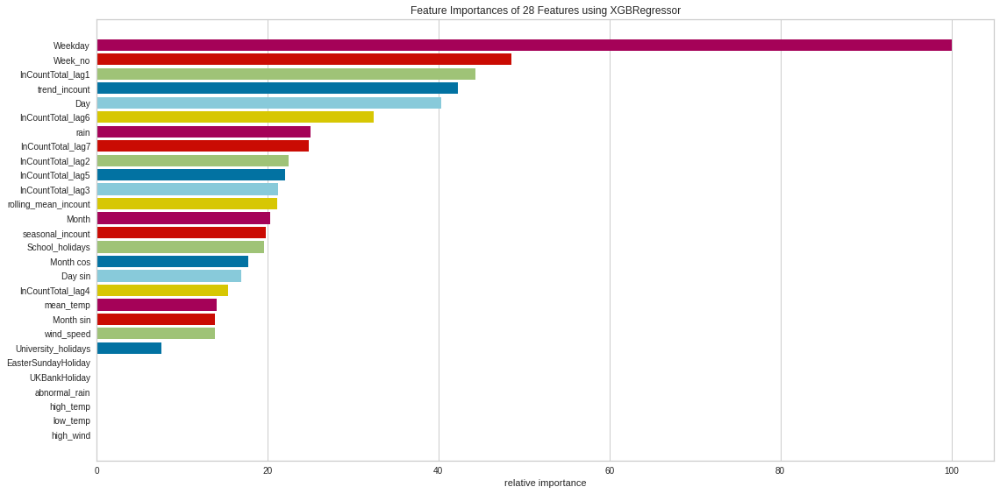

Cross CV validation...
LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f9271800cf8>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001,

In [38]:
reg_models = regression_model(data_outliersremoved,dataset_type='OutliersRemoved_extra_features_shuffled')
_,_,_, _, _, loss_normal_df = reg_models.train_and_evaluate_models(RFEcross_validation=False,shuffle=True, extra_input_features=True)
loss_values_all_models.append(loss_normal_df)

In [39]:
loss_df = pd.concat([loss_each_model for loss_each_model in loss_values_all_models], axis=0).reset_index(drop=True)


In [40]:
loss_df.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
293,random_forest_Outliers_Removed_shuffled_defaul...,11.697544,0.004136,-0.013269,0.044251,-0.009544,0.064315,0.481009,0.445163,-1913.193796,-1824.005873
290,bagging_Outliers_Removed_shuffled_default_model,11.759516,0.004164,-0.013640,0.044665,-0.010641,0.064529,0.477538,0.441452,-1910.814239,-1821.626316
230,bagging_Outliers_Removed_default_model,11.815070,0.004205,-0.013330,0.044784,-0.009810,0.064849,0.472342,0.435897,-1907.281280,-1818.093357
233,random_forest_Outliers_Removed_default_model,11.878525,0.004131,-0.012771,0.044793,-0.007844,0.064274,0.481667,0.445866,-1913.646660,-1824.458737
248,CategoricalGradientBoosting_Outliers_Removed_d...,11.991476,0.004348,-0.012474,0.045386,-0.007304,0.065937,0.454493,0.416815,-1895.404784,-1806.216861
234,random_forest_Outliers_Removed_rscv_model,12.102028,0.004409,-0.015046,0.045848,-0.012178,0.066401,0.446783,0.408573,-1890.394464,-1801.206541
358,extra_trees_regressor_OutliersRemoved_extra_fe...,12.128559,0.003951,0.001822,0.043080,3.487159,0.062699,0.472110,NaN,NaN,NaN
239,gradient_boosting_regressor_Outliers_Removed_d...,12.205760,0.004710,-0.017622,0.047270,-0.021842,0.068632,0.408985,0.368164,-1866.800007,-1777.612084
350,bagging_OutliersRemoved_extra_features_shuffle...,12.209038,0.004184,-0.005161,0.044888,0.015016,0.064681,0.475084,0.428532,-1897.141257,-1784.686920
299,gradient_boosting_regressor_Outliers_Removed_s...,12.213195,0.004682,-0.017509,0.047274,-0.021555,0.068422,0.412601,0.372030,-1868.991295,-1779.803372


### 7.1.5 Model training with PCA feaures

Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


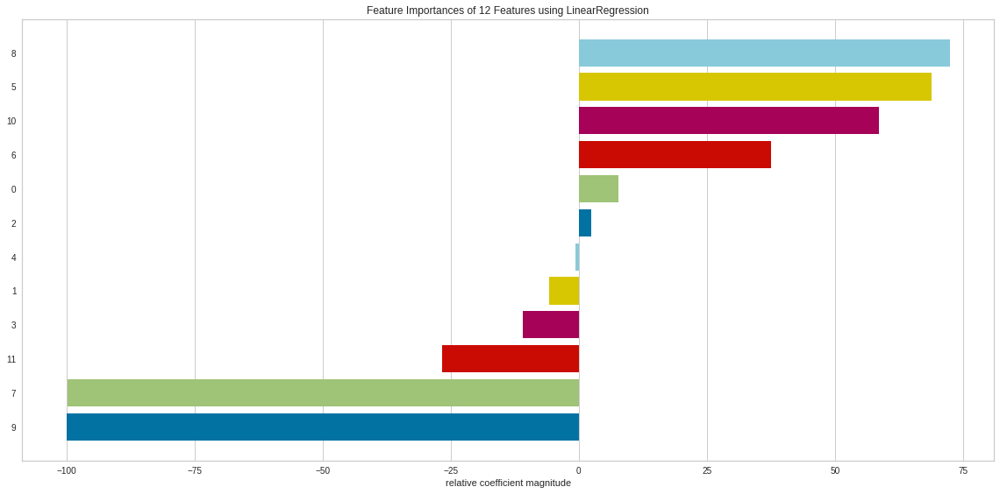

Cross CV validation...
lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


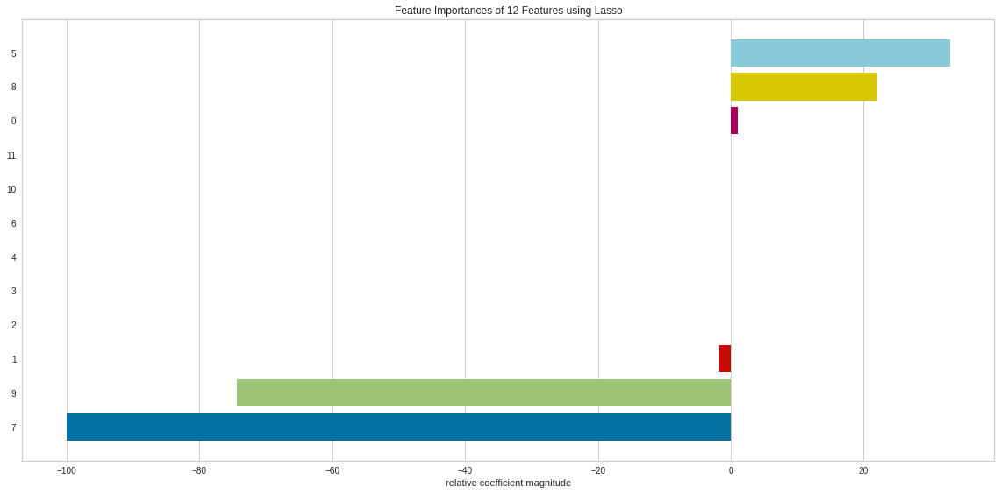

Cross CV validation...
ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


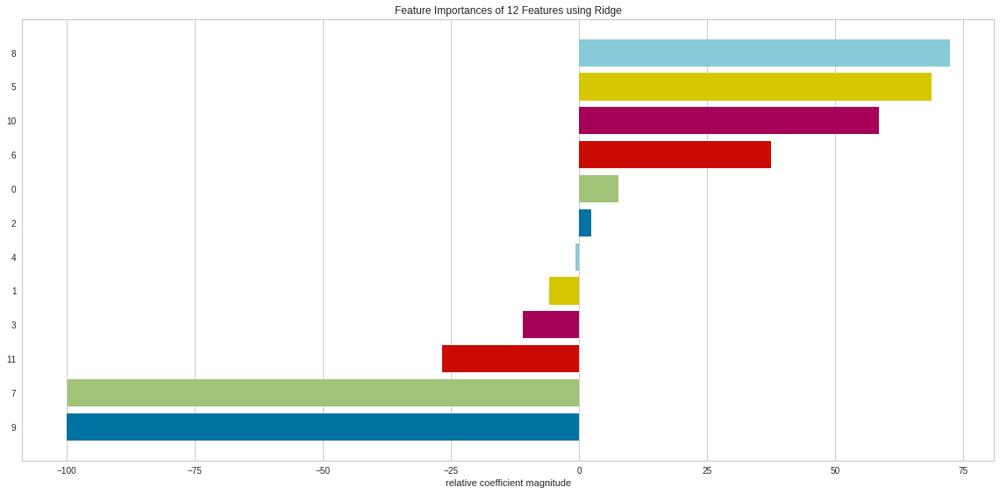

Cross CV validation...
elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


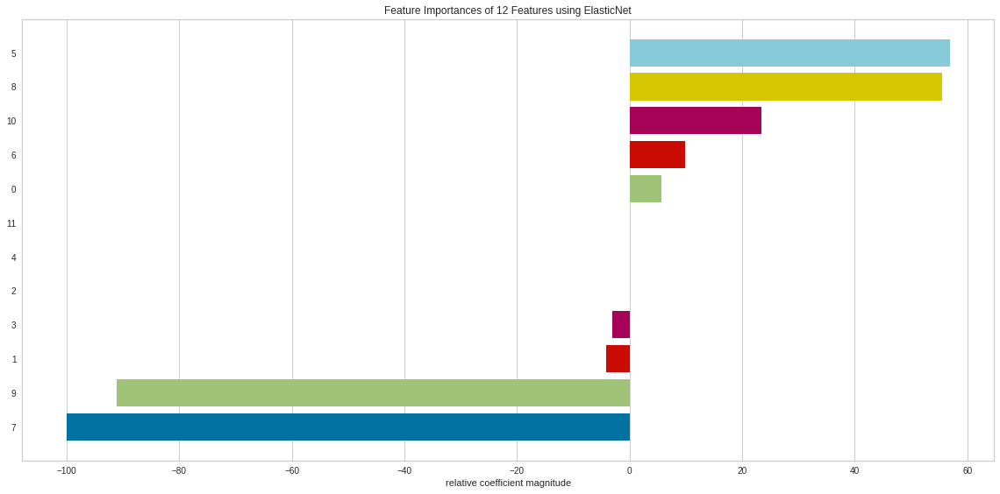

Cross CV validation...
huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


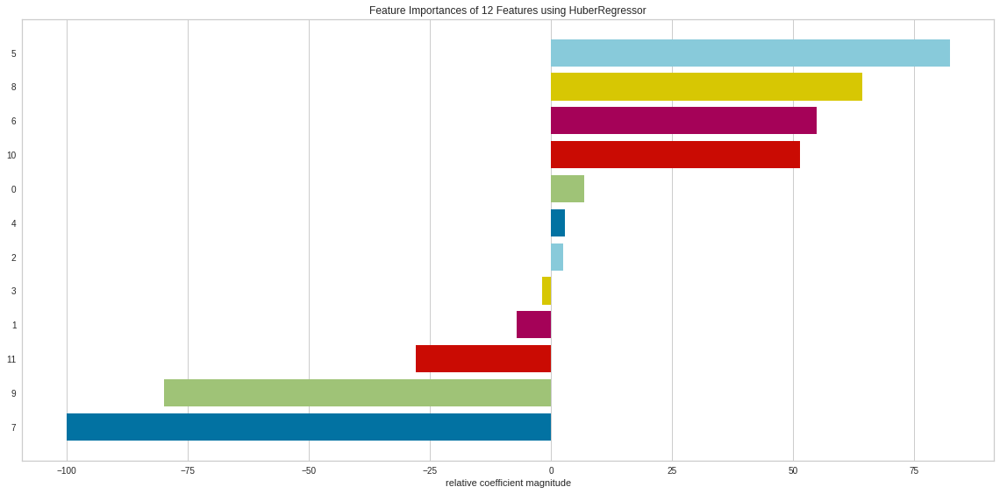

Cross CV validation...
passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


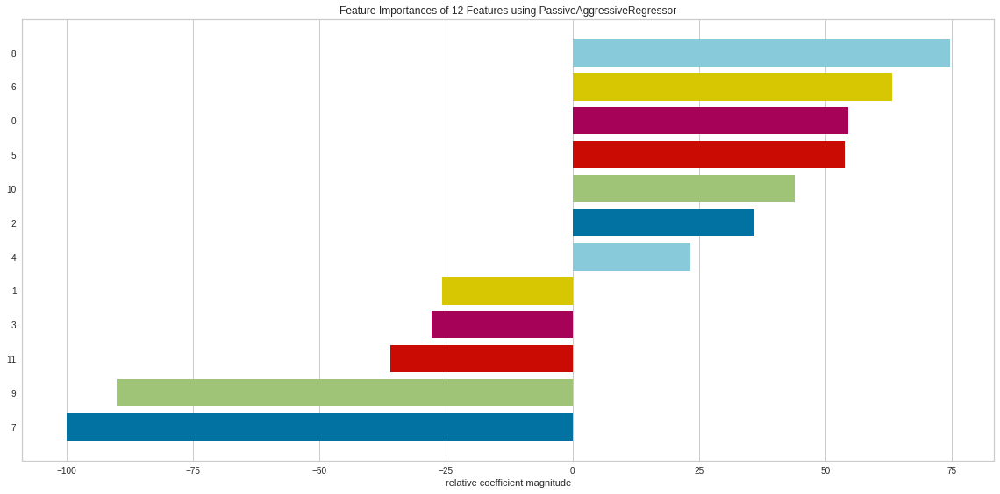

Cross CV validation...
sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


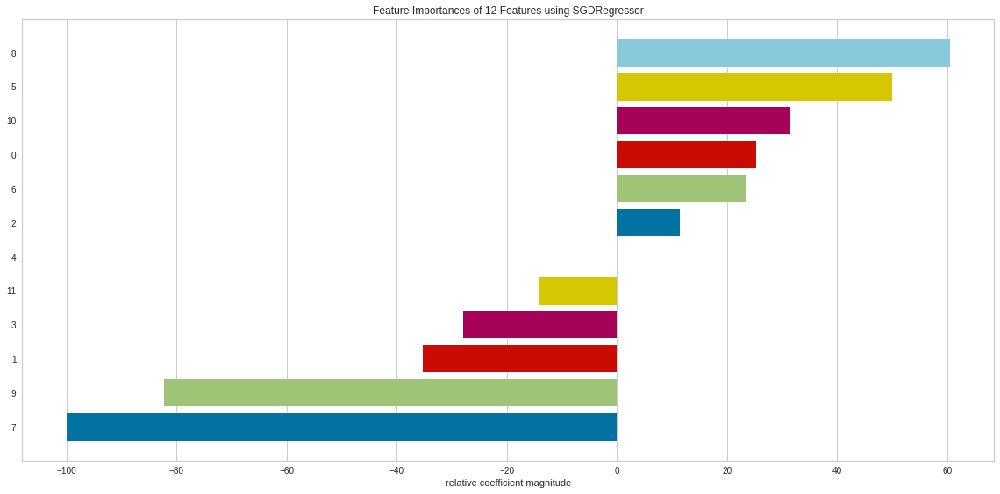

Cross CV validation...
knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


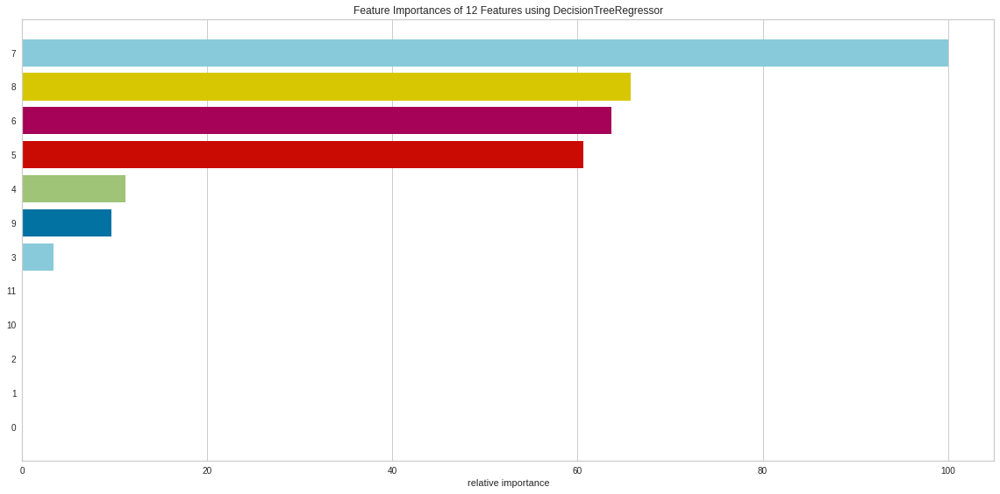

Cross CV validation...
extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


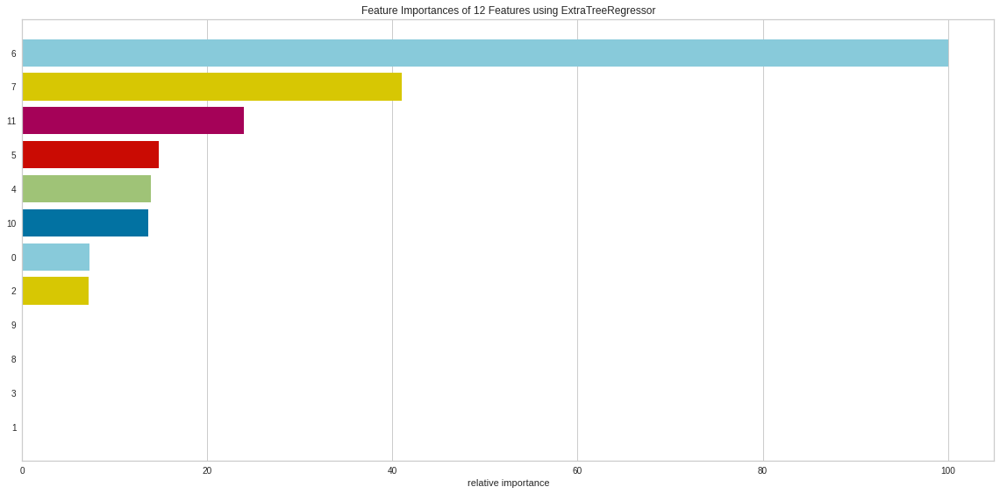

Cross CV validation...
svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


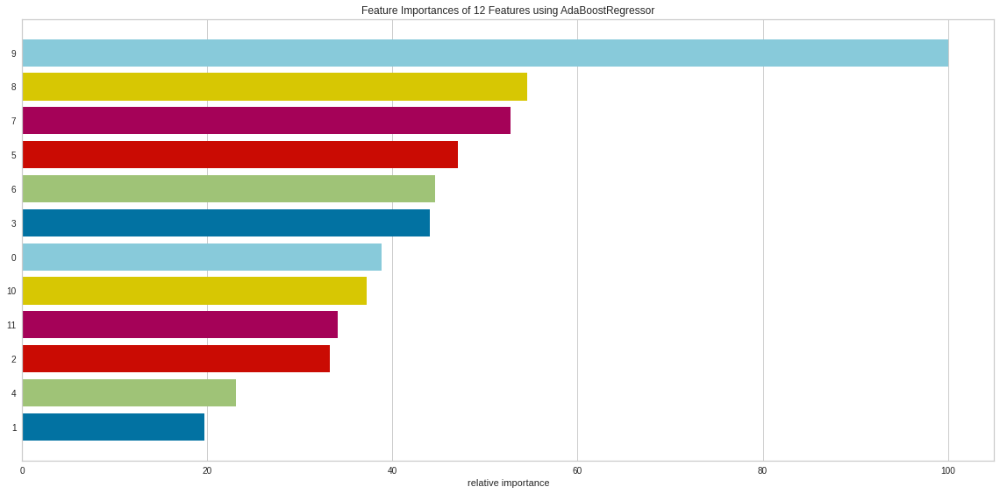

Cross CV validation...
bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


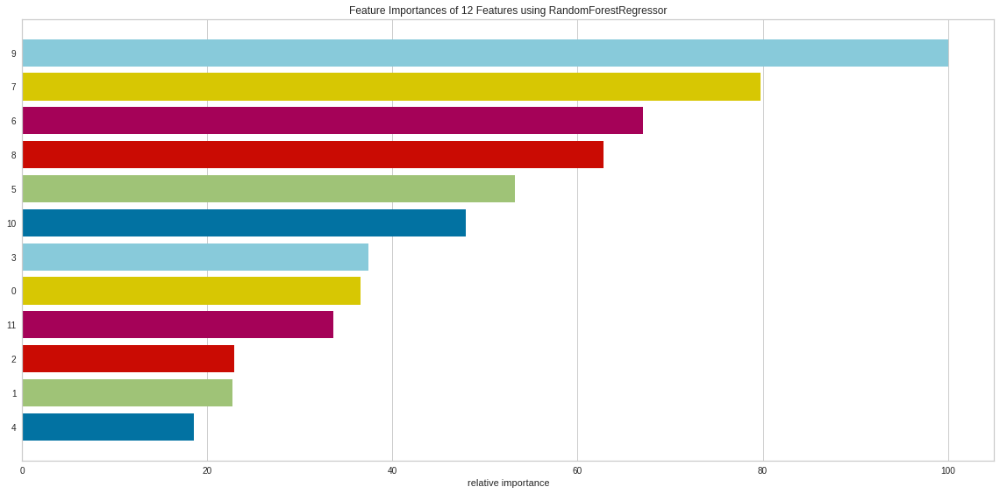

Cross CV validation...
extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


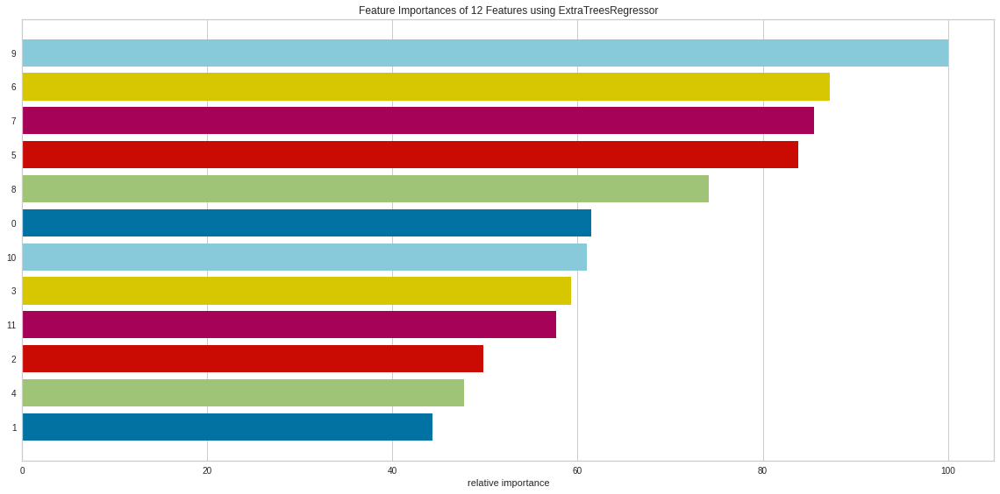

Cross CV validation...
gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


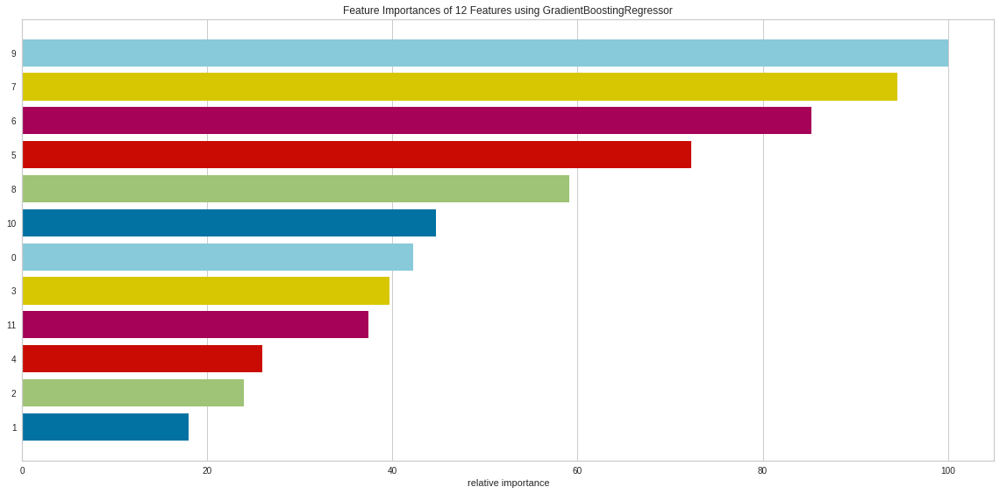

Cross CV validation...
XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


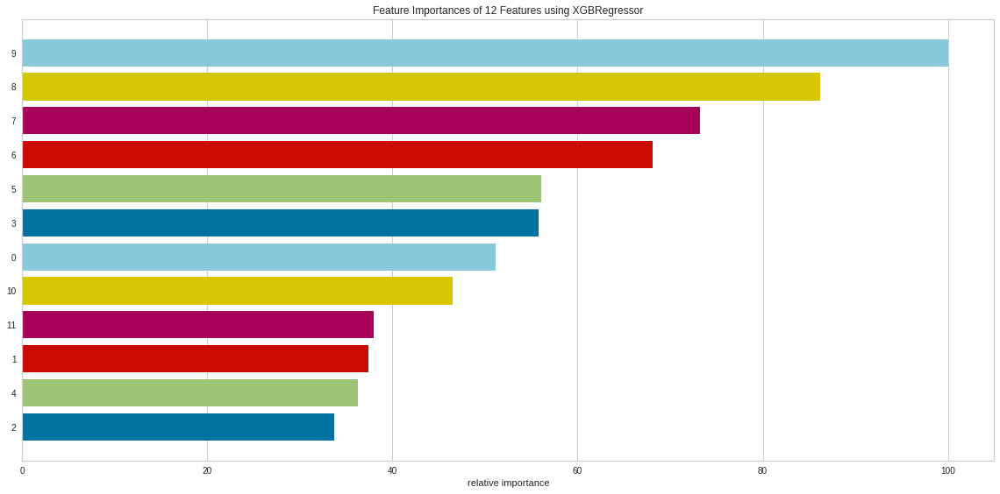

Cross CV validation...
LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f92788567f0>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001,

In [41]:
reg_models = regression_model(princdf,dataset_type='PCA_features')
_,_,_, _, _, loss_pca_df = reg_models.train_and_evaluate_models(RFEcross_validation=False,pcaFeatures=True)
loss_values_all_models.append(loss_pca_df)

In [42]:
loss_pca_df.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
52,LightGradientBoosting_PCA_features_rscv_model,26.804916,0.008612,-0.015611,0.065561,0.102041,0.092803,0.054354,0.019331,-1709.410305,-1658.711640
40,random_forest_PCA_features_rscv_model,26.835366,0.008381,-0.015167,0.064791,0.105417,0.091549,0.079734,0.045650,-1719.339990,-1668.641324
56,CategoricalGradientBoosting_PCA_features_cross...,26.865394,0.007539,-0.001042,0.062709,14.151786,0.086643,0.140314,NaN,NaN,NaN
3,lassoRegressor_PCA_features_default_model,27.101444,0.009454,-0.018628,0.070133,0.091321,0.097234,-0.038100,-0.076548,-1675.363276,-1624.664611
9,elastic_net_PCA_features_default_model,27.101444,0.009454,-0.018628,0.070133,0.091321,0.097234,-0.038100,-0.076548,-1675.363276,-1624.664611
28,extra_tree_regressor_PCA_features_rscv_model,27.143544,0.009525,-0.019471,0.070461,0.087628,0.097596,-0.045848,-0.084584,-1672.649015,-1621.950349
4,lassoRegressor_PCA_features_rscv_model,27.222340,0.009127,-0.016749,0.068768,0.098939,0.095537,-0.002183,-0.039300,-1688.215618,-1637.516952
41,random_forest_PCA_features_crosscv_model,27.296745,0.007926,-0.000036,0.064920,14.412022,0.088667,0.107469,NaN,NaN,NaN
18,sgd_PCA_features_default_model,27.317651,0.009440,-0.019080,0.070197,0.091927,0.097160,-0.036519,-0.074908,-1675.919607,-1625.220941
19,sgd_PCA_features_rscv_model,27.390765,0.009357,-0.016777,0.069960,0.098622,0.096731,-0.027394,-0.065445,-1679.147158,-1628.448492


### 7.1.6 Model training with Weekly data

Defined 20 models
linear_regression
default model fitting...
Now tuning LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False).


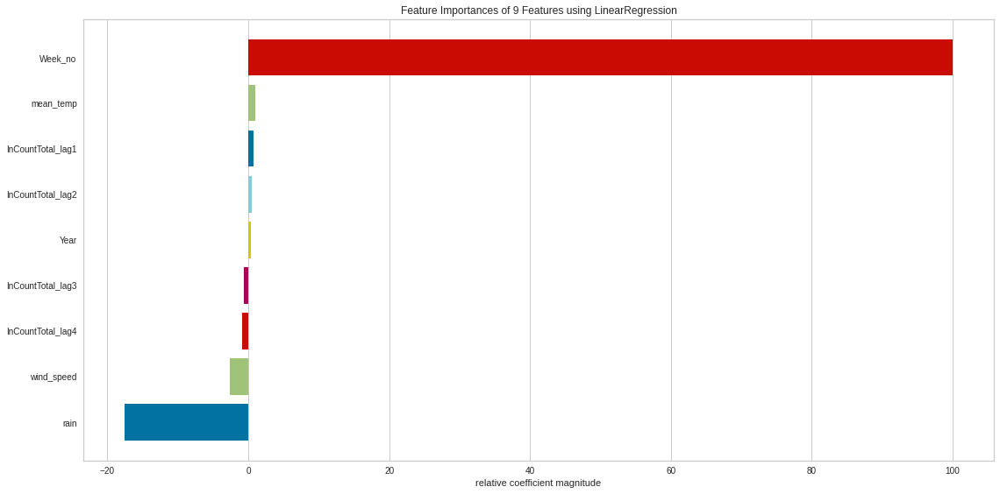

Cross CV validation...
lassoRegressor
default model fitting...
Now tuning Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False).


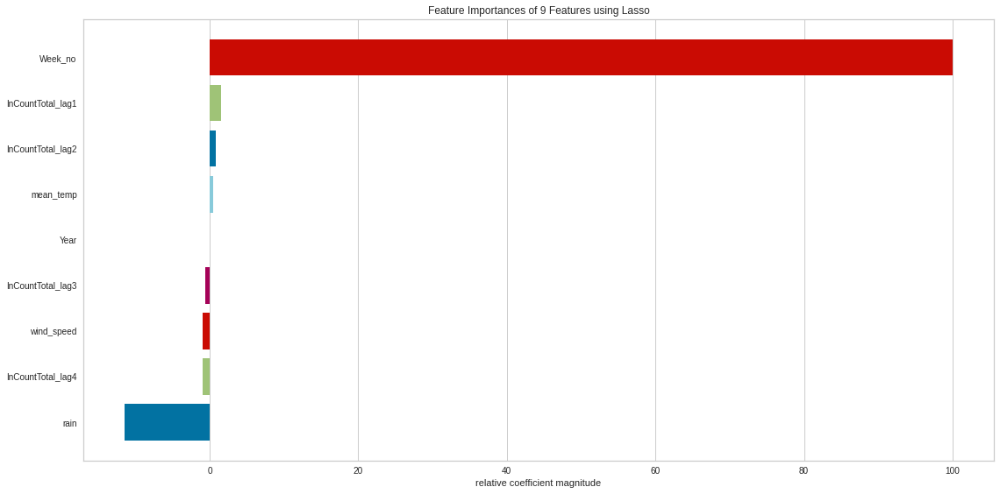

Cross CV validation...
ridgeRegressor
default model fitting...
Now tuning Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001).


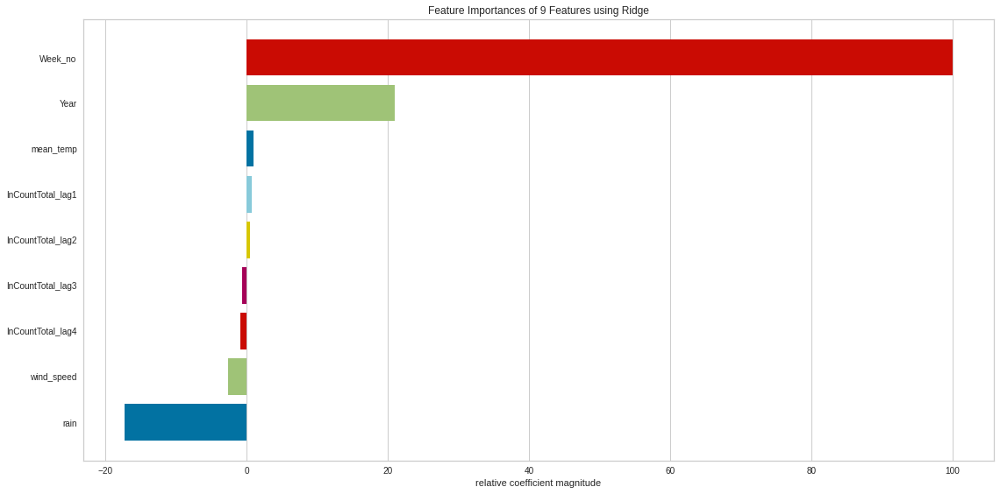

Cross CV validation...
elastic_net
default model fitting...
Now tuning ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False).


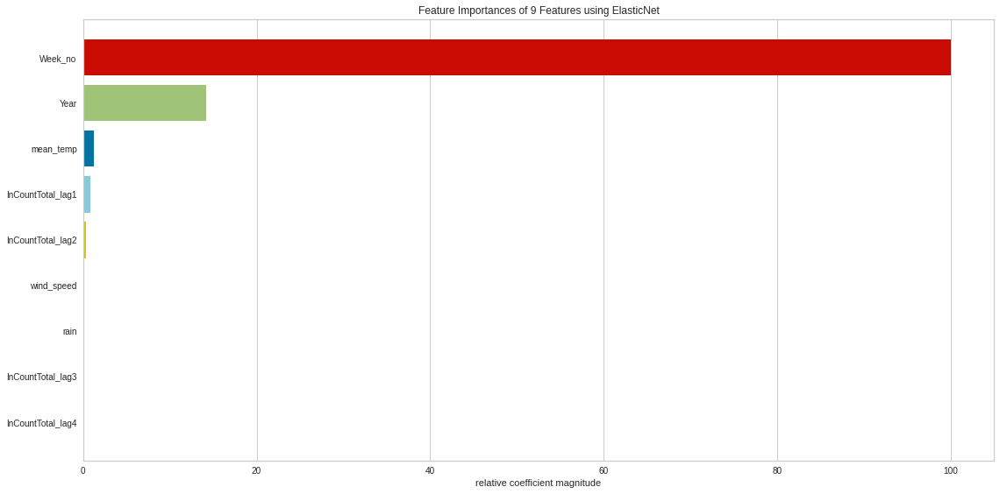

Cross CV validation...
huberRegressor
default model fitting...
Now tuning HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False).


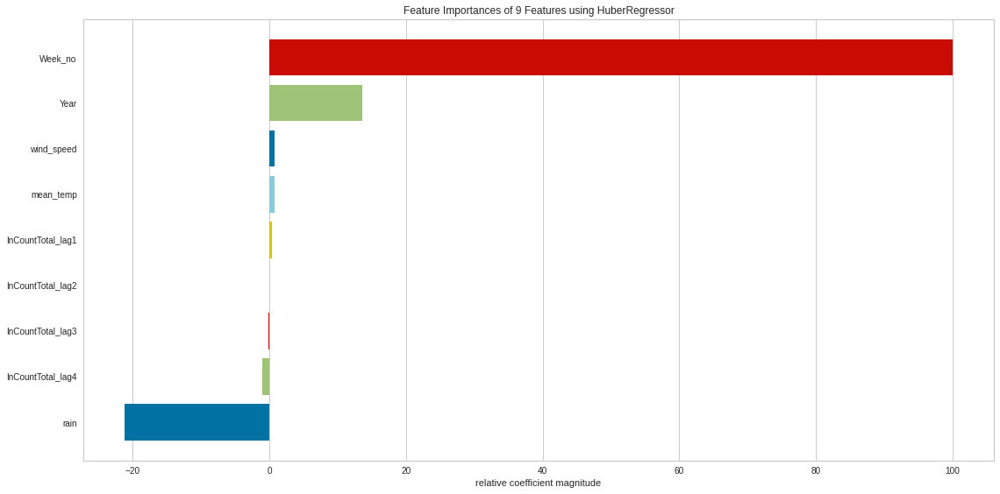

Cross CV validation...
passive_aggressor
default model fitting...
Now tuning PassiveAggressiveRegressor(C=1.0, average=False, early_stopping=False,
                           epsilon=0.1, fit_intercept=True,
                           loss='epsilon_insensitive', max_iter=1000,
                           n_iter_no_change=5, random_state=None, shuffle=True,
                           tol=0.001, validation_fraction=0.1, verbose=0,
                           warm_start=False).


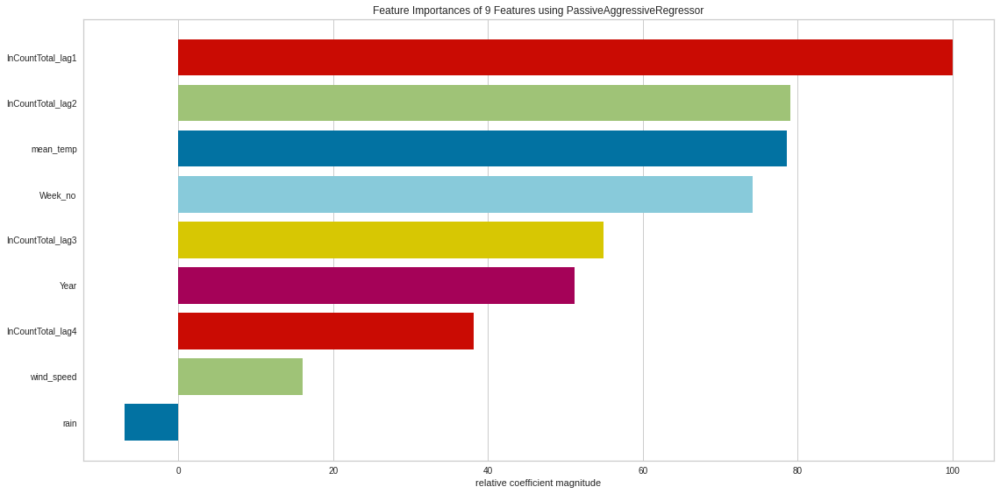

Cross CV validation...
sgd
default model fitting...
Now tuning SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False).


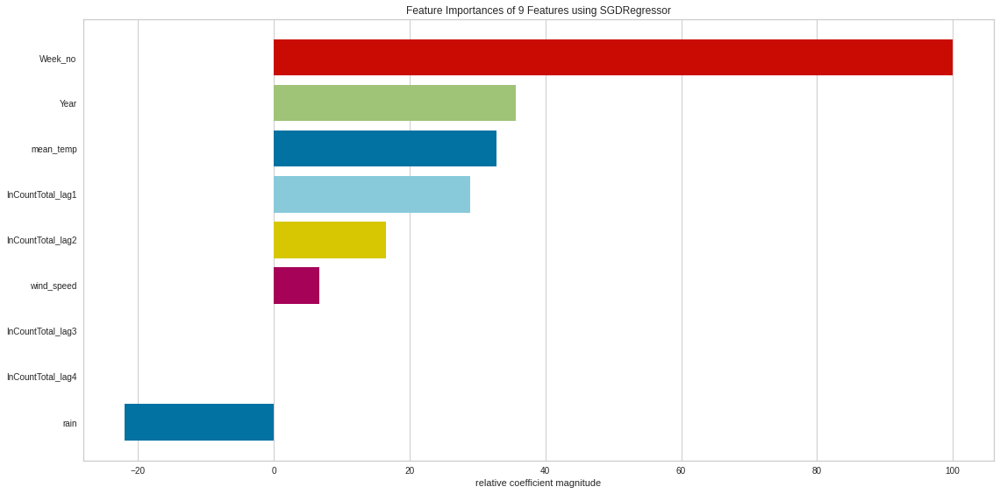

Cross CV validation...
knn_regressor
default model fitting...
Now tuning KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                    weights='uniform').
Cross CV validation...
decisiontree_regressor
default model fitting...
Now tuning DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best').


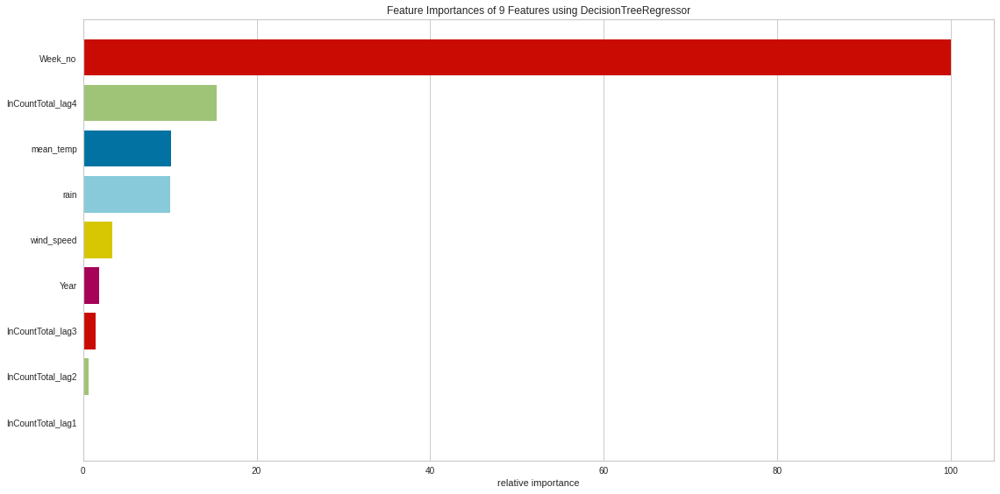

Cross CV validation...
extra_tree_regressor
default model fitting...
Now tuning ExtraTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                   max_features='auto', max_leaf_nodes=None,
                   min_impurity_decrease=0.0, min_impurity_split=None,
                   min_samples_leaf=1, min_samples_split=2,
                   min_weight_fraction_leaf=0.0, random_state=None,
                   splitter='random').


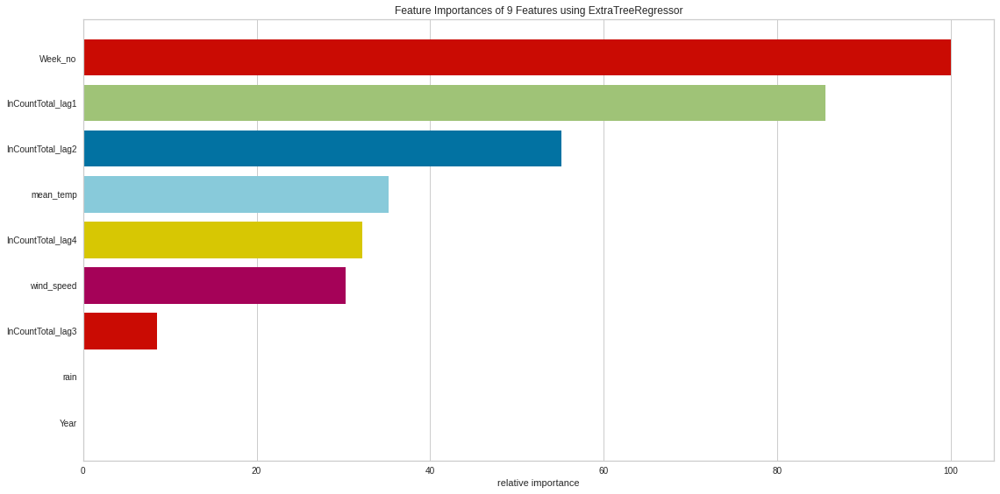

Cross CV validation...
svm_regressor
default model fitting...
Now tuning SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False).
Cross CV validation...
adaBoost
default model fitting...
Now tuning AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=None).


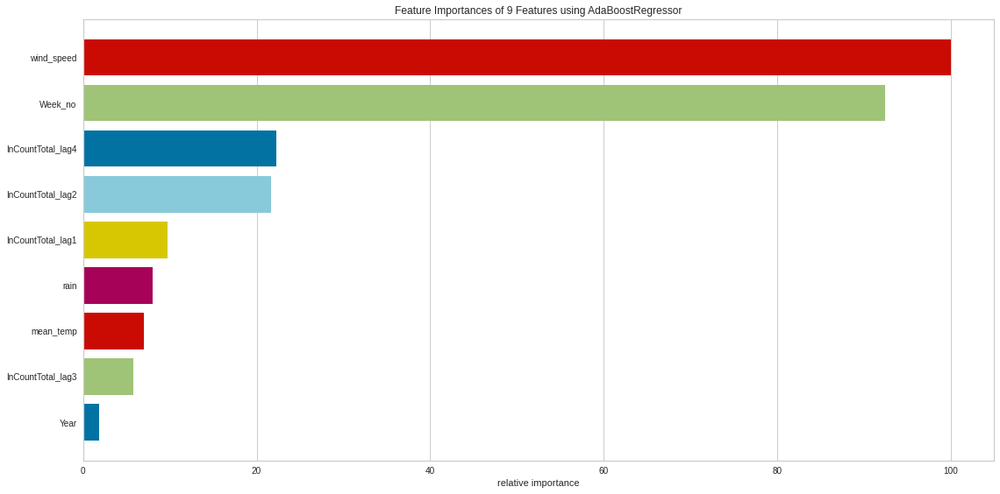

Cross CV validation...
bagging
default model fitting...
Now tuning BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=200,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False).
Cross CV validation...
random_forest
default model fitting...
Now tuning RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False).


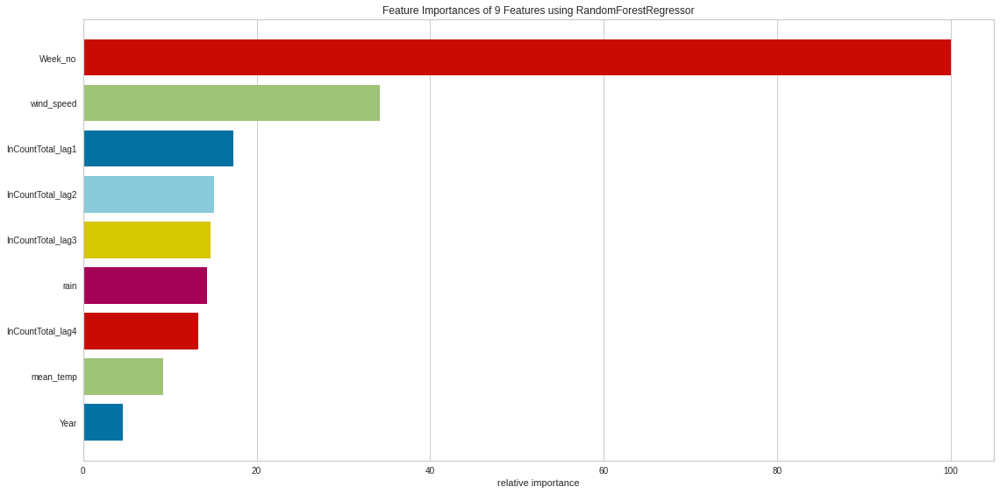

Cross CV validation...
extra_trees_regressor
default model fitting...
Now tuning ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=200, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False).


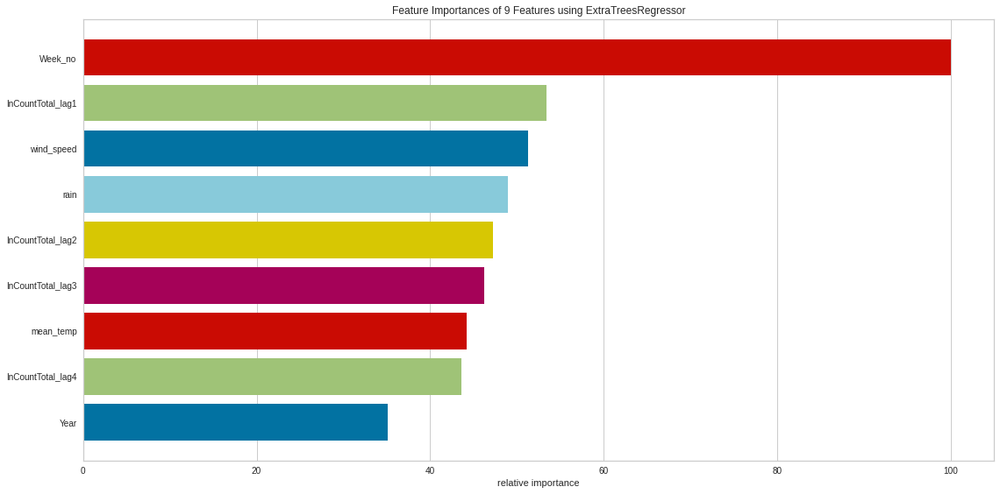

Cross CV validation...
gradient_boosting_regressor
default model fitting...
Now tuning GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False).


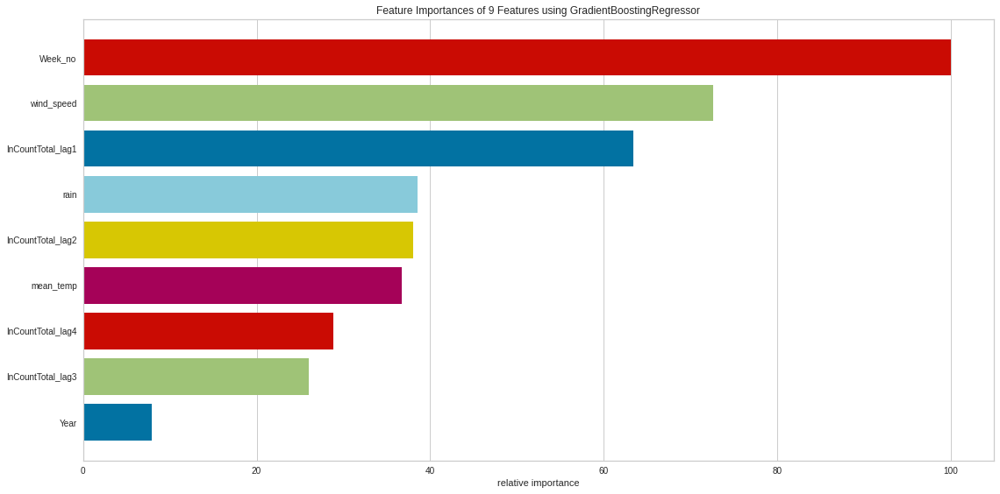

Cross CV validation...
XGBoost
default model fitting...
Now tuning XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:squarederror',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1).


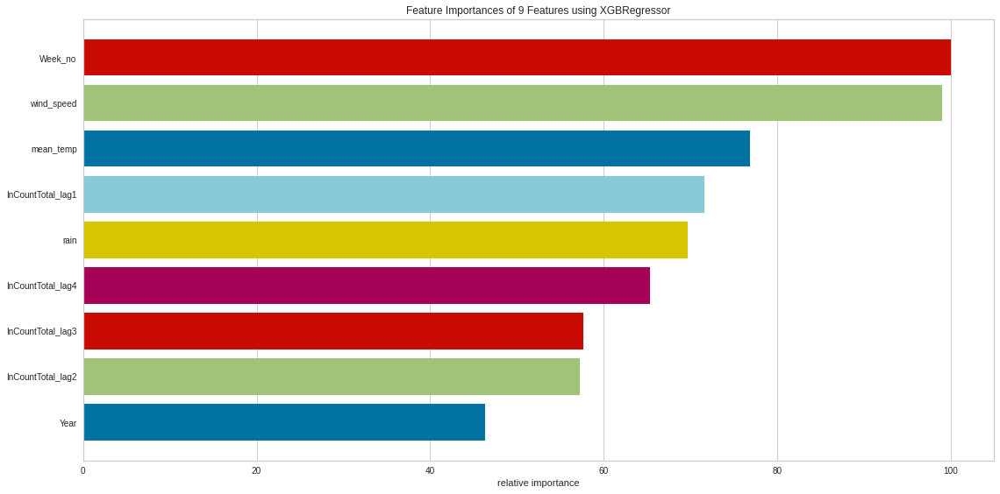

Cross CV validation...
LightGradientBoosting
default model fitting...
Now tuning LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0).
Cross CV validation...
CategoricalGradientBoosting
default model fitting...
Now tuning <catboost.core.CatBoostRegressor object at 0x7f92788566d8>.
Cross CV validation...
NeuralNet_MLP
default model fitting...
Now tuning MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001,

In [43]:
reg_models = regression_model(data_weekly,dataset_type='weekly_data')
_,_,_, _, _, loss_weekly_df = reg_models.train_and_evaluate_models(RFEcross_validation=False,weekly_data=True)



In [44]:
loss_weekly_df.sort_values('mape').head(15)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
16,passive_aggressor_weekly_data_rscv_model,7.422109,0.074722,-0.046541,0.204578,-0.008566,0.273353,0.386368,-0.051940,-44.849591,-32.660832
10,elastic_net_weekly_data_rscv_model,7.604363,0.086880,-0.095026,0.216313,-0.024186,0.294754,0.286523,-0.223103,-41.080706,-28.891947
7,ridgeRegressor_weekly_data_rscv_model,7.716040,0.087065,-0.082116,0.218258,-0.019288,0.295067,0.285005,-0.225705,-41.027590,-28.838831
18,sgd_weekly_data_default_model,7.726780,0.079596,-0.023588,0.210905,0.000700,0.282128,0.346339,-0.120563,-43.269722,-31.080963
0,linear_regression_weekly_data_default_model,7.728431,0.086534,-0.079074,0.218293,-0.018129,0.294167,0.289362,-0.218236,-41.180393,-28.991635
42,extra_trees_regressor_weekly_data_default_model,7.781591,0.088191,-0.066643,0.217247,-0.014674,0.296970,0.275757,-0.241559,-40.706287,-28.517529
1,linear_regression_weekly_data_rscv_model,7.813878,0.095666,-0.119821,0.223899,-0.033625,0.309299,0.214370,-0.346795,-38.672300,-26.483541
12,huberRegressor_weekly_data_default_model,7.971273,0.099953,-0.109871,0.227959,-0.029165,0.316154,0.179162,-0.407150,-37.576330,-25.387572
4,lassoRegressor_weekly_data_rscv_model,7.988315,0.102159,-0.129113,0.229825,-0.036573,0.319624,0.161045,-0.438208,-37.030541,-24.841783
13,huberRegressor_weekly_data_rscv_model,8.028735,0.100692,-0.107223,0.229333,-0.028012,0.317320,0.173096,-0.417551,-37.392231,-25.203473


In [45]:
loss_weekly_df.sort_values('mape').to_csv("weekly_data_model_loss_values.csv")

## 7.2 Model training with LSTM

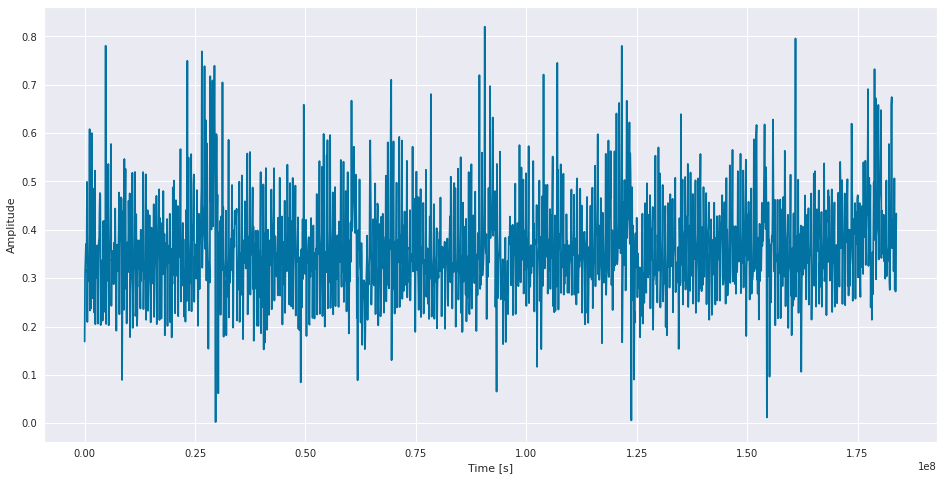

In [46]:
t = np.linspace(0,data_final.shape[0]*24*60*60, data_final.shape[0])
s = data_final['InCountTotal'].values
sns.set_style("darkgrid")
plt.ylabel("Amplitude")
plt.xlabel("Time [s]")
plt.plot(t, s)
plt.show()

(-5.0, 100.0)

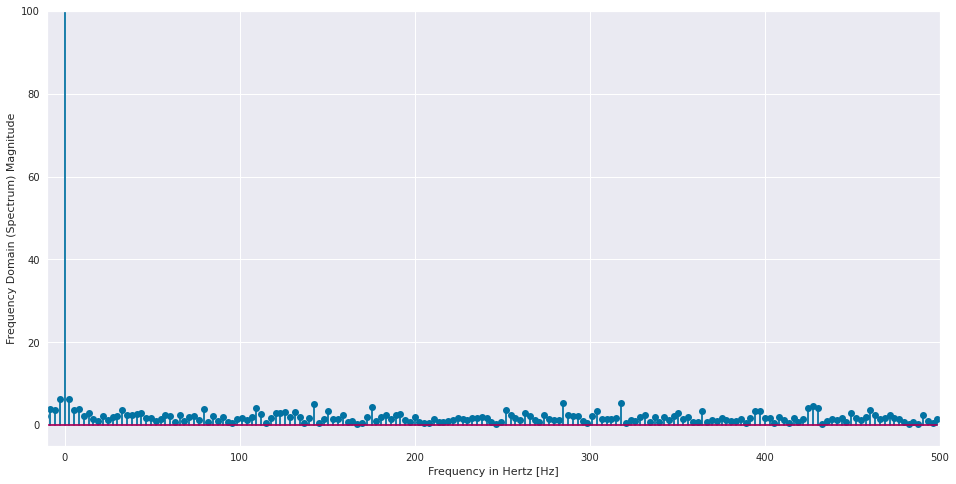

In [47]:
#Applying Fourier Transform
fft = fftpack.fft(s[0:365])

f_s = 1000
freqs = fftpack.fftfreq(len(s[0:365])) * f_s
fig, ax = plt.subplots()

ax.stem(freqs, np.abs(fft))
ax.set_xlabel('Frequency in Hertz [Hz]')
ax.set_ylabel('Frequency Domain (Spectrum) Magnitude')
ax.set_xlim(-10, f_s / 2)
ax.set_ylim(-5, 100)

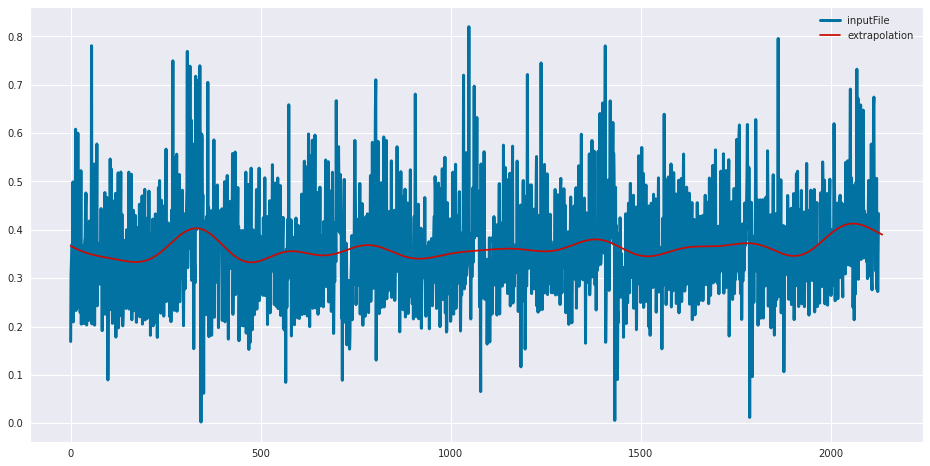

In [48]:
def fourierExtrapolation(x, n_predict):
    n = x.size
    n_harm = 10                     # number of harmonics in model
    t = np.arange(0, n)
    p = np.polyfit(t, x, 1)         # find linear trend in x
    x_notrend = x - p[0] * t        # detrended x
    x_freqdom = fftpack.fft(x_notrend)  # detrended x in frequency domain
    f = fftpack.fftfreq(n)              # frequencies
    indexes = list(range(n))
    # sort indexes by frequency, lower -> higher
    indexes.sort(key = lambda i: np.abs(f[i]))
    t = np.arange(0, n + n_predict)
    restored_sig = np.zeros(t.size)
    for i in indexes[:1 + n_harm * 2]:
        ampli = np.absolute(x_freqdom[i]) / n   # amplitude
        phase = np.angle(x_freqdom[i])          # phase
        restored_sig += ampli * np.cos(2 * np.pi * f[i] * t + phase)
    return restored_sig + p[0] * t

x = data_final['InCountTotal'].values
extrapolation = fourierExtrapolation(x, 10)
plt.plot(np.arange(0, x.size), x, 'b', label = 'inputFile', linewidth = 3)
plt.plot(np.arange(0, extrapolation.size), extrapolation, 'r', label = 'extrapolation')
plt.legend()

In [50]:
## if model is already trained and model files are available, then don't train LSTM again
if global_parameters['lstm_training_needed'] == True:
  lstm_train_eval_objct = LSTM_model_train_and_evaluation()
  lstm_models = lstm_train_eval_objct.get_LSTM_models()
  model_training_results, lstm_data_set_dict = lstm_train_eval_objct.train_LSTM_models(lstm_models)


In [51]:
# evaluate all the models which are trained
lstm_train_eval_objct = LSTM_model_train_and_evaluation()
lstm_data_set_dict = lstm_train_eval_objct.create_LSTM_train_datasets()
loss_lstm_df = lstm_train_eval_objct.evaluate_LSTM_models(None,lstm_data_set_dict)


>loaded saved_model_lstm_auto_encoder160.0001.hdf5
>loaded saved_model_lstm_auto_encoder160.0001.hdf5
Defined 7 models
saved_model_lstm_encoder_decoder160.0001.hdf5
best loss value lstm_encoder_decoder {'mape': 12.698132978432696, 'mse': 0.004337456203628171, 'me': -0.0017516905519438341, 'mae': 0.04686335673917806, 'mpe': 0.024162750733280763, 'rmse': 0.06585936686325014, 'R2 score': 0.4972017362965153, 'Adj R2 score': -0.36013376463378544, 'AIC': -887.3790529521525, 'BIC': -440.9530784207749}


saved_model_lstm_simple_model160.0001.hdf5
best loss value lstm_simple_model {'mape': 15.81290562147549, 'mse': 0.006353162963605339, 'me': 0.00015999347531412092, 'mae': 0.057859479715478355, 'mpe': 0.03706400852564353, 'rmse': 0.0797067309805473, 'R2 score': 0.2635408504058093, 'Adj R2 score': -0.9922164174919772, 'AIC': -806.4661269441533, 'BIC': -360.0401524127757}


saved_model_cnn_lstm_encoder_decoder160.0001.hdf5
best loss value cnn_lstm_encoder_decoder {'mape': 13.628688667048838, 'mse': 0.0050473882485827975, 'me': -0.007280898555293858, 'mae': 0.05097148072611497, 'mpe': 0.008144313436095795, 'rmse': 0.07104497342235268, 'R2 score': 0.41490635790120856, 'Adj R2 score': -0.5827533138826282, 'AIC': -855.2434817709654, 'BIC': -408.8175072395878}


saved_model_lstm_encoder_decoder_outlier_removed160.001.hdf5
best loss value lstm_encoder_decoder_outlier_removed {'mape': 12.764863940547405, 'mse': 0.0038973533534146084, 'me': -0.004756933170767603, 'mae': 0.04706011305715913, 'mpe': 0.01106138774173531, 'rmse': 0.06242878625613835, 'R2 score': 0.5509121974264477, 'Adj R2 score': -0.23499145707726887, 'AIC': -898.9660925450551, 'BIC': -453.80079095963174}


saved_model_cnn_lstm_encoder_decoder_outlier_removed160.001.hdf5
best loss value cnn_lstm_encoder_decoder_outlier_removed {'mape': 11.704836724873756, 'mse': 0.003954538183642168, 'me': -0.009998346940035457, 'mae': 0.044962750358826006, 'mpe': -0.004986370809004696, 'rmse': 0.0628851189363761, 'R2 score': 0.5443228514219504, 'Adj R2 score': -0.25311215858963654, 'AIC': -895.9072049844242, 'BIC': -450.7419033990009}


saved_model_lstm_simple_model_outlier_removed160.0001.hdf5
best loss value lstm_simple_model_outlier_removed {'mape': 15.470577555342931, 'mse': 0.006207543766680563, 'me': -0.005252956851250195, 'mae': 0.05796593861435797, 'mpe': 0.025893722492587225, 'rmse': 0.07878796714397804, 'R2 score': 0.28471146012067494, 'Adj R2 score': -0.9670434846681442, 'AIC': -801.2178978986874, 'BIC': -356.0525963132641}


saved_model_lstm_auto_encoder_MLP160.0001.hdf5
best loss value lstm_auto_encoder_MLP {'mape': 14.49882529061747, 'mse': 0.005269300528961401, 'me': -0.004603048524329185, 'mae': 0.05442220481916744, 'mpe': 0.023513101843763855, 'rmse': 0.07258994785065906, 'R2 score': 0.3928242114414221, 'Adj R2 score': -0.6697334185360893, 'AIC': -835.6301069599342, 'BIC': -390.4648053745109}


[[<tf.Tensor 'past_inputs_2:0' shape=(None, 7, 19) dtype=float32>, <tf.Tensor 'future_input_1_3:0' shape=(None, 1, 8) dtype=float32>], [<tf.Tensor 'input_1_2:0' shape=(None, 1, 1, 7, 19) dtype=float32>, <tf.Tensor 'future_inputs_2:0' shape=(None, 1, 8) dtype=float32>]]


[[<tf.Tensor 'past_inputs_3:0' shape=(None, 7, 19) dtype=float32>, <tf.Tensor 'future_input_1_4:0' shape=(None, 1, 8) dtype=float32>], [<tf.Tensor 'input_77:0' shape=(None, 1, 1, 7, 19) dtype=float32>, <tf.Tensor 'future_inputs_3:0' shape=(None, 1, 8) dtype=float32>]]


[[<tf.Tensor 'past_inputs_3:0' shape=(None, 7, 19) dtype=float32>, <tf.Tensor 'future_input_1_4:0' shape=(None, 1, 8) dtype=float32>], [<tf.Tensor 'input_77:0' shape=(None, 1, 1, 7, 19) dtype=float32>, <tf.Tensor 'future_inputs_3:0' shape=(None, 1, 8) dtype=float32>], [<tf.Tensor 'encoded_inputs_1:0' shape=(None, 5) dtype=float32>, <tf.Tensor 'future_input_1_5:0' shape=(None, 8) dtype=float32>]]


>loaded saved_model_lstm_encoder_decoder160.0001.hdf5
>loaded saved_model_cnn_lstm_encoder_decoder160.0001.hdf5
>loaded saved_model_lstm_encoder_decoder_outlier_removed160.001.hdf5
>loaded saved_model_cnn_lstm_encoder_decoder_outlier_removed160.001.hdf5
Loaded 4 models


>loaded saved_model_lstm_encoder_decoder_outlier_removed160.001.hdf5
>loaded saved_model_cnn_lstm_encoder_decoder_outlier_removed160.001.hdf5
Loaded 2 models


>loaded saved_model_lstm_encoder_decoder_outlier_removed160.001.hdf5
>loaded saved_model_cnn_lstm_encoder_decoder_outlier_removed160.001.hdf5
>loaded saved_model_lstm_auto_encoder_MLP160.0001.hdf5
Loaded 3 models
(None, 1, 1)


>loaded saved_model_lstm_encoder_decoder160.0001.hdf5
>loaded saved_model_cnn_lstm_encoder_decoder160.0001.hdf5
>loaded saved_model_lstm_encoder_decoder_outlier_removed160.001.hdf5
>loaded saved_model_cnn_lstm_encoder_decoder_outlier_removed160.001.hdf5
>loaded saved_model_lstm_auto_encoder_MLP160.0001.hdf5
Loaded 5 models
(None, 1, 1)


>loaded saved_model_stacked_ensemble_lstm116.hdf5
>loaded saved_model_stacked_ensemble_lstm216.hdf5
>loaded saved_model_stacked_ensemble_lstm316.hdf5
>loaded saved_model_stacked_ensemble_lstm416.hdf5
Loaded 4 models


>loaded saved_model_stacked_ensemble_lstm216.hdf5
>loaded saved_model_stacked_ensemble_lstm416.hdf5
Loaded 2 models


>loaded saved_model_stacked_ensemble_lstm116.hdf5
>loaded saved_model_stacked_ensemble_lstm216.hdf5
Loaded 2 models


In [52]:
loss_values_all_models.append(loss_lstm_df)
loss_lstm_df.sort_values('mape').to_csv("lstm_best_models.csv")
loss_lstm_df.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
16,ensemble_of_ensembles_lstm3,10.881565,0.003314,-0.008190,0.041015,0.000034,0.057567,0.618135,-0.050130,-933.017662,-487.852361
11,stacked_ensemble_lstm2,10.891049,0.003273,-0.003190,0.040578,0.011875,0.057212,0.622832,-0.037213,-935.616757,-490.451456
10,stacked_ensemble_lstm1,10.902380,0.003348,-0.007735,0.040937,0.002323,0.057858,0.614270,-0.060757,-930.903148,-485.737847
8,ensemble_lstm_outlier_removed,10.986730,0.003331,-0.007378,0.041243,0.003038,0.057713,0.616199,-0.055453,-931.955811,-486.790509
12,stacked_ensemble_lstm3,10.992788,0.003274,-0.003725,0.040974,0.010238,0.057217,0.622765,-0.037395,-935.579831,-490.414529
15,ensemble_of_ensembles_lstm2,11.003166,0.003297,-0.006856,0.041194,0.001643,0.057417,0.620123,-0.044663,-934.113825,-488.948524
14,ensemble_of_ensembles_lstm1,11.036401,0.003289,-0.005891,0.041269,0.003800,0.057346,0.621066,-0.042069,-934.635868,-489.470567
13,stacked_ensemble_lstm4,11.199462,0.003300,-0.000119,0.041117,0.019013,0.057443,0.619783,-0.045596,-933.926211,-488.760910
9,ensemble_lstm_with_auto_encoder,11.441193,0.003490,-0.006453,0.042928,0.009863,0.059078,0.597824,-0.105983,-922.135293,-476.969991
4,cnn_lstm_encoder_decoder_outlier_removed,11.704837,0.003955,-0.009998,0.044963,-0.004986,0.062885,0.544323,-0.253112,-895.907205,-450.741903


## 7.3 Model training with H2O

In [53]:
h2o_model_obj = h2o_model(data_final,dataset_type='Normal')
loss_h2o_model = h2o_model_obj.train_and_evaluate_models()
loss_values_all_models.append(loss_h2o_model)


Defined 2 models
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.0064561708328316385
RMSE: 0.0803503007637908
MAE: 0.05290778405752884
RMSLE: 0.0575146145780769
Mean Residual Deviance: 0.0064561708328316385

gbm prediction progress: |████████████████████████████████████████████████| 100%
H2OGradientBoosting
default h2o model fitting...
Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_model_python_1604675476624_1


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,100.0,100.0,35714.0,5.0,5.0,5.0,13.0,32.0,23.74




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.0010641673915113676
RMSE: 0.03262157861770898
MAE: 0.023422096019625253
RMSLE: 0.02387140577107221
Mean Residual Deviance: 0.0010641673915113676

ModelMetricsRegression: gbm
** Reported on validation data. **

MSE: 0.004561084000856501
RMSE: 0.06753579792122472
MAE: 0.04699163060157243
RMSLE: 0.049134513348295536
Mean Residual Deviance: 0.004561084000856501

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.005319662810018495
RMSE: 0.07293601860547705
MAE: 0.0503787266102563
RMSLE: 0.05297893747804434
Mean Residual Deviance: 0.005319662810018495

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.050365083,0.002840793,0.049087662,0.05490401,0.051075403,0.04928869,0.04746964
1,mean_residual_deviance,0.0053178864,5.017278E-4,0.0055079474,0.006116455,0.004965005,0.0049431133,0.005056911
2,mse,0.0053178864,5.017278E-4,0.0055079474,0.006116455,0.004965005,0.0049431133,0.005056911
3,r2,0.42012027,0.04493243,0.42245987,0.3754874,0.475468,0.45186538,0.3753207
4,residual_deviance,0.0053178864,5.017278E-4,0.0055079474,0.006116455,0.004965005,0.0049431133,0.005056911
5,rmse,0.07286107,0.003382113,0.074215546,0.07820777,0.07046279,0.07030728,0.07111196
6,rmsle,0.052912988,0.0028653098,0.053466495,0.057607107,0.050758954,0.052098956,0.050633434



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-11-06 16:12:14,10.465 sec,0.0,0.096067,0.068917,0.009229,0.091773,0.065104,0.008422
1,,2020-11-06 16:12:14,10.489 sec,1.0,0.091638,0.066047,0.008398,0.087523,0.062152,0.007660
2,,2020-11-06 16:12:14,10.516 sec,2.0,0.087845,0.063573,0.007717,0.084178,0.059921,0.007086
3,,2020-11-06 16:12:14,10.531 sec,3.0,0.084531,0.061342,0.007145,0.081511,0.058012,0.006644
4,,2020-11-06 16:12:14,10.546 sec,4.0,0.081801,0.059306,0.006691,0.079231,0.056236,0.006278
5,,2020-11-06 16:12:14,10.563 sec,5.0,0.079309,0.057562,0.006290,0.077256,0.054840,0.005969
6,,2020-11-06 16:12:14,10.580 sec,6.0,0.077145,0.055863,0.005951,0.075467,0.053535,0.005695
7,,2020-11-06 16:12:14,10.597 sec,7.0,0.075069,0.054277,0.005635,0.073827,0.052209,0.005450
8,,2020-11-06 16:12:14,10.614 sec,8.0,0.073190,0.052754,0.005357,0.072417,0.051166,0.005244
9,,2020-11-06 16:12:14,10.630 sec,9.0,0.071613,0.051421,0.005128,0.071593,0.050347,0.005126



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Weekday,14.664948,1.000000,0.241344
1,Week_no,8.904540,0.607199,0.146544
2,InCountTotal_lag1,6.570343,0.448030,0.108129
3,Day,6.081395,0.414689,0.100083
4,InCountTotal_lag5,4.907642,0.334651,0.080766
5,InCountTotal_lag3,3.485650,0.237686,0.057364
6,mean_temp,2.917407,0.198937,0.048012
7,InCountTotal_lag7,2.802591,0.191108,0.046123
8,InCountTotal_lag6,2.665076,0.181731,0.043860
9,InCountTotal_lag2,2.351912,0.160376,0.038706



See the whole table with table.as_data_frame()
Now tuning .
gbm Grid Build progress: |████████████████████████████████████████████████| 100%
          col_sample_rate  ...                     model_ids                    mse
0                     0.9  ...  H2OGradientBoosting_model_16   0.005276260702419005
1                     0.4  ...   H2OGradientBoosting_model_8   0.005354788695889225
2                     0.8  ...  H2OGradientBoosting_model_10   0.005355326283590369
3                     0.4  ...  H2OGradientBoosting_model_19    0.00537239208933957
4     0.30000000000000004  ...  H2OGradientBoosting_model_18   0.005404339420931528
5                     0.8  ...  H2OGradientBoosting_model_20   0.005408842224320938
6                     0.9  ...   H2OGradientBoosting_model_1    0.00543676595533476
7      0.6000000000000001  ...   H2OGradientBoosting_model_2   0.005497772222520403
8                     0.9  ...  H2OGradientBoosting_model_11   0.005597448098682398
9                 

,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,100.0,100.0,1018534.0,20.0,20.0,20.0,616.0,904.0,806.42




ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.005429523883322289
RMSE: 0.0736853030347456
MAE: 0.05059758504561063
RMSLE: 0.053501393291328435
Mean Residual Deviance: 0.005429523883322289

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.004396118508901154
RMSE: 0.06630323151175328
MAE: 0.0449835304119999
RMSLE: 0.04794998095944439
Mean Residual Deviance: 0.004396118508901154

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.005519967435013022
RMSE: 0.07429648332870824
MAE: 0.05101853232574223
RMSLE: 0.05391292378410319
Mean Residual Deviance: 0.005519967435013022

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.051014718,0.002527642,0.049250312,0.054646354,0.051607933,0.051498435,0.048070554
1,mean_residual_deviance,0.005522092,3.8102508E-4,0.0051807966,0.0061551863,0.005377499,0.0055743596,0.0053226175
2,mse,0.005522092,3.8102508E-4,0.0051807966,0.0061551863,0.005377499,0.0055743596,0.0053226175
3,r2,0.39691028,0.046467673,0.45676354,0.37153277,0.43188974,0.38186738,0.34249803
4,residual_deviance,0.005522092,3.8102508E-4,0.0051807966,0.0061551863,0.005377499,0.0055743596,0.0053226175
5,rmse,0.07427642,0.0025262905,0.07197775,0.07845499,0.07333143,0.074661635,0.07295627
6,rmsle,0.053871922,0.0028142675,0.05167397,0.05816287,0.052439746,0.055297602,0.051785424



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-11-06 16:14:29,18.887 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,,2020-11-06 16:14:29,18.925 sec,1.0,0.116327,0.079362,0.013532,0.106379,0.074009,0.011316
2,,2020-11-06 16:14:29,18.950 sec,2.0,0.108419,0.074900,0.011755,0.086994,0.064216,0.007568
3,,2020-11-06 16:14:29,18.976 sec,3.0,0.101155,0.070498,0.010232,0.079256,0.056435,0.006281
4,,2020-11-06 16:14:29,19.002 sec,4.0,0.097672,0.067574,0.009540,0.076359,0.054084,0.005831
5,,2020-11-06 16:14:29,19.027 sec,5.0,0.094738,0.065596,0.008975,0.075404,0.052766,0.005686
6,,2020-11-06 16:14:29,19.051 sec,6.0,0.091768,0.064370,0.008421,0.073643,0.050779,0.005423
7,,2020-11-06 16:14:29,19.079 sec,7.0,0.091434,0.064205,0.008360,0.073055,0.050351,0.005337
8,,2020-11-06 16:14:29,19.103 sec,8.0,0.089092,0.062287,0.007937,0.072097,0.049651,0.005198
9,,2020-11-06 16:14:29,19.138 sec,9.0,0.087731,0.061444,0.007697,0.071108,0.049416,0.005056



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Weekday,147.120209,1.000000,0.174045
1,InCountTotal_lag1,86.596909,0.588613,0.102445
2,Week_no,85.279396,0.579658,0.100886
3,InCountTotal_lag7,74.322266,0.505181,0.087924
4,InCountTotal_lag3,61.464237,0.417782,0.072713
5,InCountTotal_lag5,55.977829,0.380490,0.066222
6,Day,55.946110,0.380275,0.066185
7,InCountTotal_lag6,50.198807,0.341209,0.059386
8,mean_temp,41.174248,0.279868,0.048710
9,InCountTotal_lag2,37.876347,0.257452,0.044808



See the whole table with table.as_data_frame()
Now tuning .
drf Grid Build progress: |████████████████████████████████████████████████| 100%
      ...                    mse
0     ...   0.005738554251995829
1     ...   0.005901642999309466
2     ...    0.00647402767322081
3     ...    0.00651326773147359
4     ...   0.006557081672715671
5     ...   0.006562953433328732
6     ...   0.006650496894736004
7     ...  0.0067123073110033574
8     ...  0.0067525954332316885
9     ...   0.007089248193846262
10    ...    0.00720848246013797
11    ...   0.007445984396061059
12    ...   0.007485630486378173
13    ...   0.007572169076375869
14    ...   0.007673699655030867
15    ...   0.007952006862746953
16    ...   0.007953273428864142
17    ...    0.00818644787722088
18    ...   0.008201924519792715
19    ...   0.008473527510839192

[20 rows x 7 columns]


ModelMetricsRegression: drf
** Reported on test data. **

MSE: 0.00620581480906411
RMSE: 0.07877699416113888
MAE: 0.052092439162487514
RMSLE

In [54]:
h2o_model_1 = h2o_model(data_outliersremoved,dataset_type='OutlierRemoved')
loss_h2o_model_outlier_removed = h2o_model_1.train_and_evaluate_models()
loss_values_all_models.append(loss_h2o_model_outlier_removed)


Defined 2 models
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm Model Build progress: |███████████████████████████████████████████████| 100%

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.006278969712499883
RMSE: 0.0792399502302966
MAE: 0.05337286874033195
RMSLE: 0.05640125627851188
Mean Residual Deviance: 0.006278969712499883

gbm prediction progress: |████████████████████████████████████████████████| 100%
H2OGradientBoosting
default h2o model fitting...
Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_model_python_1604675476624_3


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,100.0,100.0,36709.0,5.0,5.0,5.0,10.0,32.0,24.53




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.0010165291662191643
RMSE: 0.03188305453088151
MAE: 0.0228690957139908
RMSLE: 0.023405020454244967
Mean Residual Deviance: 0.0010165291662191643

ModelMetricsRegression: gbm
** Reported on validation data. **

MSE: 0.005630641092069243
RMSE: 0.07503759785646955
MAE: 0.05023597905849224
RMSLE: 0.053375462085237954
Mean Residual Deviance: 0.005630641092069243

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.005109213979550678
RMSE: 0.07147876593472133
MAE: 0.049055306469455974
RMSLE: 0.05192761408942768
Mean Residual Deviance: 0.005109213979550678

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.04906113,0.0023015528,0.05096769,0.04806005,0.046351437,0.04801627,0.05191021
1,mean_residual_deviance,0.0051097935,5.822434E-4,0.0057576825,0.0046935156,0.0044443,0.0049906,0.0056628697
2,mse,0.0051097935,5.822434E-4,0.0057576825,0.0046935156,0.0044443,0.0049906,0.0056628697
3,r2,0.41249484,0.052671965,0.47723487,0.3503867,0.39135644,0.38688716,0.4566091
4,residual_deviance,0.0051097935,5.822434E-4,0.0057576825,0.0046935156,0.0044443,0.0049906,0.0056628697
5,rmse,0.071390085,0.0040695574,0.075879395,0.068509236,0.06666558,0.07064418,0.07525204
6,rmsle,0.05185107,0.0031815784,0.055355046,0.0498919,0.048135735,0.05090974,0.05496294



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-11-06 16:16:48,7.405 sec,0.0,0.093965,0.067588,0.008830,0.098720,0.068686,0.009746
1,,2020-11-06 16:16:48,7.422 sec,1.0,0.089791,0.064603,0.008062,0.095479,0.066333,0.009116
2,,2020-11-06 16:16:48,7.434 sec,2.0,0.086150,0.061958,0.007422,0.092361,0.064074,0.008531
3,,2020-11-06 16:16:48,7.448 sec,3.0,0.082961,0.059700,0.006883,0.090065,0.062080,0.008112
4,,2020-11-06 16:16:48,7.464 sec,4.0,0.080203,0.057637,0.006432,0.087943,0.060582,0.007734
5,,2020-11-06 16:16:48,7.479 sec,5.0,0.077829,0.055960,0.006057,0.085783,0.059157,0.007359
6,,2020-11-06 16:16:48,7.496 sec,6.0,0.075647,0.054330,0.005722,0.083823,0.057801,0.007026
7,,2020-11-06 16:16:48,7.511 sec,7.0,0.073714,0.052871,0.005434,0.082146,0.056562,0.006748
8,,2020-11-06 16:16:48,7.526 sec,8.0,0.071738,0.051473,0.005146,0.081148,0.055780,0.006585
9,,2020-11-06 16:16:48,7.540 sec,9.0,0.070139,0.050371,0.004920,0.080661,0.055151,0.006506



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Weekday,13.782759,1.000000,0.238900
1,InCountTotal_lag1,6.770346,0.491219,0.117352
2,Day,6.344209,0.460300,0.109966
3,Week_no,5.567885,0.403975,0.096509
4,InCountTotal_lag3,4.363818,0.316614,0.075639
5,InCountTotal_lag5,3.613246,0.262157,0.062629
6,InCountTotal_lag7,3.419177,0.248076,0.059265
7,InCountTotal_lag6,2.705890,0.196324,0.046902
8,InCountTotal_lag2,2.654212,0.192575,0.046006
9,mean_temp,2.537713,0.184122,0.043987



See the whole table with table.as_data_frame()
Now tuning .
gbm Grid Build progress: |████████████████████████████████████████████████| 100%
          col_sample_rate  ...                     model_ids                    mse
0     0.30000000000000004  ...  H2OGradientBoosting_model_18   0.005078830610218611
1                     0.4  ...   H2OGradientBoosting_model_8   0.005100857980913282
2                     0.8  ...  H2OGradientBoosting_model_10   0.005173206173441009
3                     0.9  ...   H2OGradientBoosting_model_1   0.005175976150547249
4                     0.8  ...  H2OGradientBoosting_model_20   0.005186587878554791
5                     0.5  ...  H2OGradientBoosting_model_13   0.005192807407250471
6                     0.9  ...  H2OGradientBoosting_model_16    0.00519882573892341
7                     0.4  ...  H2OGradientBoosting_model_19   0.005222258257214489
8      0.6000000000000001  ...   H2OGradientBoosting_model_2   0.005260984600577699
9                 

,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,100.0,100.0,1002184.0,20.0,20.0,20.0,644.0,916.0,793.27




ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.005254508776013966
RMSE: 0.07248799056405114
MAE: 0.04985298777724756
RMSLE: 0.052691409181893044
Mean Residual Deviance: 0.005254508776013966

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.005155895208729364
RMSE: 0.0718045625899174
MAE: 0.04744460951917641
RMSLE: 0.05132977133681815
Mean Residual Deviance: 0.005155895208729364

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.0052068020400688475
RMSE: 0.07215817375785537
MAE: 0.04884369552776705
RMSLE: 0.052452106680560336
Mean Residual Deviance: 0.0052068020400688475

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.04885333,0.0036033657,0.052259643,0.045606233,0.045281082,0.04819288,0.05292681
1,mean_residual_deviance,0.0052084774,0.0010062407,0.0062489645,0.0041930876,0.004299978,0.005049812,0.006250545
2,mse,0.0052084774,0.0010062407,0.0062489645,0.0041930876,0.004299978,0.005049812,0.006250545
3,r2,0.40864602,0.020102,0.4326292,0.4196492,0.41112125,0.3796127,0.40021765
4,residual_deviance,0.0052084774,0.0010062407,0.0062489645,0.0041930876,0.004299978,0.005049812,0.006250545
5,rmse,0.07190022,0.006967452,0.07905039,0.064754054,0.065574214,0.07106203,0.07906039
6,rmsle,0.05225777,0.005185374,0.057249088,0.0474031,0.04736765,0.051180486,0.05808851



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-11-06 16:18:50,15.096 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,,2020-11-06 16:18:50,15.139 sec,1.0,0.106703,0.075464,0.011385,0.101125,0.068554,0.010226
2,,2020-11-06 16:18:50,15.180 sec,2.0,0.102648,0.071132,0.010537,0.089144,0.060588,0.007947
3,,2020-11-06 16:18:51,15.243 sec,3.0,0.098694,0.067673,0.009740,0.079948,0.053145,0.006392
4,,2020-11-06 16:18:51,15.269 sec,4.0,0.094420,0.066277,0.008915,0.077376,0.052694,0.005987
5,,2020-11-06 16:18:51,15.293 sec,5.0,0.091838,0.064073,0.008434,0.076545,0.052281,0.005859
6,,2020-11-06 16:18:51,15.317 sec,6.0,0.090564,0.063275,0.008202,0.075589,0.052103,0.005714
7,,2020-11-06 16:18:51,15.341 sec,7.0,0.088319,0.061935,0.007800,0.075005,0.051199,0.005626
8,,2020-11-06 16:18:51,15.366 sec,8.0,0.084732,0.059633,0.007179,0.074561,0.050725,0.005559
9,,2020-11-06 16:18:51,15.389 sec,9.0,0.083521,0.058476,0.006976,0.074016,0.050299,0.005478



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Weekday,136.721832,1.000000,0.170930
1,InCountTotal_lag1,83.173897,0.608344,0.103984
2,InCountTotal_lag7,79.707718,0.582992,0.099651
3,Week_no,72.392471,0.529487,0.090505
4,Day,54.921387,0.401702,0.068663
5,InCountTotal_lag3,52.086010,0.380963,0.065118
6,InCountTotal_lag6,51.890717,0.379535,0.064874
7,InCountTotal_lag5,51.568356,0.377177,0.064471
8,InCountTotal_lag2,40.597359,0.296934,0.050755
9,mean_temp,39.309521,0.287515,0.049145



See the whole table with table.as_data_frame()
Now tuning .
drf Grid Build progress: |████████████████████████████████████████████████| 100%
      ...                    mse
0     ...   0.005525848504568165
1     ...   0.005603809839224636
2     ...   0.006127999158860991
3     ...    0.00613806683408139
4     ...  0.0061645191937668865
5     ...   0.006253039349352964
6     ...   0.006297597748026385
7     ...   0.006309249759300359
8     ...   0.006437791845563032
9     ...   0.006691911594343689
10    ...   0.006815833826568953
11    ...    0.00708980159646373
12    ...   0.007096408498509199
13    ...   0.007191359532956231
14    ...   0.007206103761550721
15    ...  0.0075159552756250934
16    ...   0.007525322342952378
17    ...   0.007752482811349096
18    ...   0.007764769486945574
19    ...    0.00801190304015161

[20 rows x 7 columns]


ModelMetricsRegression: drf
** Reported on test data. **

MSE: 0.006169089806511321
RMSE: 0.07854355356432074
MAE: 0.05150966452878627
RMSLE

In [55]:
loss_h2o_model_outlier_removed.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
4,H2ORandomForest_OutlierRemoved_rscv,22.919391,0.006169,-0.019140,0.051510,0.078470,0.078544,0.337415,0.294793,-1813.194456,-1727.396714
5,H2ORandomForest_OutlierRemoved_random_grid_ensemble,23.116026,0.006182,-0.019210,0.051885,0.078467,0.078628,0.335991,0.293277,-1812.410746,-1726.613004
6,H20_Stacked_Ensemble_OutlierRemoved_ensemble,23.170633,0.006146,-0.019348,0.051925,0.078054,0.078400,0.339843,0.297377,-1814.534087,-1728.736345
0,H2OGradientBoosting_OutlierRemoved_default_model,23.391093,0.006279,-0.018391,0.053373,0.078475,0.079240,0.325614,0.282232,-1806.750525,-1720.952784
2,H2OGradientBoosting_OutlierRemoved_random_grid_ensemble,23.462852,0.006184,-0.018530,0.052624,0.079992,0.078636,0.335848,0.293125,-1812.332115,-1726.534374
1,H2OGradientBoosting_OutlierRemoved_rscv,23.482069,0.006335,-0.017766,0.052126,0.084799,0.079590,0.319646,0.275880,-1803.534604,-1717.736863
3,H2ORandomForest_OutlierRemoved_default_model,23.601468,0.006271,-0.018408,0.052292,0.085424,0.079190,0.326461,0.283134,-1807.209479,-1721.411737


## 7.4 Model training with AutoML

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |
16:20:54.71: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_BestOfFamily_AutoML_20201106_162054,0.00604146,0.0777268,0.00604146,0.0512674,0.0553327
XRT_1_AutoML_20201106_162054,0.00605452,0.0778108,0.00605452,0.0518174,0.0555723
GBM_1_AutoML_20201106_162054,0.00614575,0.0783948,0.00614575,0.0518768,0.0557668
StackedEnsemble_AllModels_AutoML_20201106_162054,0.00617715,0.0785948,0.00617715,0.0520592,0.0560273
GBM_3_AutoML_20201106_162054,0.006196,0.0787147,0.006196,0.0519991,0.056086
GBM_2_AutoML_20201106_162054,0.00619931,0.0787357,0.00619931,0.0525321,0.056339
DRF_1_AutoML_20201106_162054,0.00623003,0.0789306,0.00623003,0.0518157,0.0562195
XGBoost_grid__1_AutoML_20201106_162054_model_6,0.00632878,0.0795536,0.00632878,0.0536171,0.0566931
GBM_grid__1_AutoML_20201106_162054_model_4,0.00649848,0.0806132,0.00649848,0.0550953,0.0575134
GBM_4_AutoML_20201106_162054,0.00650937,0.0806807,0.00650937,0.0542919,0.057712



Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_AutoML_20201106_162054

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.0010470327470448587
RMSE: 0.032357885392047155
MAE: 0.0237098032358467
RMSLE: 0.02379698884554463
R^2: 0.8865476491103313
Mean Residual Deviance: 0.0010470327470448587
Null degrees of freedom: 1413
Residual degrees of freedom: 1408
Null deviance: 13.049569204266353
Residual deviance: 1.4805043043214303
AIC: -5675.820057866416

ModelMetricsRegressionGLM: stackedensemble
** Reported on validation data. **

MSE: 0.0040749016904042595
RMSE: 0.0638349566491923
MAE: 0.043788365173195135
RMSLE: 0.04622223892028287
R^2: 0.5157196776417972
Mean Residual Deviance: 0.0040749016904042595
Null degrees of freedom: 347
Residual degrees of freedom: 342
Null deviance: 2.930925997379474
Residual deviance: 1.4180657882606822
AIC: -913.4309937463518

ModelMetricsRegre

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms
StackedEnsemble_BestOfFamily_AutoML_20201106_162054,0.00604146,0.0777268,0.00604146,0.0512674,0.0553327,1082,0.138781
XRT_1_AutoML_20201106_162054,0.00605452,0.0778108,0.00605452,0.0518174,0.0555723,2102,0.02037
GBM_1_AutoML_20201106_162054,0.00614575,0.0783948,0.00614575,0.0518768,0.0557668,596,0.013982
StackedEnsemble_AllModels_AutoML_20201106_162054,0.00617715,0.0785948,0.00617715,0.0520592,0.0560273,1952,0.553043
GBM_3_AutoML_20201106_162054,0.006196,0.0787147,0.006196,0.0519991,0.056086,383,0.014493
GBM_2_AutoML_20201106_162054,0.00619931,0.0787357,0.00619931,0.0525321,0.056339,666,0.017252
DRF_1_AutoML_20201106_162054,0.00623003,0.0789306,0.00623003,0.0518157,0.0562195,1792,0.023751
XGBoost_grid__1_AutoML_20201106_162054_model_6,0.00632878,0.0795536,0.00632878,0.0536171,0.0566931,446,0.006724
GBM_grid__1_AutoML_20201106_162054_model_4,0.00649848,0.0806132,0.00649848,0.0550953,0.0575134,252,0.013486
GBM_4_AutoML_20201106_162054,0.00650937,0.0806807,0.00650937,0.0542919,0.057712,577,0.014093


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

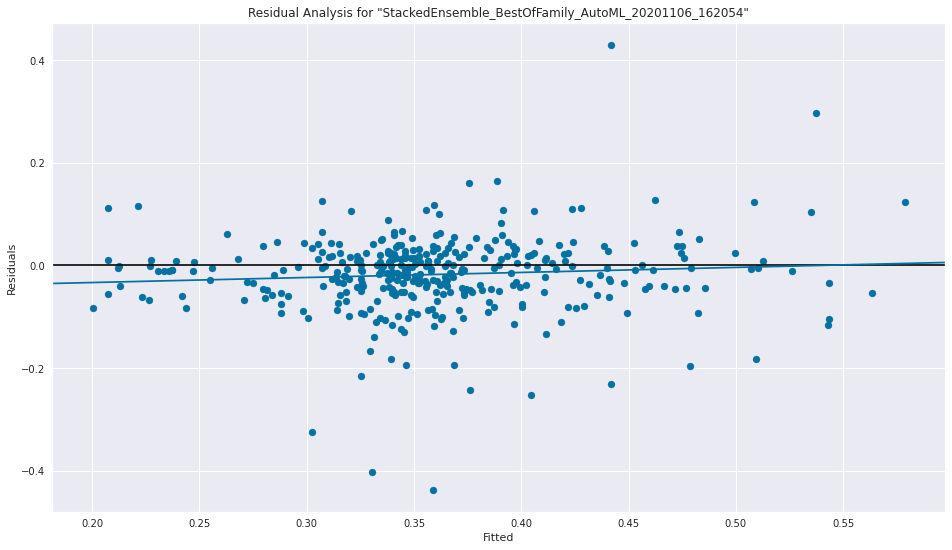

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

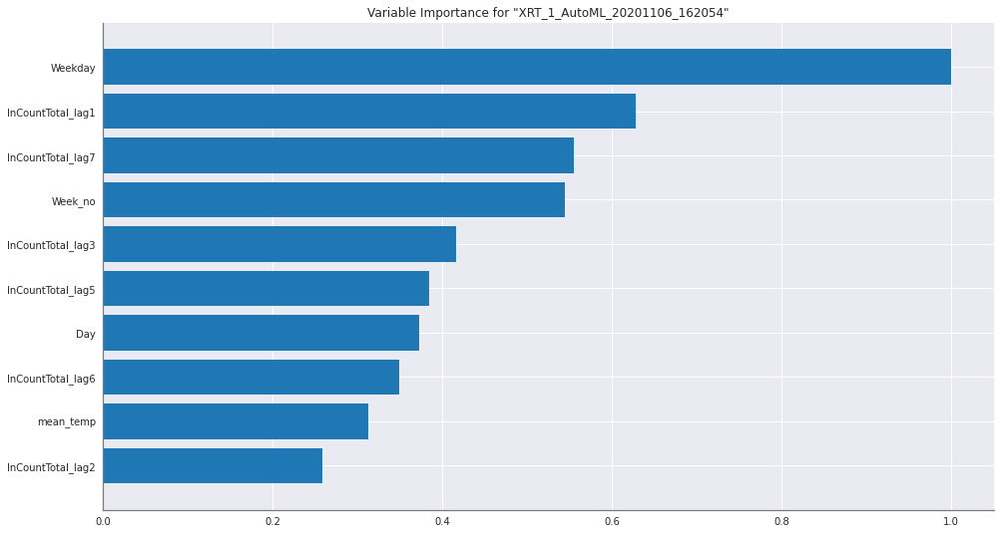

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

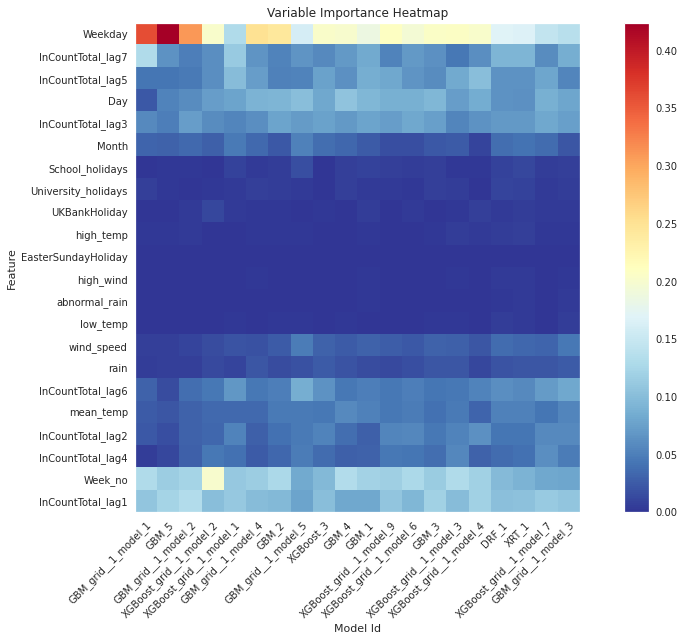

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

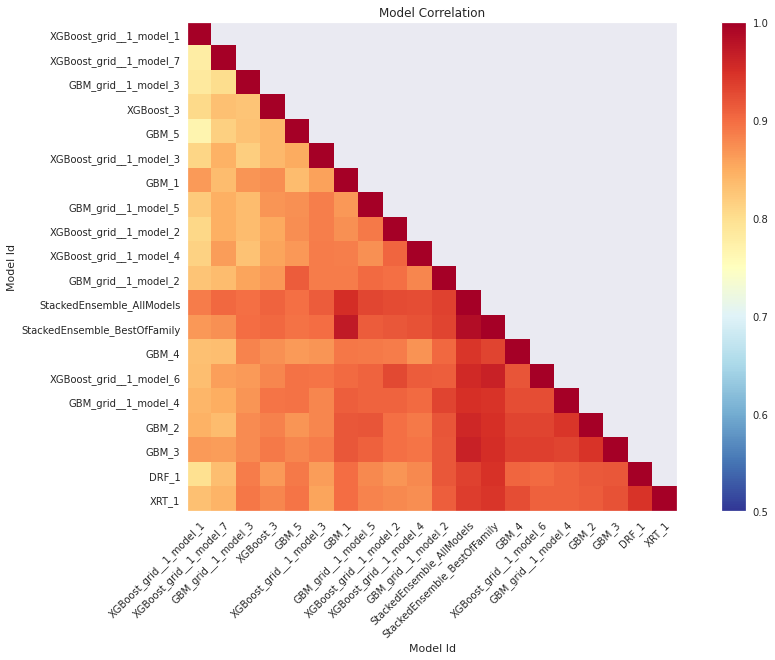

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

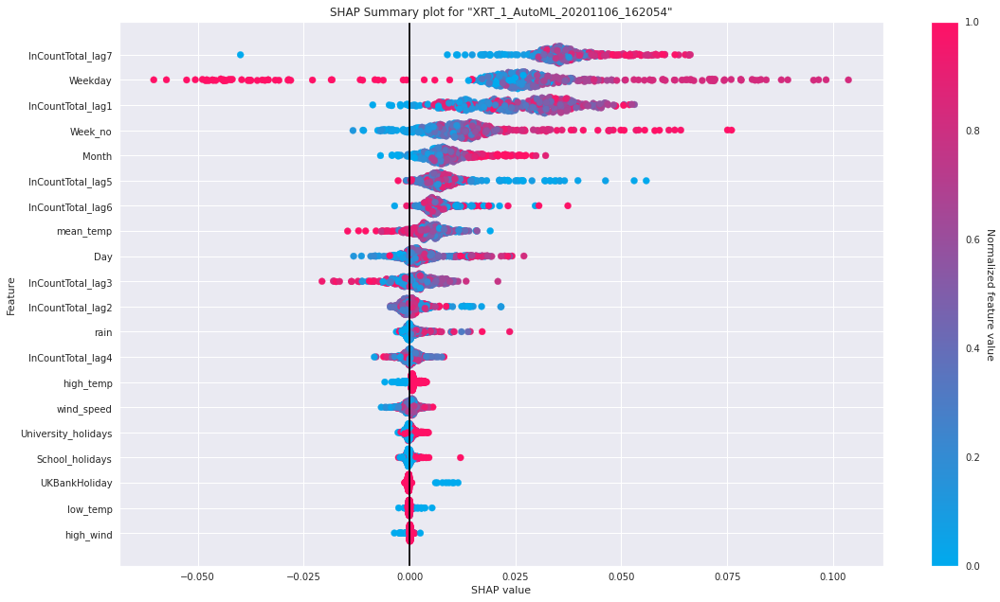

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

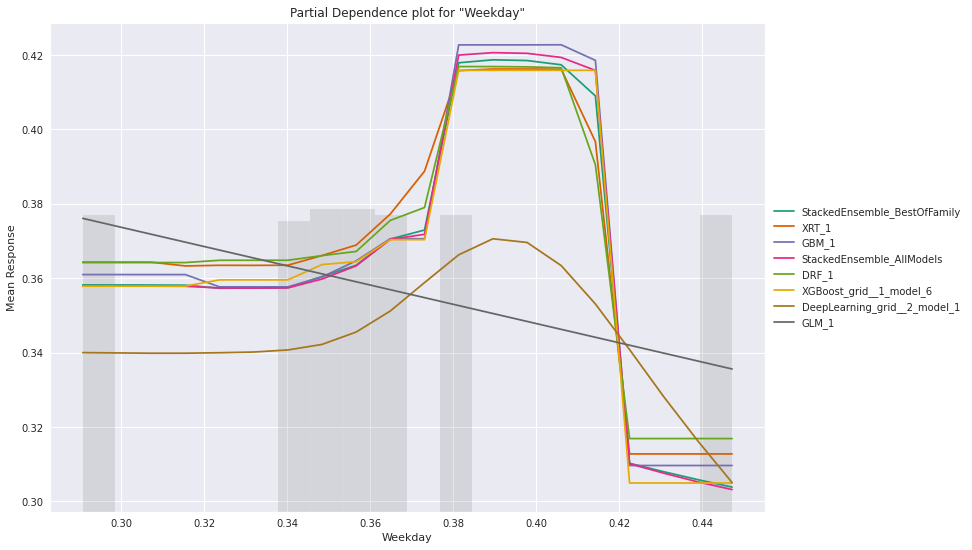

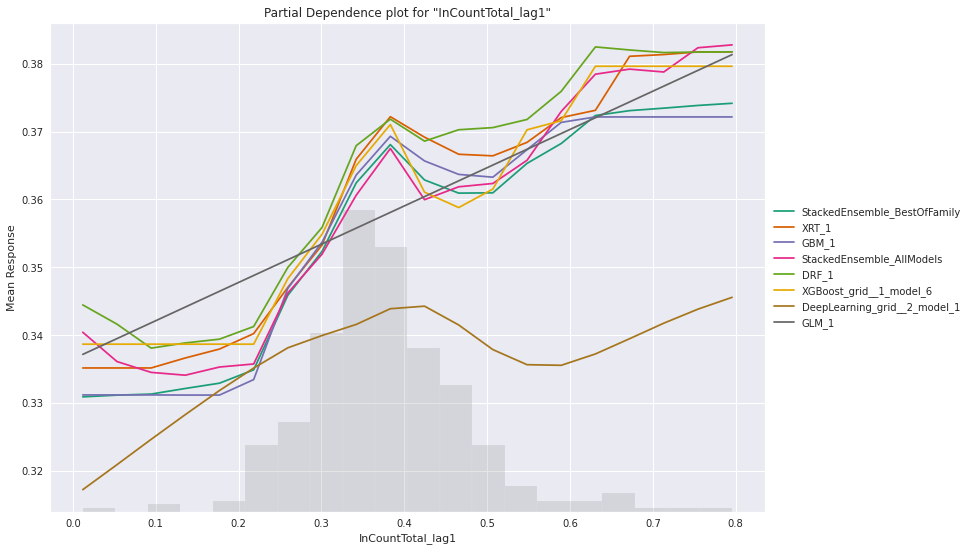

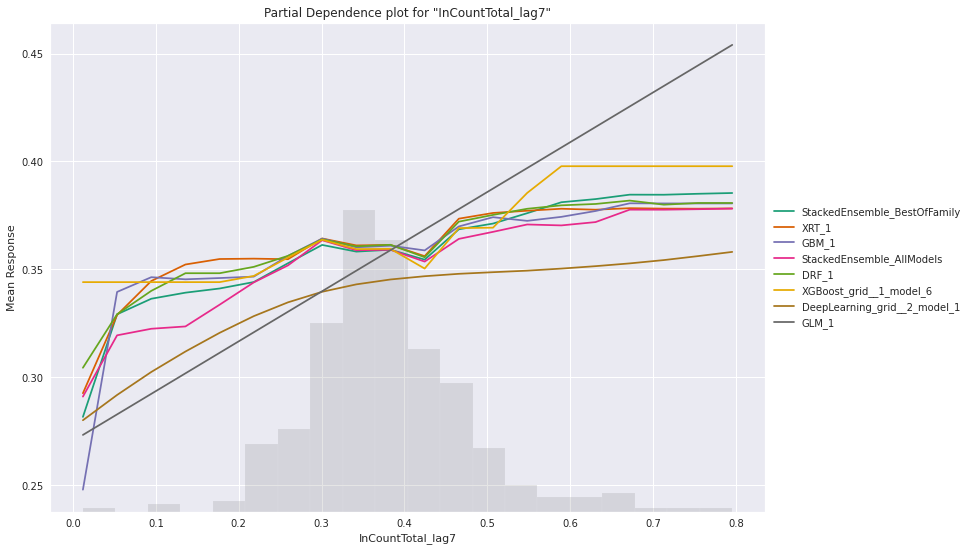

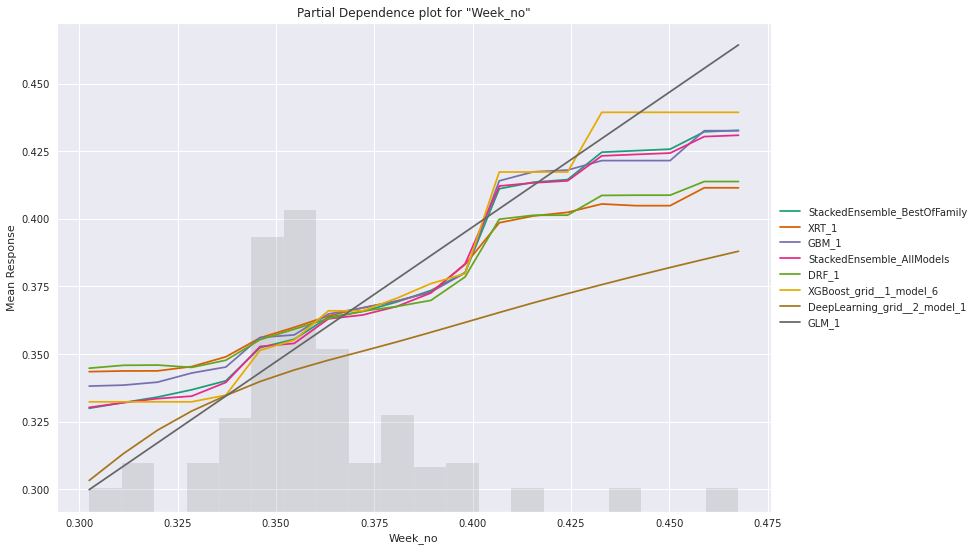

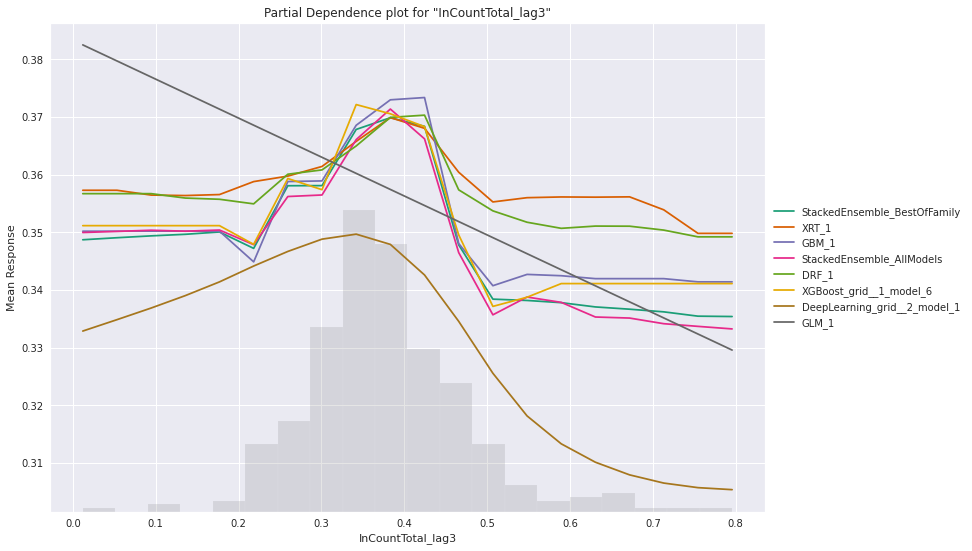

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

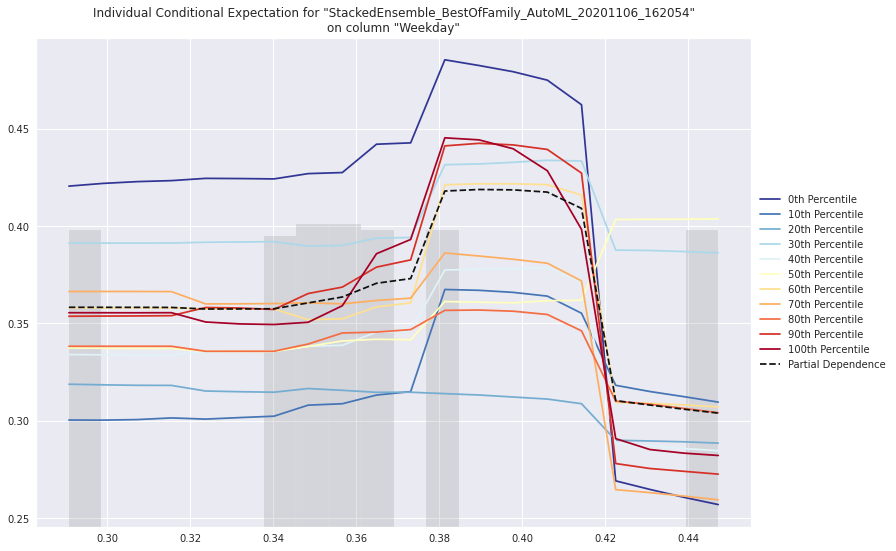

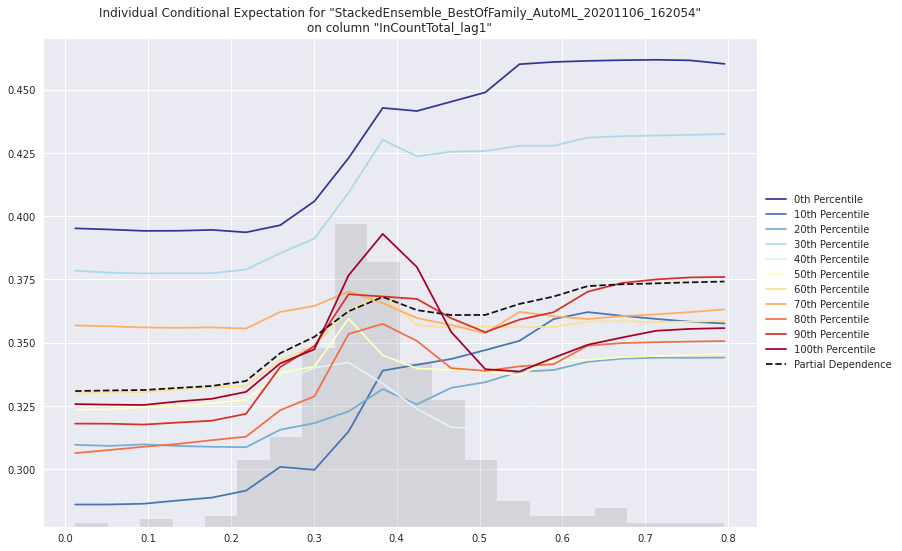

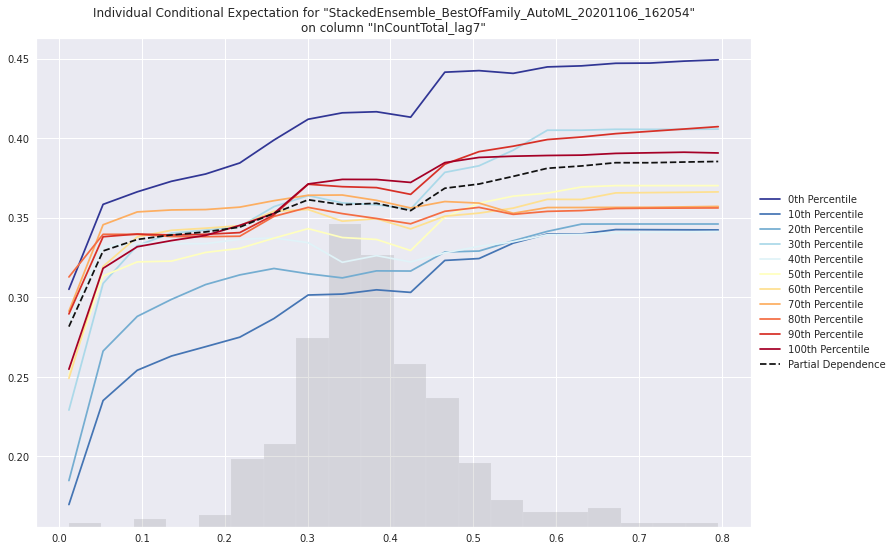

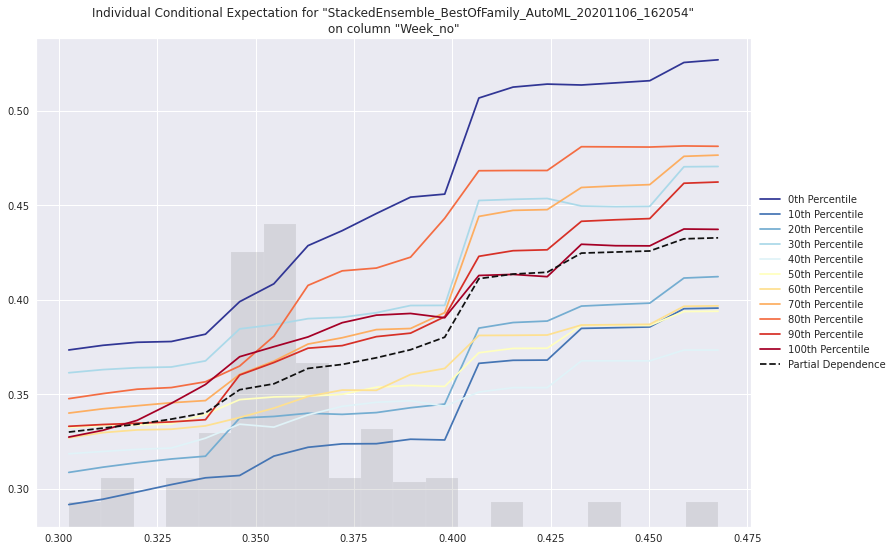

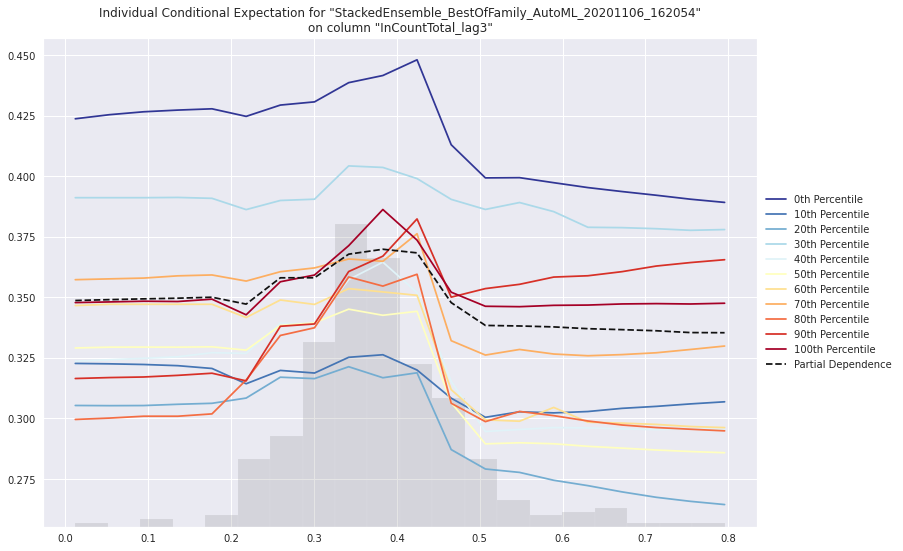



StackedEnsemble_BestOfFamily_AutoML_20201106_162054
stackedensemble prediction progress: |████████████████████████████████████| 100%
XRT_1_AutoML_20201106_162054
drf prediction progress: |████████████████████████████████████████████████| 100%
GBM_1_AutoML_20201106_162054
gbm prediction progress: |████████████████████████████████████████████████| 100%
StackedEnsemble_AllModels_AutoML_20201106_162054
stackedensemble prediction progress: |████████████████████████████████████| 100%
GBM_3_AutoML_20201106_162054
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_2_AutoML_20201106_162054
gbm prediction progress: |████████████████████████████████████████████████| 100%
DRF_1_AutoML_20201106_162054
drf prediction progress: |████████████████████████████████████████████████| 100%
XGBoost_grid__1_AutoML_20201106_162054_model_6
xgboost prediction progress: |████████████████████████████████████████████| 100%
GBM_grid__1_AutoML_20201106_162054_model_4
gbm prediction

In [56]:
auto_ml_model = h2o_model(data_final,dataset_type='Normal')
loss_auto_ml_model = auto_ml_model.autoML(max_models=30,max_runtime_secs=1000)
loss_values_all_models.append(loss_auto_ml_model)

In [57]:
auto_ml_model = h2o_model(data_outliersremoved,dataset_type='Outlier_removed')
loss_auto_ml_model_outlier_removed = auto_ml_model.autoML(max_models=50,max_runtime_secs=1500,explain=False)
loss_values_all_models.append(loss_auto_ml_model_outlier_removed)

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |
16:33:01.900: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
DRF_1_AutoML_20201106_163301,0.0061142,0.0781933,0.0061142,0.0515926,0.0556662
GBM_grid__1_AutoML_20201106_163301_model_2,0.00614945,0.0784184,0.00614945,0.0534407,0.0558647
GBM_1_AutoML_20201106_163301,0.00623816,0.078982,0.00623816,0.0530666,0.0562467
XRT_1_AutoML_20201106_163301,0.00626875,0.0791755,0.00626875,0.0521078,0.0563928
GBM_4_AutoML_20201106_163301,0.00629734,0.0793558,0.00629734,0.0529914,0.0566171
GBM_grid__1_AutoML_20201106_163301_model_7,0.0064248,0.0801548,0.0064248,0.0537065,0.0570518
GBM_2_AutoML_20201106_163301,0.00643732,0.0802329,0.00643732,0.053909,0.0571946
GBM_3_AutoML_20201106_163301,0.00650691,0.0806654,0.00650691,0.0541681,0.0575701
XGBoost_grid__1_AutoML_20201106_163301_model_17,0.00657091,0.0810611,0.00657091,0.0569799,0.0580865
XGBoost_grid__1_AutoML_20201106_163301_model_12,0.00657594,0.0810922,0.00657594,0.0553996,0.057784



Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_1_AutoML_20201106_163301


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,40.0,40.0,403317.0,20.0,20.0,20.0,686.0,870.0,798.125




ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.00548996447388437
RMSE: 0.07409429447592014
MAE: 0.05128463375472664
RMSLE: 0.053784718618778544
Mean Residual Deviance: 0.00548996447388437

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.005484634998383892
RMSE: 0.07405832160118059
MAE: 0.0495651635880794
RMSLE: 0.052933918954058495
Mean Residual Deviance: 0.005484634998383892

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.0053065837953498165
RMSE: 0.07284630255098619
MAE: 0.05012738793354358
RMSLE: 0.053060940689816545
Mean Residual Deviance: 0.0053065837953498165

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.0501285,0.0019925118,0.052091487,0.046861637,0.049873345,0.05110077,0.05071526
1,mean_residual_deviance,0.0053064637,6.793927E-4,0.0064508487,0.0046754577,0.004961496,0.005170642,0.0052738744
2,mse,0.0053064637,6.793927E-4,0.0064508487,0.0046754577,0.004961496,0.005170642,0.0052738744
3,r2,0.3993148,0.024179047,0.3633709,0.40835688,0.41851673,0.41999367,0.38633585
4,residual_deviance,0.0053064637,6.793927E-4,0.0064508487,0.0046754577,0.004961496,0.005170642,0.0052738744
5,rmse,0.0727322,0.0045401994,0.08031718,0.06837732,0.070437886,0.07190718,0.07262144
6,rmsle,0.05298832,0.0030751708,0.058409315,0.05113161,0.05109275,0.052211694,0.052096236



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-11-06 16:33:14,5.645 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,,2020-11-06 16:33:14,5.794 sec,5.0,0.092731,0.064162,0.008599,0.077650,0.054350,0.006029
2,,2020-11-06 16:33:14,5.933 sec,10.0,0.083315,0.058312,0.006941,0.077926,0.052825,0.006072
3,,2020-11-06 16:33:15,6.207 sec,15.0,0.079558,0.055421,0.006329,0.075519,0.051116,0.005703
4,,2020-11-06 16:33:15,6.333 sec,20.0,0.077858,0.054349,0.006062,0.075928,0.051696,0.005765
5,,2020-11-06 16:33:15,6.458 sec,25.0,0.076246,0.053035,0.005813,0.075127,0.051080,0.005644
6,,2020-11-06 16:33:15,6.582 sec,30.0,0.075018,0.052247,0.005628,0.074809,0.050358,0.005596
7,,2020-11-06 16:33:15,6.699 sec,35.0,0.074448,0.051736,0.005543,0.074106,0.049591,0.005492
8,,2020-11-06 16:33:15,6.835 sec,40.0,0.074094,0.051285,0.005490,0.074058,0.049565,0.005485



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Weekday,52.670166,1.000000,0.165306
1,InCountTotal_lag7,32.486542,0.616792,0.101959
2,InCountTotal_lag1,31.593189,0.599831,0.099155
3,Week_no,29.034744,0.551256,0.091126
4,Day,23.509077,0.446345,0.073783
5,InCountTotal_lag6,21.927973,0.416326,0.068821
6,InCountTotal_lag3,20.464031,0.388532,0.064227
7,InCountTotal_lag5,20.212564,0.383757,0.063437
8,InCountTotal_lag2,16.722158,0.317488,0.052483
9,mean_temp,15.836860,0.300680,0.049704



See the whole table with table.as_data_frame()

DRF_1_AutoML_20201106_163301
drf prediction progress: |████████████████████████████████████████████████| 100%
GBM_grid__1_AutoML_20201106_163301_model_2
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_1_AutoML_20201106_163301
gbm prediction progress: |████████████████████████████████████████████████| 100%
XRT_1_AutoML_20201106_163301
drf prediction progress: |████████████████████████████████████████████████| 100%
GBM_4_AutoML_20201106_163301
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_grid__1_AutoML_20201106_163301_model_7
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_2_AutoML_20201106_163301
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_3_AutoML_20201106_163301
gbm prediction progress: |████████████████████████████████████████████████| 100%
XGBoost_grid__1_AutoML_20201106_163301_mode

In [58]:
auto_ml_model = h2o_model(data_final,dataset_type='Normal_full_lag')
loss_auto_ml_model = auto_ml_model.autoML(max_models=30,max_runtime_secs=1000,explain=False,full_lag_data=True)
loss_values_all_models.append(loss_auto_ml_model)

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |
16:51:24.135: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_BestOfFamily_AutoML_20201106_165124,0.00572738,0.0756795,0.00572738,0.0495781,0.0542484
StackedEnsemble_AllModels_AutoML_20201106_165124,0.00585522,0.0765194,0.00585522,0.0505989,0.0549392
GBM_1_AutoML_20201106_165124,0.00592737,0.0769894,0.00592737,0.0515482,0.05513
GBM_grid__1_AutoML_20201106_165124_model_4,0.00595125,0.0771443,0.00595125,0.0517959,0.0554193
DRF_1_AutoML_20201106_165124,0.00609054,0.0780419,0.00609054,0.0523153,0.0560763
GBM_grid__1_AutoML_20201106_165124_model_2,0.0061593,0.0784812,0.0061593,0.0538574,0.0563446
GBM_3_AutoML_20201106_165124,0.00617632,0.0785896,0.00617632,0.0530087,0.0566061
GBM_grid__1_AutoML_20201106_165124_model_3,0.0061993,0.0787356,0.0061993,0.0539225,0.0565372
XGBoost_grid__1_AutoML_20201106_165124_model_7,0.00621573,0.0788399,0.00621573,0.053501,0.0569699
GBM_5_AutoML_20201106_165124,0.00622261,0.0788835,0.00622261,0.05516,0.0567816



Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_AutoML_20201106_165124

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.0004510473065179401
RMSE: 0.021237874340854834
MAE: 0.015698953122640844
RMSLE: 0.01566924526661779
R^2: 0.9506142161811517
Mean Residual Deviance: 0.0004510473065179401
Null degrees of freedom: 1410
Residual degrees of freedom: 1405
Null deviance: 12.88686136543464
Residual deviance: 0.6364277494968135
AIC: -6852.012444988525

ModelMetricsRegressionGLM: stackedensemble
** Reported on validation data. **

MSE: 0.005082789650100271
RMSE: 0.0712936859062587
MAE: 0.04682753311328295
RMSLE: 0.05254144757735619
R^2: 0.42977750705315254
Mean Residual Deviance: 0.005082789650100271
Null degrees of freedom: 343
Residual degrees of freedom: 338
Null deviance: 3.0695892188637877
Residual deviance: 1.7484796396344933
AIC: -826.7421775472221

ModelMetricsRegre

In [59]:
auto_ml_model = h2o_model(data_outliersremoved,dataset_type='Outlier_removed_full_lag')
loss_auto_ml_model = auto_ml_model.autoML(max_models=200,max_runtime_secs=3000,explain=False,full_lag_data=True)
loss_values_all_models.append(loss_auto_ml_model)

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |
17:03:26.194: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
DRF_1_AutoML_20201106_170326,0.00475789,0.0689775,0.00475789,0.0487718,0.0488108
GBM_grid__1_AutoML_20201106_170326_model_15,0.00476597,0.069036,0.00476597,0.0492558,0.0487199
GBM_grid__1_AutoML_20201106_170326_model_4,0.00480147,0.0692927,0.00480147,0.0490451,0.0489801
GBM_grid__1_AutoML_20201106_170326_model_6,0.00486359,0.0697394,0.00486359,0.0498219,0.0492297
GBM_grid__1_AutoML_20201106_170326_model_2,0.00496559,0.070467,0.00496559,0.0499378,0.0498495
XRT_1_AutoML_20201106_170326,0.00500368,0.0707367,0.00500368,0.04944,0.0500263
GBM_1_AutoML_20201106_170326,0.0050132,0.0708039,0.0050132,0.0491697,0.0498738
GBM_4_AutoML_20201106_170326,0.00501477,0.070815,0.00501477,0.0497034,0.0499615
GBM_grid__1_AutoML_20201106_170326_model_9,0.00501988,0.0708511,0.00501988,0.0506695,0.0501595
GBM_grid__1_AutoML_20201106_170326_model_10,0.00504154,0.0710038,0.00504154,0.0493408,0.0500892



Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_1_AutoML_20201106_170326


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,44.0,44.0,417321.0,20.0,20.0,20.0,581.0,846.0,750.75




ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.005032729665977282
RMSE: 0.07094173430342172
MAE: 0.04880954485197734
RMSLE: 0.05115264171573401
Mean Residual Deviance: 0.005032729665977282

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.004153436750397437
RMSE: 0.06444716246971186
MAE: 0.04528960233584128
RMSLE: 0.046517796728673254
Mean Residual Deviance: 0.004153436750397437

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.004930688143039151
RMSE: 0.07021885888448452
MAE: 0.04817839189132794
RMSLE: 0.05065302578791725
Mean Residual Deviance: 0.004930688143039151

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.048177943,0.0024851656,0.04880657,0.047191247,0.04436014,0.05012288,0.050408874
1,mean_residual_deviance,0.00493034,4.934786E-4,0.0054157292,0.0046944143,0.004201629,0.0050340206,0.0053059086
2,mse,0.00493034,4.934786E-4,0.0054157292,0.0046944143,0.004201629,0.0050340206,0.0053059086
3,r2,0.3925403,0.023634965,0.39307824,0.4276967,0.36353657,0.39739826,0.3809918
4,residual_deviance,0.00493034,4.934786E-4,0.0054157292,0.0046944143,0.004201629,0.0050340206,0.0053059086
5,rmse,0.07014398,0.003564088,0.07359164,0.0685158,0.06481998,0.070950836,0.07284167
6,rmsle,0.050615504,0.002153662,0.05186387,0.049515262,0.047377054,0.051650066,0.052671276



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-11-06 17:04:05,24.301 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,,2020-11-06 17:04:06,25.015 sec,5.0,0.088417,0.061860,0.007818,0.071467,0.050379,0.005108
2,,2020-11-06 17:04:06,25.548 sec,10.0,0.079708,0.055268,0.006353,0.067749,0.047892,0.004590
3,,2020-11-06 17:04:07,26.103 sec,15.0,0.076515,0.053215,0.005855,0.067088,0.047158,0.004501
4,,2020-11-06 17:04:07,26.652 sec,20.0,0.074070,0.050916,0.005486,0.065503,0.046106,0.004291
5,,2020-11-06 17:04:08,27.176 sec,25.0,0.072956,0.050248,0.005323,0.064617,0.045596,0.004175
6,,2020-11-06 17:04:08,27.767 sec,30.0,0.071666,0.049588,0.005136,0.064847,0.045690,0.004205
7,,2020-11-06 17:04:09,28.525 sec,35.0,0.071484,0.049328,0.005110,0.064432,0.045304,0.004151
8,,2020-11-06 17:04:10,29.109 sec,40.0,0.071447,0.049207,0.005105,0.064986,0.045692,0.004223
9,,2020-11-06 17:04:10,29.544 sec,44.0,0.070942,0.048810,0.005033,0.064447,0.045290,0.004153



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Weekday_lag5,31.909962,1.000000,0.096449
1,Weekday_lag1,16.971149,0.531845,0.051296
2,InCountTotal_lag1,15.180311,0.475723,0.045883
3,Weekday_lag4,10.350921,0.324379,0.031286
4,Weekday_lag2,8.553967,0.268066,0.025855
5,InCountTotal_lag3,7.449919,0.233467,0.022518
6,InCountTotal_lag6,7.412574,0.232297,0.022405
7,trend_incount_lag6,6.995370,0.219222,0.021144
8,Weekday_lag6,6.978896,0.218706,0.021094
9,Day_lag3,6.915781,0.216728,0.020903



See the whole table with table.as_data_frame()

DRF_1_AutoML_20201106_170326
drf prediction progress: |████████████████████████████████████████████████| 100%
GBM_grid__1_AutoML_20201106_170326_model_15
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_grid__1_AutoML_20201106_170326_model_4
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_grid__1_AutoML_20201106_170326_model_6
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_grid__1_AutoML_20201106_170326_model_2
gbm prediction progress: |████████████████████████████████████████████████| 100%
XRT_1_AutoML_20201106_170326
drf prediction progress: |████████████████████████████████████████████████| 100%
GBM_1_AutoML_20201106_170326
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_4_AutoML_20201106_170326
gbm prediction progress: |████████████████████████████████████████████████| 100%
GBM_grid__1_Au

In [60]:
loss_auto_ml_model.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
15,GBM_grid__1_AutoML_20201106_170326_model_17Outlier_removed_full_lag,12.882867,0.005192,-0.012982,0.049074,-0.000897,0.072054,0.363021,-0.003724,-1654.147851,-1135.461503
6,GBM_1_AutoML_20201106_170326Outlier_removed_full_lag,13.117425,0.005013,-0.008359,0.049170,0.011168,0.070804,0.384931,0.030801,-1666.923618,-1148.237270
9,GBM_grid__1_AutoML_20201106_170326_model_10Outlier_removed_full_lag,13.148596,0.005042,-0.009029,0.049341,0.011172,0.071004,0.381455,0.025322,-1664.866309,-1146.179961
11,GBM_grid__1_AutoML_20201106_170326_model_12Outlier_removed_full_lag,13.149347,0.005080,-0.009254,0.049437,0.008685,0.071277,0.376680,0.017798,-1662.059547,-1143.373199
0,DRF_1_AutoML_20201106_170326Outlier_removed_full_lag,13.165756,0.004758,-0.006683,0.048772,0.016474,0.068977,0.416255,0.080159,-1686.002099,-1167.315751
1,GBM_grid__1_AutoML_20201106_170326_model_15Outlier_removed_full_lag,13.172173,0.004766,-0.007443,0.049256,0.012985,0.069036,0.415264,0.078598,-1685.383018,-1166.696670
7,GBM_4_AutoML_20201106_170326Outlier_removed_full_lag,13.190036,0.005015,-0.010347,0.049703,0.006241,0.070815,0.384739,0.030498,-1666.809564,-1148.123215
2,GBM_grid__1_AutoML_20201106_170326_model_4Outlier_removed_full_lag,13.253541,0.004801,-0.004451,0.049045,0.021761,0.069293,0.410908,0.071733,-1682.673846,-1163.987498
5,XRT_1_AutoML_20201106_170326Outlier_removed_full_lag,13.375835,0.005004,-0.006309,0.049440,0.018393,0.070737,0.386099,0.032640,-1667.617129,-1148.930781
3,GBM_grid__1_AutoML_20201106_170326_model_6Outlier_removed_full_lag,13.402794,0.004864,-0.006570,0.049822,0.016723,0.069739,0.403287,0.059725,-1677.982234,-1159.295886


## 7.5 Model training with FB Prophet

In [61]:
prophet_model = fb_prophet(data_prophet)
loss_prophet = prophet_model.train()
loss_values_all_models.append(loss_prophet)

In [72]:
loss_prophet.head()

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
0,FB prophet Model,37.089353,2.980130e+09,-8577.685309,41135.873264,0.153897,54590.569323,-0.321876,-0.329179,7966.559989,7974.359784


## 7.6 Model training with GAN ( Generative Adversarial Network) model

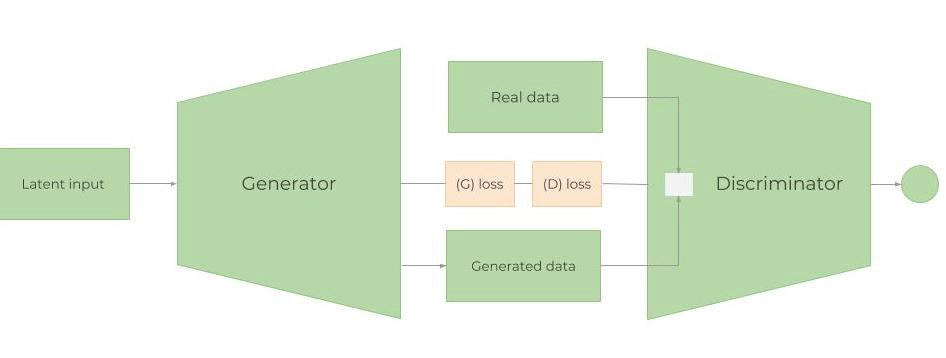

Randomly, real or generated data is fitted into the Discriminator, which acts as a classifier and tries to understand whether the data is coming from the Generator or is the real data. D estimates the (distributions) probabilities of the incoming sample to the real dataset. 

Then, the losses from G and D are combined and propagated back through the generator. Ergo, the generator’s loss depends on both the generator and the discriminator. This is the step that helps the Generator learn about the real data distribution. If the generator doesn’t do a good job at generating a realistic data (having the same distribution), the Discriminator’s work will be very easy to distinguish generated from real data sets. Hence, the Discriminator’s loss will be very small. Small discriminator loss will result in bigger generator loss (see the equation below for L(D,G)). This makes creating the discriminator a bit tricky, because too good of a discriminator will always result in a huge generator loss, making the generator unable to learn. The process goes on until the Discriminator can no longer distinguish generated from real data.

When combined together, D and G as sort of playing a minmax game (the Generator is trying to fool the Discriminator making it increase the probability for on fake examples, i.e. minimize 𝔼z∼pz(z)[log(1−D(G(z)))]. The Discriminator wants to separate the data coming from the Generator, D(G(z)), by maximizing 𝔼x∼pr(x)[logD(x)]. Having separated loss functions, however, it is not clear how both can converge together (that is why we use some advancements over the plain GANs, such as Wasserstein GAN). Overall, the combined loss function looks like:

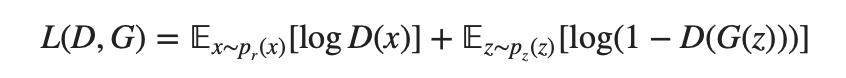

In [67]:
class GAN_Model():
    def __init__(self,  n_timesteps,n_features,latent_dim, learning_rate=0.001  ):        

        self.generator_input_dim = (n_timesteps,n_features)
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.latent_dim = latent_dim
        self.learning_rate = learning_rate
        # Build models
        self._build_generator_model()
        self._build_and_compile_discriminator_model()
        self._build_and_compile_gan()

    def train(self, epochs, X_train, y_train, X_test, y_test,batch_size):

        #noise = np.random.normal(0, 1, (batch_size, self.n_timesteps,self.n_features))
        #noise = np.random.uniform(0,1,size=(batch_size, int(self.n_timesteps*self.n_features)))
        noise = np.random.uniform(0,1,size=(batch_size, self.latent_dim))
        pd.DataFrame(noise).to_csv("GAN_noise_dataset.csv")
      
        generated_dataset  = self.generator_model.predict(noise)
        pd.DataFrame(generated_dataset.reshape((batch_size, int(self.n_timesteps*self.n_features)))).to_csv("GAN_generator_dataset.csv")
        
        #generated_dataset = generated_dataset.reshape((batch_size, self.n_timesteps,self.n_features))
        #fake_target = self._buildFakeTarget(X_train,generated_dataset,y_train)
        fake_target = np.random.uniform(0,1,size=(batch_size))
        pd.DataFrame(fake_target).to_csv("GAN_fake_target.csv")

        
        history = []
        
        discriminator_loss , generator_loss ,curr_val_loss =  0., 0., 1e10 # initialize this to a high value 
        for epoch in range(epochs):
            #  Train Discriminator
            #noise = np.random.uniform(0,1,size=(batch_size, int(self.n_timesteps*self.n_features)))
            #noise = np.random.normal(0, 1, (batch_size, self.n_timesteps,self.n_features))
            noise = np.random.uniform(0,1,size=(batch_size, self.latent_dim))
            generated_dataset  = self.generator_model.predict(noise)
            #generated_dataset = generated_dataset.reshape((batch_size, self.n_timesteps,self.n_features))
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            X_train_batch = X_train[idx]
            y_train_batch = y_train[idx]
            #fake_target = self._buildFakeTarget(X_train,generated_dataset,y_train)
            #self.discriminator_model.trainable = True
            '''if epoch > 0 and generator_loss*.7 > discriminator_loss:
              print('G train loss is {:.3f}, D train loss is {:.3f}. Freezing optimization of D'.format(generator_loss, discriminator_loss))
            else:'''
            loss_real = self.discriminator_model.train_on_batch(X_train_batch, y_train_batch)
            loss_fake = self.discriminator_model.train_on_batch(generated_dataset, fake_target)
            discriminator_loss =  np.add(loss_real, loss_fake)
            #  Train Generator
            noise = np.random.uniform(0,1,size=(batch_size, self.latent_dim))
            '''if epoch > 0 and discriminator_loss*.7 > generator_loss:
              #print('G train loss is {:.3f}, D train loss is {:.3f}. Freezing optimization of G'.format(generator_loss, discriminator_loss))
            else:'''
            generator_loss = self.gan.train_on_batch(noise, y_train_batch)
            
            history.append({"D":discriminator_loss,"G":generator_loss})

            val_loss = self.discriminator_model.test_on_batch(X_test, y_test)
            if val_loss < curr_val_loss:
               self.discriminator_model.save('saved_model_GAN_model16.hdf5')  # creates a HDF5 file 'my_model.h5'
               curr_val_loss = val_loss

            # Save images from every hundereth epoch generated images
            if epoch % 100 == 0:
       
                # Produce images for the GIF as we go
                # Plot the progress every 100th epoch
                print ("---------------------------------------------------------")
                print ("******************Epoch {}***************************".format(epoch))
                print ("loss_real : {}, loss_fake : {}, Discriminator loss: {}, val_loss :{}".format(loss_real,loss_fake, discriminator_loss,val_loss))
                print ("Generator loss: {}".format(generator_loss))
                print ("---------------------------------------------------------")
        
        print("Best val_loss : {}".format(curr_val_loss))     
        self._plot_loss(history)
      
    
    def _build_generator_model(self):
        
        generator_input = Input(shape=(self.latent_dim))

        x = Dense(256)(generator_input)
        x = LeakyReLU(alpha=0.2)(x)
        x = BatchNormalization(momentum=0.8)(x)
        x = Dense(512)(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = BatchNormalization(momentum=0.8)(x)
        x = Dense(1024)(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = BatchNormalization(momentum=0.8)(x)
        x = Dense(units = (int(self.n_timesteps*self.n_features)), activation='relu')(x)
        outputs = Reshape((self.n_timesteps,self.n_features))(x)

        self.generator_model = Model(generator_input, outputs)
        self.generator_model.summary() 


    def _buildFakeTarget(self, real_data, fake_data, real_target, K=5):
      # calculate distance between fake and real data.
      distance = np.zeros((fake_data.shape[0], real_data.shape[0]))
      fake_target = np.zeros((fake_data.shape[0]))
      fake_data_reshaped = np.reshape(fake_data,(fake_data.shape[0],int(self.n_timesteps*self.n_features)))
      real_data_reshaped = np.reshape(real_data,(real_data.shape[0],int(self.n_timesteps*self.n_features)))
      real_target = real_target.reshape(-1)
      for i in range(fake_data_reshaped.shape[0]):
        for j in range(real_data_reshaped.shape[0]):
          distance[i][j] = np.linalg.norm(fake_data_reshaped[i]-real_data_reshaped[j])

      #print(distance[0:3])
      # do weigthed KNN regressor to calculate the fake target values
      for i in range(fake_data_reshaped.shape[0]):
        sum_dist = 0
        # find k nearest real samples for ith fake sample
        idx = np.argpartition(distance[i], K)
        for j in range(K):
          fake_target[i] += distance[i][idx[j]]*real_target[idx[j]]
          sum_dist += distance[i][idx[j]] 
        fake_target[i] = fake_target[i]/sum_dist

      return fake_target.reshape(-1,1)
    
    def _build_and_compile_discriminator_model(self):
    
        discriminator_input = Input(shape=(self.n_timesteps,self.n_features))
        x = LSTM(512, return_sequences=True)(discriminator_input)
        x = Bidirectional(LSTM(512))(x)
        x = Dense(512)(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = Dense(256)(x)
        x = LeakyReLU(alpha=0.2)(x)
        outputs = Dense(1, activation='relu')(x)
        
        self.discriminator_model = Model(discriminator_input, outputs)

        self.discriminator_model.compile(loss = 'mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5))
        self.discriminator_model.summary() 
   

    def _build_and_compile_gan(self, optimizer=None):
       
        # straight-through model
        self.discriminator_model.trainable = False
        self.gan = Sequential()
        self.gan.add(self.generator_model)
        self.gan.add(self.discriminator_model)
        self.gan.compile(loss = 'mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5))

        
    def _plot_loss(self, history):
        hist = pd.DataFrame(history)
        plt.figure(figsize=(20,5))
        for colnm in hist.columns:
            plt.plot(hist[colnm],label=colnm)
        plt.legend()
        plt.ylabel("loss")
        plt.xlabel("epochs")
        plt.show()

In [68]:
# create the LSTM data set with outlier removed data
LSTM_model_dataset = train_test_validation_data_set(data_outliersremoved)
X_train, y_train, _, _, X_test, y_test, _, _, _,n_features = LSTM_model_dataset.prepare_LSTM_datasets(n_timesteps=7, n_forecast_steps = 1, 
                                                          input_cols = global_parameters['input_cols_GAN'], deterministic_features=global_parameters['deterministic_features'], validation=False,shuffle=False)



In [69]:
gan_lstm_model = GAN_Model(7,n_features, 100)



Model: "functional_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
dense_43 (Dense)             (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 256)               1024      
_________________________________________________________________
dense_44 (Dense)             (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 512)             

In [70]:
gan_lstm_model.train(30000,X_train,y_train,X_test, y_test, 100)

---------------------------------------------------------
******************Epoch 0***************************
loss_real : 0.1239621713757515, loss_fake : 0.28513869643211365, Discriminator loss: 0.40910086780786514, val_loss :0.07587463408708572
Generator loss: 0.0366407111287117
---------------------------------------------------------
---------------------------------------------------------
******************Epoch 100***************************
loss_real : 0.00892985425889492, loss_fake : 0.09041878581047058, Discriminator loss: 0.0993486400693655, val_loss :0.008861902169883251
Generator loss: 0.01900244504213333
---------------------------------------------------------
---------------------------------------------------------
******************Epoch 200***************************
loss_real : 0.007086561527103186, loss_fake : 0.07868065685033798, Discriminator loss: 0.08576721837744117, val_loss :0.00874178484082222
Generator loss: 0.026194028556346893
----------------------------

KeyboardInterrupt: ignored

In [83]:
gan_model_trained = load_model('saved_model_GAN_model16.hdf5') 
loss_values = {}
predicts, y_actual, loss_values['GAN Model'] = LSTM_model_train_and_evaluation().predict_model(gan_model_trained, X_test,y_test )
loss_values_df =  model_utility().convert_dict_dataframe(loss_values)

predicts = pd.DataFrame(predicts, columns=['Predicted'])
y_test_df = pd.DataFrame(y_actual, columns=['Actual'])
plot_data_set = pd.concat([predicts,y_test_df], axis=1)
model_utility().plotly_graphs(plot_data_set,"GAN Model")

In [84]:
loss_values_all_models.append(loss_values_df)

## 7.7 Show model results

In [85]:
loss_df = pd.concat([loss_each_model for loss_each_model in loss_values_all_models], axis=0).reset_index(drop=True)


In [86]:
print(tabulate(loss_df, headers="keys", floatfmt=".4f", tablefmt='fancy_grid'))

╒═════╤═══════════════════════════════════════════════════════════════════════════════════╤═════════════════╤══════════════════════╤═══════════════╤══════════════╤══════════════════╤═══════════════╤═════════════════════════╤════════════════╤════════════╤════════════╕
│     │ Model_type                                                                        │            mape │                  mse │            me │          mae │              mpe │          rmse │                R2 score │   Adj R2 score │        AIC │        BIC │
╞═════╪═══════════════════════════════════════════════════════════════════════════════════╪═════════════════╪══════════════════════╪═══════════════╪══════════════╪══════════════════╪═══════════════╪═════════════════════════╪════════════════╪════════════╪════════════╡
│   0 │ linear_regression_normal_shuffled_default_model                                   │         31.5971 │               0.0130 │       -0.0197 │       0.0860 │           0.0903 │        0.1141

In [87]:
n_top = 10
print('best MAPE models \n',tabulate(loss_df.nsmallest(n_top,'mape')[['Model_type','mape']], headers="keys", floatfmt=".4f", tablefmt='fancy_grid'))
print('best MSE models \n',tabulate(loss_df.nsmallest(n_top,'mse')[['Model_type','mse']], headers="keys", floatfmt=".4f", tablefmt='fancy_grid'))
print('best R2 score models \n',tabulate(loss_df.nlargest(n_top,'R2 score')[['Model_type','R2 score']], headers="keys", floatfmt=".4f", tablefmt='fancy_grid'))
print('best Adj R2 score  models \n',tabulate(loss_df.nlargest(n_top,'Adj R2 score')[['Model_type','Adj R2 score']], headers="keys", floatfmt=".4f", tablefmt='fancy_grid'))
print('best AIC models \n',tabulate(loss_df.nsmallest(n_top,'AIC')[['Model_type','AIC']], headers="keys", floatfmt=".4f", tablefmt='fancy_grid'))
print('best BIC models \n',tabulate(loss_df.nsmallest(n_top,'BIC')[['Model_type','BIC']], headers="keys", floatfmt=".4f", tablefmt='fancy_grid'))


best MAPE models 
 ╒═════╤═══════════════════════════════════════════════════════╤═════════╕
│     │ Model_type                                            │    mape │
╞═════╪═══════════════════════════════════════════════════════╪═════════╡
│ 450 │ ensemble_of_ensembles_lstm3                           │ 10.8816 │
├─────┼───────────────────────────────────────────────────────┼─────────┤
│ 445 │ stacked_ensemble_lstm2                                │ 10.8910 │
├─────┼───────────────────────────────────────────────────────┼─────────┤
│ 444 │ stacked_ensemble_lstm1                                │ 10.9024 │
├─────┼───────────────────────────────────────────────────────┼─────────┤
│ 442 │ ensemble_lstm_outlier_removed                         │ 10.9867 │
├─────┼───────────────────────────────────────────────────────┼─────────┤
│ 446 │ stacked_ensemble_lstm3                                │ 10.9928 │
├─────┼───────────────────────────────────────────────────────┼─────────┤
│ 449 │ ensemble_of

In [88]:
loss_df.sort_values('mape').head(25)

,Model_type,mape,mse,me,mae,mpe,rmse,R2 score,Adj R2 score,AIC,BIC
450,ensemble_of_ensembles_lstm3,10.881565,0.003314,-0.008190,0.041015,0.000034,0.057567,0.618135,-0.050130,-933.017662,-487.852361
445,stacked_ensemble_lstm2,10.891049,0.003273,-0.003190,0.040578,0.011875,0.057212,0.622832,-0.037213,-935.616757,-490.451456
444,stacked_ensemble_lstm1,10.902380,0.003348,-0.007735,0.040937,0.002323,0.057858,0.614270,-0.060757,-930.903148,-485.737847
442,ensemble_lstm_outlier_removed,10.986730,0.003331,-0.007378,0.041243,0.003038,0.057713,0.616199,-0.055453,-931.955811,-486.790509
446,stacked_ensemble_lstm3,10.992788,0.003274,-0.003725,0.040974,0.010238,0.057217,0.622765,-0.037395,-935.579831,-490.414529
449,ensemble_of_ensembles_lstm2,11.003166,0.003297,-0.006856,0.041194,0.001643,0.057417,0.620123,-0.044663,-934.113825,-488.948524
448,ensemble_of_ensembles_lstm1,11.036401,0.003289,-0.005891,0.041269,0.003800,0.057346,0.621066,-0.042069,-934.635868,-489.470567
447,stacked_ensemble_lstm4,11.199462,0.003300,-0.000119,0.041117,0.019013,0.057443,0.619783,-0.045596,-933.926211,-488.760910
443,ensemble_lstm_with_auto_encoder,11.441193,0.003490,-0.006453,0.042928,0.009863,0.059078,0.597824,-0.105983,-922.135293,-476.969991
293,random_forest_Outliers_Removed_shuffled_default_model,11.697544,0.004136,-0.013269,0.044251,-0.009544,0.064315,0.481009,0.445163,-1913.193796,-1824.005873


In [89]:
loss_df.sort_values('mape').to_csv("loss_values_all_models.csv")